In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from matplotlib.lines import Line2D
font_label = {
'family': 'serif',
'size': 20
}

font_label_small = {
'family': 'serif',
'size': 16
}

font_label_xsmall = {
'family': 'serif',
'size': 14
}
tick_size = 18
font_legend = {
'family': 'serif',
'size': 16
}

font_legend_small = {
'family': 'serif',
'size': 14
}



font_legend_xmsmall = {
'family': 'serif',
'size': 13
}

font_legend_xsmall = {
'family': 'serif',
'size': 12
}

font_legend_xxsmall = {
'family': 'serif',
'size': 11
}
font_legend_xxxsmall = {
'family': 'serif',
'size': 9.5
}
# 物理常数（CGS）
sigma_T = 6.6524e-25  # Thomson cross-section in cm^2
pc_to_cm = 3.086e18
h   = 6.62607015e-27      # Planck 常数 [erg s]
k_B = 1.380649e-16        # Boltzmann 常数 [erg K^-1]
eV_to_erg = 1.602176634e-12
Ry  = 13.6 * eV_to_erg    # Rydberg 能量 [erg]
zeta = np.exp(0.5772156649)   # e^gamma, Euler 常数
m_p = 1.67357e-24
def smooth_switch_logx(x, x0=1.0, width_dex=0.3):
    """
    Smoothly switch from 1 (x << x0) to 0 (x >> x0) in log10-space.

    Parameters
    ----------
    x : array-like
    x0 : float
    width_dex : float
        Transition width in decades (dex). ~0.3 means ~factor 2 per tanh scale.

    Returns
    -------
    w : array-like in [0,1]
        w ~ 1 for x << x0, w ~ 0 for x >> x0
    """
    x = np.asarray(x, dtype=float)
    x_safe  = np.maximum(x, 1e-300)
    x0_safe = max(float(x0), 1e-300)

    t = (np.log10(x_safe) - np.log10(x0_safe)) / max(float(width_dex), 1e-6)
    # w=1 at small x, w=0 at large x
    w = 0.5 * (1.0 - np.tanh(t))
    return w

def gaunt_ff(nu, T, Z=1.0, clamp_min_1=True, debug=False):
    """
    Robust free-free Gaunt factor g_ff(nu, T, Z) with smooth regime stitching.

    This implementation is designed to avoid unphysical dips (g_ff << 1)
    caused by using small-angle log-approximations outside their validity.

    Parameters
    ----------
    nu : float or array [Hz]
    T  : float or array [K]
    Z  : float or array (ionic charge)
    clamp_min_1 : bool
        If True, enforce g_ff >= 1 everywhere (recommended for GHz/radio usage).
    debug : bool
        If True, prints some diagnostic ranges.

    Returns
    -------
    g_ff : array-like
    """
    nu = np.asarray(nu, dtype=float)
    T  = np.asarray(T,  dtype=float)
    Z  = np.asarray(Z,  dtype=float)

    # broadcast
    nu, T, Z = np.broadcast_arrays(nu, T, Z)

    T_safe = np.maximum(T, 1e-30)
    Z_safe = np.maximum(Z, 1e-30)
    nu_safe = np.maximum(nu, 1e-300)

    u   = h * nu_safe / (k_B * T_safe)           # h nu / kT
    eta = k_B * T_safe / (Z_safe**2 * Ry)        # kT / (Z^2 Ry)

    # ---- small-angle UP branch ----
    # g_UP = (sqrt(3)/pi) ln[ (1/ζ^2) (kT / hν) ]
    arg_UP = (1.0 / (zeta**2)) * (k_B * T_safe / (h * nu_safe))

    # ---- small-angle classical branch ----
    # g_cl = (sqrt(3)/pi) ln[ (1/(2 ζ^(5/2))) (kT/hν) (kT/(Z^2 Ry))^0.5 ]
    arg_cl = (1.0 / (2.0 * zeta**(2.5))) \
             * np.sqrt(k_B * T_safe / (Z_safe**2 * Ry)) \
             * (k_B * T_safe / (h * nu_safe))

    # Key fix:
    # These log-forms are NOT valid when arg < 1 (they would give negative g).
    # In that situation the correct behavior is to transition toward large-angle g~1.
    arg_UP = np.maximum(arg_UP, 1.0)
    arg_cl = np.maximum(arg_cl, 1.0)

    pref = np.sqrt(3.0) / np.pi
    g_UP = pref * np.log(arg_UP)
    g_cl = pref * np.log(arg_cl)

    # large-angle limit
    g_LA = np.ones_like(g_UP)

    # ---- stitch classical vs UP around eta ~ 1 (in log-space) ----
    # eta < 1 => classical; eta > 1 => UP
    w_class = smooth_switch_logx(eta, x0=1.0, width_dex=0.3)   # 1->classical, 0->UP
    g_small = w_class * g_cl + (1.0 - w_class) * g_UP

    # Optional but recommended for your application:
    # small-angle gaunt should not be allowed to dip below 1 in radio regime.
    if clamp_min_1:
        g_small = np.maximum(g_small, 1.0)

    # ---- stitch small-angle vs large-angle around u ~ sqrt(eta) ----
    ratio = u / np.sqrt(np.maximum(eta, 1e-300))   # <1 small-angle, >1 large-angle
    w_small = smooth_switch_logx(ratio, x0=1.0, width_dex=0.3)  # 1->small-angle, 0->large-angle

    g_tot = w_small * g_small + (1.0 - w_small) * g_LA

    if clamp_min_1:
        g_tot = np.maximum(g_tot, 1.0)

    if debug:
        print(f"[gaunt_ff] u range:   {u.min():.3e} .. {u.max():.3e}")
        print(f"[gaunt_ff] eta range: {eta.min():.3e} .. {eta.max():.3e}")
        print(f"[gaunt_ff] g range:   {g_tot.min():.3e} .. {g_tot.max():.3e}")

    return g_tot


def compute_tau_ff(r_pc, T_e, n_e, Z2n_i= None, Z_avg = None, Z2n_gff=None, nu=1e9, gff_list = None):
    """
    r_pc   : 半径数组 [pc]
    T_e    : 电子温度 [K]，与 r_pc 同长
    n_e    : 电子数密度 [cm^-3]
    Z2n_i  : Σ_{i,j} n_ij Z_ij^2 [cm^-3] （已经在半径点上）
    Z2n_gff : Σ_{i,j} n_ij Z_ij^2 g_ff_ij [cm^-3] （已经在半径点上）
    nu     : 频率 [Hz]
    返回: 该时刻对该频率的总 τ_ff
    """
    r_cm   = r_pc * pc_to_cm
    dr     = np.diff(r_cm)
    # mid-point quantities
    T_mid   = 0.5 * (T_e[:-1]   + T_e[1:])
    n_e_mid = 0.5 * (n_e[:-1]   + n_e[1:])

    # --- CASE 1: 使用 Σ n_ij Z_ij^2 ---
    if Z2n_gff is None:
        if gff_list is None:
            Z2n_mid = 0.5*(Z2n_i[:-1] + Z2n_i[1:])
            Z_avg_mid = 0.5*(Z_avg[:-1] + Z_avg[1:])

            g_ff_mid = gaunt_ff(nu, T_mid, Z_avg_mid)

            alpha_ff_mid = 1.9e-2 * T_mid**(-1.5) * n_e_mid * Z2n_mid * nu**(-2) * g_ff_mid
        else:
            g_ff_mid = 0.5*(gff_list[:-1] + gff_list[1:])
            Z2n_mid = 0.5*(Z2n_i[:-1] + Z2n_i[1:])
            Z_avg_mid = 0.5*(Z_avg[:-1] + Z_avg[1:])
            alpha_ff_mid = 1.9e-2 * T_mid**(-1.5) * n_e_mid * Z2n_mid * nu**(-2) * g_ff_mid

    # --- CASE 2: 直接使用 Σ n_ij Z_ij^2 g_ff ---
    else:
        Z2n_gff_mid = 0.5*(Z2n_gff[:-1] + Z2n_gff[1:])
        alpha_ff_mid = 1.9e-2 * T_mid**(-1.5) * n_e_mid * nu**(-2) * Z2n_gff_mid

    return np.sum(alpha_ff_mid * dr)


def generate_with_last_extra(start, end_uniform, end_final, dt):
    """
    生成一个数组：从 start 到 end_uniform 之间为等差序列（步长 dt），
    然后仅在末尾追加一个 end_final（非均匀步长）。
    
    参数:
        start: 序列起点
        end_uniform: 均匀步长部分的终点
        end_final: 最终追加的非均匀点
        dt: 前半段等差步长
    
    返回:
        numpy array
    """
    # 前段均匀序列
    t = np.arange(start, end_uniform + dt, dt)
    
    # 如果最后一个点等于 end_final，就不重复追加
    if abs(t[-1] - end_final) > 1e-12:
        t = np.append(t, end_final)
    
    return t

# 通用参数
base_dir = "/root/jupyter_notebook/user_work/Data/SNR_work"
elem_cols = {
    "H": 14, "He": 15, "Li": 16, "Be": 17, "B": 18, "C": 19, "N": 20, "O": 21,
    "F": 22, "Ne": 23, "Na": 24, "Mg": 25, "Al": 26, "Si": 27, "P": 28,
    "S": 29, "Cl": 30, "Ar": 31, "K": 32, "Ca": 33, "Sc": 34, "Ti": 35,
    "V": 36, "Cr": 37, "Mn": 38, "Fe": 39, "Co": 40, "Ni": 41, "Cu": 42, "Zn": 43,
}

atomic_A = {
    "H": 1, "He": 4, "Li": 7, "Be": 9, "B": 11, "C": 12, "N": 14, "O": 16,
    "F": 19, "Ne": 20, "Na": 23, "Mg": 24, "Al": 27, "Si": 28, "P": 31,
    "S": 32, "Cl": 35.5, "Ar": 40, "K": 39, "Ca": 40, "Sc": 45, "Ti": 48,
    "V": 51, "Cr": 52, "Mn": 55, "Fe": 56, "Co": 59, "Ni": 58.7, "Cu": 63.5, "Zn": 65.4,
}
elements = list(elem_cols.keys())
atomic_Z = {el: i + 1 for i, el in enumerate(elem_cols)}
xion_start = 44
ion_start = 14

def species_offset(el):
    Z = atomic_Z[el]
    return (Z - 1) * (Z + 2) // 2

def get_ion_column(el, charge):
    Z = atomic_Z[el]
    if charge < 0 or charge > Z:
        return None
    return xion_start + species_offset(el) + charge

def read_snr_dataset(mass, model, nu = 1e9, is_shock = 1, is_unshock = 0, is_all = 0, is_particle = True):

    mass = str(mass)
    if (is_shock or is_unshock or is_all) and is_particle:
        result = {
            "time": [], "dm": [], "tau_T": [], "tau_ff": [],  "tau_ff_new": [], "ion_abundaces":[],
            "radius_profiles": [], "ne_profiles": [], "ion_blocks": [], "n_p_profiles": [],
            "density_profiles": [], "velocity_profiles": [], "Te": [], "Tp":[],
            "hhe_profiles": [],  "LiZn_profiles": [],  "ion_tot_profiles": [],
            "Z_avg_profiles":[], "Z2n_profiles": [], "Z2n_gff_profiles":[],
            "sum_gff_profiles":[], "gff_avg_profiles": [], "gff_profiles": [], 
            "dm_full":[], "r_b":[],"r_c":[], "r_r":[], "mass":[], "mu_a_profiles": [],
            "mu_e_profiles": [], "mu_m_profiles": []
        }
        folder = f"far_{model}_{mass}_detail/hdoutput"
        data_dir = os.path.join(base_dir, mass, folder)
        if is_shock:
            prefix = f"far_{model}_{mass}_detail_prof_a_"
        elif is_unshock:
            prefix = f"far_{model}_{mass}_detail_prof_u_"
        else:
            prefix = f"far_{model}_{mass}_detail_prof_all_"

        if not os.path.exists(data_dir):
            return result

        def _has_numeric_suffix_with_prefix(fname, pfx, allow_prof=False):
            if not fname.startswith(pfx) or not fname.endswith(".dat"):
                return False
            if (not allow_prof) and "_prof_" in fname:
                return False
            stem = fname[:-4]
            parts = stem.split("_")
            return parts and parts[-1].isdigit()

        files = sorted([f for f in os.listdir(data_dir)
                        if _has_numeric_suffix_with_prefix(f, prefix, allow_prof=True)])
        status = "shock" if is_shock else ("unshock" if is_unshock else "csm")

        for fname in tqdm(
            files,
            desc=f"read {model} {mass} {status}:"
            ):
            path = os.path.join(data_dir, fname)
            try:
                data = np.loadtxt(path)
                if data.ndim == 1:
                    data = data.reshape(1, -1)
                time    = data[0, 1]   # yr
                radius  = data[:, 2]   # cm
                mass    = data[:, 4]   #g
                density = data[:, 6]   # g/cm^3
                vel     = data[:, 8]
                te      = data[:, 9]
                tp      = data[:, 10]
                ne      = data[:, 11]
                n_p     = data[:, 12]
                full_ne = density/m_p

                dr = np.gradient(radius)
                particle_num = data[:, 0]
                r_c_idx = np.where(particle_num == 500)[0]
                r_r = data[0, 2]/pc_to_cm
                r_c = data[r_c_idx, 2]/pc_to_cm
                r_b = data[-1, 2]/pc_to_cm

                dm = np.sum(ne * dr) / pc_to_cm  # pc cm^-3
                dm_full = np.sum(full_ne * dr) / pc_to_cm  # pc cm^-3
                tau_T = np.sum(ne * dr) * sigma_T
                tau_T_full = np.sum(full_ne * dr)* sigma_T

                # ----- 1. 各元素总数密度 n_element_i -----
                n_elem = {}
                for el, col in elem_cols.items():
                    x_i = data[:, col]            # log abundance
                    n_elem[el] = n_p * 10.0**(x_i - 12.0)

                # 离子分组：H+He
                #hhe = data[:, elem_cols["H"]] + data[:, elem_cols["He"]]
                #_H  = n_p * 10**(data[:, elem_cols["H"]] - 12.0)
                #n_He = n_p * 10**(data[:, elem_cols["He"]]- 12.0)
                #hhe = n_H + n_He
                # Li–Zn 组（含到 Zn，可按需调整）
                #n_LiZn_ion = 0
                #for k in ["Li","Be", "B", "C","N","O","F","Ne","Na","Mg","Al","Si","P","S","Cl","Ar","K","Ca","Sc","Ti","V","Cr","Mn","Fe", "Co", "Ni", "Cu", "Zn"]:
                #    n_LiZn_ion += n_p * 10**(data[:, elem_cols[k]] - 12.0)
                #ion_tot = hhe + n_LiZn_ion
                # --- 读入元素 abundance x_i 和离子分布 y_ij ---
                #ion_abund = data[:, ion_start:ion_start+len(elements)]       # shape (N,30)
                ion_block = data[:, xion_start:xion_start+495]               # shape (N,495)
                # --- 利用 y_ij 计算 n_ij, <Z>(r), Σ n_ij Z^2(r) ---
                denom_n  = np.zeros_like(n_p)   # Σ_{i,j} n_ij
                num_Z    = np.zeros_like(n_p)   # Σ_{i,j} n_ij Z_ij
                sum_Z2n  = np.zeros_like(n_p)   # Σ_{i,j} n_ij Z_ij^2
                sum_Z2n_gff =  np.zeros_like(n_p)
                sum_gff =  np.zeros_like(n_p)
                n_LiZn_ion = 0
                for el in elements:
                    Z_el = atomic_Z[el]
                    start = species_offset(el)
                    y_ij = ion_block[:, start:start + Z_el + 1]   # (N_shell, Z_el+1)
                    charges = np.arange(0, Z_el+1)[None, :]       # (1, Z_el+1)
                    n_el = n_elem[el][:, None]                    # (N_shell, 1)
                    n_ij = n_el * y_ij                            # (N_shell, Z_el+1)


                    # 只保留 j >= 1 的离子态
                    charges_ion = charges[:, 1:]        # 1 ... Z
                    n_ij_ion    = n_ij[:, 1:]           # 对应的 number density
                    Z_ij = np.tile(charges_ion, (len(te), 1))        # (N_shell, Z_el)
                    g_ff_ij = gaunt_ff(nu, te[:,None], Z_ij)
                    denom_n += np.sum(n_ij_ion, axis=1)
                    num_Z   += np.sum(n_ij_ion * charges_ion,      axis=1)
                    sum_Z2n += np.sum(n_ij_ion * charges_ion**2.0, axis=1)
                    sum_Z2n_gff += np.sum(n_ij_ion * charges_ion**2.0*g_ff_ij, axis=1)
                    sum_gff += np.sum(g_ff_ij, axis=1)
                    # sum over j>=1
                    n_el_ion = np.sum(n_ij_ion, axis=1)  # (N_shell,)
                    # ----- 分三类存储 -----
                    if el == "H":
                        n_H = n_el_ion
                    elif el == "He":
                        n_He = n_el_ion
                    else:
                        # 属于 Li–Zn
                        if el in ["Li","Be","B","C","N","O","F","Ne","Na","Mg","Al","Si","P","S",
                                "Cl","Ar","K","Ca","Sc","Ti","V","Cr","Mn","Fe","Co","Ni","Cu","Zn"]:
                            n_LiZn_ion += n_el_ion
                hhe = n_H + n_He
                ion_tot = n_H + n_He + n_LiZn_ion
                Z_avg = np.zeros_like(num_Z)
                mask  = denom_n > 0
                Z_avg[mask] = num_Z[mask] / denom_n[mask]
                # --- τ_ff（真正用 Σ n_ij Z^2）---
                r_pc   = radius / pc_to_cm
                tau_ff = compute_tau_ff(r_pc, te, ne, sum_Z2n, Z_avg)
                tau_ff_new = compute_tau_ff(r_pc, te, ne, Z2n_gff = sum_Z2n_gff)
                
                # num_Z == Σ n_ij Z_ij = electron density from ionization
                n_ion = denom_n.copy()
                n_e_ion = num_Z.copy()

                mu_e = np.full_like(n_e_ion, np.nan, dtype=float)
                mu_m = np.full_like(n_ion, np.nan, dtype=float)

                mask_e = n_e_ion > 0
                mu_e[mask_e] = density[mask_e] / (n_e_ion[mask_e] * m_p)

                mask_m = (n_ion + n_e_ion) > 0
                mu_m[mask_m] = density[mask_m] / ((n_ion[mask_m] + n_e_ion[mask_m]) * m_p)

                n_tot = np.zeros_like(n_p)
                mass_tot = np.zeros_like(n_p)
                for el, n_el in n_elem.items():
                    A = atomic_A.get(el, atomic_Z[el])
                    n_tot += n_el
                    mass_tot += n_el * A

                mu_a = np.zeros_like(n_tot)
                mask_mu = n_tot > 0
                mu_a[mask_mu] = mass_tot[mask_mu] / n_tot[mask_mu]
                result["time"].append(time)
                result["dm"].append(dm)
                #result["dm_UL"].append(dm_full)
                result["tau_T"].append(tau_T)
                result["tau_ff"].append(tau_ff)
                result["tau_ff_new"].append(tau_ff_new)
                result["radius_profiles"].append(r_pc)
                result["ne_profiles"].append(ne)
                result["ion_tot_profiles"].append(ion_tot)
                result["ion_abundaces"].append(data[:, ion_start:ion_start+30])
                result["ion_blocks"].append(data[:, xion_start:xion_start+495])
                result["n_p_profiles"].append(n_p)
                result["density_profiles"].append(density)
                result["velocity_profiles"].append(vel)
                result["mass"].append(mass)
                result["Te"].append(te)
                result["Tp"].append(tp)
                result["hhe_profiles"].append(hhe)
                result["LiZn_profiles"].append(n_LiZn_ion)
                result["Z_avg_profiles"].append(Z_avg)
                result["Z2n_profiles"].append(sum_Z2n)
                result["Z2n_gff_profiles"].append(sum_Z2n_gff)
                result["sum_gff_profiles"].append(sum_gff)
                result["gff_avg_profiles"].append(sum_gff/465)
                result["r_b"].append(r_b)
                result["r_c"].append(r_c)
                result["r_r"].append(r_r)
                result["mu_a_profiles"].append(mu_a)
                result["mu_e_profiles"].append(mu_e)
                result["mu_m_profiles"].append(mu_m)

            except Exception as e:
                print(f"Error reading {path}: {e}")
        for k in ["time", "dm", "tau_T", "tau_ff", "tau_ff_new", "dm_full", "r_r", "r_c", "r_b"]:
            result[k] = np.array(result[k])
    elif not is_particle:
        result = {
            "time": [], "dm_UL": [], "tau_T_UL": [], "tau_ff_UL": [],
            "radius_profiles": [], "ne_UL_profiles": [],
            "density_profiles": [], "velocity_profiles": [], "T_mean": [],
        }
        #time_0 = 3
        #dyear_1 = 1
        #dyear_2 = 4
        #time = time_0
        folder = f"far_{model}_{mass}_detail/hdoutput"
        data_dir = os.path.join(base_dir, mass, folder)
        prefix = f"far_{model}_{mass}_detail_"
        time_prefix = f"far_{model}_{mass}_detail_prof_a_"

        if not os.path.exists(data_dir):
            return result

        def _has_numeric_suffix_with_prefix(fname, pfx, allow_prof=False):
            if not fname.startswith(pfx) or not fname.endswith(".dat"):
                return False
            if (not allow_prof) and "_prof_" in fname:
                return False
            stem = fname[:-4]
            parts = stem.split("_")
            return parts and parts[-1].isdigit()

        files = sorted([f for f in os.listdir(data_dir)
                        if _has_numeric_suffix_with_prefix(f, prefix, allow_prof=False)])
        time_files = sorted([f for f in os.listdir(data_dir)
                             if _has_numeric_suffix_with_prefix(f, time_prefix, allow_prof=True)])
        if model == "single":
            mu_e = 1.18
        else:
            mu_e = 2
        #if i == 1:
        #    time_range = generate_with_last_extra(3, 301, 301.143, 1)
        #elif i == 2:
        #    time_range = np.linspace(303, 504, 504.186, 4)
        for fname, time_fname in tqdm(list(zip(files, time_files)), desc=f"read {model} {mass} full"):
            path = os.path.join(data_dir, fname)
            time_path = os.path.join(data_dir, time_fname)

            try:
                data = np.loadtxt(path)
                if data.ndim == 1:
                    data = data.reshape(1, -1)
                time_data = np.loadtxt(time_path)
                if time_data.ndim == 1:
                    time_data = time_data.reshape(1, -1)
                #if time < time_0 + 300:
                #    dyear = dyear_1
                #else:
                #    dyear = dyear_2
                time    = time_data[0, 1]   # yr
                radius  = data[:, 1]   # cm
                density = data[:, 2]   # g/cm^3
                vel     = data[:, 3]
                T_mean  = data[:, 4]
                ne_UL = density/(mu_e*m_p)
                dr = np.gradient(radius)
                r_pc   = radius / pc_to_cm
                dm_UL = np.sum(ne_UL * dr) / pc_to_cm  # pc cm^-3
                tau_T_UL = np.sum(ne_UL * dr)* sigma_T
                Z_avg = np.ones_like(ne_UL)
                tau_ff_UL = compute_tau_ff(r_pc, T_mean, ne_UL, ne_UL, Z_avg)
                result["radius_profiles"].append(r_pc)
                result["time"].append(time)
                #result["dm"].append(dm)
                result["dm_UL"].append(dm_UL)
                result["tau_T_UL"].append(tau_T_UL)
                result["ne_UL_profiles"].append(ne_UL)
                result["T_mean"].append(T_mean)
                result["density_profiles"].append(density)
                result["velocity_profiles"].append(vel)
                result["tau_ff_UL"].append(tau_ff_UL)
            except Exception as e:
                print(f"Error reading {path}: {e}")
        for k in ["time", "dm_UL", "tau_T_UL", "tau_ff_UL"]:
            result[k] = np.array(result[k])
    return result

# === 批量读取数据 ===
#masses = [11, 30]
masses = [11, 30]
#all_results_sh = {}
#all_results_unsh = {}
#all_results_CSM = {}
#all_results_UL = {}
#for m in masses:
    #all_results_sh[f"{m}_binary"] = read_snr_dataset(m, "binary", is_shock=1, is_particle=True)
    #all_results_sh[f"{m}_single"] = read_snr_dataset(m, "single", is_shock=1, is_particle=True)
    #all_results_unsh[f"{m}_binary"] = read_snr_dataset(m, "binary", is_shock=0, is_unshock = 1, is_particle=True)
    #all_results_unsh[f"{m}_single"] = read_snr_dataset(m, "single", is_shock=0, is_unshock = 1, is_particle=True)
    #all_results_CSM[f"{m}_binary"] = read_snr_dataset(m, "binary", is_shock=0, is_unshock = 0, is_all=1, is_particle=True)
    #all_results_CSM[f"{m}_single"] = read_snr_dataset(m, "single", is_shock=0, is_unshock = 0, is_all=1, is_particle=True)
    #all_results_UL[f"{m}_binary"] = read_snr_dataset(m, "binary", is_particle = False)
    #all_results_UL[f"{m}_single"] = read_snr_dataset(m, "single", is_particle = False)

#all_results[f"11_binary_all"] = read_snr_dataset(11, "binary", is_shock=0, is_particle=True)

In [ ]:
##### for model in ("binary", "single"):
    key = f"{11}_{model}"
    all_results_UL[key] = get_or_compute_result_splitfile(
        "UL", key,
        CACHE_FILES=CACHE_FILES,
        compute_fn=lambda m=m, model=model:
            read_snr_dataset(11, model, is_shock=0, is_all=1, is_particle=False),
        current_result=all_results_UL.get(key),
        USE_CACHE=USE_CACHE,
        UPDATE=UPDATE,
        Only_Write=Only_Write,
        compression="gzip"
    )

# Save Data


In [3]:
import os
import numpy as np
import h5py
import matplotlib.pyplot as plt
from tqdm import tqdm
from matplotlib.lines import Line2D
# ---------------------------
# Ragged pack/unpack helpers
# ---------------------------
def _pack_ragged_1d(list_arr, dtype=np.float64):
    n = len(list_arr)
    indptr = np.zeros(n + 1, dtype=np.int64)
    flats = []
    total = 0
    for i, a in enumerate(list_arr):
        a = np.asarray(a, dtype=dtype).ravel()
        total += a.size
        indptr[i + 1] = total
        flats.append(a)
    data = np.concatenate(flats) if total > 0 else np.asarray([], dtype=dtype)
    return data, indptr

def _pack_ragged_2d(list_arr, dtype=np.float64):
    n = len(list_arr)
    indptr = np.zeros(n + 1, dtype=np.int64)
    nrow = np.zeros(n, dtype=np.int64)
    ncol = np.zeros(n, dtype=np.int64)
    flats = []
    total = 0
    for i, a in enumerate(list_arr):
        a = np.asarray(a, dtype=dtype)
        if a.ndim != 2:
            raise ValueError(f"Expected 2D array at index {i}, got ndim={a.ndim}")
        nr, nc = a.shape
        nrow[i], ncol[i] = nr, nc
        af = a.reshape(-1)
        total += af.size
        indptr[i + 1] = total
        flats.append(af)
    data = np.concatenate(flats) if total > 0 else np.asarray([], dtype=dtype)
    return data, indptr, nrow, ncol

def _write_1d(g, name, arr, compression="gzip"):
    arr = np.asarray(arr)
    g.create_dataset(name, data=arr, compression=compression, shuffle=True, fletcher32=True)

def _write_ragged_1d(g, name, list_arr, dtype=np.float64, compression="gzip"):
    data, indptr = _pack_ragged_1d(list_arr, dtype=dtype)
    gg = g.create_group(name)
    gg.create_dataset("data", data=data, compression=compression, shuffle=True, fletcher32=True)
    gg.create_dataset("indptr", data=indptr, compression=None)
    gg.attrs["kind"] = "ragged_1d"

def _write_ragged_2d(g, name, list_arr, dtype=np.float64, compression="gzip"):
    data, indptr, nrow, ncol = _pack_ragged_2d(list_arr, dtype=dtype)
    gg = g.create_group(name)
    gg.create_dataset("data", data=data, compression=compression, shuffle=True, fletcher32=True)
    gg.create_dataset("indptr", data=indptr, compression=None)
    gg.create_dataset("nrow", data=nrow, compression=None)
    gg.create_dataset("ncol", data=ncol, compression=None)
    gg.attrs["kind"] = "ragged_2d"

# ---------------------------
# 你 result dict 的写入函数：单个 result -> 一个 group
# ---------------------------
def save_one_result_to_hdf5(h5group, result, compression="gzip"):
    # 1) 标量序列（np.array 1D）
    scalar_1d_keys = [
        "time", "dm", "tau_T", "tau_ff", "tau_ff_new", "dm_full",
        "r_r", "r_c", "r_b",
        # UL extras
        "dm_UL", "tau_UL", "tau_ff_UL", "T_mean"
    ]
    for k in scalar_1d_keys:
        if k in result and isinstance(result[k], np.ndarray) and result[k].ndim == 1 and result[k].size > 0:
            _write_1d(h5group, k, result[k], compression=compression)

    # 2) 变长 1D profiles（list of 1D arrays）
    ragged_1d_keys = [
        "radius_profiles", "ne_profiles", "n_p_profiles",
        "density_profiles", "velocity_profiles", "Te", "Tp",
        "hhe_profiles", "LiZn_profiles", "ion_tot_profiles",
        "Z_avg_profiles", "Z2n_profiles", "Z2n_gff_profiles",
        "sum_gff_profiles", "gff_avg_profiles", "mu_a_profiles",
        "mu_e_profiles", "mu_m_profiles",
        # UL extras
        "ne_UL_profiles"
    ]
    for k in ragged_1d_keys:
        if k in result and isinstance(result[k], list) and len(result[k]) > 0:
            _write_ragged_1d(h5group, k, result[k], dtype=np.float64, compression=compression)

    # 3) 变长 2D blocks（list of 2D arrays）
    ragged_2d_keys = ["ion_abundaces", "ion_blocks"]
    for k in ragged_2d_keys:
        if k in result and isinstance(result[k], list) and len(result[k]) > 0:
            _write_ragged_2d(h5group, k, result[k], dtype=np.float64, compression=compression)

    h5group.attrs["format_version"] = "snr_result_v1"
    h5group.attrs["n_times"] = int(len(result.get("time", [])))


# ---------------------------
# 读取：单个 group -> result dict（恢复成原来的 list/np.array 结构）
# ---------------------------
def _read_ragged_1d(group):
    data = group["data"][()]
    indptr = group["indptr"][()]
    return [data[indptr[i]:indptr[i+1]] for i in range(len(indptr)-1)]

def _read_ragged_2d(group):
    data = group["data"][()]
    indptr = group["indptr"][()]
    nrow = group["nrow"][()]
    ncol = group["ncol"][()]
    out = []
    for i in range(len(indptr)-1):
        flat = data[indptr[i]:indptr[i+1]]
        out.append(flat.reshape(int(nrow[i]), int(ncol[i])))
    return out

def load_one_result_from_hdf5(h5group):
    result = {}
    # datasets
    for k, obj in h5group.items():
        if isinstance(obj, h5py.Dataset):
            result[k] = obj[()]
    # ragged groups
    for k, obj in h5group.items():
        if isinstance(obj, h5py.Group) and "kind" in obj.attrs:
            if obj.attrs["kind"] == "ragged_1d":
                result[k] = _read_ragged_1d(obj)
            elif obj.attrs["kind"] == "ragged_2d":
                result[k] = _read_ragged_2d(obj)
    return result

# ---------------------------
# 覆盖写入：先删旧再写新
# ---------------------------
def overwrite_group(parent, name, writer_fn):
    if name in parent:
        del parent[name]
    g = parent.create_group(name)
    writer_fn(g)
    return g


#  Write and Read Data

In [4]:
import warnings
import os
import numpy as np
import h5py

H5_PATH = "/root/jupyter_notebook/user_work/Data/SNR_work/"
DEFAULT_CACHE_FILES = {
    "shock":  H5_PATH + "SNR_results_sh.h5",
    "unshock":H5_PATH + "SNR_results_unsh.h5",
    "csm":    H5_PATH + "SNR_results_CSM.h5",
    "UL":     H5_PATH + "SNR_results_UL.h5",
}

def sync_result_to_cache(
    category,
    key,
    result,
    CACHE_FILES,
    compression="gzip"
):
    """
    Only_Write / UPDATE 共用：覆盖写入单个 result
    """
    h5_path = CACHE_FILES[category]
    with h5py.File(h5_path, "a") as f:
        def _writer(g):
            save_one_result_to_hdf5(g, result, compression=compression)
        overwrite_group(f, key, _writer)


def get_or_compute_result_splitfile(
    category,              # "shock"|"unshock"|"csm"|"UL"
    key,                   # e.g. "11_binary"
    CACHE_FILES,
    compute_fn=None,        # lambda: read_snr_dataset(...) （Only_Write 时可以不传）
    current_result=None,    # Only_Write=True 时必须提供：内存里的 result dict
    USE_CACHE=True,
    UPDATE=False,
    Only_Write=False,
    compression="gzip",
):
    """
    优先级：UPDATE > Only_Write > USE_CACHE

    - UPDATE=True:
        重新计算 (compute_fn 必须提供) 并覆盖写入，然后返回新结果
    - Only_Write=True:
        不计算；将 current_result 覆盖写入；返回 current_result
    - 否则：
        若 USE_CACHE 且缓存存在 -> 读取并返回
        否则 -> 计算并写回（compute_fn 必须提供）
    """
    h5_path = CACHE_FILES[category]

    # 1) UPDATE：强制重算+覆盖
    if UPDATE:
        if compute_fn is None:
            raise ValueError("UPDATE=True requires compute_fn")
        result = compute_fn()
        with h5py.File(h5_path, "a") as f:
            def _writer(g):
                save_one_result_to_hdf5(g, result, compression=compression)
            overwrite_group(f, key, _writer)
        return result

    # 2) Only_Write：只写当前内存结果+覆盖
    if Only_Write:
        if current_result is None:
            raise ValueError("Only_Write=True requires current_result (from all_results)")
        sync_result_to_cache(category, key, current_result, CACHE_FILES, compression=compression)
        return current_result

    # 3) USE_CACHE：有就读
    if USE_CACHE and os.path.exists(h5_path):
        with h5py.File(h5_path, "r") as f:
            if key in f:
                return load_one_result_from_hdf5(f[key])

    # 4) 否则：计算并写回
    if compute_fn is None:
        raise ValueError("Cache miss (or USE_CACHE=False) requires compute_fn to compute result.")
    result = compute_fn()
    with h5py.File(h5_path, "a") as f:
        def _writer(g):
            save_one_result_to_hdf5(g, result, compression=compression)
        overwrite_group(f, key, _writer)
    return result

def validate_cache_files(CACHE_FILES):
    """
    校验 CACHE_FILES 的合法性
    """
    required_keys = {"shock", "unshock", "csm", "UL"}

    if not isinstance(CACHE_FILES, dict):
        raise TypeError(
            f"CACHE_FILES must be a dict, got {type(CACHE_FILES)}"
        )

    missing = required_keys - set(CACHE_FILES.keys())
    if missing:
        raise KeyError(
            f"CACHE_FILES missing required keys: {missing}. "
            f"Required keys are {required_keys}"
        )

    for k, path in CACHE_FILES.items():
        if not isinstance(path, str):
            raise TypeError(
                f"CACHE_FILES['{k}'] must be a string path, got {type(path)}"
            )
        # 路径目录不存在 → 提前报错（避免 h5py 给更难读的错误）
        parent = os.path.dirname(path) or "."
        if not os.path.exists(parent):
            raise FileNotFoundError(
                f"Directory for CACHE_FILES['{k}'] does not exist: {parent}"
            )


# 假设 all_results_sh 已经在内存里（之前算过或读过）
def fill_all_results_all_components(
    masses,
    CACHE_FILES = None,
    USE_CACHE=False,
    UPDATE=False,
    Only_Write=True,
    compression="gzip",
    all_results_sh=None,
    all_results_unsh=None,
    all_results_CSM=None,
    all_results_UL=None,
    
):
    # ---------- 1) 处理 CACHE_FILES ----------
    if CACHE_FILES is None:
        CACHE_FILES = DEFAULT_CACHE_FILES.copy()
        warnings.warn(
            "CACHE_FILES not provided. Using default paths:\n"
            f"{CACHE_FILES}\n"
            "It is recommended to explicitly pass CACHE_FILES.",
            RuntimeWarning
        )
    else:
        validate_cache_files(CACHE_FILES)
    
    if all_results_sh   is None: all_results_sh   = {}
    if all_results_unsh is None: all_results_unsh = {}
    if all_results_CSM  is None: all_results_CSM  = {}
    if all_results_UL   is None: all_results_UL   = {}

    for m in masses:
        m = str(m)

        # ---------------- shock ----------------
        for model in ("binary", "single"):
            key = f"{m}_{model}"
            all_results_sh[key] = get_or_compute_result_splitfile(
                "shock", key,
                CACHE_FILES=CACHE_FILES,
                compute_fn=lambda m=m, model=model:
                    read_snr_dataset(m, model, is_shock=1, is_particle=True),
                current_result=all_results_sh.get(key),
                USE_CACHE=USE_CACHE,
                UPDATE=UPDATE,
                Only_Write=Only_Write,
                compression=compression
            )

        # ---------------- unshock ----------------
        for model in ("binary", "single"):
            key = f"{m}_{model}"
            all_results_unsh[key] = get_or_compute_result_splitfile(
                "unshock", key,
                CACHE_FILES=CACHE_FILES,
                compute_fn=lambda m=m, model=model:
                    read_snr_dataset(m, model, is_shock=0, is_unshock=1, is_particle=True),
                current_result=all_results_unsh.get(key),
                USE_CACHE=USE_CACHE,
                UPDATE=UPDATE,
                Only_Write=Only_Write,
                compression=compression
            )

        # ---------------- CSM ----------------
        for model in ("binary", "single"):
            key = f"{m}_{model}"
            all_results_CSM[key] = get_or_compute_result_splitfile(
                "csm", key,
                CACHE_FILES=CACHE_FILES,
                compute_fn=lambda m=m, model=model:
                    read_snr_dataset(m, model, is_shock=0, is_all=1, is_particle=True),
                current_result=all_results_CSM.get(key),
                USE_CACHE=USE_CACHE,
                UPDATE=UPDATE,
                Only_Write=Only_Write,
                compression=compression
            )

        # ---------------- UL ----------------
        for model in ("binary", "single"):
            key = f"{m}_{model}"
            all_results_UL[key] = get_or_compute_result_splitfile(
                "UL", key,
                CACHE_FILES=CACHE_FILES,
                compute_fn=lambda m=m, model=model:
                    read_snr_dataset(m, model, is_shock=0, is_all=1, is_particle=False),
                current_result=all_results_UL.get(key),
                USE_CACHE=USE_CACHE,
                UPDATE=UPDATE,
                Only_Write=Only_Write,
                compression=compression
            )

    return all_results_sh, all_results_unsh, all_results_CSM, all_results_UL

# ============================================================
# 4) “所有成分”的读取或写入命令（你要的都写全）
# ============================================================

# ---- (A) 正常模式：优先读缓存，缺了就算并写回 ----
# USE_CACHE=True, UPDATE=False, Only_Write=False
# all_results_sh, all_results_unsh, all_results_CSM, all_results_UL = fill_all_results_all_components(
#     masses, USE_CACHE=True, UPDATE=False, Only_Write=False
# )

# ---- (B) 强制更新模式：全部重算并覆盖写入 ----
# USE_CACHE 无所谓；UPDATE=True
# all_results_sh, all_results_unsh, all_results_CSM, all_results_UL = fill_all_results_all_components(
#     masses, USE_CACHE=False, UPDATE=True, Only_Write=False
# )

# ---- (C) Only_Write 模式：只把“当前内存 all_results_*”覆盖写进对应 HDF5，不重算 ----
# 注意：Only_Write=True 时，你必须传入已经存在数据的 all_results_* dict，
# 否则 current_result=None 会报错（因为你说的是“只写当前 all_results”）
#

all_results_sh   = {}
all_results_unsh = {}
all_results_CSM  = {}
all_results_UL   = {}
masses = [11, 30]
USE_CACHE = True
UPDATE = False # 建议显式关掉，避免误触发重算
Only_Write = False

CACHE_FILES = {
    "shock":  H5_PATH + "SNR_results_sh.h5",
    "unshock": H5_PATH + "SNR_results_unsh.h5",
    "csm":     H5_PATH + "SNR_results_CSM.h5",
    "UL":      H5_PATH + "SNR_results_UL.h5",
}

all_results_sh, all_results_unsh, all_results_CSM, all_results_UL = (
    fill_all_results_all_components(
        masses,
        CACHE_FILES = CACHE_FILES,
        USE_CACHE=USE_CACHE,
        UPDATE=UPDATE,
        Only_Write=Only_Write,
        all_results_sh=all_results_sh,
        all_results_unsh=all_results_unsh,
        all_results_CSM=all_results_CSM,
        all_results_UL=all_results_UL,

    )
)


In [67]:
all_results_sh['30_binary']['mu_a_profiles'][70]

array([4.04226964, 4.04226964, 4.04226964, ..., 4.042268  , 4.042268  ,
       4.042268  ])

In [10]:
R_CSM_max_11s = all_results_CSM['11_single']['r_b']
R_CSM_max_11b = all_results_CSM['11_binary']['r_b']
R_CSM_max_30s = all_results_CSM['30_single']['r_b']
R_CSM_max_30b = all_results_CSM['30_binary']['r_b']
print(f"R_CSM_max = 11 single: {R_CSM_max_11s}, 11 binary: {R_CSM_max_11b}, \
      30 single: {R_CSM_max_30s}, 30 binary: {R_CSM_max_30b }")

R_CSM_max = 11 single: [39.88431627], 11 binary: [39.88917693],       30 single: [39.88431627], 30 binary: [39.88593649]


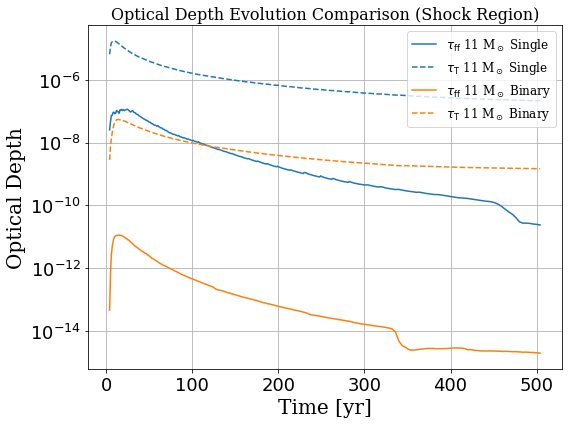

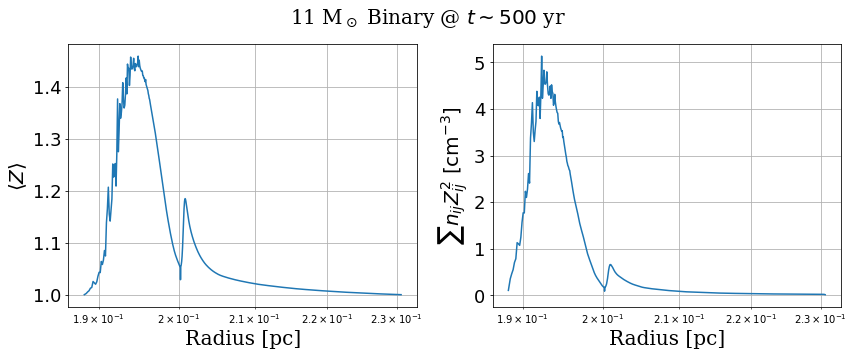

In [5]:
# 读取
masses = [11, 30]

# 统一的字体设置（用你之前的）
font_label = {'family': 'serif', 'size': 20}
tick_size  = 18
font_legend = {'family': 'serif', 'size': 16}

# --- τ_ff vs time ---
plt.figure(figsize=(8,6))
for model, c, in [("single", "#1f77b4"), ("binary", "#ff7f0e")]:
    key = f"11_{model}"
    if key not in all_results_sh: 
        continue
    #all_results[key]["tau_ff_new"] = np.array(all_results[key]["tau_ff_new"])
    res = all_results_sh[key]

    order = np.argsort(res["time"])
    t  = res["time"][order]
    tf = res["tau_ff"][order]
    #tf_new = res["tau_ff_new"][order]
    tau_t = res["tau_T"][order]
    label_m = fr"11 M$_\odot$ {model.capitalize()}"
    #plt.plot(t, tf, c=c, label = r"$\tau_{\rm ff} \langle Z \rangle$ " +  label_m)
    plt.plot(t, tf, "-", c=c, label = r"$\tau_{\rm ff}$ " +  label_m)
    #plt.plot(t, tf_new, ls = ":", c=c, label = r"$\tau_{\rm ff}\,(Z_{ij})$" +  label_m)
    plt.plot(t, tau_t, "--", c=c, label = r"$\tau_{\rm T}$ "+  label_m )
    

plt.yscale("log")
plt.xlabel("Time [yr]", **font_label)
plt.ylabel(r"Optical Depth", **font_label)
plt.grid(True, which="both")
plt.tick_params(labelsize=tick_size)
plt.title("Optical Depth Evolution Comparison (Shock Region)", **font_label_small)
plt.legend(prop=font_legend_xsmall)
plt.tight_layout()
plt.savefig("tau_ff_11Msun_binary_single.png", dpi=150)
plt.show()




# --- 选择一个时间点，看 Z_avg(r) 和 Σ n_ij Z^2(r) ---
key = "11_binary"
res = all_results_sh[key]
idx = 6

r  = res["radius_profiles"][idx]
Zavg = res["Z_avg_profiles"][idx]
Z2n  = res["Z2n_profiles"][idx]

fig, ax = plt.subplots(1,2, figsize=(12,5), sharex=True)
ax[0].plot(r, Zavg)
ax[0].set_xscale("log")
ax[0].set_xlabel("Radius [pc]", **font_label)
ax[0].set_ylabel(r"$\langle Z \rangle$", **font_label)
ax[0].grid(True, which="both")
ax[0].tick_params(labelsize=tick_size)

ax[1].plot(r, Z2n)
ax[1].set_xscale("log")
#ax[1].set_yscale("log")
ax[1].set_xlabel("Radius [pc]", **font_label)
ax[1].set_ylabel(r"$\sum n_{ij} Z_{ij}^2\ [{\rm cm^{-3}}]$", **font_label)
ax[1].grid(True, which="both")
ax[1].tick_params(labelsize=tick_size)

fig.suptitle(r"11 M$_\odot$ Binary @ $t\sim 500$ yr", **font_label)
plt.tight_layout()
plt.savefig("Zavg_Z2n_profile_11_binary_t500.png", dpi=150)
plt.show()


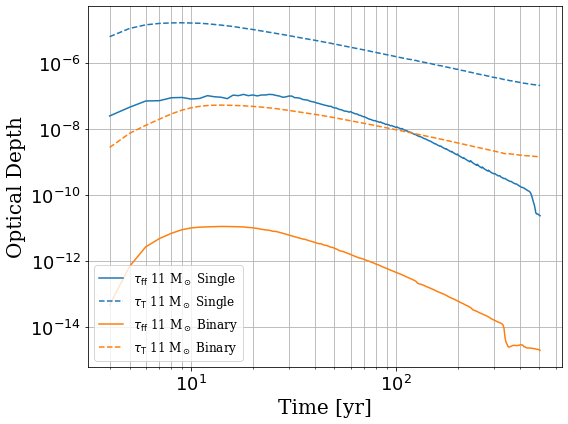

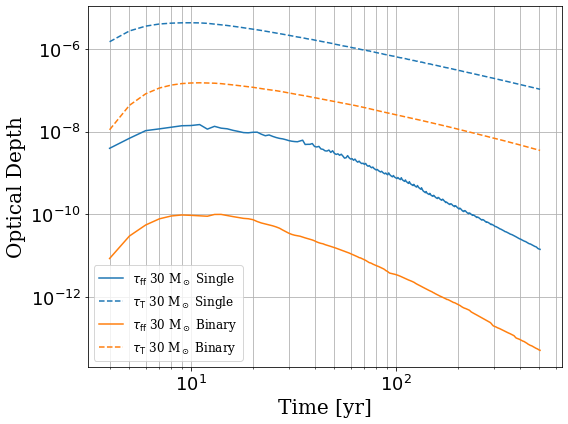

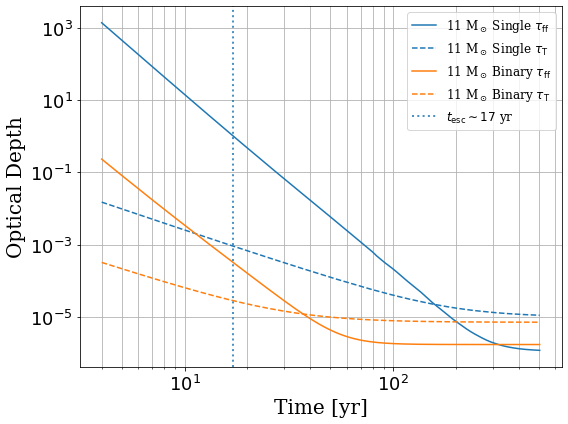

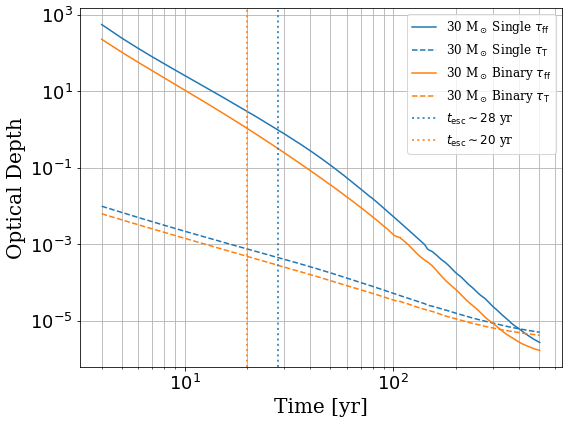

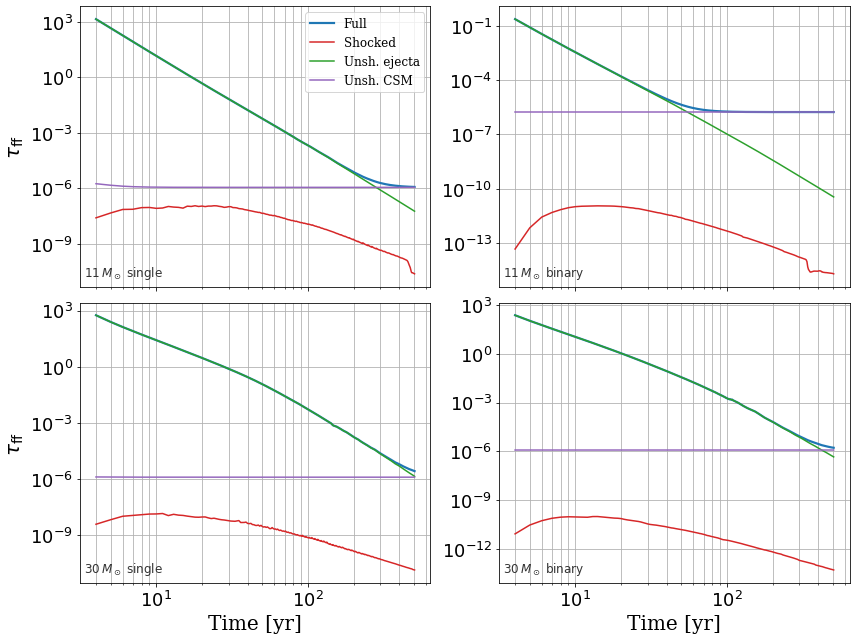

In [8]:
# --- Full (shock + unshock + CSM outside blast wave) ---

def _sorted_time(res):
    t = np.asarray(res.get("time", []), dtype=float)
    if t.size == 0:
        return t, None
    order = np.argsort(t)
    return t[order], order

def _interp_to(t_src, y_src, t_tgt):
    t_src = np.asarray(t_src, dtype=float)
    y_src = np.asarray(y_src, dtype=float)
    t_tgt = np.asarray(t_tgt, dtype=float)
    if t_src.size == 0:
        return np.full_like(t_tgt, np.nan, dtype=float)
    order = np.argsort(t_src)
    t_src = t_src[order]
    y_src = y_src[order]
    return np.interp(t_tgt, t_src, y_src, left=np.nan, right=np.nan)

def _csm_tau_outside(csm_res, rb_pc, nu=1e9):
    if csm_res is None or len(csm_res.get("radius_profiles", [])) == 0:
        return 0.0, 0.0
    # Use initial CSM profile (earliest time)
    t_csm, order = _sorted_time(csm_res)
    idx = int(order[0]) if order is not None else 0

    r_pc = np.asarray(csm_res["radius_profiles"][idx], dtype=float)
    ne = np.asarray(csm_res["ne_profiles"][idx], dtype=float)
    te = np.asarray(csm_res["Te"][idx], dtype=float)
    zavg = np.asarray(csm_res["Z_avg_profiles"][idx], dtype=float)
    z2n = np.asarray(csm_res["Z2n_profiles"][idx], dtype=float)

    mask = r_pc > rb_pc
    if np.count_nonzero(mask) < 2:
        return 0.0, 0.0

    r_pc = r_pc[mask]
    ne = ne[mask]
    te = te[mask]
    zavg = zavg[mask]
    z2n = z2n[mask]

    r_cm = r_pc * pc_to_cm
    dr = np.diff(r_cm)
    ne_mid = 0.5 * (ne[:-1] + ne[1:])
    tau_T = np.sum(ne_mid * dr) * sigma_T
    tau_ff = compute_tau_ff(r_pc, te, ne, z2n, zavg)
    return tau_ff, tau_T

def compute_full_from_components(all_results_sh, all_results_unsh, all_results_CSM, nu=1e9):
    full = {}
    for key, sh in all_results_sh.items():
        if key not in all_results_unsh:
            continue
        unsh = all_results_unsh[key]
        csm = all_results_CSM.get(key, None)

        t_sh, order_sh = _sorted_time(sh)
        if t_sh.size == 0:
            continue

        # Shock / unshock tau on shock time grid
        tau_ff_sh = np.asarray(sh.get("tau_ff", []), dtype=float)
        tau_T_sh = np.asarray(sh.get("tau_T", []), dtype=float)
        if order_sh is not None:
            tau_ff_sh = tau_ff_sh[order_sh]
            tau_T_sh = tau_T_sh[order_sh]

        tau_ff_un = _interp_to(unsh.get("time", []), unsh.get("tau_ff", []), t_sh)
        tau_T_un = _interp_to(unsh.get("time", []), unsh.get("tau_T", []), t_sh)

        # Blast wave radius from shock profiles
        if "r_b" in sh and len(sh["r_b"]) == len(t_sh):
            r_b = np.asarray(sh["r_b"], dtype=float)[order_sh] if order_sh is not None else np.asarray(sh["r_b"], dtype=float)
        else:
            # fallback: use max radius in shock profile
            r_b = np.array([np.max(rp) for rp in sh.get("radius_profiles", [])], dtype=float)
            if order_sh is not None and len(r_b) == len(order_sh):
                r_b = r_b[order_sh]

        tau_ff_csm = np.zeros_like(t_sh, dtype=float)
        tau_T_csm = np.zeros_like(t_sh, dtype=float)
        for i, rb_pc in enumerate(r_b):
            tf, tt = _csm_tau_outside(csm, rb_pc, nu=nu)
            tau_ff_csm[i] = tf
            tau_T_csm[i] = tt

        tau_ff_full = tau_ff_un + tau_ff_csm
        tau_T_full = tau_T_un + tau_T_csm

        full[key] = {
            "time": t_sh,
            "tau_ff": tau_ff_full,
            "tau_T": tau_T_full,
            "tau_ff_sh": tau_ff_sh,
            "tau_T_sh": tau_T_sh,
            "tau_ff_un": tau_ff_un,
            "tau_T_un": tau_T_un,
            "tau_ff_csm": tau_ff_csm,
            "tau_T_csm": tau_T_csm,
        }
    return full

all_results_full_series = compute_full_from_components(all_results_sh, all_results_unsh, all_results_CSM)

# --- Plot shock region comparison (11 and 30) ---
for mass in [11, 30]:
    plt.figure(figsize=(8,6))
    for model, c in [("single", "#1f77b4"), ("binary", "#ff7f0e")]:
        key = f"{mass}_{model}"
        if key not in all_results_sh:
            continue
        res = all_results_sh[key]
        t, order = _sorted_time(res)
        if t.size == 0:
            continue
        tf = np.asarray(res["tau_ff"], dtype=float)[order]
        tt = np.asarray(res["tau_T"], dtype=float)[order]
        label_m = fr"{mass} M$_\odot$ {model.capitalize()}"
        plt.plot(t, tf, "-", c=c, label = r"$\tau_{\rm ff}$ " +  label_m)
        plt.plot(t, tt, "--", c=c, label = r"$\tau_{\rm T}$ "+  label_m )
    plt.xscale("log")
    plt.yscale("log")
    plt.xlabel("Time [yr]", **font_label)
    plt.ylabel(r"Optical Depth", **font_label)
    plt.grid(True, which="both")
    plt.tick_params(labelsize=tick_size)
    #plt.title("Optical Depth Evolution (Shock Region)", **font_label_small)
    plt.legend(prop=font_legend_xsmall)
    plt.tight_layout()
    plt.savefig(f"tau_ff_{mass}Msun_shock.png", dpi=150)
    plt.show()

# --- Full comparison (computed) for each mass ---
for mass in [11, 30]:
    plt.figure(figsize=(8,6))
    t_esc_model = {}
    for model, c in [("single", "#1f77b4"), ("binary", "#ff7f0e")]:
        key = f"{mass}_{model}"
        if key not in all_results_full_series:
            continue
        res = all_results_full_series[key]
        t = res["time"]
        plt.plot(t, res["tau_ff"], "-", c=c, label=fr"{mass} M$_\odot$ {model.capitalize()} $\tau_{{\rm ff}}$")
        plt.plot(t, res["tau_T"], "--", c=c, label=fr"{mass} M$_\odot$ {model.capitalize()} $\tau_{{\rm T}}$")
        tau_tot = res["tau_ff"] + res["tau_T"]
        idx = np.argmin(np.abs(tau_tot - 1.0))
        
        t_esc = t[idx]
        t_esc_model[model] = t_esc
    for model , c in [("single", "#1f77b4"), ("binary", "#ff7f0e")]:
        t_esc = t_esc_model[model]
        if t_esc > 4:
            plt.axvline(x = t_esc, c = c, lw = 2, ls = ":", alpha = 0.8, label = f"$t_{{\mathrm{{esc}}}}\sim{int(t_esc)}$ yr")
    plt.yscale("log")
    plt.xscale("log")
    plt.xlabel("Time [yr]", **font_label)
    plt.ylabel(r"Optical Depth", **font_label)
    plt.grid(True, which="both")
    plt.tick_params(labelsize=tick_size)
    #plt.title("Optical Depth Evolution (Full: Shock+Unshock+CSM)", **font_label_small)
    plt.legend(prop=font_legend_xsmall)
    plt.tight_layout()
    plt.savefig(f"tau_ff_{mass}Msun_full_comp.png", dpi=150)
    plt.show()

# --- Component vs full for each mass/model ---

comp_colors = {"Shock": "#d62728", "Unshocked": "#2ca02c", "CSM": "#9467bd", "Full": "#1f77b4"}
fig, axes = plt.subplots(2, 2, figsize=(12, 9), sharex=True)
for i, mass in enumerate([11, 30]):
    for j, model in enumerate(["single", "binary"]):
        ax = axes[i, j]
        key = f"{mass}_{model}"
        if key not in all_results_full_series:
            continue
        res = all_results_full_series[key]
        t = res["time"]

        
        ax.plot(t, res["tau_ff"], color=comp_colors["Full"], lw=2.2, label="Full")
        ax.plot(t, res["tau_ff_sh"], color=comp_colors["Shock"], label="Shocked")
        ax.plot(t, res["tau_ff_un"], color=comp_colors["Unshocked"], label="Unsh. ejecta")
        ax.plot(t, res["tau_ff_csm"], color=comp_colors["CSM"], label="Unsh. CSM")

        ax.text(
            0.01, 0.02,
            f"${mass}\,M_\odot$ {model}",
            transform=ax.transAxes,
            ha="left", va="bottom",
            fontsize=12,
            color="0.2"
        )
            #for ax, ylabel in zip(axes, [r"$\tau_{\rm ff}$"]):
        ax.set_yscale("log")
        ax.set_xscale("log")
        ax.grid(True, which="both")
        ax.tick_params(labelsize=tick_size)


# legend only in first panel (top-left)
handles, labels = axes[0, 0].get_legend_handles_labels()
if handles:
    axes[0, 0].legend(handles, labels, prop=font_legend_xsmall, loc="upper right")

axes[1, 0].set_xlabel("Time [yr]", **font_label)
axes[1, 1].set_xlabel("Time [yr]", **font_label)
axes[0, 0].set_ylabel(r"$\tau_{\rm ff}$", **font_label)
axes[1, 0].set_ylabel(r"$\tau_{\rm ff}$", **font_label)
plt.tight_layout()
plt.savefig("tau_components_full_2_2.png", dpi=150)
plt.show()




# Optical Depth Data Storage

In [9]:
# =========================
# Save optical-depth data for Zenodo
# =========================
import os
import json
import pandas as pd
import numpy as np

SAVE_DIR = "/root/jupyter_notebook/user_work/Data/SNR_work/zenodo_optical_depth_data"
os.makedirs(SAVE_DIR, exist_ok=True)

rows = []

for mass in [11, 30]:
    for model in ["single", "binary"]:
        key = f"{mass}_{model}"

        # ---- Shock-region data ----
        if key in all_results_sh:
            res_sh = all_results_sh[key]
            t_sh, order_sh = _sorted_time(res_sh)

            if t_sh.size > 0:
                tau_ff_sh = np.asarray(res_sh["tau_ff"], dtype=float)[order_sh]
                tau_T_sh  = np.asarray(res_sh["tau_T"], dtype=float)[order_sh]

                for t, tau_ff, tau_T in zip(t_sh, tau_ff_sh, tau_T_sh):
                    rows.append({
                        "mass_Msun": mass,
                        "model": model,
                        "region": "shock",
                        "time_yr": t,
                        "tau_ff": tau_ff,
                        "tau_T": tau_T,
                        "tau_total": tau_ff + tau_T,
                        "tau_ff_shocked": tau_ff,
                        "tau_T_shocked": tau_T,
                        "tau_ff_unshocked_ejecta": np.nan,
                        "tau_T_unshocked_ejecta": np.nan,
                        "tau_ff_unshocked_CSM": np.nan,
                        "tau_T_unshocked_CSM": np.nan,
                    })

        # ---- Full/component data ----
        if key in all_results_full_series:
            res = all_results_full_series[key]
            t = np.asarray(res["time"], dtype=float)

            tau_ff_full = np.asarray(res["tau_ff"], dtype=float)
            tau_T_full  = np.asarray(res["tau_T"], dtype=float)

            tau_ff_sh = np.asarray(res.get("tau_ff_sh", np.full_like(t, np.nan)), dtype=float)
            tau_T_sh  = np.asarray(res.get("tau_T_sh",  np.full_like(t, np.nan)), dtype=float)

            tau_ff_un = np.asarray(res.get("tau_ff_un", np.full_like(t, np.nan)), dtype=float)
            tau_T_un  = np.asarray(res.get("tau_T_un",  np.full_like(t, np.nan)), dtype=float)

            tau_ff_csm = np.asarray(res.get("tau_ff_csm", np.full_like(t, np.nan)), dtype=float)
            tau_T_csm  = np.asarray(res.get("tau_T_csm",  np.full_like(t, np.nan)), dtype=float)

            for i in range(len(t)):
                rows.append({
                    "mass_Msun": mass,
                    "model": model,
                    "region": "full_unshocked_ejecta_plus_CSM",
                    "time_yr": t[i],
                    "tau_ff": tau_ff_full[i],
                    "tau_T": tau_T_full[i],
                    "tau_total": tau_ff_full[i] + tau_T_full[i],
                    "tau_ff_shocked": tau_ff_sh[i],
                    "tau_T_shocked": tau_T_sh[i],
                    "tau_ff_unshocked_ejecta": tau_ff_un[i],
                    "tau_T_unshocked_ejecta": tau_T_un[i],
                    "tau_ff_unshocked_CSM": tau_ff_csm[i],
                    "tau_T_unshocked_CSM": tau_T_csm[i],
                })

df_tau = pd.DataFrame(rows)

csv_path = os.path.join(SAVE_DIR, "optical_depth_time_series_11_30Msun_single_binary.csv")
df_tau.to_csv(csv_path, index=False)

# Also save separate files for convenience
for (mass, model, region), sub in df_tau.groupby(["mass_Msun", "model", "region"]):
    fname = f"tau_{mass}Msun_{model}_{region}.csv"
    sub.to_csv(os.path.join(SAVE_DIR, fname), index=False)

# Metadata for Zenodo
metadata = {
    "description": (
        "Optical-depth time-series data used for plotting tau_ff and tau_T "
        "for 11 and 30 Msun progenitors, single-star and binary-stripped channels. "
        "The shock rows correspond to the shocked region. "
        "The full rows correspond to unshocked ejecta plus unshocked CSM outside the blast wave, "
        "with component columns also included."
    ),
    "frequency_Hz": 1.0e9,
    "columns": list(df_tau.columns),
    "models": ["11_single", "11_binary", "30_single", "30_binary"],
    "units": {
        "time_yr": "yr",
        "tau_ff": "dimensionless",
        "tau_T": "dimensionless",
        "tau_total": "dimensionless"
    }
}

with open(os.path.join(SAVE_DIR, "README_optical_depth_data.json"), "w") as f:
    json.dump(metadata, f, indent=2)

print(f"Saved Zenodo optical-depth data to:\n{SAVE_DIR}")
print(df_tau.head())

Saved Zenodo optical-depth data to:
/root/jupyter_notebook/user_work/Data/SNR_work/zenodo_optical_depth_data
   mass_Msun   model region  time_yr        tau_ff     tau_T  tau_total  \
0         11  single  shock      4.0  2.542491e-08  0.000006   0.000006   
1         11  single  shock      5.0  4.658463e-08  0.000011   0.000011   
2         11  single  shock      6.0  7.220932e-08  0.000015   0.000015   
3         11  single  shock      7.0  7.385929e-08  0.000016   0.000016   
4         11  single  shock      8.0  9.056839e-08  0.000017   0.000017   

   tau_ff_shocked  tau_T_shocked  tau_ff_unshocked_ejecta  \
0    2.542491e-08       0.000006                      NaN   
1    4.658463e-08       0.000011                      NaN   
2    7.220932e-08       0.000015                      NaN   
3    7.385929e-08       0.000016                      NaN   
4    9.056839e-08       0.000017                      NaN   

   tau_T_unshocked_ejecta  tau_ff_unshocked_CSM  tau_T_unshocked_CSM  
0 

# Data Reading and Plot

   mass_Msun   model region  time_yr        tau_ff     tau_T  tau_total  \
0         11  single  shock      4.0  2.542491e-08  0.000006   0.000006   
1         11  single  shock      5.0  4.658463e-08  0.000011   0.000011   
2         11  single  shock      6.0  7.220932e-08  0.000015   0.000015   
3         11  single  shock      7.0  7.385929e-08  0.000016   0.000016   
4         11  single  shock      8.0  9.056839e-08  0.000017   0.000017   

   tau_ff_shocked  tau_T_shocked  tau_ff_unshocked_ejecta  \
0    2.542491e-08       0.000006                      NaN   
1    4.658463e-08       0.000011                      NaN   
2    7.220932e-08       0.000015                      NaN   
3    7.385929e-08       0.000016                      NaN   
4    9.056839e-08       0.000017                      NaN   

   tau_T_unshocked_ejecta  tau_ff_unshocked_CSM  tau_T_unshocked_CSM  
0                     NaN                   NaN                  NaN  
1                     NaN               

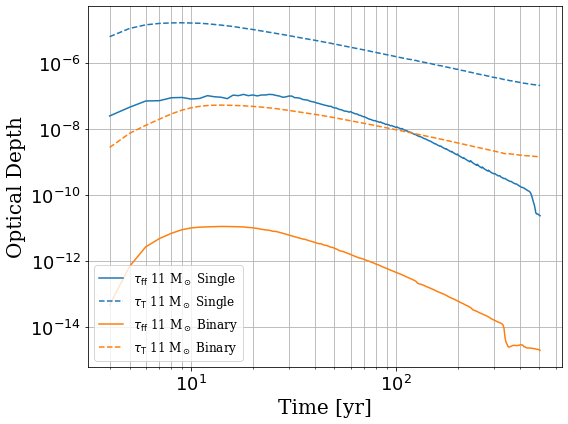

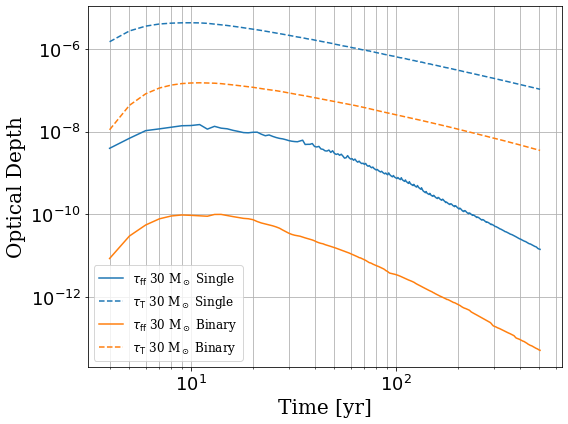

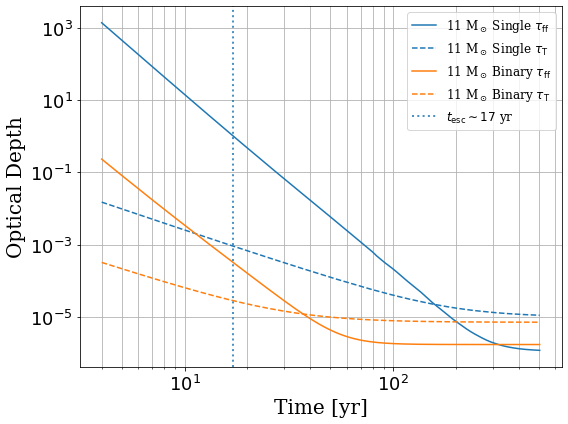

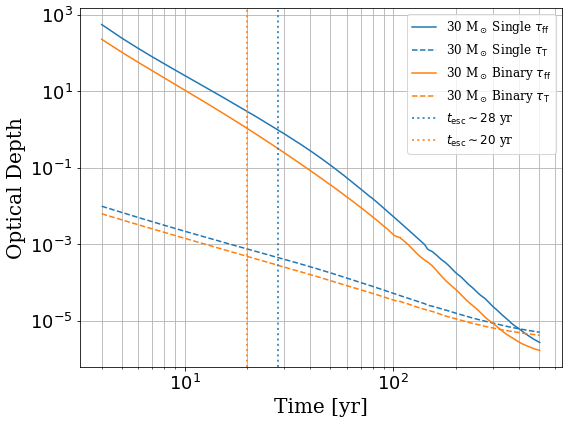

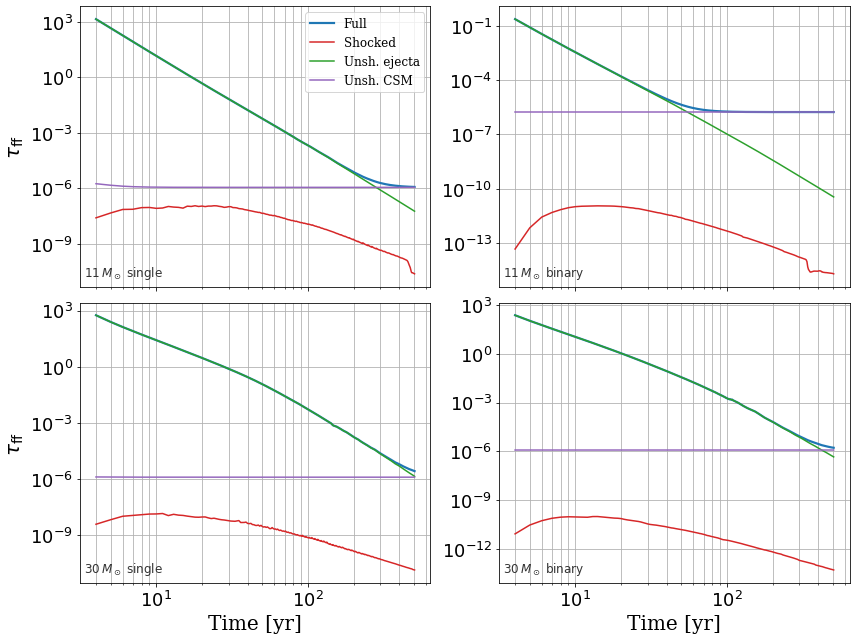

In [11]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================
# Read CSV
# =========================
DATA_DIR = "/root/jupyter_notebook/user_work/Data/SNR_work/zenodo_optical_depth_data"

csv_path = os.path.join(
    DATA_DIR,
    "optical_depth_time_series_11_30Msun_single_binary.csv"
)

df = pd.read_csv(csv_path)

print(df.head())
print(df["region"].unique())
print(df.groupby(["mass_Msun", "model", "region"]).size())


# =========================
# Basic style
# =========================
font_label = {"family": "serif", "size": 20}
font_legend_xsmall = {"family": "serif", "size": 12}
tick_size = 18

model_colors = {
    "single": "#1f77b4",
    "binary": "#ff7f0e",
}

comp_colors = {
    "Full": "#1f77b4",
    "Shocked": "#d62728",
    "Unshocked ejecta": "#2ca02c",
    "Unshocked CSM": "#9467bd",
}


# =========================
# 1. Reproduce shock-region comparison
# =========================
for mass in [11, 30]:

    fig, ax = plt.subplots(figsize=(8, 6))

    for model in ["single", "binary"]:

        sub = df[
            (df["mass_Msun"] == mass)
            & (df["model"] == model)
            & (df["region"] == "shock")
        ].copy()

        if sub.empty:
            continue

        sub = sub.sort_values("time_yr")

        t = sub["time_yr"].to_numpy()
        tau_ff = sub["tau_ff"].to_numpy()
        tau_T = sub["tau_T"].to_numpy()

        c = model_colors[model]
        label_m = fr"{mass} M$_\odot$ {model.capitalize()}"

        ax.plot(t, tau_ff, "-", color=c, label=r"$\tau_{\rm ff}$ " + label_m)
        ax.plot(t, tau_T, "--", color=c, label=r"$\tau_{\rm T}$ " + label_m)

    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlabel("Time [yr]", **font_label)
    ax.set_ylabel("Optical Depth", **font_label)
    ax.grid(True, which="both")
    ax.tick_params(labelsize=tick_size)
    ax.legend(prop=font_legend_xsmall)

    plt.tight_layout()
    plt.savefig(os.path.join(DATA_DIR, f"replot_tau_ff_{mass}Msun_shock_from_csv.png"), dpi=150)
    plt.show()


# =========================
# 2. Reproduce full-region comparison
# =========================
for mass in [11, 30]:

    fig, ax = plt.subplots(figsize=(8, 6))
    t_esc_model = {}

    for model in ["single", "binary"]:

        sub = df[
            (df["mass_Msun"] == mass)
            & (df["model"] == model)
            & (df["region"] == "full_unshocked_ejecta_plus_CSM")
        ].copy()

        if sub.empty:
            continue

        sub = sub.sort_values("time_yr")

        t = sub["time_yr"].to_numpy()
        tau_ff = sub["tau_ff"].to_numpy()
        tau_T = sub["tau_T"].to_numpy()

        c = model_colors[model]

        ax.plot(
            t,
            tau_ff,
            "-",
            color=c,
            label=fr"{mass} M$_\odot$ {model.capitalize()} $\tau_{{\rm ff}}$",
        )

        ax.plot(
            t,
            tau_T,
            "--",
            color=c,
            label=fr"{mass} M$_\odot$ {model.capitalize()} $\tau_{{\rm T}}$",
        )

        tau_tot = tau_ff + tau_T
        idx = np.nanargmin(np.abs(tau_tot - 1.0))
        t_esc_model[model] = t[idx]

    for model in ["single", "binary"]:
        if model not in t_esc_model:
            continue

        t_esc = t_esc_model[model]
        if t_esc > 4:
            ax.axvline(
                x=t_esc,
                color=model_colors[model],
                lw=2,
                ls=":",
                alpha=0.8,
                label=fr"$t_{{\rm esc}}\sim{int(t_esc)}$ yr",
            )

    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlabel("Time [yr]", **font_label)
    ax.set_ylabel("Optical Depth", **font_label)
    ax.grid(True, which="both")
    ax.tick_params(labelsize=tick_size)
    ax.legend(prop=font_legend_xsmall)

    plt.tight_layout()
    plt.savefig(os.path.join(DATA_DIR, f"replot_tau_ff_{mass}Msun_full_comp_from_csv.png"), dpi=150)
    plt.show()


# =========================
# 3. Reproduce component-vs-full 2x2 figure
# =========================
fig, axes = plt.subplots(2, 2, figsize=(12, 9), sharex=True)

for i, mass in enumerate([11, 30]):
    for j, model in enumerate(["single", "binary"]):

        ax = axes[i, j]

        sub = df[
            (df["mass_Msun"] == mass)
            & (df["model"] == model)
            & (df["region"] == "full_unshocked_ejecta_plus_CSM")
        ].copy()

        if sub.empty:
            continue

        sub = sub.sort_values("time_yr")

        t = sub["time_yr"].to_numpy()

        ax.plot(
            t,
            sub["tau_ff"].to_numpy(),
            color=comp_colors["Full"],
            lw=2.2,
            label="Full",
        )

        ax.plot(
            t,
            sub["tau_ff_shocked"].to_numpy(),
            color=comp_colors["Shocked"],
            label="Shocked",
        )

        ax.plot(
            t,
            sub["tau_ff_unshocked_ejecta"].to_numpy(),
            color=comp_colors["Unshocked ejecta"],
            label="Unsh. ejecta",
        )

        ax.plot(
            t,
            sub["tau_ff_unshocked_CSM"].to_numpy(),
            color=comp_colors["Unshocked CSM"],
            label="Unsh. CSM",
        )

        ax.text(
            0.01,
            0.02,
            fr"${mass}\,M_\odot$ {model}",
            transform=ax.transAxes,
            ha="left",
            va="bottom",
            fontsize=12,
            color="0.2",
        )

        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.grid(True, which="both")
        ax.tick_params(labelsize=tick_size)

handles, labels = axes[0, 0].get_legend_handles_labels()
if handles:
    axes[0, 0].legend(handles, labels, prop=font_legend_xsmall, loc="upper right")

axes[1, 0].set_xlabel("Time [yr]", **font_label)
axes[1, 1].set_xlabel("Time [yr]", **font_label)
axes[0, 0].set_ylabel(r"$\tau_{\rm ff}$", **font_label)
axes[1, 0].set_ylabel(r"$\tau_{\rm ff}$", **font_label)

plt.tight_layout()
plt.savefig(os.path.join(DATA_DIR, "replot_tau_components_full_2_2_from_csv.png"), dpi=150)
plt.show()

# Full-region diagnostics (shock + unshock + CSM outside blast)

mu_a_unsh_med:[4.04230874 4.04230114 4.04230087 4.04230087 4.04230087]
mu_a_unsh_med:[1.30485857 1.30485857 1.30485852 1.30485852 1.30485852]
mu_a_unsh_med:[4.04226964 4.04226817 4.04226817 4.04226817 4.04226817]
mu_a_unsh_med:[1.91449595 1.91449595 1.91435143 1.91435143 1.91435143]


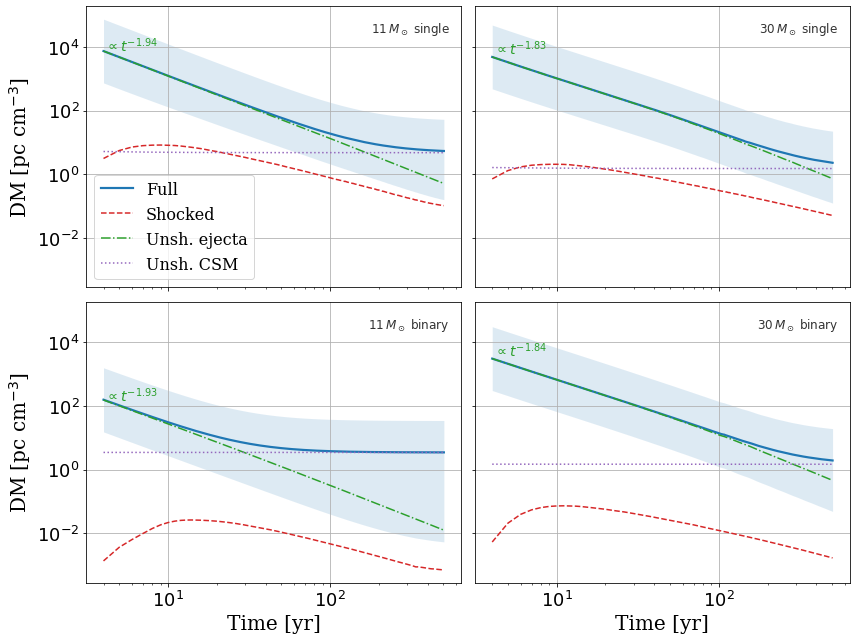

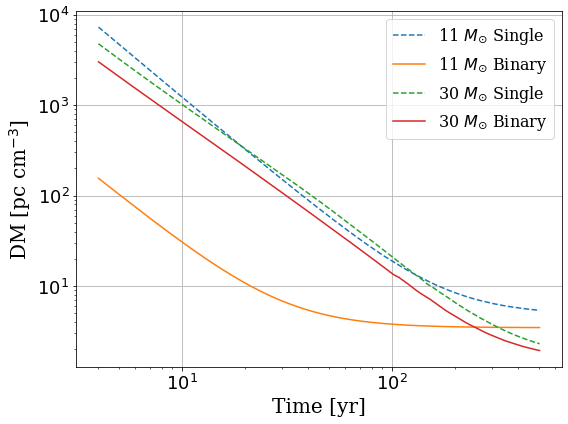

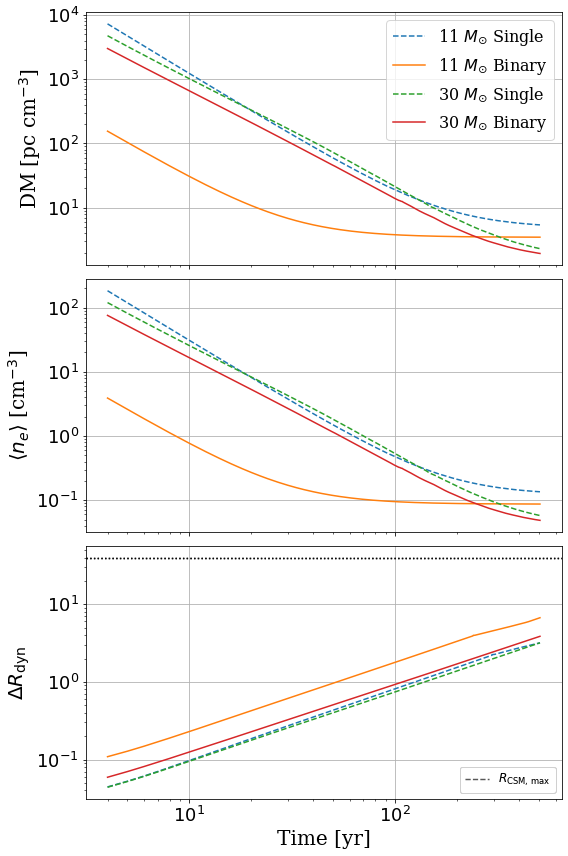

t_esc:13.0
tau_tot:0.8078091105684383
t_esc_model:{'single': 13.0}
t_esc:4.0
tau_tot:0.04869355980383429
t_esc_model:{'single': 13.0, 'binary': 4.0}


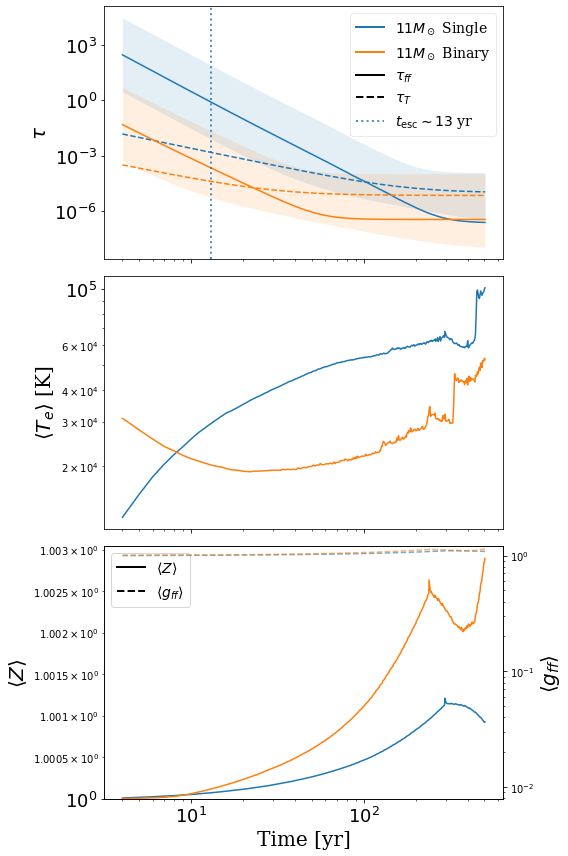

t_esc:17.0
tau_tot:1.041399933353518
t_esc_model:{'single': 17.0}
t_esc:13.0
tau_tot:0.9588693027678454
t_esc_model:{'single': 17.0, 'binary': 13.0}


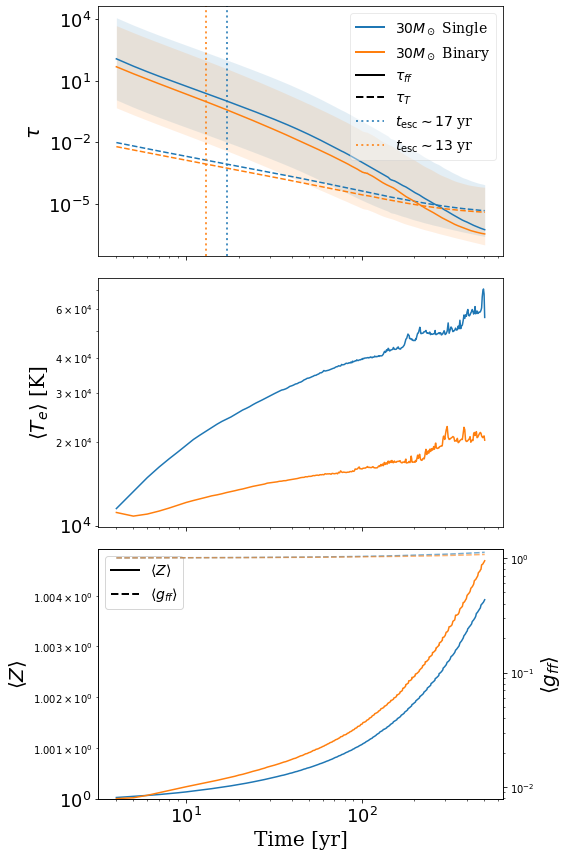

[11_single] FRB 20190520B: t_occur=27.000 yr, d2DM/dt2=1.405e+00, d2DM/dt2_est=9.224e-01
[11_single] FRB 20121102 (late): t_occur=40.000 yr, d2DM/dt2=2.772e-01, d2DM/dt2_est=1.958e-01
[11_single] FRB 20220529A: t_occur=67.000 yr, d2DM/dt2=4.143e-02, d2DM/dt2_est=2.577e-02
[11_binary] FRB 20190520B: t_occur=8.000 yr, d2DM/dt2=3.877e+00, d2DM/dt2_est=2.419e+00
[11_binary] FRB 20121102 (late): t_occur=11.000 yr, d2DM/dt2=1.075e+00, d2DM/dt2_est=6.948e-01
[11_binary] FRB 20220529A: t_occur=18.000 yr, d2DM/dt2=1.547e-01, d2DM/dt2_est=1.018e-01


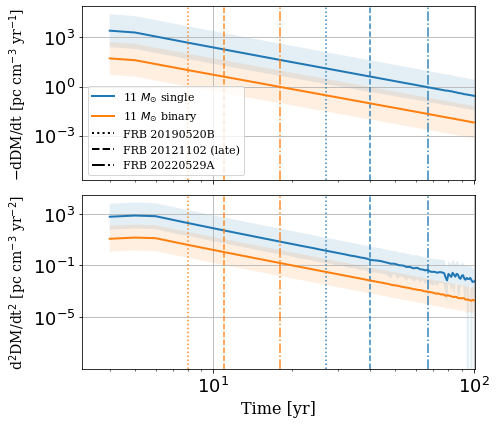

[30_single] FRB 20190520B: t_occur=27.000 yr, d2DM/dt2=1.170e+00, d2DM/dt2_est=8.306e-01
[30_single] FRB 20121102 (late): t_occur=42.000 yr, d2DM/dt2=2.439e-01, d2DM/dt2_est=1.719e-01
[30_single] FRB 20220529A: t_occur=74.000 yr, d2DM/dt2=1.955e-02, d2DM/dt2_est=2.159e-02
[30_binary] FRB 20190520B: t_occur=23.000 yr, d2DM/dt2=1.401e+00, d2DM/dt2_est=9.702e-01
[30_binary] FRB 20121102 (late): t_occur=35.000 yr, d2DM/dt2=2.906e-01, d2DM/dt2_est=2.090e-01
[30_binary] FRB 20220529A: t_occur=61.000 yr, d2DM/dt2=4.002e-02, d2DM/dt2_est=2.715e-02


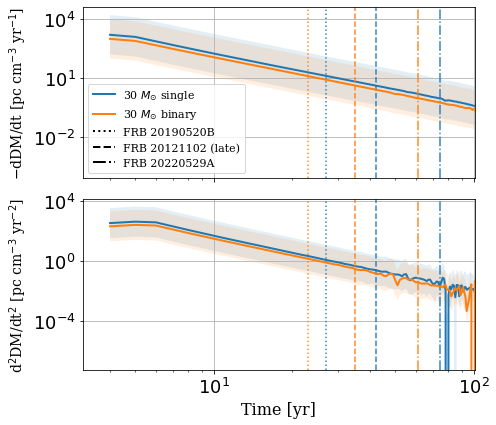

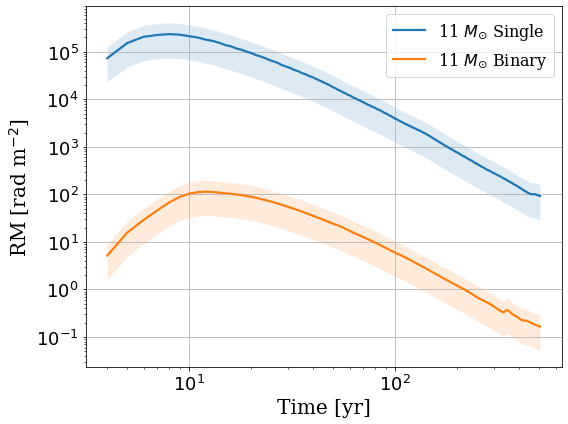

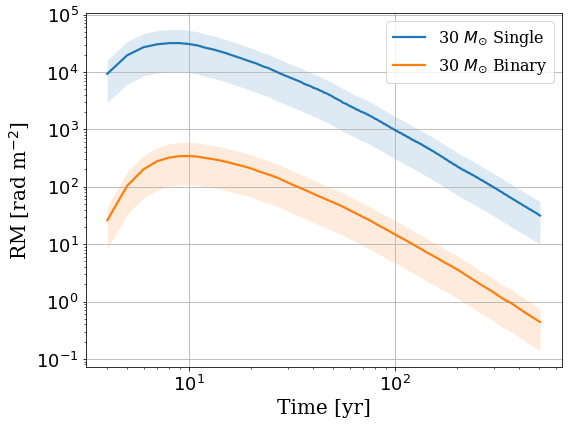

In [17]:
# =========================
# Full-region diagnostics (shock + unshock + CSM outside blast)
# =========================
from matplotlib.lines import Line2D

unshock_sim_setting = False
chi_e_map = {"xhigh":1, "high": 0.1, "middle": 0.01, "low": 0.001, "xlow": 1e-4}
chi_e_unsh_setting = "high"
chi_e_ISM_setting = "high"
def _sorted_time(res):
    t = np.asarray(res.get("time", []), dtype=float)
    if t.size == 0:
        return t, None
    order = np.argsort(t)
    return t[order], order

def _interp_to(t_src, y_src, t_tgt):
    t_src = np.asarray(t_src, dtype=float)
    y_src = np.asarray(y_src, dtype=float)
    t_tgt = np.asarray(t_tgt, dtype=float)
    if t_src.size == 0:
        return np.full_like(t_tgt, np.nan, dtype=float)
    order = np.argsort(t_src)
    t_src = t_src[order]
    y_src = y_src[order]
    return np.interp(t_tgt, t_src, y_src, left=np.nan, right=np.nan)

def _profile_mean_list(profiles):
    return np.array([np.mean(p) for p in profiles], dtype=float)

def _csm_outside_series(csm_res, r_b_series, nu=1e9, unshock_sim_setting=True,
                        T_csm_const=1e4):
    if csm_res is None or len(csm_res.get("radius_profiles", [])) == 0:
        n = len(r_b_series)
        if unshock_sim_setting:
            return (np.zeros(n), np.zeros(n), np.zeros(n), np.zeros(n), np.zeros(n),
                    np.zeros(n), np.zeros(n), np.zeros(n), 0.0)
        else:
            return ((np.zeros(n), np.zeros(n), np.zeros(n)),
                    np.zeros(n), np.zeros(n), np.zeros(n), np.zeros(n),
                    np.zeros(n), np.zeros(n), 0.0)

    t_csm, order = _sorted_time(csm_res)
    idx0 = int(order[0]) if order is not None else 0

    r_pc_all = np.asarray(csm_res["radius_profiles"][idx0], dtype=float)
    # mu_a profile (mean atomic mass)
    mu_a_all = None
    if "mu_a_profiles" in csm_res and len(csm_res["mu_a_profiles"]) > idx0:
        mu_a_all = np.asarray(csm_res["mu_a_profiles"][idx0], dtype=float)
    
    if unshock_sim_setting:
        if mu_a_all is not None:
            density_all = np.asarray(csm_res["density_profiles"][idx0], dtype=float)
            # assume full ionization in CSM if using mu_a
            ne_all = density_all / (mu_a_all * m_p)
        else:
            ne_all = np.asarray(csm_res["ne_profiles"][idx0], dtype=float)
        te_all = np.asarray(csm_res["Te"][idx0], dtype=float)
        zavg_all = np.asarray(csm_res["Z_avg_profiles"][idx0], dtype=float)
        gff_all = np.asarray(csm_res.get("gff_avg_profiles", [np.ones_like(ne_all)])[idx0], dtype=float)
    else:
        density_all = np.asarray(csm_res["density_profiles"][idx0], dtype=float)
        chi_e = chi_e_map.get(str(chi_e_ISM_setting).lower(), 0.01)
        chi_e_lower = chi_e_map.get("xlow", 1e-4)
        chi_e_upper = chi_e_map.get("xhigh", 1.0)

        if mu_a_all is None:
            mu_a_all = np.ones_like(density_all)

        ne_all = chi_e * density_all / (mu_a_all * m_p)
        ne_all_lower = chi_e_lower * density_all / (mu_a_all * m_p)
        ne_all_upper = chi_e_upper * density_all / (mu_a_all * m_p)

        te_all = np.full_like(ne_all, T_csm_const, dtype=float)
        zavg_all = np.ones_like(ne_all, dtype=float)
        gff_all = np.ones_like(ne_all, dtype=float)

    z2n_all = np.asarray(csm_res.get("Z2n_profiles", [ne_all])[idx0], dtype=float)

    dm_list = []
    dm_lower_list = []
    dm_upper_list = []
    tau_ff_list = []
    tau_T_list = []
    tau_T_lower_list = []
    tau_T_upper_list = []
    tau_ff_lower_list = []
    tau_ff_upper_list = []
    ne_avg_list = []
    te_avg_list = []
    zavg_list = []
    gff_avg_list = []
    len_list = []
    mu_a_med_list = []

    r_max = r_pc_all.max() if r_pc_all.size else 0.0

    for rb_pc in r_b_series:
        mask = r_pc_all > rb_pc
        if np.count_nonzero(mask) < 2:
            dm_list.append(0.0)
            tau_ff_list.append(0.0)
            tau_T_list.append(0.0)
            ne_avg_list.append(0.0)
            te_avg_list.append(0.0)
            zavg_list.append(0.0)
            gff_avg_list.append(1.0)
            len_list.append(max(r_max - rb_pc, 0.0))
            
            if mu_a_all is not None:
                mu_a_med_list.append(np.nanmedian(mu_a_all[mask]))
            else:
                mu_a_med_list.append(np.nan)
            
            if not unshock_sim_setting:
                dm_lower_list.append(0.0)
                dm_upper_list.append(0.0)
                tau_T_lower_list.append(0.0)
                tau_T_upper_list.append(0.0)
                tau_ff_lower_list.append(0.0)
                tau_ff_upper_list.append(0.0)
            continue
        r_pc = r_pc_all[mask]
        ne = ne_all[mask]
        te = te_all[mask]
        zavg = zavg_all[mask]
        z2n = z2n_all[mask]
        gff = gff_all[mask]
        if mu_a_all is not None:
            mu_a_med_list.append(np.nanmedian(mu_a_all[mask]))
        else:
            mu_a_med_list.append(np.nan)

        r_cm = r_pc * pc_to_cm
        dr = np.diff(r_cm)
        ne_mid = 0.5 * (ne[:-1] + ne[1:])

        dm = np.sum(ne_mid * dr) / pc_to_cm
        tau_T = np.sum(ne_mid * dr) * sigma_T
        tau_ff = compute_tau_ff(r_pc, te, ne, Z2n_gff=ne, nu=nu)

        dm_list.append(dm)
        tau_ff_list.append(tau_ff)
        tau_T_list.append(tau_T)
        ne_avg_list.append(dm / max(r_pc.max() - r_pc.min(), 1e-12))
        te_avg_list.append(np.mean(te))
        zavg_list.append(np.mean(zavg))
        gff_avg_list.append(np.mean(gff))
        len_list.append(r_pc.max() - r_pc.min())

        if not unshock_sim_setting:
            ne_lower = ne_all_lower[mask]
            ne_upper = ne_all_upper[mask]
            ne_mid_lower = 0.5 * (ne_lower[:-1] + ne_lower[1:])
            ne_mid_upper = 0.5 * (ne_upper[:-1] + ne_upper[1:])
            dm_lower = np.sum(ne_mid_lower * dr) / pc_to_cm
            dm_upper = np.sum(ne_mid_upper * dr) / pc_to_cm
            dm_lower_list.append(dm_lower)
            dm_upper_list.append(dm_upper)

            tau_T_lower_list.append(np.sum(ne_mid_lower * dr) * sigma_T)
            tau_T_upper_list.append(np.sum(ne_mid_upper * dr) * sigma_T)

            tau_ff_lower_list.append(compute_tau_ff(r_pc, te, ne_lower, Z2n_gff=ne_lower, nu=nu))
            tau_ff_upper_list.append(compute_tau_ff(r_pc, te, ne_upper, Z2n_gff=ne_upper, nu=nu))


    dm_array = np.array(dm_list)
    tau_ff_array = np.array(tau_ff_list)
    tau_T_array = np.array(tau_T_list)
    ne_avg_array = np.array(ne_avg_list)
    te_avg_array = np.array(te_avg_list)
    zavg_array = np.array(zavg_list)
    gff_avg_array = np.array(gff_avg_list)
    len_array = np.array(len_list)
    mu_a_med_array = np.array(mu_a_med_list)
    
    if unshock_sim_setting:
        return (dm_array, tau_ff_array, tau_T_array, ne_avg_array, te_avg_array,
                zavg_array, gff_avg_array, len_array, r_max, mu_a_med_array)
    else:
        dm_lower_array = np.array(dm_lower_list)
        dm_upper_array = np.array(dm_upper_list)
        tau_T_lower_array = np.array(tau_T_lower_list)
        tau_T_upper_array = np.array(tau_T_upper_list)
        tau_ff_lower_array = np.array(tau_ff_lower_list)
        tau_ff_upper_array = np.array(tau_ff_upper_list)

        return ((dm_array, dm_lower_array, dm_upper_array),
                (tau_ff_array, tau_ff_lower_array, tau_ff_upper_array),
                (tau_T_array, tau_T_lower_array, tau_T_upper_array),
                ne_avg_array, te_avg_array, zavg_array, gff_avg_array, len_array, r_max, mu_a_med_array)



def compute_full_series_new(all_results_sh, all_results_unsh, all_results_CSM, unshock_sim_setting = True, nu_ff = 1e9):
    full = {}
    for key, sh in all_results_sh.items():
        if key not in all_results_unsh:
            continue
            
        unsh = all_results_unsh[key]
        csm = all_results_CSM.get(key, None)

        t_sh, order_sh = _sorted_time(sh)
        if t_sh.size == 0:
            continue

        dm_sh = np.asarray(sh.get("dm", []), dtype=float)
        tau_ff_sh = np.asarray(sh.get("tau_ff", []), dtype=float)
        tau_T_sh = np.asarray(sh.get("tau_T", []), dtype=float)
        r_b = np.asarray(sh.get("r_b", []), dtype=float)
        r_r = np.asarray(sh.get("r_r", []), dtype=float)
        mu_e_sh = sh.get("mu_e_profiles", [])
        mu_a_sh = sh.get("mu_e_profiles", [])
        mu_m_sh = sh.get("mu_e_profiles", [])
        # shock 区域 mu 中值（按时间序列）
        mu_e_sh_med = np.array([np.nanmedian(x) for x in mu_e_sh]) if mu_e_sh else np.array([])
        mu_a_sh_med = np.array([np.nanmedian(x) for x in mu_a_sh]) if mu_a_sh else np.array([])
        mu_m_sh_med = np.array([np.nanmedian(x) for x in mu_m_sh]) if mu_m_sh else np.array([])
        #print(f"{key}:")
        #print("mu_e_sh[10][10:15] =", mu_e_sh[10][10:15] if mu_e_sh else None)
        #print("mu_a_sh[10][10:15] =", mu_a_sh[10][10:15] if mu_a_sh else None)
        #print("mu_m_sh[10][10:15] =", mu_m_sh[10][10:15] if mu_m_sh else None)
        if order_sh is not None:
            dm_sh = dm_sh[order_sh]
            tau_ff_sh = tau_ff_sh[order_sh]
            tau_T_sh = tau_T_sh[order_sh]
            r_b = r_b[order_sh]
            r_r = r_r[order_sh]

        # unshock profile averages and inner radius
        t_un, order_un = _sorted_time(unsh)
        r_r_un = _interp_to(t_sh, r_r, t_un) if t_un.size else np.array([])

        def _unshock_from_profiles(chi_e=None, use_sim_ne=False):
            r_profiles = unsh.get("radius_profiles", [])
            te_profiles = unsh.get("Te", [])
            if use_sim_ne:
                ne_profiles = unsh.get("ne_profiles", [])
                zavg_profiles = unsh.get("Z_avg_profiles", [])
                gff_profiles = unsh.get("gff_avg_profiles", [])
            else:
                rho_profiles = unsh.get("density_profiles", [])
                mu_a_unsh_profiles = unsh.get("mu_a_profiles", [])
                # unshock 区域 mu_a 中值（来自 _unshock_from_profiles）

            if len(r_profiles) == 0:
                return None

            dm_list = []
            tauT_list = []
            tauff_list = []
            rmin_list = []
            te_list = []
            zavg_list = []
            gff_list = []

            dm_lower_list = []
            dm_upper_list = []
            tauT_lower_list = []
            tauT_upper_list = []
            tauff_lower_list = []
            tauff_upper_list = []

            chi_e_lower = chi_e_map.get("middle", 1e-3)
            chi_e_upper = chi_e_map.get("xhigh", 1.0)
            
            for i, r_pc in enumerate(r_profiles):
                r_pc = np.asarray(r_pc, dtype=float)
                if r_pc.size < 2:
                    dm_list.append(np.nan); tauT_list.append(np.nan); tauff_list.append(np.nan)
                    rmin_list.append(np.nan); te_list.append(np.nan); zavg_list.append(np.nan); gff_list.append(np.nan)
                    if not use_sim_ne:
                        dm_lower_list.append(np.nan); dm_upper_list.append(np.nan)
                        tauT_lower_list.append(np.nan); tauT_upper_list.append(np.nan)
                        tauff_lower_list.append(np.nan); tauff_upper_list.append(np.nan)
                    continue

                rmin_list.append(np.nanmin(r_pc))
                r_cut = r_r_un[i] if i < len(r_r_un) else np.nan
                mask = r_pc < r_cut if np.isfinite(r_cut) else np.ones_like(r_pc, dtype=bool)

                if np.count_nonzero(mask) < 2:
                    dm_list.append(0.0); tauT_list.append(0.0); tauff_list.append(0.0)
                    te_list.append(np.nan); zavg_list.append(np.nan); gff_list.append(np.nan)
                    if not use_sim_ne:
                        dm_lower_list.append(0.0); dm_upper_list.append(0.0)
                        tauT_lower_list.append(0.0); tauT_upper_list.append(0.0)
                        tauff_lower_list.append(0.0); tauff_upper_list.append(0.0)
                    continue

                r_pc_m = r_pc[mask]
                r_cm = r_pc_m * pc_to_cm
                dr = np.diff(r_cm)

                if use_sim_ne:
                    ne = np.asarray(ne_profiles[i], dtype=float)[mask]
                else:
                    rho = np.asarray(rho_profiles[i], dtype=float)[mask]
                    mu_a_unsh = np.asarray(mu_a_unsh_profiles[i], dtype=float)[mask]
                    ne = chi_e/mu_a_unsh * rho / m_p
                    ne_lower = chi_e_lower/mu_a_unsh * rho / m_p
                    ne_upper = chi_e_upper/mu_a_unsh * rho / m_p
    
                    mu_a_unsh_med = np.array([np.nanmedian(x) for x in mu_a_unsh_profiles]) if "mu_a_profiles" in unsh.keys() else np.array([])

                ne_mid = 0.5 * (ne[:-1] + ne[1:])
                dm_list.append(np.sum(ne_mid * dr) / pc_to_cm)
                tauT_list.append(np.sum(ne_mid * dr) * sigma_T)

                # Te / Z_avg / gff 也在 mask 后取平均
                if i < len(te_profiles) and len(te_profiles[i]) == len(r_pc):
                    te = np.asarray(te_profiles[i], dtype=float)[mask]
                else:
                    te = np.full_like(r_pc_m, 1e4, dtype=float)

                if use_sim_ne and i < len(zavg_profiles) and len(zavg_profiles[i]) == len(r_pc):
                    zavg = np.asarray(zavg_profiles[i], dtype=float)[mask]
                else:
                    zavg = np.ones_like(r_pc_m)

                if use_sim_ne and i < len(gff_profiles) and len(gff_profiles[i]) == len(r_pc):
                    gff = np.asarray(gff_profiles[i], dtype=float)[mask]
                else:
                    gff = np.ones_like(r_pc_m)

                te_list.append(np.nanmean(te))
                zavg_list.append(np.nanmean(zavg))
                gff_list.append(np.nanmean(gff))

                if te.size < 2:
                    tauff_list.append(np.nan)
                else:
                    tauff_list.append(compute_tau_ff(r_pc_m, te, ne, Z2n_gff=ne, nu=nu_ff))

                if not use_sim_ne:
                    ne_mid_lower = 0.5 * (ne_lower[:-1] + ne_lower[1:])
                    ne_mid_upper = 0.5 * (ne_upper[:-1] + ne_upper[1:])
                    dm_lower_list.append(np.sum(ne_mid_lower * dr) / pc_to_cm)
                    dm_upper_list.append(np.sum(ne_mid_upper * dr) / pc_to_cm)
                    tauT_lower_list.append(np.sum(ne_mid_lower * dr) * sigma_T)
                    tauT_upper_list.append(np.sum(ne_mid_upper * dr) * sigma_T)
                    if te.size < 2:
                        tauff_lower_list.append(np.nan)
                        tauff_upper_list.append(np.nan)
                    else:
                        tauff_lower_list.append(compute_tau_ff(r_pc_m, te, ne_lower, Z2n_gff=ne_lower, nu=nu_ff))
                        tauff_upper_list.append(compute_tau_ff(r_pc_m, te, ne_upper, Z2n_gff=ne_upper, nu=nu_ff))

            dm_arr = np.asarray(dm_list, dtype=float)
            tauT_arr = np.asarray(tauT_list, dtype=float)
            tauff_arr = np.asarray(tauff_list, dtype=float)
            rmin_arr = np.asarray(rmin_list, dtype=float)
            te_arr = np.asarray(te_list, dtype=float)
            zavg_arr = np.asarray(zavg_list, dtype=float)
            gff_arr = np.asarray(gff_list, dtype=float)

            if order_un is not None and len(dm_arr) == len(order_un):
                dm_arr = dm_arr[order_un]; tauT_arr = tauT_arr[order_un]; tauff_arr = tauff_arr[order_un]
                rmin_arr = rmin_arr[order_un]; te_arr = te_arr[order_un]; zavg_arr = zavg_arr[order_un]; gff_arr = gff_arr[order_un]

            mu_a_unsh_med = np.array(mu_a_unsh_med) if (not use_sim_ne) else np.array([])
            if use_sim_ne:
                return dm_arr, tauT_arr, tauff_arr, rmin_arr, te_arr, zavg_arr, gff_arr, mu_a_unsh_med

            dm_lower_arr = np.asarray(dm_lower_list, dtype=float)
            dm_upper_arr = np.asarray(dm_upper_list, dtype=float)
            tauT_lower_arr = np.asarray(tauT_lower_list, dtype=float)
            tauT_upper_arr = np.asarray(tauT_upper_list, dtype=float)
            tauff_lower_arr = np.asarray(tauff_lower_list, dtype=float)
            tauff_upper_arr = np.asarray(tauff_upper_list, dtype=float)

            if order_un is not None and len(dm_lower_arr) == len(order_un):
                dm_lower_arr = dm_lower_arr[order_un]
                dm_upper_arr = dm_upper_arr[order_un]
                tauT_lower_arr = tauT_lower_arr[order_un]
                tauT_upper_arr = tauT_upper_arr[order_un]
                tauff_lower_arr = tauff_lower_arr[order_un]
                tauff_upper_arr = tauff_upper_arr[order_un]

            return (dm_arr, dm_lower_arr, dm_upper_arr,
                    tauT_arr, tauT_lower_arr, tauT_upper_arr,
                    tauff_arr, tauff_lower_arr, tauff_upper_arr,
                    rmin_arr, te_arr, zavg_arr, gff_arr, mu_a_unsh_med)
                # ---- RM from shocked region only ----
        def _rm_from_shock(eps_B):
            r_list = sh.get("radius_profiles", [])
            rho_list = sh.get("density_profiles", [])
            v_list = sh.get("velocity_profiles", [])
            ne_list = sh.get("ne_profiles", [])
            rm_list = []
            B_list = []

            for i in range(len(r_list)):
                r_pc = np.asarray(r_list[i], dtype=float)
                rho = np.asarray(rho_list[i], dtype=float)
                v = np.asarray(v_list[i], dtype=float)
                ne = np.asarray(ne_list[i], dtype=float)

                if r_pc.size < 2:
                    rm_list.append(np.nan)
                    B_list.append(np.nan)
                    continue

                r_r_i = r_r[i] if i < len(r_r) else np.nan
                r_b_i = r_b[i] if i < len(r_b) else np.nan
                mask = np.ones_like(r_pc, dtype=bool)
                if np.isfinite(r_r_i):
                    mask &= (r_pc > r_r_i)
                if np.isfinite(r_b_i):
                    mask &= (r_pc < r_b_i)

                if np.count_nonzero(mask) < 2:
                    rm_list.append(0.0)
                    B_list.append(np.nan)
                    continue

                r_pc_m = r_pc[mask]
                rho_m = rho[mask]
                v_m = v[mask]
                ne_m = ne[mask]

                dr_cm = np.diff(r_pc_m) * pc_to_cm
                ne_mid = 0.5 * (ne_m[:-1] + ne_m[1:])
                rho_mid = 0.5 * (rho_m[:-1] + rho_m[1:])
                v_mid = 0.5 * (v_m[:-1] + v_m[1:])

                # constants (cgs)
                e_cgs = 4.8032068e-10
                m_e = 9.10938356e-28
                c = 2.99792458e10
                coef = e_cgs**3 / (2.0 * np.pi * m_e**2 * c**4) * 1e4  # rad/(G*cm^2) -> rad/m^2

                P_ram = rho_mid * v_mid**2
                B_G = np.sqrt(4.0 * np.pi * eps_B * P_ram)  # energy density version

                rm = coef * np.sum(ne_mid * B_G * dr_cm)
                rm_list.append(rm)

                # ne-weighted mean B in shocked region
                B_mean = np.sum(ne_mid * B_G) / np.sum(ne_mid) if np.sum(ne_mid) > 0 else np.nan
                B_list.append(B_mean)

            rm_arr = np.asarray(rm_list, dtype=float)
            B_arr = np.asarray(B_list, dtype=float)
            if order_sh is not None and len(rm_arr) == len(order_sh):
                rm_arr = rm_arr[order_sh]
                B_arr = B_arr[order_sh]
            return rm_arr, B_arr


        # epsilon_B bounds
        eps_B_fid = 0.1
        eps_B_low = 0.01
        eps_B_high = 0.3

        # chi_e scaling bounds (relative to fid)
        chi_fid = chi_e_map.get(str(chi_e_unsh_setting).lower(), 0.1)
        chi_low = chi_e_map.get("middle", 0.01)
        chi_high = chi_e_map.get("xhigh", 1.0)
        ne_scale_low = chi_low / max(chi_fid, 1e-30)
        ne_scale_high = chi_high / max(chi_fid, 1e-30)

        rm_fid, B_fid = _rm_from_shock(eps_B_fid)
        rm_low, B_low = _rm_from_shock(eps_B_low)
        rm_high, B_high = _rm_from_shock(eps_B_high)

        # interpolate to t_sh if needed
        rm_fid = _interp_to(t_sh, rm_fid, t_sh)
        rm_low = _interp_to(t_sh, rm_low, t_sh)
        rm_high = _interp_to(t_sh, rm_high, t_sh)

        B_fid = _interp_to(t_sh, B_fid, t_sh)
        B_low = _interp_to(t_sh, B_low, t_sh)
        B_high = _interp_to(t_sh, B_high, t_sh)


        if unshock_sim_setting:
            dm_un_arr, tauT_un_arr, tauff_un_arr, un_rmin_arr, un_te_arr, un_zavg_arr, un_gff_arr, mu_a_unsh_med = _unshock_from_profiles(use_sim_ne=True)
        else:
            chi_e_unsh = chi_e_map.get(str(chi_e_unsh_setting).lower(), 0.01)
            (dm_un_arr, dm_un_lower_arr, dm_un_upper_arr,
             tauT_un_arr, tauT_un_lower_arr, tauT_un_upper_arr,
             tauff_un_arr, tauff_un_lower_arr, tauff_un_upper_arr,
             un_rmin_arr, un_te_arr, un_zavg_arr, un_gff_arr, mu_a_unsh_med) = _unshock_from_profiles(chi_e=chi_e_unsh, use_sim_ne=False)
            dm_un_lower = _interp_to(t_un, dm_un_lower_arr, t_sh)
            dm_un_upper = _interp_to(t_un, dm_un_upper_arr, t_sh)
            tau_T_un_lower = _interp_to(t_un, tauT_un_lower_arr, t_sh)
            tau_T_un_upper = _interp_to(t_un, tauT_un_lower_arr, t_sh)
            tau_ff_un_lower = _interp_to(t_un, tauff_un_lower_arr, t_sh)
            tau_ff_un_upper = _interp_to(t_un, tauff_un_upper_arr, t_sh)
            print(f"mu_a_unsh_med:{mu_a_unsh_med[:5]}")

        
        dm_un = _interp_to(t_un, dm_un_arr, t_sh)
        tau_T_un = _interp_to(t_un, tauT_un_arr, t_sh)
        tau_ff_un = _interp_to(t_un, tauff_un_arr, t_sh)
        un_rmin = _interp_to(t_un, un_rmin_arr, t_sh)
        un_te = _interp_to(t_un, un_te_arr, t_sh)
        un_zavg = _interp_to(t_un, un_zavg_arr, t_sh)
        un_gff = _interp_to(t_un, un_gff_arr, t_sh)

        # shock profile averages
        sh_te = _interp_to(t_sh, _profile_mean_list(sh.get("Te", []))[order_sh], t_sh)
        sh_zavg = _interp_to(t_sh, _profile_mean_list(sh.get("Z_avg_profiles", []))[order_sh], t_sh)
        sh_gff = _interp_to(t_sh, _profile_mean_list(sh.get("gff_avg_profiles", []))[order_sh], t_sh)



        # CSM outside blast wave
        # CSM outside blast wave
        dm_csm_all, tau_ff_csm_all, tau_T_csm_all, ne_csm, te_csm, zavg_csm, gff_avg_csm, len_csm, r_csm_max, mu_a_csm_med = \
            _csm_outside_series(csm, r_b, unshock_sim_setting=unshock_sim_setting)
        #print(f"mu_a_csm_med:{mu_a_csm_med[:5]}")
        if unshock_sim_setting:
            dm_csm = dm_csm_all
            tau_ff_csm = tau_ff_csm_all
            tau_T_csm = tau_T_csm_all
            dm_full = dm_sh + dm_un + dm_csm
            tau_ff_full = tau_ff_sh + tau_ff_un + tau_ff_csm
            tau_T_full = tau_T_sh + tau_T_un + tau_T_csm
        else:
            dm_csm, dm_csm_lower, dm_csm_upper = dm_csm_all
            tau_ff_csm, tau_ff_csm_lower, tau_ff_csm_upper = tau_ff_csm_all
            tau_T_csm, tau_T_csm_lower, tau_T_csm_upper = tau_T_csm_all

            dm_full = dm_sh + dm_un + dm_csm
            dm_full_lower = dm_sh + dm_un_lower + dm_csm_lower
            dm_full_upper = dm_sh + dm_un_upper + dm_csm_upper
            tau_ff_full = tau_ff_sh + tau_ff_un + tau_ff_csm
            tau_T_full = tau_T_sh + tau_T_un + tau_T_csm
            # 如需 tau 的上下限，就用下面两行（否则可注释）
            tau_ff_full_lower = tau_ff_sh + tau_ff_un_lower + tau_ff_csm_lower
            tau_ff_full_upper = tau_ff_sh + tau_ff_un_upper + tau_ff_csm_upper
            tau_T_full_lower  = tau_T_sh  + tau_T_un_lower  + tau_T_csm_lower
            tau_T_full_upper  = tau_T_sh  + tau_T_un_upper  + tau_T_csm_upper

        len_sh = np.maximum(r_b - r_r, 0.0)
        len_un = np.maximum(r_r - un_rmin, 0.0)
        len_full = len_sh + len_un + len_csm
        Delta_re = len_sh + len_un
        ne_full = dm_full / np.maximum(len_full, 1e-12)

        te_full = (sh_te * len_sh + un_te * len_un + te_csm * len_csm) / np.maximum(len_full, 1e-12)
        zavg_full = (sh_zavg * len_sh + un_zavg * len_un + zavg_csm * len_csm) / np.maximum(len_full, 1e-12)
        gff_full = (sh_gff * len_sh + un_gff * len_un + gff_avg_csm * len_csm) / np.maximum(len_full, 1e-12)
        full[key] = {
            "time": t_sh,
            "dm": dm_full,
            "dm_sh": dm_sh,
            "dm_unsh": dm_un,
            "dm_csm": dm_csm,
            "tau_ff": tau_ff_full,
            "tau_T": tau_T_full,
            "ne_avg": ne_full,
            "len_full": len_full,
            "te_avg": te_full,
            "zavg_avg": zavg_full,
            "gff_avg": gff_full,
            "r_r": sh.get("r_r", []),
            "r_c": sh.get("r_c", []),
            "r_b": sh.get("r_b", []),
            "len_sh": len_sh,
            "len_unsh": len_un,
            "len_csm": len_csm,
            "delta_re": Delta_re,
            "r_csm_max": r_csm_max,
            "r_un_min": un_rmin,
            "mu_e_sh_med": mu_e_sh_med,
            "mu_a_sh_med": mu_a_sh_med,
            "mu_m_sh_med": mu_m_sh_med,
            "mu_a_unsh_med": mu_a_unsh_med,
            "mu_a_csm_med": mu_a_csm_med
        }

        if not unshock_sim_setting:
            full[key].update({
                "dm_lower": dm_full_lower,
                "dm_upper": dm_full_upper,
                "dm_unsh_lower": dm_un_lower,
                "dm_unsh_upper": dm_un_upper,
                "dm_csm_lower": dm_csm_lower,
                "dm_csm_upper": dm_csm_upper,
                # 如果你保留 tau 上下限
                "tau_ff_lower": tau_ff_full_lower,
                "tau_ff_upper": tau_ff_full_upper,
                "tau_T_lower": tau_T_full_lower,
                "tau_T_upper": tau_T_full_upper,
                "rm": rm_fid,
                "rm_lower": rm_low,
                "rm_upper": rm_high,
                "B_sh": B_fid,
                "B_sh_lower": B_low,
                "B_sh_upper": B_high,
            })
    return full

all_results_full_series = compute_full_series_new(all_results_sh, all_results_unsh, all_results_CSM, unshock_sim_setting)

# --- DM vs Time (Full Region) ---

comp_colors = {"Shock": "#d62728", "Unshocked": "#2ca02c", "CSM": "#9467bd", "Full": "#1f77b4"}
for m in masses:
    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        if key not in all_results_full_series:
            continue
        res = all_results_full_series[key]
        if len(res.get("time", [])) == 0:
            continue
        t = res["time"]
        dm_full = res.get("dm", None)
        dm_sh = res.get("dm_sh", None)
        dm_un = res.get("dm_unsh", None)
        dm_csm = res.get("dm_csm", None)
        dm_lower = res.get("dm_lower", None)
        dm_upper = res.get("dm_upper", None)
        plt.figure(figsize=(8,6))
        if dm_full is not None:
            plt.plot(t, dm_full, label="Full", lw=2.2, color=comp_colors["Full"])
        if dm_sh is not None:
            plt.plot(t, dm_sh, label="Shocked", ls="--", color=comp_colors["Shock"])
        if dm_un is not None:
            plt.plot(t, dm_un, label="Unsh. ejecta", ls="-.", color=comp_colors["Unshocked"])
        if dm_csm is not None:
            plt.plot(t, dm_csm, label="Unsh. CSM", ls=":", color=comp_colors["CSM"])
        if (not unshock_sim_setting) and (dm_lower is not None) and (dm_upper is not None):
            plt.fill_between(t, dm_lower, dm_upper, color=comp_colors["Full"], alpha=0.15, linewidth=0)
        plt.xlabel("Time [yr]", **font_label)
        plt.ylabel("DM [pc cm$^{-3}$]", **font_label)
        plt.title(f"DM Components (Full) - {m} $M_{{\odot}}$ {model.capitalize()}", **font_label)
        plt.legend(prop=font_legend)
        plt.yscale("log")
        plt.xscale("linear")
        plt.grid(True)
        plt.tick_params(labelsize=tick_size)
        plt.tight_layout()
        plt.savefig(f"DM_components_full_{m}_{model}.png", dpi=150)
        plt.close()

# --- DM components 2x2 panels ---
comp_colors = {"Shock": "#d62728", "Unshocked": "#2ca02c", "CSM": "#9467bd", "Full": "#1f77b4"}

fig, axes = plt.subplots(2, 2, figsize=(12, 9), sharex=True, sharey=True)

time_scaling ={
    "11_single": {"x":0.05, "y":0.83, "label": r"$\propto t^{-1.94}$"},
    "11_binary": {"x":0.05, "y":0.635, "label": r"$\propto t^{-1.93}$"},
    "30_single": {"x":0.05, "y":0.82, "label": r"$\propto t^{-1.83}$"},
    "30_binary": {"x":0.05, "y":0.795, "label": r"$\propto t^{-1.84}$"}
}
                        
order_mass = [11, 30]
order_model = ["single", "binary"]
time_label = True

for i, model in enumerate(order_model):
    for j, m in enumerate(order_mass):
        ax = axes[i, j]
        key = f"{m}_{model}"
        if key in all_results_full_series and len(all_results_full_series[key].get("time", [])):
            res = all_results_full_series[key]
            t = res["time"]
            dm_full = res.get("dm", None)
            dm_sh = res.get("dm_sh", None)
            dm_un = res.get("dm_unsh", None)
            dm_csm = res.get("dm_csm", None)
            dm_lower = res.get("dm_lower", None)
            dm_upper = res.get("dm_upper", None)
            if dm_full is not None:
                ax.plot(t, dm_full, label="Full", lw=2.2, color=comp_colors["Full"])
            if dm_sh is not None:
                ax.plot(t, dm_sh, label="Shocked", ls="--", color=comp_colors["Shock"])
            if dm_un is not None:
                ax.plot(t, dm_un, label="Unsh. ejecta", ls="-.", color=comp_colors["Unshocked"])
            if (not unshock_sim_setting) and (dm_lower is not None) and (dm_upper is not None):
                ax.fill_between(t, dm_lower, dm_upper, color=comp_colors["Full"], alpha=0.15, linewidth=0)
                # 拟合前端幂律：DM_unsh ∝ t^{-x}
                t_fit_min = 3.0
                t_fit_max = 500.0
                t_arr = np.asarray(t, dtype=float)
                dm_arr = np.asarray(dm_un, dtype=float)
                fit_mask = (t_arr >= t_fit_min) & (t_arr <= t_fit_max) & np.isfinite(dm_arr) & (dm_arr > 0)
                if np.count_nonzero(fit_mask) >= 2:
                    logt = np.log10(t_arr[fit_mask])
                    logdm = np.log10(dm_arr[fit_mask])
                    slope, _ = np.polyfit(logt, logdm, 1)
                    alpha = -slope
                    if time_label:
                        ax.text(
                            time_scaling[key]["x"], time_scaling[key]["y"],
                            time_scaling[key]["label"],
                            transform=ax.transAxes,
                            ha="left", va="bottom",
                            fontsize=14,
                            color=comp_colors["Unshocked"]
                        )

            if dm_csm is not None:
                ax.plot(t, dm_csm, label="Unsh. CSM", ls=":", color=comp_colors["CSM"])

        ax.text(
            0.97, 0.95,
            f"${m}\,M_\odot$ {model}",
            transform=ax.transAxes,
            ha="right", va="top",
            fontsize=12,
            color="0.2"
        )

        ax.set_yscale("log")
        ax.set_xscale("log")
        ax.grid(True)
        ax.tick_params(labelsize=tick_size)

# axis labels
axes[1, 0].set_xlabel("Time [yr]", **font_label)
axes[1, 1].set_xlabel("Time [yr]", **font_label)
axes[0, 0].set_ylabel("DM [pc cm$^{-3}$]", **font_label)
axes[1, 0].set_ylabel("DM [pc cm$^{-3}$]", **font_label)

# legend only in first panel (top-left)
handles, labels = axes[0, 0].get_legend_handles_labels()
if handles:
    axes[0, 0].legend(handles, labels, prop=font_legend, loc="lower left")

plt.tight_layout()
plt.savefig("DM_components_full_2_2.png", dpi=150)
plt.show()


# === DM vs Time 比较图 ===
plt.figure(figsize=(8,6))
for m in masses:
    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        if key in all_results_full_series and len(all_results_full_series[key]["time"]):
            order = np.argsort(all_results_full_series[key]["time"])
            t = all_results_full_series[key]["time"][order]
            dm = all_results_full_series[key]["dm"][order]
            label = f"{m} $M_{{\odot}}$ {model.capitalize()}"
            linestyle = "-" if model == "binary" else "--"
            plt.plot(t, dm, label=label, linestyle=linestyle)
            #plt.plot(t, dm_full, label=label + " (full)", linestyle=linestyle)
plt.xlabel("Time [yr]", **font_label)
plt.ylabel("DM [pc cm$^{-3}$]", **font_label)
#plt.title("DM Evolution Comparison (Shock Region)", **font_label)
plt.legend(prop=font_legend)
plt.yscale("log")
plt.xscale("log")
plt.grid(True)
plt.tick_params(labelsize=tick_size)
plt.tight_layout()
plt.savefig("DM_mass_model_comparison_full.png", dpi=150)
plt.show()


# --- DM / ne / Delta R vs Time (Full) ---
fig, axes = plt.subplots(3, 1, figsize=(8, 12), sharex=True)
for m in masses:
    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        if key in all_results_full_series and len(all_results_full_series[key]["time"]):
            res = all_results_full_series[key]
            t = res["time"]
            dm = res["dm"]
            dm_csm = res["dm_csm"]
            ne_avg = res["ne_avg"]
            delta_re = res["delta_re"]
            delta_csm = res["len_csm"]
            r_csm_max = res["r_csm_max"]
            r_un_min = res["r_un_min"]
            label = f"{m} $M_{{\odot}}$ {model.capitalize()}"
            linestyle = "-" if model == "binary" else "--"

            axes[0].plot(t, dm, label=label, linestyle=linestyle)
            axes[1].plot(t, ne_avg, label=label, linestyle=linestyle)
            axes[2].plot(t, delta_re, label=label, linestyle=linestyle)
            axes[2].axhline(y=r_csm_max, color='k', linestyle=':', linewidth=1.4, alpha = 0.6)
            #axes[3].plot(t, r_b, label=label, linestyle=linestyle)
            dm_lower = res.get("dm_lower", None)
            dm_upper = res.get("dm_upper", None)
            #if (not unshock_sim_setting) and (dm_lower is not None) and (dm_upper is not None):
                #axes[0].fill_between(t, dm_lower, dm_upper, alpha=0.07, linewidth=0)

    axes[0].set_ylabel("DM [pc cm$^{-3}$]", **font_label)
    axes[1].set_ylabel(r"$\langle n_e \rangle$ [cm$^{-3}$]", **font_label)
    #axes[2].set_ylabel(r"$\Delta R_{\rm ej}$ + $\Delta R_{\rm sh,\,CSM}$[pc]", **font_label)
    axes[2].set_ylabel(r"$\Delta R_{\rm dyn}$", **font_label)
    #axes[3].set_ylabel(r"$\Delta R_{\rm un,\,CSM}$ [pc]", **font_label)
    axes[2].set_xlabel("Time [yr]", **font_label)
    mass_leg = axes[2].legend(
        handles=[
            Line2D([0], [0], color="k", lw=1.4, linestyle="--", alpha = 0.6, label="$R_{\mathrm{CSM,\,max}}$")
        ],
        loc="lower right", frameon=True, prop=font_legend_xsmall
    )

    # 使用 ax.add_artist() 将其固定，以便后续可以添加其他图例
    axes[2].add_artist(mass_leg)
    
for ax in axes:
    ax.set_yscale("log")
    ax.set_xscale("log")
    ax.grid(True)
    ax.tick_params(labelsize=tick_size)


axes[0].legend(prop=font_legend)

plt.tight_layout()
plt.savefig("DM_ne_DeltaR_vs_time_full.png", dpi=150)
plt.show()

# --- tau / Te_avg / (Z_avg, gff_avg) vs Time (Full) ---


model_colors = {"single": "#1f77b4", "binary": "#ff7f0e"}
model_labels = {"single": "Single", "binary": "Binary"}



for m in masses:
    t_esc_model = {}
    fig, axes = plt.subplots(3, 1, figsize=(8, 12), sharex=True)
    axZ = axes[2]
    axG = axZ.twinx()
    tesc_handles = []
    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        if key in all_results_full_series and len(all_results_full_series[key]["time"]):
            res = all_results_full_series[key]
            t = res["time"]

            tau_ff = res["tau_ff"]
            tau_T = res["tau_T"]
            tau_ff_lower = res.get("tau_ff_lower", None)
            tau_ff_upper = res.get("tau_ff_upper", None)
            tau_T_lower = res.get("tau_T_lower", None)
            tau_T_upper = res.get("tau_T_upper", None)

            tau_tot = tau_ff + tau_T
            idx = np.argmin(np.abs(tau_tot - 1.0))
            t_esc = t[idx]
            t_esc_model[model] = t_esc
            print(f"t_esc:{t_esc}")
            print(f"tau_tot:{tau_tot[idx]}")
            te_avg = res["te_avg"]
            
            zavg_avg = res["zavg_avg"]
            gff_avg = res["gff_avg"]

            c = model_colors[model]

            axes[0].plot(t, tau_ff, linestyle="-", color=c)
            axes[0].plot(t, tau_T, linestyle="--", color=c)
            if (not unshock_sim_setting) and (tau_ff_lower is not None) and (tau_ff_upper is not None) \
               and (tau_T_lower is not None) and (tau_T_upper is not None):
                tau_tot_lower = tau_ff_lower + tau_T_lower
                tau_tot_upper = tau_ff_upper + tau_T_upper
                axes[0].fill_between(t, tau_tot_lower, tau_tot_upper, color=c, alpha=0.12, linewidth=0)

            axes[1].plot(t, te_avg, linestyle="-", color=c)
            axZ.plot(t, zavg_avg, linestyle="-", color=c)
            axG.plot(t, gff_avg, linestyle="--", color=c, alpha=0.6)
        print(f"t_esc_model:{t_esc_model}")
    tesc_handles = []
    for model , c in [("single", "#1f77b4"), ("binary", "#ff7f0e")]:
        t_esc = t_esc_model[model]
        c = model_colors[model]
        if t_esc > 4:
            h_ = axes[0].axvline(x = t_esc, c = c, lw = 2, ls = ":", alpha = 0.8, label = f"$t_{{\mathrm{{esc}}}}\sim{int(t_esc)}$ yr")
            tesc_handles.append(h_)
    axes[0].set_ylabel(r"$\tau$", **font_label)
    axes[1].set_ylabel(r"$\langle T_e \rangle$ [K]", **font_label)
    axZ.set_ylabel(r"$\langle Z \rangle$", **font_label)
    axG.set_ylabel(r"$\langle g_{ff} \rangle$", **font_label)
    axes[2].set_xlabel("Time [yr]", **font_label)

    axes[0].set_yscale("log")
    axes[1].set_yscale("log")
    axes[2].set_yscale("log")
    axZ.set_yscale("log")
    axG.set_yscale("log")
    axZ.set_xscale("log")
    axG.set_xscale("log")
    axZ.set_ylim(1.0, axZ.get_ylim()[1])
    axG.set_ylim(10**-2.1, 1.2)

    for ax in axes:
        ax.tick_params(labelsize=tick_size)

    # 把 t_esc 句柄加到 legend
    base_handles = [
        Line2D([0], [0], color=model_colors["single"], lw=2, label=f"${m} M_\\odot$ Single"),
        Line2D([0], [0], color=model_colors["binary"], lw=2, label=f"${m} M_\\odot$ Binary"),
        Line2D([0], [0], color="k", lw=2, linestyle="-",  label=r"$\tau_{ff}$"),
        Line2D([0], [0], color="k", lw=2, linestyle="--", label=r"$\tau_T$"),
    ]
    
    axes[0].legend(
        handles=base_handles+tesc_handles,
        loc="upper right", frameon=True, prop=font_legend_small, framealpha=0.4
    )
    axes[2].legend(
        handles=[
            Line2D([0], [0], color="k", lw=2, linestyle="-", label=r"$\langle Z \rangle$"),
            Line2D([0], [0], color="k", lw=2, linestyle="--", label=r"$\langle g_{ff} \rangle$"),
        ],
        loc="best", frameon=True, prop=font_legend_small
    )

    plt.tight_layout()
    plt.savefig(f"tau_Te_Zavg_gff_vs_time_full_{m}Msun.png", dpi=150)
    plt.show()

# --- dDM/dt and d2DM/dt2 (Full) ---
d_dm_FRB20190520B = 12.4  # pc cm^-3 yr^-1
d_dm_FRB20121102_early = -0.86
d_dm_FRB20121102_late = 3.93  # use magnitude for -dDM/dt
d_dm_FRB20220529A = 0.881

frb_times = {}

for m in masses:
    fig, axes = plt.subplots(2, 1, figsize=(7, 6), sharex=True)

    for model, c in [("single", "#1f77b4"), ("binary", "#ff7f0e")]:
        key = f"{m}_{model}"
        if key not in all_results_full_series:
            continue

        t = np.asarray(all_results_full_series[key]["time"], dtype=float)
        dm = np.asarray(all_results_full_series[key]["dm"], dtype=float)
        if len(t) < 3:
            continue

        order = np.argsort(t)
        t = t[order]
        dm = dm[order]

        d_dm = np.gradient(dm, t)
        d2_dm = np.gradient(d_dm, t)

        # FRB 20190520B match
        idx_90520 = np.argmin(np.abs(-d_dm - d_dm_FRB20190520B))
        t_90520 = t[idx_90520]
        frb_times[key] = t_90520

        # FRB 20121102 early/late matches
        idx_121102_e = np.argmin(np.abs(-d_dm - d_dm_FRB20121102_early))
        idx_121102_l = np.argmin(np.abs(-d_dm - d_dm_FRB20121102_late))
        t_121102_e = t[idx_121102_e]
        t_121102_l = t[idx_121102_l]
        
        idx_220529A = np.argmin(np.abs(-d_dm - d_dm_FRB20220529A))
        t_220529A = t[idx_220529A]

        axes[0].plot(t, -d_dm, lw=2.0, color=c, label=f"{m} $M_{{\\odot}}$ {model}")
        axes[1].plot(t, d2_dm, lw=2.0, color=c, label=f"{m} $M_{{\\odot}}$ {model}")

        # vertical lines (different styles)
        axes[0].axvline(x=t_90520, c=c, ls=":", alpha=0.9)
        #axes[0].axvline(x=t_121102_e, c=c, ls="-.", alpha=0.9, label="FRB 20121102 (early)")
        axes[0].axvline(x=t_121102_l, c=c, ls="--", alpha=0.9)
        axes[0].axvline(x=t_220529A, c=c, ls="-.", alpha=0.9)
        
        axes[1].axvline(x=t_90520, c=c, ls=":", alpha=0.9)
        #axes[1].axvline(x=t_121102_e, c=c, ls="-", alpha=0.9)
        axes[1].axvline(x=t_121102_l, c=c, ls="--", alpha=0.9)
        axes[1].axvline(x=t_220529A, c=c, ls="-.", alpha=0.9)
        
        if (not unshock_sim_setting) and ("dm_lower" in all_results_full_series[key]) and ("dm_upper" in all_results_full_series[key]):
            dm_lower = np.asarray(all_results_full_series[key]["dm_lower"], dtype=float)[order]
            dm_upper = np.asarray(all_results_full_series[key]["dm_upper"], dtype=float)[order]

            d_dm_lower = np.gradient(dm_lower, t)
            d_dm_upper = np.gradient(dm_upper, t)
            d2_dm_lower = np.gradient(d_dm_lower, t)
            d2_dm_upper = np.gradient(d_dm_upper, t)

            axes[0].fill_between(t, -d_dm_upper, -d_dm_lower, color=c, alpha=0.12, linewidth=0)
            axes[1].fill_between(t, d2_dm_lower, d2_dm_upper, color=c, alpha=0.12, linewidth=0)
            # --- extra diagnostics (t_occur, d2DM/dt2, and Niu+2025 estimate) ---
        alpha_map = {
            "11_single": -1.94,
            "11_binary": -1.93,
            "30_single": -1.83,
            "30_binary": -1.84,
        }
        alpha = alpha_map.get(key, np.nan)

        # FRB 20190520B
        d_dm_obs_90520 = -d_dm[idx_90520]
        d2_dm_obs_90520 = d2_dm[idx_90520]
        d2_dm_est_90520 = np.nan
        if np.isfinite(alpha) and t_90520 > 0:
            d2_dm_est_90520 = np.abs(alpha) * np.abs(d_dm_obs_90520) / t_90520

        print(
            f"[{key}] FRB 20190520B: t_occur={t_90520:.3f} yr, "
            f"d2DM/dt2={d2_dm_obs_90520:.3e}, "
            f"d2DM/dt2_est={d2_dm_est_90520:.3e}"
        )

        # FRB 20121102 (late)
        d_dm_obs_121102_l = -d_dm[idx_121102_l]
        d2_dm_obs_121102_l = d2_dm[idx_121102_l]
        d2_dm_est_121102_l = np.nan
        if np.isfinite(alpha) and t_121102_l > 0:
            d2_dm_est_121102_l = np.abs(alpha) * np.abs(d_dm_obs_121102_l) / t_121102_l

        print(
            f"[{key}] FRB 20121102 (late): t_occur={t_121102_l:.3f} yr, "
            f"d2DM/dt2={d2_dm_obs_121102_l:.3e}, "
            f"d2DM/dt2_est={d2_dm_est_121102_l:.3e}"
        )

        # FRB 20220529A 
        d_dm_obs_220529A  = -d_dm[idx_220529A]
        d2_dm_obs_220529A = d2_dm[idx_220529A]
        d2_dm_est_220529A = np.nan
        if np.isfinite(alpha) and t_220529A > 0:
            d2_dm_est_220529A = np.abs(alpha) * np.abs(d_dm_obs_220529A) / t_220529A

        print(
            f"[{key}] FRB 20220529A: t_occur={t_220529A:.3f} yr, "
            f"d2DM/dt2={d2_dm_obs_220529A:.3e}, "
            f"d2DM/dt2_est={d2_dm_est_220529A:.3e}"
        )
        
    axes[0].set_ylabel(r"$-$dDM/dt [pc cm$^{-3}$ yr$^{-1}$]", **font_label_xsmall)
    axes[1].set_ylabel(r"d$^2$DM/dt$^2$ [pc cm$^{-3}$ yr$^{-2}$]", **font_label_xsmall)
    axes[1].set_xlabel("Time [yr]", **font_label_small)

    for ax in axes:
        ax.grid(True)
        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_xlim(right=101)
        ax.tick_params(labelsize=tick_size)
        frb_handles = [
            Line2D([0], [0], color="k", ls=":",  lw=2, label="FRB 20190520B"),
            Line2D([0], [0], color="k", ls="--", lw=2, label="FRB 20121102 (late)"),
            Line2D([0], [0], color="k", ls="-.", lw=2, label="FRB 20220529A"),
        ]

    handles, labels = axes[0].get_legend_handles_labels()
    axes[0].legend(handles + frb_handles, labels + [h.get_label() for h in frb_handles],
                   prop=font_legend_xxsmall, loc="best")

    plt.tight_layout()
    plt.savefig(f"dDM_full_{m}_single_binary.png", dpi=150)
    plt.show()


    
    
for m in masses:
    plt.figure(figsize=(8,6))
    for model, c in [("single", "#1f77b4"), ("binary", "#ff7f0e")]:
        key = f"{m}_{model}"
        if key not in all_results_full_series:
            continue
        res = all_results_full_series[key]
        t = res["time"]
        rm = res.get("rm", None)

        if rm is not None:
            plt.plot(t, rm, lw=2.2, color=c, label=f"{m} $M_{{\\odot}}$ {model.capitalize()}")

        if (not unshock_sim_setting) and ("rm_lower" in res) and ("rm_upper" in res):
            plt.fill_between(t, res["rm_lower"], res["rm_upper"], color=c, alpha=0.15, linewidth=0)

    plt.xlabel("Time [yr]", **font_label)
    plt.ylabel(r"RM [rad m$^{-2}$]", **font_label)
    plt.xscale("log")
    plt.yscale("log")
    plt.grid(True)
    plt.tick_params(labelsize=tick_size)
    plt.legend(prop=font_legend)
    plt.tight_layout()
    plt.savefig(f"RM_vs_time_{m}.png", dpi=150)
    plt.show()


[11_single] FRB 20190520B: t_occur=27.000 yr, d2DM/dt2=1.405e+00, d2DM/dt2_est=9.224e-01
[11_single] FRB 20121102 (late): t_occur=40.000 yr, d2DM/dt2=2.772e-01, d2DM/dt2_est=1.958e-01
[11_single] FRB 20220529A: t_occur=67.000 yr, d2DM/dt2=4.143e-02, d2DM/dt2_est=2.606e-02
[11_binary] FRB 20190520B: t_occur=8.000 yr, d2DM/dt2=3.877e+00, d2DM/dt2_est=2.419e+00
[11_binary] FRB 20121102 (late): t_occur=11.000 yr, d2DM/dt2=1.075e+00, d2DM/dt2_est=6.948e-01
[11_binary] FRB 20220529A: t_occur=18.000 yr, d2DM/dt2=1.547e-01, d2DM/dt2_est=9.652e-02


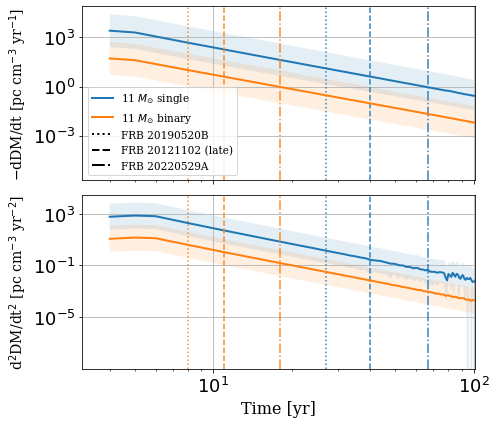

[30_single] FRB 20190520B: t_occur=27.000 yr, d2DM/dt2=1.170e+00, d2DM/dt2_est=8.306e-01
[30_single] FRB 20121102 (late): t_occur=42.000 yr, d2DM/dt2=2.439e-01, d2DM/dt2_est=1.719e-01
[30_single] FRB 20220529A: t_occur=74.000 yr, d2DM/dt2=1.955e-02, d2DM/dt2_est=2.226e-02
[30_binary] FRB 20190520B: t_occur=23.000 yr, d2DM/dt2=1.401e+00, d2DM/dt2_est=9.702e-01
[30_binary] FRB 20121102 (late): t_occur=35.000 yr, d2DM/dt2=2.906e-01, d2DM/dt2_est=2.090e-01
[30_binary] FRB 20220529A: t_occur=61.000 yr, d2DM/dt2=4.002e-02, d2DM/dt2_est=2.715e-02


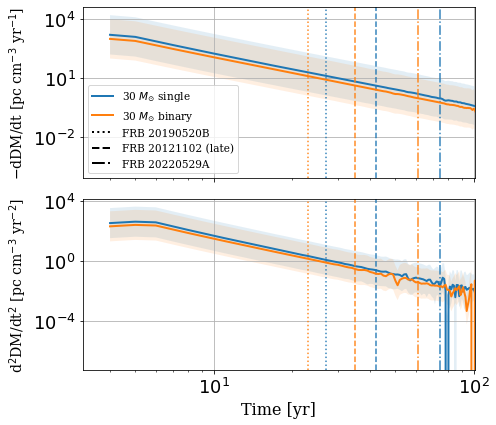

In [18]:
# --- dDM/dt and d2DM/dt2 (Full) ---
d_dm_FRB20190520B = 12.4  # pc cm^-3 yr^-1
d_dm_FRB20121102_early = -0.86
d_dm_FRB20121102_late = 3.93  # use magnitude for -dDM/dt
d_dm_obs_20220529A = 0.881
frb_times = {}

for m in masses:
    fig, axes = plt.subplots(2, 1, figsize=(7, 6), sharex=True)

    for model, c in [("single", "#1f77b4"), ("binary", "#ff7f0e")]:
        key = f"{m}_{model}"
        if key not in all_results_full_series:
            continue

        t = np.asarray(all_results_full_series[key]["time"], dtype=float)
        dm = np.asarray(all_results_full_series[key]["dm"], dtype=float)
        if len(t) < 3:
            continue

        order = np.argsort(t)
        t = t[order]
        dm = dm[order]

        d_dm = np.gradient(dm, t)
        d2_dm = np.gradient(d_dm, t)

        # FRB 20190520B match
        idx_90520 = np.argmin(np.abs(-d_dm - d_dm_FRB20190520B))
        t_90520 = t[idx_90520]

        # FRB 20121102 early/late matches
        idx_121102_e = np.argmin(np.abs(-d_dm - d_dm_FRB20121102_early))
        idx_121102_l = np.argmin(np.abs(-d_dm - d_dm_FRB20121102_late))
        t_121102_e = t[idx_121102_e]
        t_121102_l = t[idx_121102_l]
        
        idx_220529A = np.argmin(np.abs(-d_dm - d_dm_FRB20220529A))
        t_220529A = t[idx_220529A]
        # unified storage
        frb_times[f"{key}_FRB20190520B"] = t_90520
        frb_times[f"{key}_FRB20121102_early"] = t_121102_e
        frb_times[f"{key}_FRB20121102_late"] = t_121102_l
        frb_times[f"{key}_FRB20220529A"] = t_220529A
        
        axes[0].plot(t, -d_dm, lw=2.0, color=c, label=f"{m} $M_{{\\odot}}$ {model}")
        axes[1].plot(t, d2_dm, lw=2.0, color=c, label=f"{m} $M_{{\\odot}}$ {model}")

        # vertical lines (different styles)
        axes[0].axvline(x=t_90520, c=c, ls=":", alpha=0.9)
        #axes[0].axvline(x=t_121102_e, c=c, ls="-.", alpha=0.9, label="FRB 20121102 (early)")
        axes[0].axvline(x=t_121102_l, c=c, ls="--", alpha=0.9)
        axes[0].axvline(x=t_220529A, c=c, ls="-.", alpha=0.9)
        
        axes[1].axvline(x=t_90520, c=c, ls=":", alpha=0.9)
        #axes[1].axvline(x=t_121102_e, c=c, ls="-", alpha=0.9)
        axes[1].axvline(x=t_121102_l, c=c, ls="--", alpha=0.9)
        axes[1].axvline(x=t_220529A, c=c, ls="-.", alpha=0.9)

        if (not unshock_sim_setting) and ("dm_lower" in all_results_full_series[key]) and ("dm_upper" in all_results_full_series[key]):
            dm_lower = np.asarray(all_results_full_series[key]["dm_lower"], dtype=float)[order]
            dm_upper = np.asarray(all_results_full_series[key]["dm_upper"], dtype=float)[order]

            d_dm_lower = np.gradient(dm_lower, t)
            d_dm_upper = np.gradient(dm_upper, t)
            d2_dm_lower = np.gradient(d_dm_lower, t)
            d2_dm_upper = np.gradient(d_dm_upper, t)

            axes[0].fill_between(t, -d_dm_upper, -d_dm_lower, color=c, alpha=0.12, linewidth=0)
            axes[1].fill_between(t, d2_dm_lower, d2_dm_upper, color=c, alpha=0.12, linewidth=0)
            # --- extra diagnostics (t_occur, d2DM/dt2, and Niu+2025 estimate) ---
        alpha_map = {
            "11_single": -1.94,
            "11_binary": -1.93,
            "30_single": -1.83,
            "30_binary": -1.84,
        }
        alpha = alpha_map.get(key, np.nan)

        # FRB 20190520B
        d_dm_obs_90520 = -d_dm[idx_90520]
        d2_dm_obs_90520 = d2_dm[idx_90520]
        d2_dm_est_90520 = np.nan
        if np.isfinite(alpha) and t_90520 > 0:
            d2_dm_est_90520 = np.abs(alpha) * np.abs(d_dm_obs_90520) / t_90520

        print(
            f"[{key}] FRB 20190520B: t_occur={t_90520:.3f} yr, "
            f"d2DM/dt2={d2_dm_obs_90520:.3e}, "
            f"d2DM/dt2_est={d2_dm_est_90520:.3e}"
        )

        # FRB 20121102 (late)
        d_dm_obs_121102_l = -d_dm[idx_121102_l]
        d2_dm_obs_121102_l = d2_dm[idx_121102_l]
        d2_dm_est_121102_l = np.nan
        if np.isfinite(alpha) and t_121102_l > 0:
            d2_dm_est_121102_l = np.abs(alpha) * np.abs(d_dm_obs_121102_l) / t_121102_l

        print(
            f"[{key}] FRB 20121102 (late): t_occur={t_121102_l:.3f} yr, "
            f"d2DM/dt2={d2_dm_obs_121102_l:.3e}, "
            f"d2DM/dt2_est={d2_dm_est_121102_l:.3e}"
        )
        
        # FRB 20220529A 
        d_dm_obs_20220529A  = -d_dm[idx_220529A]
        d2_dm_obs_220529A = d2_dm[idx_220529A]
        d2_dm_est_220529A = np.nan
        if np.isfinite(alpha) and t_220529A > 0:
            d2_dm_est_220529A = np.abs(alpha) * np.abs(d_dm_obs_220529A) / t_220529A

        print(
            f"[{key}] FRB 20220529A: t_occur={t_220529A:.3f} yr, "
            f"d2DM/dt2={d2_dm_obs_220529A:.3e}, "
            f"d2DM/dt2_est={d2_dm_est_220529A:.3e}"
        )
    axes[0].set_ylabel(r"$-$dDM/dt [pc cm$^{-3}$ yr$^{-1}$]", **font_label_xsmall)
    axes[1].set_ylabel(r"d$^2$DM/dt$^2$ [pc cm$^{-3}$ yr$^{-2}$]", **font_label_xsmall)
    axes[1].set_xlabel("Time [yr]", **font_label_small)

    for ax in axes:
        ax.grid(True)
        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_xlim(right=101)
        ax.tick_params(labelsize=tick_size)
        frb_handles = [
            Line2D([0], [0], color="k", ls=":",  lw=2, label="FRB 20190520B"),
            Line2D([0], [0], color="k", ls="--", lw=2, label="FRB 20121102 (late)"),
            Line2D([0], [0], color="k", ls="-.", lw=2, label="FRB 20220529A")
        ]

    handles, labels = axes[0].get_legend_handles_labels()
    axes[0].legend(handles + frb_handles, labels + [h.get_label() for h in frb_handles],
                   prop={'family': 'serif', 'size': 10.5}, loc="best")

    plt.tight_layout()
    plt.savefig(f"dDM_full_{m}_single_binary.png", dpi=150)
    plt.show()



In [40]:
font_legend_xxsmall

{'family': 'serif', 'size': 11}

# RM evolution

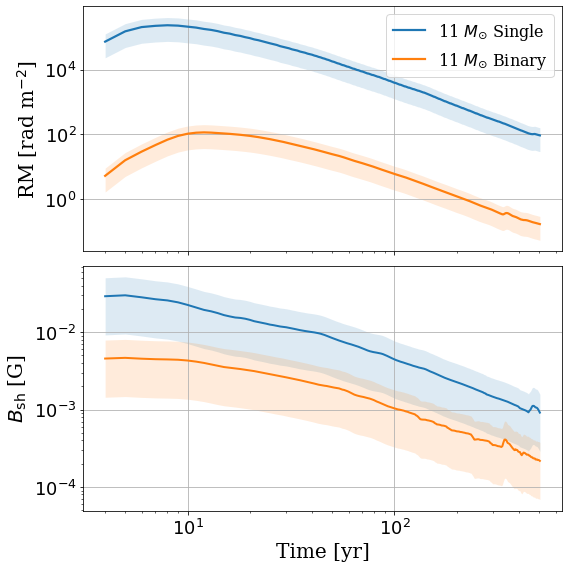

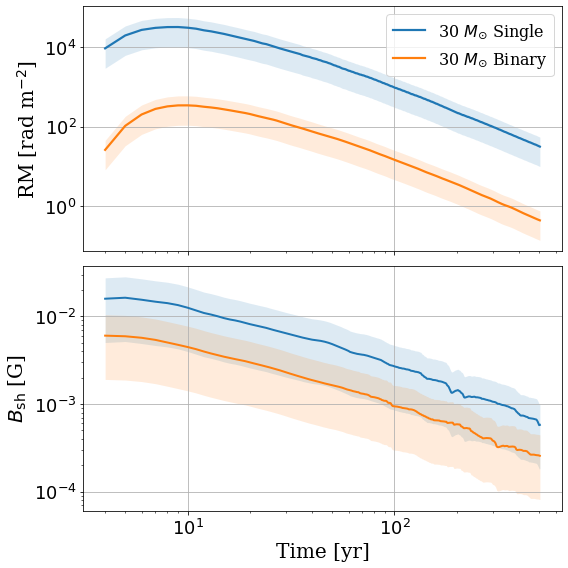

In [21]:
for m in masses:
    fig, axes = plt.subplots(2, 1, figsize=(8, 8), sharex=True)

    for model, c in [("single", "#1f77b4"), ("binary", "#ff7f0e")]:
        key = f"{m}_{model}"
        if key not in all_results_full_series:
            continue
        res = all_results_full_series[key]
        t = res["time"]

        rm = res.get("rm", None)
        if rm is not None:
            axes[0].plot(t, rm, lw=2.2, color=c, label=f"{m} $M_{{\\odot}}$ {model.capitalize()}")
        if "rm_lower" in res and "rm_upper" in res:
            axes[0].fill_between(t, res["rm_lower"], res["rm_upper"], color=c, alpha=0.15, linewidth=0)

        B = res.get("B_sh", None)
        if B is not None:
            axes[1].plot(t, B, lw=2.0, color=c, label=f"{m} $M_{{\\odot}}$ {model.capitalize()}")
        if "B_sh_lower" in res and "B_sh_upper" in res:
            axes[1].fill_between(t, res["B_sh_lower"], res["B_sh_upper"], color=c, alpha=0.15, linewidth=0)

    axes[0].set_ylabel(r"RM [rad m$^{-2}$]", **font_label)
    axes[1].set_ylabel(r"$B_{\rm sh}$ [G]", **font_label)
    axes[1].set_xlabel("Time [yr]", **font_label)

    for ax in axes:
        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.grid(True)
        ax.tick_params(labelsize=tick_size)

    axes[0].legend(prop=font_legend)
    plt.tight_layout()
    plt.savefig(f"RM_B_vs_time_{m}.png", dpi=150)
    plt.show()


[OBS] N_total = 21, N_used = 20
[OBS] s_obs(decay-fit) = -0.3597
[OBS] RM_med = 71793.50
[OBS] t_ref = 1.3134 yr


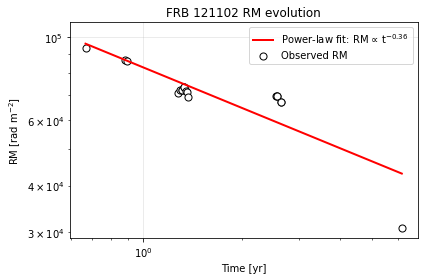


[11 Msun] s_obs=-0.3597
  near-peak match: t0=9.535 yr, s_sim=-0.3638
  decay match    : t0=nan yr, s_sim=nan


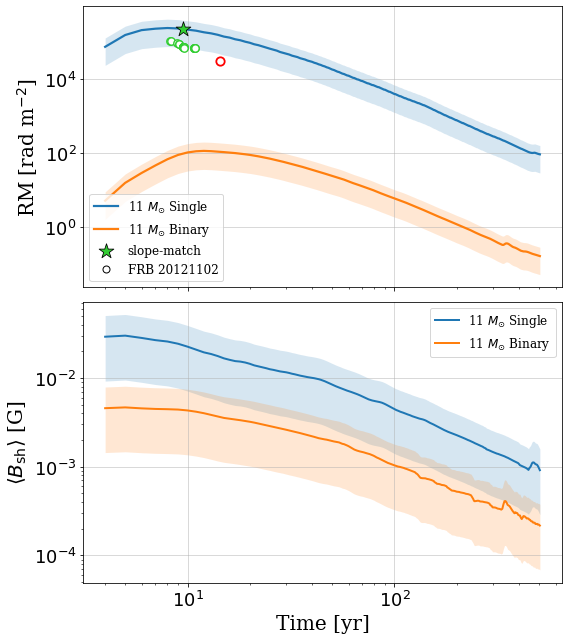


[30 Msun] s_obs=-0.3597
  near-peak match: t0=9.993 yr, s_sim=-0.3598
  decay match    : t0=nan yr, s_sim=nan


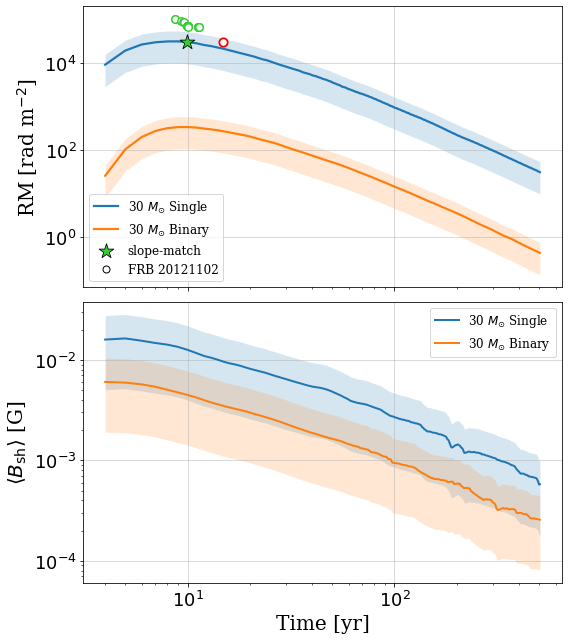


Done.


In [26]:
import numpy as np
import matplotlib.pyplot as plt

color_map = {"single": "#1f77b4", "binary": "#ff7f0e"}

# ============================================================
# 1) Hilmarsson+2021 RM data
# ============================================================
mjd_full = np.array([
    57747.12956,
    57748.12564,
    57772.12903030,
    57991.58013,
    58069.31853200,
    58075.20058018,
    58215.86332798,
    58222.85751812,
    58227.83201090,
    58228.63801964,
    58234.81180934,
    58234.81642918,
    58243.77965432,
    58244.77641721,
    58247.81273381,
    58677.60475978,
    58684.58367814,
    58684.58990897,
    58712.47972031,
    58712.48531398
], dtype=float)

rm_full = np.array([
    102708,
    102521,
    103039,
    93573,
    86678,
    86518,
    70841,
    72090,
    72062,
    72248,
    73514,
    73358,
    71525,
    71158,
    68937,
    69375,
    69524,
    69408,
    66949,
    67033
], dtype=float)

# ============================================================
# 2) Wang+2025 new RM point
# ============================================================
mjd_wang = np.array([60006.509722222], dtype=float)
rm_wang  = np.array([30755.0], dtype=float)

idx_wang = np.argsort(mjd_wang)
mjd_wang = mjd_wang[idx_wang]
rm_wang  = rm_wang[idx_wang]
t_wang_yr = (mjd_wang - mjd_full[0]) / 365.25
# ============================================================
# 3) Merge Hilmarsson + Wang
# ============================================================
mjd_all = np.concatenate([mjd_full, mjd_wang])
rm_all  = np.concatenate([rm_full, rm_wang])

# sort by time
idx_all = np.argsort(mjd_all)
mjd_all = mjd_all[idx_all]
rm_all  = rm_all[idx_all]

# ============================================================
# 4) Remove the first plateau point
#    如果你确实想删掉最早的 plateau 点，就用 [1:]
# ============================================================
mjd_obs = mjd_all[1:]
rm_obs  = rm_all[1:]

# use the first remaining point as time zero
t_obs_yr = (mjd_obs - mjd_obs[0]) / 365.25

# ============================================================
# 5) Observed decay slope: log10(RM) vs log10(t)
# ============================================================
def obs_decay_slope(t, rm):
    """
    Fit the post-peak decay slope in log10(RM)-log10(t) space.
    Returns s where RM ~ t^s
    """
    t = np.asarray(t, dtype=float)
    rm = np.asarray(rm, dtype=float)

    # valid points only
    mask = np.isfinite(t) & np.isfinite(rm) & (t > 0) & (rm > 0)
    t = t[mask]
    rm = rm[mask]

    if len(t) < 4:
        return np.nan

    # find peak in RM
    i_peak = np.argmax(rm)

    # need enough points after the peak
    if i_peak >= len(t) - 3:
        return np.nan

    x = np.log10(t[i_peak + 1:])
    y = np.log10(rm[i_peak + 1:])

    s, intercept = np.polyfit(x, y, 1)
    return s

# ============================================================
# 6) Compute quantities
# ============================================================
s_obs = obs_decay_slope(t_obs_yr, rm_obs)

rm_med = float(np.median(rm_obs))
i_ref = int(np.argmin(np.abs(rm_obs - rm_med)))
t_ref = float(t_obs_yr[i_ref])

print(f"[OBS] N_total = {len(rm_all)}, N_used = {len(rm_obs)}")
print(f"[OBS] s_obs(decay-fit) = {s_obs:.4f}")
print(f"[OBS] RM_med = {rm_med:.2f}")
print(f"[OBS] t_ref = {t_ref:.4f} yr")

# ============================================================
# 7) Quick diagnostic plot with fitted curve
# ============================================================
# --- compute the fit again to obtain intercept ---
mask = (t_obs_yr > 0) & (rm_obs > 0)
t_fit = t_obs_yr[mask]
rm_fit = rm_obs[mask]

i_peak = np.argmax(rm_fit)

x = np.log10(t_fit[i_peak+1:])
y = np.log10(rm_fit[i_peak+1:])

s_fit, b_fit = np.polyfit(x, y, 1)

# --- smooth curve for plotting ---
t_line = np.logspace(np.log10(min(t_fit[i_peak+1:])),
                     np.log10(max(t_fit)),
                     200)

rm_line = 10**b_fit * t_line**s_fit

# --- plot ---
plt.figure(figsize=(6,4))

plt.scatter(
    t_obs_yr,
    rm_obs,
    s=50,
    facecolor="white",
    edgecolor="k",
    label="Observed RM"
)

plt.plot(
    t_line,
    rm_line,
    color="red",
    linewidth=2,
    label=f"Power-law fit: RM ∝ t$^{{{s_fit:.2f}}}$"
)

plt.yscale("log")
plt.xscale("log")

plt.xlabel("Time [yr]")
plt.ylabel(r"RM [rad m$^{-2}$]")

plt.title("FRB 121102 RM evolution")

plt.grid(True, alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()




# -----------------------------
# B) 模拟 slope：差分 dlogRM/dlogt + 平滑
# -----------------------------
def instantaneous_slope_diff(t, rm, smooth_window=7):
    """
    Compute s(t)=dlogRM/dlogt using central differences in log-space.
    Then apply moving-average smoothing to s(t) (optional).
    Returns: t_sorted, s_smooth
    """
    t = np.asarray(t, float)
    rm = np.asarray(rm, float)

    mask = np.isfinite(t) & np.isfinite(rm) & (t > 0) & (rm > 0)
    t = t[mask]; rm = rm[mask]

    idx = np.argsort(t)
    t = t[idx]; rm = rm[idx]

    logt = np.log10(t)
    logr = np.log10(rm)

    s = np.empty_like(logt)
    # central diff
    s[1:-1] = (logr[2:] - logr[:-2]) / (logt[2:] - logt[:-2])
    # end points: forward/backward
    s[0] = (logr[1] - logr[0]) / (logt[1] - logt[0])
    s[-1] = (logr[-1] - logr[-2]) / (logt[-1] - logt[-2])

    # smooth s with moving average (odd window recommended)
    if smooth_window is not None and smooth_window >= 3:
        w = int(smooth_window)
        if w % 2 == 0:
            w += 1
        kernel = np.ones(w) / w
        s_smooth = np.convolve(s, kernel, mode="same")
    else:
        s_smooth = s
    return t, s_smooth

def interp_loglog(t_grid, y_grid, t_query):
    """
    Log-log interpolation y(t) using linear interpolation in log10 space.
    """
    t_grid = np.asarray(t_grid, float)
    y_grid = np.asarray(y_grid, float)
    t_query = np.asarray(t_query, float)

    mask = np.isfinite(t_grid) & np.isfinite(y_grid) & (t_grid > 0) & (y_grid > 0)
    t = t_grid[mask]; y = y_grid[mask]
    idx = np.argsort(t)
    t = t[idx]; y = y[idx]

    x = np.log10(t)
    yy = np.log10(y)

    xq = np.log10(np.clip(t_query, t.min(), t.max()))
    yq = np.interp(xq, x, yy)
    return 10**yq

# -----------------------------
# C) 在 s(t) 中找两处解：near-peak & decay
# -----------------------------
def find_two_slope_matches(t_sim, rm_sim, s_target, tmin=3.0,
                           smooth_window=7,
                           peak_band_dex=0.12,   # near-peak window: |log10(t/t_peak)| < peak_band_dex
                           decay_start_dex=0.12  # decay window starts at log10(t/t_peak) > decay_start_dex
                          ):
    """
    Find two times t0 where s_sim(t) ~ s_target:
      (1) near-peak "smooth/plateau" region around t_peak
      (2) post-peak decay region

    Uses zero-crossings of g(t)=s(t)-s_target with linear interpolation.
    """
    t = np.asarray(t_sim, float)
    rm = np.asarray(rm_sim, float)

    # restrict to valid + t>=tmin
    m = np.isfinite(t) & np.isfinite(rm) & (t >= tmin) & (rm > 0)
    t = t[m]; rm = rm[m]
    if t.size < 10:
        return (np.nan, np.nan), (np.nan, np.nan)

    # peak time (from RM itself)
    idx = np.argsort(t)
    t = t[idx]; rm = rm[idx]
    t_peak = float(t[np.argmax(rm)])

    # compute slope(t)
    t_s, s_s = instantaneous_slope_diff(t, rm, smooth_window=smooth_window)

    # g(t) = s(t) - s_target
    g = s_s - s_target

    # find sign changes (zero crossings)
    crosses = []
    for i in range(len(t_s) - 1):
        g1, g2 = g[i], g[i+1]
        if not (np.isfinite(g1) and np.isfinite(g2)):
            continue
        if g1 == 0:
            crosses.append(float(t_s[i]))
        elif g1 * g2 < 0:
            # linear interpolate in t (adequate because we already smoothed s)
            ti, tj = t_s[i], t_s[i+1]
            tc = ti + (0 - g1) * (tj - ti) / (g2 - g1)
            crosses.append(float(tc))

    if len(crosses) == 0:
        return (np.nan, np.nan), (np.nan, np.nan)

    crosses = np.array(sorted(crosses))

    # classify into near-peak and decay
    log_ratio = np.log10(crosses / t_peak)

    near_mask = np.abs(log_ratio) <= peak_band_dex
    decay_mask = log_ratio >= decay_start_dex

    # choose one near-peak (closest to t_peak) and one decay (first after decay_start or closest)
    t0_near = np.nan
    t0_decay = np.nan

    if np.any(near_mask):
        cand = crosses[near_mask]
        t0_near = float(cand[np.argmin(np.abs(np.log10(cand / t_peak)))])
    if np.any(decay_mask):
        cand = crosses[decay_mask]
        # 你可以选“最早进入衰减段的那个”，或“最接近 s_target 的那个”
        # 这里选最早的衰减段交点（更符合“进入 decay 的位置”）
        t0_decay = float(cand[0])

    # compute slopes at those times by interpolating s(t)
    # interpolate s(t) on fine grid in logt
    def interp_s(tq):
        # linear interp on logt
        x = np.log10(t_s)
        y = s_s
        xq = np.log10(np.clip(tq, t_s.min(), t_s.max()))
        return float(np.interp(xq, x, y))

    s_near = interp_s(t0_near) if np.isfinite(t0_near) else np.nan
    s_decay = interp_s(t0_decay) if np.isfinite(t0_decay) else np.nan

    return (t0_near, s_near), (t0_decay, s_decay)

def map_obs_times_linear(t_obs, rm_obs, t0_anchor, t_ref, tmin=None, tmax=None):
    """
    Map times linearly: t_mapped = t0_anchor + (t_obs - t_ref)
    Keep RM values unchanged.
    Optionally clip times into [tmin, tmax] for plotting range.
    """
    t_mapped = t0_anchor + (t_obs - t_ref)
    if (tmin is not None) or (tmax is not None):
        if tmin is None: tmin = np.min(t_mapped)
        if tmax is None: tmax = np.max(t_mapped)
        t_mapped = np.clip(t_mapped, tmin, tmax)
    return t_mapped, np.asarray(rm_obs, float)

# =============================
# E) 主绘图：两颗星 + 两组点（可选）
# =============================
SIM_TMIN = 3.0
SMOOTH_WINDOW = 7

star_near_color = "limegreen"
star_decay_color = "crimson"
for m in masses:
    fig, (ax_rm, ax_b) = plt.subplots(2, 1, figsize=(8, 9), sharex=True)

    # --- plot sim curves + bands ---
    for model, color in [("single", "#1f77b4"), ("binary", "#ff7f0e")]:
        key = f"{m}_{model}"
        if key not in all_results_full_series:
            continue
        res = all_results_full_series[key]
        t_sim = np.asarray(res["time"], float)
        rm_sim = np.asarray(res["rm"], float)

        ax_rm.plot(t_sim, rm_sim, lw=2.2, color=color,
                   label=f"{m} $M_{{\\odot}}$ {model.capitalize()}")

        if ("rm_lower" in res) and ("rm_upper" in res):
            ax_rm.fill_between(t_sim,
                               np.asarray(res["rm_lower"], float),
                               np.asarray(res["rm_upper"], float),
                               color=color, alpha=0.18, linewidth=0)

        # --- B-field panel ---
        if "B_sh" in res:
            b_sim = np.asarray(res["B_sh"], float)
            ax_b.plot(t_sim, b_sim, lw=2.0, color=color,
                      label=f"{m} $M_{{\\odot}}$ {model.capitalize()}")

            if ("B_sh_lower" in res) and ("B_sh_upper" in res):
                ax_b.fill_between(t_sim,
                                  np.asarray(res["B_sh_lower"], float),
                                  np.asarray(res["B_sh_upper"], float),
                                  color=color, alpha=0.18, linewidth=0)

    # --- we use SINGLE band for placing points ---
    keyS = f"{m}_single"
    if keyS not in all_results_full_series:
        plt.show()
        continue
    resS = all_results_full_series[keyS]
    tS = np.asarray(resS["time"], float)
    rmS = np.asarray(resS["rm"], float)

    if ("rm_lower" not in resS) or ("rm_upper" not in resS):
        print(f"[WARN] {keyS} has no rm_lower/rm_upper; cannot place points inside band reliably.")
        plt.show()
        continue

    rm_lo = np.asarray(resS["rm_lower"], float)
    rm_hi = np.asarray(resS["rm_upper"], float)

    # --- find two slope matches ---
    (t0_near, s_near), (t0_decay, s_decay) = find_two_slope_matches(
        tS, rmS, s_obs,
        tmin=SIM_TMIN,
        smooth_window=SMOOTH_WINDOW,
        peak_band_dex=0.12,
        decay_start_dex=0.12
    )

    print(f"\n[{m} Msun] s_obs={s_obs:.4f}")
    print(f"  near-peak match: t0={t0_near:.3f} yr, s_sim={s_near:.4f}")
    print(f"  decay match    : t0={t0_decay:.3f} yr, s_sim={s_decay:.4f}")

    # --- mark two stars (on fiducial single curve) ---
    if np.isfinite(t0_near):
        rm0_near = interp_loglog(tS, rmS, np.array([t0_near]))[0]
        ax_rm.scatter(t0_near, rm0_near, marker="*", s=240, color=star_near_color,
                      edgecolor="k", linewidth=0.8, zorder=8,
                      label="slope-match")
    if np.isfinite(t0_decay):
        rm0_decay = interp_loglog(tS, rmS, np.array([t0_decay]))[0]
        # ax_rm.scatter(t0_decay, rm0_decay, marker="*", s=240, color=star_decay_color,
        #               edgecolor="k", linewidth=0.8, zorder=8,
        #               label="slope-match (decay)")

    # --- map & place points INSIDE the SINGLE band for each anchor ---
    if np.isfinite(t0_near):
        t_map1, y1 = map_obs_times_linear(t_obs_yr, rm_obs, t0_near, t_ref,
                                          tmin=np.min(tS), tmax=np.max(tS))
        ax_rm.scatter(t_map1, y1, s=55, marker="o",
                      facecolor="white", edgecolor="limegreen", linewidth=1.4,
                      zorder=11)  #FRB20121102 (Hilmarsson+2021)
    if np.isfinite(t0_near):
        t_map_wang, y_wang = map_obs_times_linear(t_wang_yr, rm_wang, t0_near, t_ref,
                                                  tmin=np.min(tS), tmax=np.max(tS))
        ax_rm.scatter(t_map_wang, y_wang, s=70, marker="o",
                      facecolor="white", edgecolor="red", linewidth=1.8,
                      zorder=12) #FRB20121102 (Wang+2025)
        
    if np.isfinite(t0_decay):
        t_map2, y2 = map_obs_times_linear(t_obs_yr, rm_obs, t0_decay, t_ref,
                                          tmin=np.min(tS), tmax=np.max(tS))
        # ax_rm.scatter(t_map2, y2, s=55, marker="o",
        #               facecolor="white", edgecolor="crimson", linewidth=1.4,
        #               zorder=11, label="FRB121102 (mapped @ decay)")
    
    # cosmetics
    ax_rm.set_ylabel(r"RM [rad m$^{-2}$]", **font_label)
    ax_rm.set_xscale("log")
    ax_rm.set_yscale("log")
    ax_rm.tick_params(labelsize=tick_size)
    ax_rm.grid(True, alpha=0.6)
    frb_handle = Line2D(
    [0], [0],
    marker='o',
    color='none',
    markerfacecolor='white',
    markeredgecolor='k',
    markersize=7,
    linewidth=0,
    label='FRB 20121102')
    handles, labels = ax_rm.get_legend_handles_labels()
    handles.append(frb_handle)
    labels.append("FRB 20121102")
    ax_rm.legend(handles, labels, loc="lower left", frameon=True, prop=font_legend_xsmall)
    
    ax_b.set_xlabel("Time [yr]", **font_label)
    ax_b.set_ylabel(r"$\langle B_{\rm sh}\rangle$ [G]", **font_label)
    ax_b.set_xscale("log")
    ax_b.set_yscale("log")
    ax_b.tick_params(labelsize=tick_size)
    ax_b.grid(True, alpha=0.6)
    ax_b.legend(loc="best", frameon=True, prop=font_legend_xsmall)
    
    plt.tight_layout()
    plt.savefig(f"RM_vs_time_{m}_two_slope_matches_with_B.png", dpi=200)
    plt.show()

print("\nDone.")


# Save DM and RM data products for Zenodo

In [27]:
# =========================
# Save DM and RM data products for Zenodo
# =========================
import os
import json
import numpy as np
import pandas as pd

SAVE_DIR = "/root/jupyter_notebook/user_work/Data/SNR_work/zenodo_DM_RM_data"
os.makedirs(SAVE_DIR, exist_ok=True)

dm_rows = []
rm_rows = []

for key, res in all_results_full_series.items():

    # key format: "11_single", "30_binary", etc.
    mass_str, model = key.split("_")
    mass = int(mass_str)

    t = np.asarray(res["time"], dtype=float)
    order = np.argsort(t)
    t = t[order]

    # =========================
    # DM data
    # =========================
    dm_full = np.asarray(res.get("dm", np.full_like(t, np.nan)), dtype=float)[order]
    dm_sh = np.asarray(res.get("dm_sh", np.full_like(t, np.nan)), dtype=float)[order]
    dm_unsh = np.asarray(res.get("dm_unsh", np.full_like(t, np.nan)), dtype=float)[order]
    dm_csm = np.asarray(res.get("dm_csm", np.full_like(t, np.nan)), dtype=float)[order]

    dm_lower = np.asarray(res.get("dm_lower", np.full_like(t, np.nan)), dtype=float)[order]
    dm_upper = np.asarray(res.get("dm_upper", np.full_like(t, np.nan)), dtype=float)[order]

    dm_unsh_lower = np.asarray(res.get("dm_unsh_lower", np.full_like(t, np.nan)), dtype=float)[order]
    dm_unsh_upper = np.asarray(res.get("dm_unsh_upper", np.full_like(t, np.nan)), dtype=float)[order]

    dm_csm_lower = np.asarray(res.get("dm_csm_lower", np.full_like(t, np.nan)), dtype=float)[order]
    dm_csm_upper = np.asarray(res.get("dm_csm_upper", np.full_like(t, np.nan)), dtype=float)[order]

    ne_avg = np.asarray(res.get("ne_avg", np.full_like(t, np.nan)), dtype=float)[order]
    len_full = np.asarray(res.get("len_full", np.full_like(t, np.nan)), dtype=float)[order]
    len_sh = np.asarray(res.get("len_sh", np.full_like(t, np.nan)), dtype=float)[order]
    len_unsh = np.asarray(res.get("len_unsh", np.full_like(t, np.nan)), dtype=float)[order]
    len_csm = np.asarray(res.get("len_csm", np.full_like(t, np.nan)), dtype=float)[order]
    delta_re = np.asarray(res.get("delta_re", np.full_like(t, np.nan)), dtype=float)[order]

    # derivatives used in dDM/dt figure
    if len(t) >= 3:
        dDM_dt = np.gradient(dm_full, t)
        d2DM_dt2 = np.gradient(dDM_dt, t)

        if np.all(np.isfinite(dm_lower)):
            dDM_dt_lower = np.gradient(dm_lower, t)
            d2DM_dt2_lower = np.gradient(dDM_dt_lower, t)
        else:
            dDM_dt_lower = np.full_like(t, np.nan)
            d2DM_dt2_lower = np.full_like(t, np.nan)

        if np.all(np.isfinite(dm_upper)):
            dDM_dt_upper = np.gradient(dm_upper, t)
            d2DM_dt2_upper = np.gradient(dDM_dt_upper, t)
        else:
            dDM_dt_upper = np.full_like(t, np.nan)
            d2DM_dt2_upper = np.full_like(t, np.nan)
    else:
        dDM_dt = np.full_like(t, np.nan)
        d2DM_dt2 = np.full_like(t, np.nan)
        dDM_dt_lower = np.full_like(t, np.nan)
        dDM_dt_upper = np.full_like(t, np.nan)
        d2DM_dt2_lower = np.full_like(t, np.nan)
        d2DM_dt2_upper = np.full_like(t, np.nan)

    for i in range(len(t)):
        dm_rows.append({
            "mass_Msun": mass,
            "model": model,
            "time_yr": t[i],

            "DM_full_pc_cm3": dm_full[i],
            "DM_shocked_pc_cm3": dm_sh[i],
            "DM_unshocked_ejecta_pc_cm3": dm_unsh[i],
            "DM_unshocked_CSM_pc_cm3": dm_csm[i],

            "DM_full_lower_pc_cm3": dm_lower[i],
            "DM_full_upper_pc_cm3": dm_upper[i],
            "DM_unshocked_ejecta_lower_pc_cm3": dm_unsh_lower[i],
            "DM_unshocked_ejecta_upper_pc_cm3": dm_unsh_upper[i],
            "DM_unshocked_CSM_lower_pc_cm3": dm_csm_lower[i],
            "DM_unshocked_CSM_upper_pc_cm3": dm_csm_upper[i],

            "minus_dDM_dt_pc_cm3_yr": -dDM_dt[i],
            "minus_dDM_dt_lower_pc_cm3_yr": -dDM_dt_upper[i],
            "minus_dDM_dt_upper_pc_cm3_yr": -dDM_dt_lower[i],
            "d2DM_dt2_pc_cm3_yr2": d2DM_dt2[i],
            "d2DM_dt2_lower_pc_cm3_yr2": d2DM_dt2_lower[i],
            "d2DM_dt2_upper_pc_cm3_yr2": d2DM_dt2_upper[i],

            "ne_avg_cm3": ne_avg[i],
            "len_full_pc": len_full[i],
            "len_shocked_pc": len_sh[i],
            "len_unshocked_ejecta_pc": len_unsh[i],
            "len_unshocked_CSM_pc": len_csm[i],
            "delta_R_dyn_pc": delta_re[i],
        })

    # =========================
    # RM data
    # =========================
    rm = np.asarray(res.get("rm", np.full_like(t, np.nan)), dtype=float)[order]
    rm_lower = np.asarray(res.get("rm_lower", np.full_like(t, np.nan)), dtype=float)[order]
    rm_upper = np.asarray(res.get("rm_upper", np.full_like(t, np.nan)), dtype=float)[order]

    B_sh = np.asarray(res.get("B_sh", np.full_like(t, np.nan)), dtype=float)[order]
    B_sh_lower = np.asarray(res.get("B_sh_lower", np.full_like(t, np.nan)), dtype=float)[order]
    B_sh_upper = np.asarray(res.get("B_sh_upper", np.full_like(t, np.nan)), dtype=float)[order]

    for i in range(len(t)):
        rm_rows.append({
            "mass_Msun": mass,
            "model": model,
            "time_yr": t[i],

            "RM_rad_m2": rm[i],
            "RM_lower_rad_m2": rm_lower[i],
            "RM_upper_rad_m2": rm_upper[i],

            "B_shocked_G": B_sh[i],
            "B_shocked_lower_G": B_sh_lower[i],
            "B_shocked_upper_G": B_sh_upper[i],
        })


# =========================
# Save master tables
# =========================
df_dm = pd.DataFrame(dm_rows)
df_rm = pd.DataFrame(rm_rows)

dm_csv = os.path.join(SAVE_DIR, "DM_time_series_11_30Msun_single_binary.csv")
rm_csv = os.path.join(SAVE_DIR, "RM_time_series_11_30Msun_single_binary.csv")

df_dm.to_csv(dm_csv, index=False)
df_rm.to_csv(rm_csv, index=False)


# =========================
# Save separated files
# =========================
for (mass, model), sub in df_dm.groupby(["mass_Msun", "model"]):
    sub.to_csv(
        os.path.join(SAVE_DIR, f"DM_{mass}Msun_{model}.csv"),
        index=False
    )

for (mass, model), sub in df_rm.groupby(["mass_Msun", "model"]):
    sub.to_csv(
        os.path.join(SAVE_DIR, f"RM_{mass}Msun_{model}.csv"),
        index=False
    )


# =========================
# README metadata
# =========================
metadata = {
    "description": (
        "DM and RM time-series data products used for the figures in the SNR-FRB paper. "
        "The data include 11 and 30 Msun progenitors, single-star and binary-stripped channels. "
        "DM components include shocked ejecta, unshocked ejecta, unshocked CSM, and full line-of-sight values. "
        "RM is computed from the shocked region only, with lower and upper curves corresponding to different epsilon_B assumptions."
    ),
    "models": ["11_single", "11_binary", "30_single", "30_binary"],
    "DM_columns": list(df_dm.columns),
    "RM_columns": list(df_rm.columns),
    "units": {
        "time_yr": "yr",
        "DM": "pc cm^-3",
        "minus_dDM_dt": "pc cm^-3 yr^-1",
        "d2DM_dt2": "pc cm^-3 yr^-2",
        "RM": "rad m^-2",
        "B_shocked": "G",
        "length": "pc",
        "ne_avg": "cm^-3"
    },
    "notes": {
        "DM_full": "DM_shocked + DM_unshocked_ejecta + DM_unshocked_CSM",
        "minus_dDM_dt": "Stored as -dDM/dt because this is the quantity plotted in the paper.",
        "RM": "Computed from the shocked region only.",
        "RM_lower_upper": "Lower and upper RM curves correspond to different epsilon_B assumptions in the shocked region.",
        "DM_lower_upper": "Lower and upper DM curves correspond to ionization-fraction uncertainty assumptions in unshocked material."
    }
}

with open(os.path.join(SAVE_DIR, "README_DM_RM_data.json"), "w") as f:
    json.dump(metadata, f, indent=2)

print("Saved DM/RM Zenodo data to:")
print(SAVE_DIR)
print()
print("DM master table:")
print(dm_csv)
print(df_dm.head())
print()
print("RM master table:")
print(rm_csv)
print(df_rm.head())

Saved DM/RM Zenodo data to:
/root/jupyter_notebook/user_work/Data/SNR_work/zenodo_DM_RM_data

DM master table:
/root/jupyter_notebook/user_work/Data/SNR_work/zenodo_DM_RM_data/DM_time_series_11_30Msun_single_binary.csv
   mass_Msun   model  time_yr  DM_full_pc_cm3  DM_shocked_pc_cm3  \
0         11  binary      4.0      155.574571           0.001374   
1         11  binary      5.0      103.567836           0.003674   
2         11  binary      6.0       74.572569           0.006438   
3         11  binary      7.0       56.674105           0.009926   
4         11  binary      8.0       44.857624           0.014261   

   DM_unshocked_ejecta_pc_cm3  DM_unshocked_CSM_pc_cm3  DM_full_lower_pc_cm3  \
0                  152.113074                 3.460123             15.216142   
1                  100.104426                 3.459736             10.017576   
2                   71.106678                 3.459453              7.120566   
3                   53.204939                 3.4592

# Reproduce DM and RM figures from Zenodo CSV tables

Loaded DM data: /root/jupyter_notebook/user_work/Data/SNR_work/zenodo_DM_RM_data/DM_time_series_11_30Msun_single_binary.csv
Loaded RM data: /root/jupyter_notebook/user_work/Data/SNR_work/zenodo_DM_RM_data/RM_time_series_11_30Msun_single_binary.csv
   mass_Msun   model  time_yr  DM_full_pc_cm3  DM_shocked_pc_cm3  \
0         11  binary      4.0      155.574571           0.001374   
1         11  binary      5.0      103.567836           0.003674   
2         11  binary      6.0       74.572569           0.006438   
3         11  binary      7.0       56.674105           0.009926   
4         11  binary      8.0       44.857624           0.014261   

   DM_unshocked_ejecta_pc_cm3  DM_unshocked_CSM_pc_cm3  DM_full_lower_pc_cm3  \
0                  152.113074                 3.460123             15.216142   
1                  100.104426                 3.459736             10.017576   
2                   71.106678                 3.459453              7.120566   
3                   53.

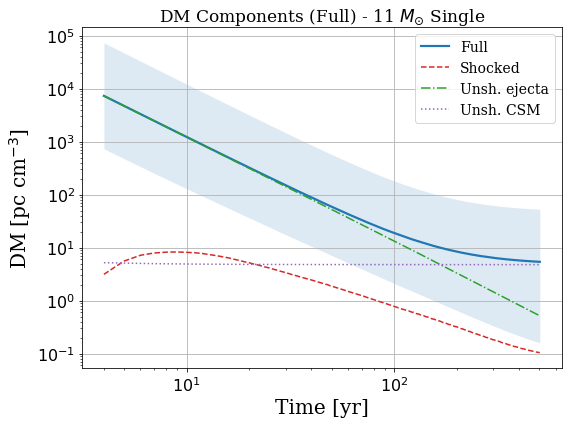

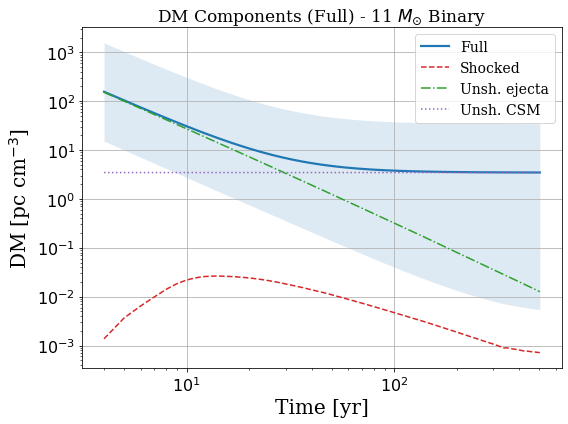

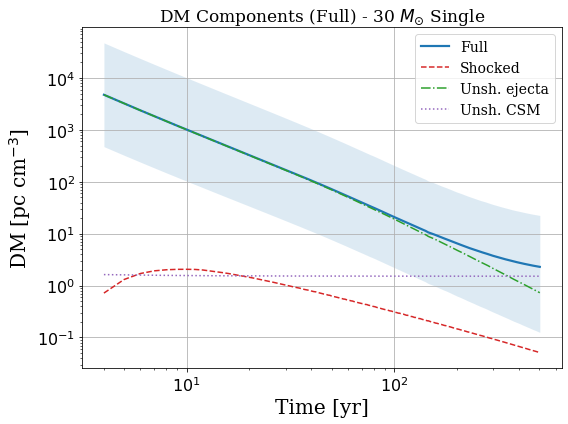

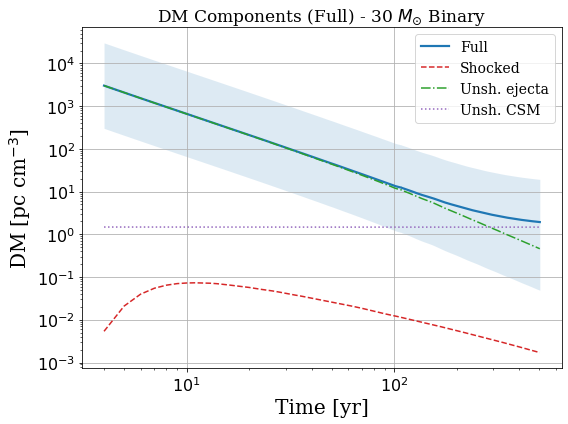

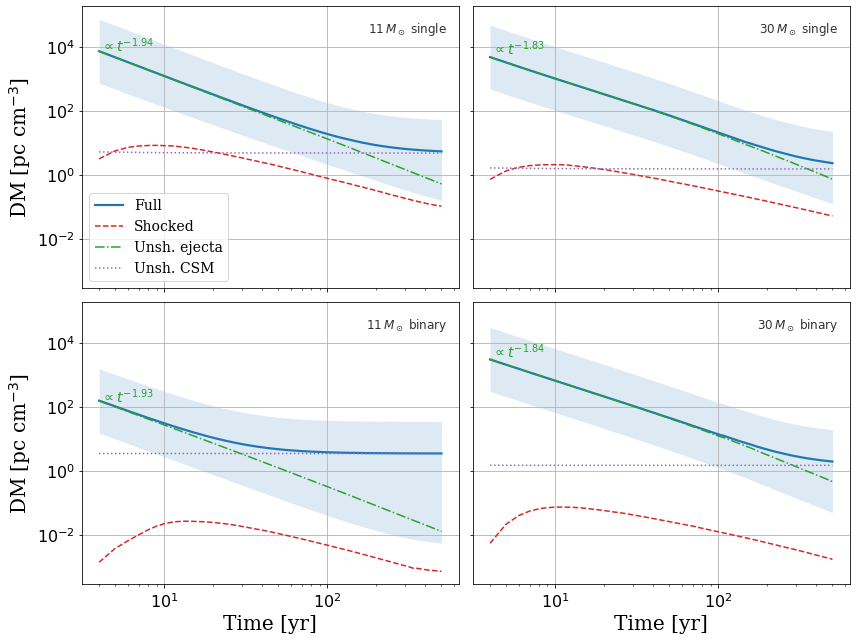

...

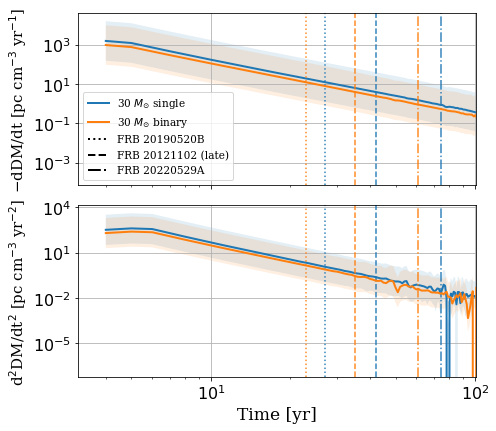

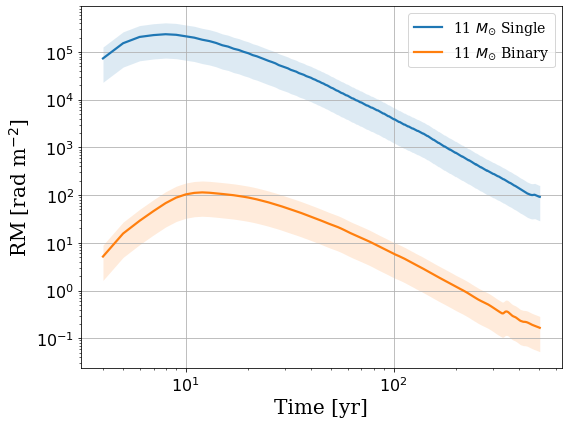

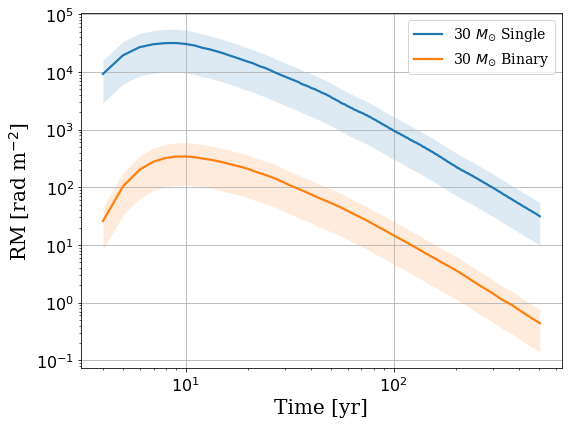

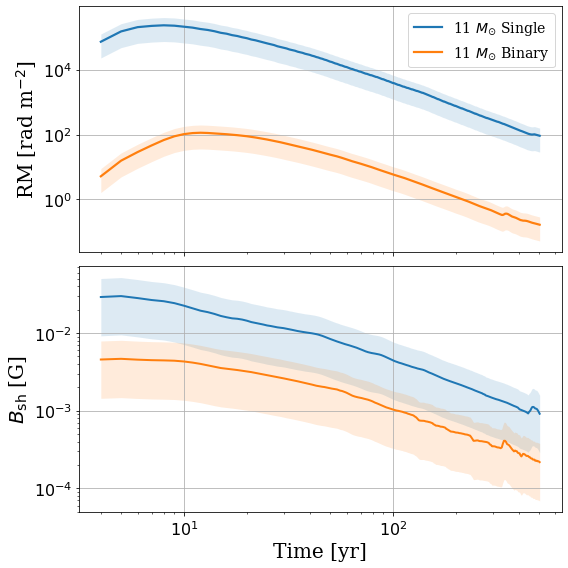

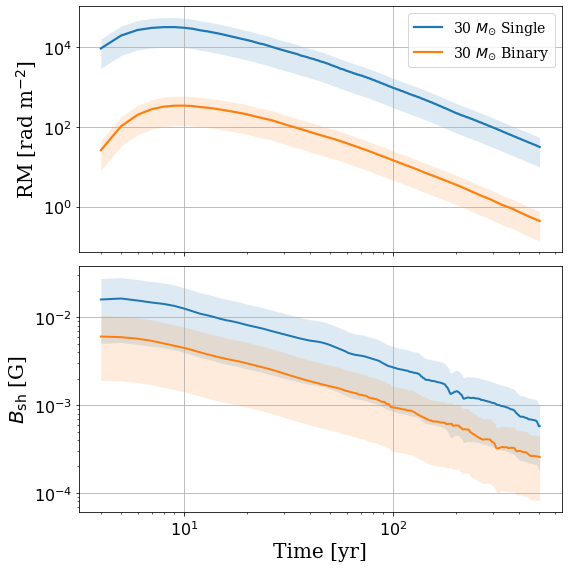

All reproduced figures were saved to:
/root/jupyter_notebook/user_work/Data/SNR_work/zenodo_DM_RM_data/reproduced_figures


In [30]:
# ============================================================
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D


# ============================================================
# Paths
# ============================================================

DATA_DIR = "/root/jupyter_notebook/user_work/Data/SNR_work/zenodo_DM_RM_data"

DM_CSV = os.path.join(DATA_DIR, "DM_time_series_11_30Msun_single_binary.csv")
RM_CSV = os.path.join(DATA_DIR, "RM_time_series_11_30Msun_single_binary.csv")

FIG_DIR = os.path.join(DATA_DIR, "reproduced_figures")
os.makedirs(FIG_DIR, exist_ok=True)


# ============================================================
# Read data
# ============================================================

df_dm = pd.read_csv(DM_CSV)
df_rm = pd.read_csv(RM_CSV)

print("Loaded DM data:", DM_CSV)
print("Loaded RM data:", RM_CSV)
print(df_dm.head())
print(df_rm.head())


# ============================================================
# Plot style
# ============================================================

masses = [11, 30]
models = ["single", "binary"]

font_label = {"family": "serif", "size": 20}
font_label_small = {"family": "serif", "size": 17}
font_label_xsmall = {"family": "serif", "size": 15}

font_legend = {"family": "serif", "size": 14}
font_legend_small = {"family": "serif", "size": 12}
font_legend_xsmall = {"family": "serif", "size": 11}
font_legend_xxsmall = {"family": "serif", "size": 10.5}

tick_size = 16

model_colors = {
    "single": "#1f77b4",
    "binary": "#ff7f0e",
}

comp_colors = {
    "Shock": "#d62728",
    "Unshocked": "#2ca02c",
    "CSM": "#9467bd",
    "Full": "#1f77b4",
}


def get_dm_sub(mass, model):
    sub = df_dm[
        (df_dm["mass_Msun"] == mass)
        & (df_dm["model"] == model)
    ].copy()
    return sub.sort_values("time_yr")


def get_rm_sub(mass, model):
    sub = df_rm[
        (df_rm["mass_Msun"] == mass)
        & (df_rm["model"] == model)
    ].copy()
    return sub.sort_values("time_yr")


# ============================================================
# 1. DM components, individual panels
# ============================================================

for m in masses:
    for model in models:

        sub = get_dm_sub(m, model)
        if sub.empty:
            continue

        t = sub["time_yr"].to_numpy()

        plt.figure(figsize=(8, 6))

        plt.plot(
            t,
            sub["DM_full_pc_cm3"],
            label="Full",
            lw=2.2,
            color=comp_colors["Full"],
        )

        plt.plot(
            t,
            sub["DM_shocked_pc_cm3"],
            label="Shocked",
            ls="--",
            color=comp_colors["Shock"],
        )

        plt.plot(
            t,
            sub["DM_unshocked_ejecta_pc_cm3"],
            label="Unsh. ejecta",
            ls="-.",
            color=comp_colors["Unshocked"],
        )

        plt.plot(
            t,
            sub["DM_unshocked_CSM_pc_cm3"],
            label="Unsh. CSM",
            ls=":",
            color=comp_colors["CSM"],
        )

        if (
            "DM_full_lower_pc_cm3" in sub.columns
            and "DM_full_upper_pc_cm3" in sub.columns
            and np.any(np.isfinite(sub["DM_full_lower_pc_cm3"]))
        ):
            plt.fill_between(
                t,
                sub["DM_full_lower_pc_cm3"],
                sub["DM_full_upper_pc_cm3"],
                color=comp_colors["Full"],
                alpha=0.15,
                linewidth=0,
            )

        plt.xlabel("Time [yr]", **font_label)
        plt.ylabel("DM [pc cm$^{-3}$]", **font_label)
        plt.title(
            f"DM Components (Full) - {m} $M_{{\\odot}}$ {model.capitalize()}",
            **font_label_small,
        )
        plt.legend(prop=font_legend)
        plt.yscale("log")
        plt.xscale("log")
        plt.grid(True)
        plt.tick_params(labelsize=tick_size)
        plt.tight_layout()

        plt.savefig(
            os.path.join(FIG_DIR, f"replot_DM_components_full_{m}_{model}.png"),
            dpi=150,
        )
        plt.show()


# ============================================================
# 2. DM components 2x2 figure
# ============================================================

fig, axes = plt.subplots(2, 2, figsize=(12, 9), sharex=True, sharey=True)

time_scaling = {
    "11_single": {"x": 0.05, "y": 0.83, "label": r"$\propto t^{-1.94}$"},
    "11_binary": {"x": 0.05, "y": 0.635, "label": r"$\propto t^{-1.93}$"},
    "30_single": {"x": 0.05, "y": 0.82, "label": r"$\propto t^{-1.83}$"},
    "30_binary": {"x": 0.05, "y": 0.795, "label": r"$\propto t^{-1.84}$"},
}

order_mass = [11, 30]
order_model = ["single", "binary"]

for i, model in enumerate(order_model):
    for j, m in enumerate(order_mass):

        ax = axes[i, j]
        key = f"{m}_{model}"

        sub = get_dm_sub(m, model)
        if sub.empty:
            continue

        t = sub["time_yr"].to_numpy()

        ax.plot(
            t,
            sub["DM_full_pc_cm3"],
            label="Full",
            lw=2.2,
            color=comp_colors["Full"],
        )

        ax.plot(
            t,
            sub["DM_shocked_pc_cm3"],
            label="Shocked",
            ls="--",
            color=comp_colors["Shock"],
        )

        ax.plot(
            t,
            sub["DM_unshocked_ejecta_pc_cm3"],
            label="Unsh. ejecta",
            ls="-.",
            color=comp_colors["Unshocked"],
        )

        ax.plot(
            t,
            sub["DM_unshocked_CSM_pc_cm3"],
            label="Unsh. CSM",
            ls=":",
            color=comp_colors["CSM"],
        )

        if np.any(np.isfinite(sub["DM_full_lower_pc_cm3"])):
            ax.fill_between(
                t,
                sub["DM_full_lower_pc_cm3"],
                sub["DM_full_upper_pc_cm3"],
                color=comp_colors["Full"],
                alpha=0.15,
                linewidth=0,
            )

        if key in time_scaling:
            ax.text(
                time_scaling[key]["x"],
                time_scaling[key]["y"],
                time_scaling[key]["label"],
                transform=ax.transAxes,
                ha="left",
                va="bottom",
                fontsize=14,
                color=comp_colors["Unshocked"],
            )

        ax.text(
            0.97,
            0.95,
            f"${m}\\,M_\\odot$ {model}",
            transform=ax.transAxes,
            ha="right",
            va="top",
            fontsize=12,
            color="0.2",
        )

        ax.set_yscale("log")
        ax.set_xscale("log")
        ax.grid(True)
        ax.tick_params(labelsize=tick_size)

axes[1, 0].set_xlabel("Time [yr]", **font_label)
axes[1, 1].set_xlabel("Time [yr]", **font_label)
axes[0, 0].set_ylabel("DM [pc cm$^{-3}$]", **font_label)
axes[1, 0].set_ylabel("DM [pc cm$^{-3}$]", **font_label)

handles, labels = axes[0, 0].get_legend_handles_labels()
if handles:
    axes[0, 0].legend(handles, labels, prop=font_legend, loc="lower left")

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "replot_DM_components_full_2_2.png"), dpi=150)
plt.show()


# ============================================================
# 3. DM mass/model comparison
# ============================================================

plt.figure(figsize=(8, 6))

for m in masses:
    for model in models:

        sub = get_dm_sub(m, model)
        if sub.empty:
            continue

        t = sub["time_yr"].to_numpy()
        dm = sub["DM_full_pc_cm3"].to_numpy()

        label = f"{m} $M_{{\\odot}}$ {model.capitalize()}"
        linestyle = "-" if model == "binary" else "--"

        plt.plot(t, dm, label=label, linestyle=linestyle)

plt.xlabel("Time [yr]", **font_label)
plt.ylabel("DM [pc cm$^{-3}$]", **font_label)
plt.legend(prop=font_legend)
plt.yscale("log")
plt.xscale("log")
plt.grid(True)
plt.tick_params(labelsize=tick_size)
plt.tight_layout()

plt.savefig(os.path.join(FIG_DIR, "replot_DM_mass_model_comparison_full.png"), dpi=150)
plt.show()


# ============================================================
# 4. DM / ne / Delta R figure
# ============================================================

fig, axes = plt.subplots(3, 1, figsize=(8, 12), sharex=True)

for m in masses:
    for model in models:

        sub = get_dm_sub(m, model)
        if sub.empty:
            continue

        t = sub["time_yr"].to_numpy()
        linestyle = "-" if model == "binary" else "--"
        label = f"{m} $M_{{\\odot}}$ {model.capitalize()}"

        axes[0].plot(t, sub["DM_full_pc_cm3"], label=label, linestyle=linestyle)
        axes[1].plot(t, sub["ne_avg_cm3"], label=label, linestyle=linestyle)
        axes[2].plot(t, sub["delta_R_dyn_pc"], label=label, linestyle=linestyle)

axes[0].set_ylabel("DM [pc cm$^{-3}$]", **font_label)
axes[1].set_ylabel(r"$\langle n_e \rangle$ [cm$^{-3}$]", **font_label)
axes[2].set_ylabel(r"$\Delta R_{\rm dyn}$", **font_label)
axes[2].set_xlabel("Time [yr]", **font_label)

for ax in axes:
    ax.set_yscale("log")
    ax.set_xscale("log")
    ax.grid(True)
    ax.tick_params(labelsize=tick_size)
    

axes[0].legend(prop=font_legend)

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "replot_DM_ne_DeltaR_vs_time_full.png"), dpi=150)
plt.show()


# ============================================================
# 5. dDM/dt and d2DM/dt2 figures
# ============================================================

d_dm_FRB20190520B = 12.4
d_dm_FRB20121102_late = 3.93
d_dm_FRB20220529A = 0.881

for m in masses:

    fig, axes = plt.subplots(2, 1, figsize=(7, 6), sharex=True)

    for model, c in [("single", "#1f77b4"), ("binary", "#ff7f0e")]:

        sub = get_dm_sub(m, model)
        if sub.empty:
            continue

        t = sub["time_yr"].to_numpy()
        minus_dDM_dt = sub["minus_dDM_dt_pc_cm3_yr"].to_numpy()
        d2DM_dt2 = sub["d2DM_dt2_pc_cm3_yr2"].to_numpy()

        mask = np.isfinite(t) & np.isfinite(minus_dDM_dt) & np.isfinite(d2DM_dt2)
        t = t[mask]
        minus_dDM_dt = minus_dDM_dt[mask]
        d2DM_dt2 = d2DM_dt2[mask]

        if len(t) < 3:
            continue

        axes[0].plot(
            t,
            minus_dDM_dt,
            lw=2.0,
            color=c,
            label=f"{m} $M_{{\\odot}}$ {model}",
        )

        axes[1].plot(
            t,
            d2DM_dt2,
            lw=2.0,
            color=c,
            label=f"{m} $M_{{\\odot}}$ {model}",
        )

        idx_90520 = np.nanargmin(np.abs(minus_dDM_dt - d_dm_FRB20190520B))
        idx_121102_l = np.nanargmin(np.abs(minus_dDM_dt - d_dm_FRB20121102_late))
        idx_220529A = np.nanargmin(np.abs(minus_dDM_dt - d_dm_FRB20220529A))

        t_90520 = t[idx_90520]
        t_121102_l = t[idx_121102_l]
        t_220529A = t[idx_220529A]

        for ax in axes:
            ax.axvline(x=t_90520, c=c, ls=":", alpha=0.9)
            ax.axvline(x=t_121102_l, c=c, ls="--", alpha=0.9)
            ax.axvline(x=t_220529A, c=c, ls="-.", alpha=0.9)

        if np.any(np.isfinite(sub["minus_dDM_dt_lower_pc_cm3_yr"])):
            lower = sub.loc[mask, "minus_dDM_dt_lower_pc_cm3_yr"].to_numpy()
            upper = sub.loc[mask, "minus_dDM_dt_upper_pc_cm3_yr"].to_numpy()

            d2_lower = sub.loc[mask, "d2DM_dt2_lower_pc_cm3_yr2"].to_numpy()
            d2_upper = sub.loc[mask, "d2DM_dt2_upper_pc_cm3_yr2"].to_numpy()

            axes[0].fill_between(t, lower, upper, color=c, alpha=0.12, linewidth=0)
            axes[1].fill_between(t, d2_lower, d2_upper, color=c, alpha=0.12, linewidth=0)

    axes[0].set_ylabel(r"$-$dDM/dt [pc cm$^{-3}$ yr$^{-1}$]", **font_label_xsmall)
    axes[1].set_ylabel(r"d$^2$DM/dt$^2$ [pc cm$^{-3}$ yr$^{-2}$]", **font_label_xsmall)
    axes[1].set_xlabel("Time [yr]", **font_label_small)

    frb_handles = [
        Line2D([0], [0], color="k", ls=":", lw=2, label="FRB 20190520B"),
        Line2D([0], [0], color="k", ls="--", lw=2, label="FRB 20121102 (late)"),
        Line2D([0], [0], color="k", ls="-.", lw=2, label="FRB 20220529A"),
    ]

    for ax in axes:
        ax.grid(True)
        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.set_xlim(right=101)
        ax.tick_params(labelsize=tick_size)

    handles, labels = axes[0].get_legend_handles_labels()
    axes[0].legend(
        handles + frb_handles,
        labels + [h.get_label() for h in frb_handles],
        prop=font_legend_xxsmall,
        loc="best",
    )

    plt.tight_layout()
    plt.savefig(os.path.join(FIG_DIR, f"replot_dDM_full_{m}_single_binary.png"), dpi=150)
    plt.show()


# ============================================================
# 6. RM vs time
# ============================================================

for m in masses:

    plt.figure(figsize=(8, 6))

    for model, c in [("single", "#1f77b4"), ("binary", "#ff7f0e")]:

        sub = get_rm_sub(m, model)
        if sub.empty:
            continue

        t = sub["time_yr"].to_numpy()
        rm = sub["RM_rad_m2"].to_numpy()

        plt.plot(
            t,
            rm,
            lw=2.2,
            color=c,
            label=f"{m} $M_{{\\odot}}$ {model.capitalize()}",
        )

        if np.any(np.isfinite(sub["RM_lower_rad_m2"])):
            plt.fill_between(
                t,
                sub["RM_lower_rad_m2"],
                sub["RM_upper_rad_m2"],
                color=c,
                alpha=0.15,
                linewidth=0,
            )

    plt.xlabel("Time [yr]", **font_label)
    plt.ylabel(r"RM [rad m$^{-2}$]", **font_label)
    plt.xscale("log")
    plt.yscale("log")
    plt.grid(True)
    plt.tick_params(labelsize=tick_size)
    plt.legend(prop=font_legend)
    plt.tight_layout()

    plt.savefig(os.path.join(FIG_DIR, f"replot_RM_vs_time_{m}.png"), dpi=150)
    plt.show()


# ============================================================
# 7. RM and B_sh vs time
# ============================================================

for m in masses:

    fig, axes = plt.subplots(2, 1, figsize=(8, 8), sharex=True)

    for model, c in [("single", "#1f77b4"), ("binary", "#ff7f0e")]:

        sub = get_rm_sub(m, model)
        if sub.empty:
            continue

        t = sub["time_yr"].to_numpy()

        axes[0].plot(
            t,
            sub["RM_rad_m2"],
            lw=2.2,
            color=c,
            label=f"{m} $M_{{\\odot}}$ {model.capitalize()}",
        )

        if np.any(np.isfinite(sub["RM_lower_rad_m2"])):
            axes[0].fill_between(
                t,
                sub["RM_lower_rad_m2"],
                sub["RM_upper_rad_m2"],
                color=c,
                alpha=0.15,
                linewidth=0,
            )

        axes[1].plot(
            t,
            sub["B_shocked_G"],
            lw=2.0,
            color=c,
            label=f"{m} $M_{{\\odot}}$ {model.capitalize()}",
        )

        if np.any(np.isfinite(sub["B_shocked_lower_G"])):
            axes[1].fill_between(
                t,
                sub["B_shocked_lower_G"],
                sub["B_shocked_upper_G"],
                color=c,
                alpha=0.15,
                linewidth=0,
            )

    axes[0].set_ylabel(r"RM [rad m$^{-2}$]", **font_label)
    axes[1].set_ylabel(r"$B_{\rm sh}$ [G]", **font_label)
    axes[1].set_xlabel("Time [yr]", **font_label)

    for ax in axes:
        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.grid(True)
        ax.tick_params(labelsize=tick_size)

    axes[0].legend(prop=font_legend)
    plt.tight_layout()

    plt.savefig(os.path.join(FIG_DIR, f"replot_RM_B_vs_time_{m}.png"), dpi=150)
    plt.show()


print("All reproduced figures were saved to:")
print(FIG_DIR)

In [ ]:
# constants (cgs)
e_cgs = 4.8032068e-10   # statC
m_e = 9.10938356e-28    # g
c = 2.99792458e10       # cm/s

coef = e_cgs**3 / (2.0 * np.pi * m_e**2 * c**4)  # gives rad / (G * cm^2)
coef *= 1e4  # convert from per cm^2 to per m^2


In [ ]:
for m in masses:
    t_esc_model = {}
    fig, ax = plt.subplots(1, 1, figsize=(8, 6))

    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        if key in all_results_full_series and len(all_results_full_series[key]["time"]):
            res = all_results_full_series[key]
            t = res["time"]

            tau_ff = res["tau_ff"]
            tau_T = res["tau_T"]
            tau_ff_lower = res.get("tau_ff_lower", None)
            tau_ff_upper = res.get("tau_ff_upper", None)
            tau_T_lower = res.get("tau_T_lower", None)
            tau_T_upper = res.get("tau_T_upper", None)

            tau_tot = tau_ff + tau_T
            idx = np.argmin(np.abs(tau_tot - 1.0))
            t_esc = t[idx]
            t_esc_model[model] = t_esc
            print(f"t_esc:{t_esc}")
            print(f"tau_tot:{tau_tot[idx]}")
            te_avg = res["te_avg"]
            
            zavg_avg = res["zavg_avg"]
            gff_avg = res["gff_avg"]

            c = model_colors[model]
            ax.plot(t, tau_ff, linestyle="-", color=c)
            ax.plot(t, tau_T,  linestyle="--",  color=c)
            #axes[1].plot(t, te_avg, linestyle="-",  color=c)
            if (not unshock_sim_setting) and (tau_ff_lower is not None) and (tau_ff_upper is not None) \
               and (tau_T_lower is not None) and (tau_T_upper is not None):
                tau_tot_lower = tau_ff_lower + tau_T_lower
                tau_tot_upper = tau_ff_upper + tau_T_upper
                ax.fill_between(t, tau_tot_lower, tau_tot_upper, color=c, alpha=0.12, linewidth=0)
    # 画 t_esc，并收集句柄
    tesc_handles = []
    for model in ["single", "binary"]:
        if model in t_esc_model:
            t_esc = t_esc_model[model]
            c = model_colors[model]
            if t_esc > 4:
                h_ = ax.axvline(
                    x=t_esc, c=c, lw=1.5, ls=":", alpha=0.8,
                    label=fr"$t_{{\mathrm{{esc}}}}\sim{int(t_esc)}$ yr"
                )
                tesc_handles.append(h_)

    ax.set_ylabel(r"$\tau$", **font_label)
    ax.set_xlabel("Time [yr]", **font_label)
    ax.set_yscale("log")
    ax.set_xscale("log")
    ax.tick_params(labelsize=tick_size)
    
    # 把 t_esc 句柄加到 legend
    base_handles = [
        Line2D([0], [0], color=model_colors["single"], lw=2, label=f"${m} M_\\odot$ Single"),
        Line2D([0], [0], color=model_colors["binary"], lw=2, label=f"${m} M_\\odot$ Binary"),
        Line2D([0], [0], color="k", lw=2, linestyle="-",  label=r"$\tau_{ff}$"),
        Line2D([0], [0], color="k", lw=2, linestyle="--", label=r"$\tau_T$"),
    ]
    ax.legend(
        handles=base_handles + tesc_handles,
        loc="upper right", frameon=True, prop=font_legend_small, framealpha=0.4
    )


    plt.tight_layout()
    plt.savefig(f"tau_Te_Zavg_gff_vs_time_full_{m}Msun.png", dpi=150)
    plt.show()


In [34]:
d2_dm_11SS = 12.4*1.94/27  
d2_dm_11BS = 12.4*1.93/8
d2_dm_30SS = 12.4*1.83/28
d2_dm_30BS = 12.4*1.84/23
print(f"11SS:{d2_dm_11SS}, 11BS:{d2_dm_11BS}, 30SS:{d2_dm_30SS}, 30BS:{d2_dm_30BS}")

11SS:0.890962962962963, 11BS:2.9915, 30SS:0.8104285714285714, 30BS:0.9920000000000001


# Shock-region diagnostics 

DM_max:8.276599783732987 at 9.0 yr for 11_single:
DM_max:0.02639316098688756 at 14.0 yr for 11_binary:
DM_max:2.063388819039209 at 10.0 yr for 30_single:
DM_max:0.07333251177193778 at 11.0 yr for 30_binary:


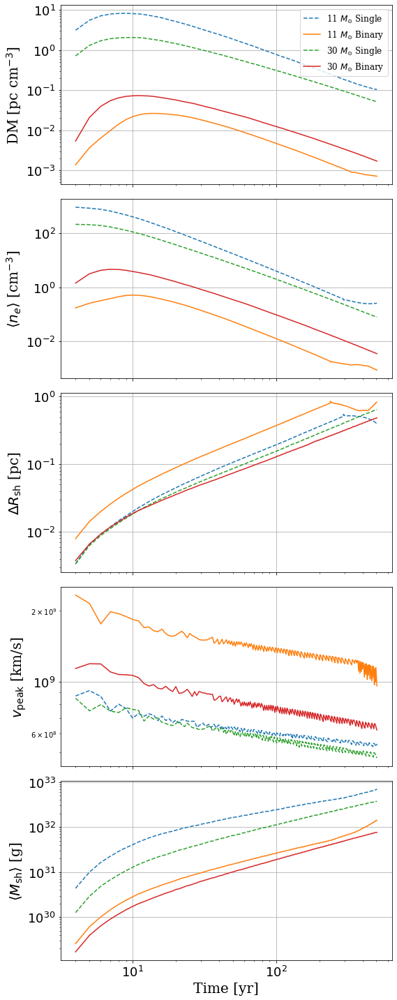

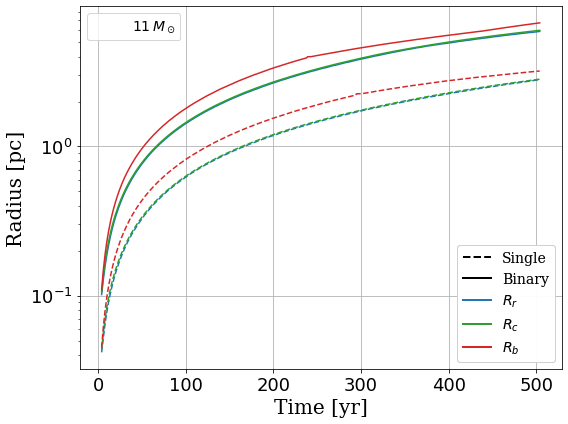

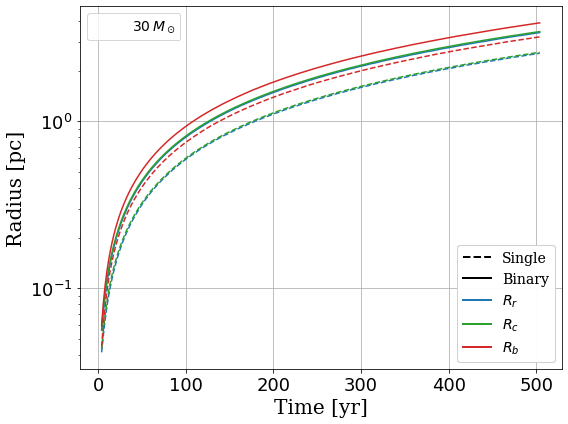

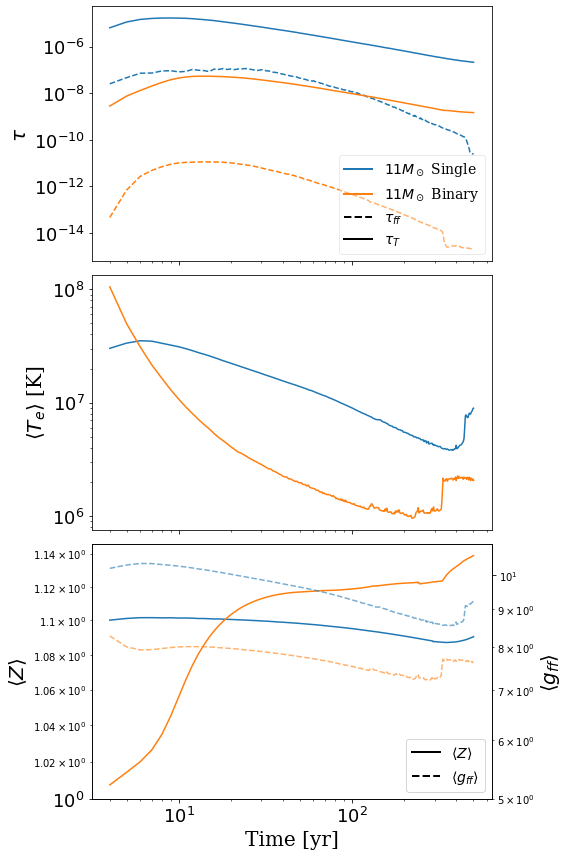

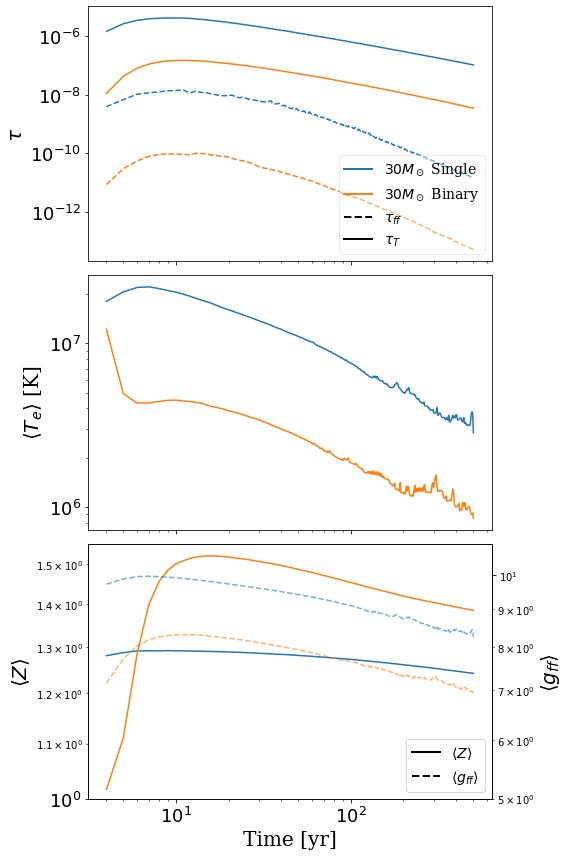

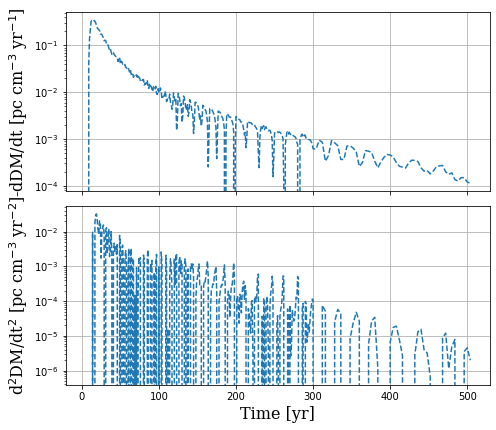

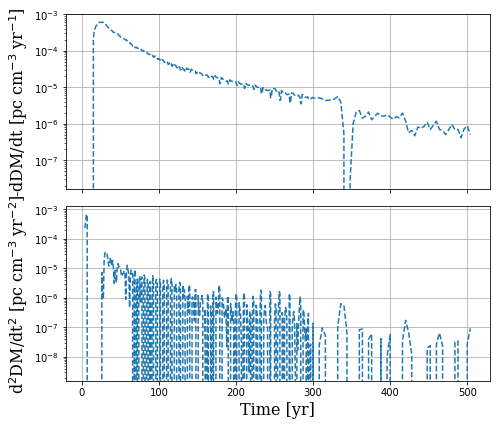

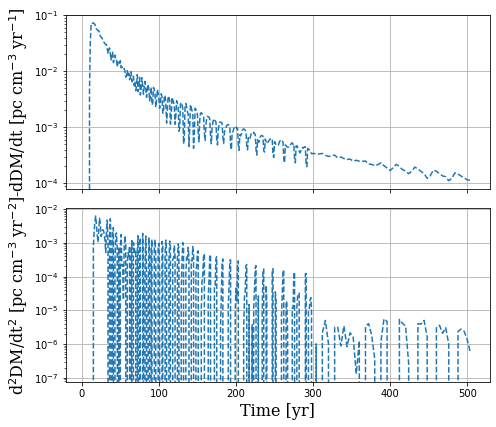

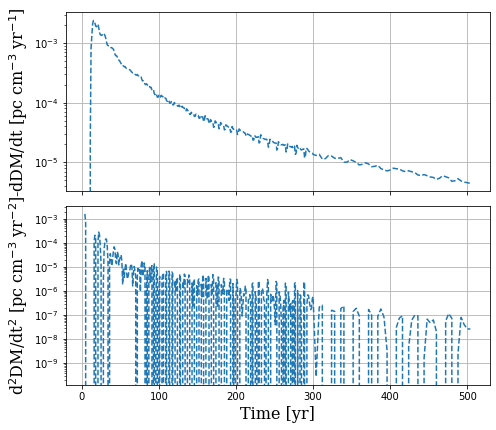

In [47]:

# --- DM / ne / Delta R vs Time (Shock) ---
fig, axes = plt.subplots(5, 1, figsize=(8, 20), sharex=True)
for m in masses:
    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        if key in all_results_sh and len(all_results_sh[key]["time"]):
            order = np.argsort(all_results_sh[key]["time"])
            t = all_results_sh[key]["time"][order]
            dm = all_results_sh[key]["dm"][order]
            r_b = all_results_sh[key]["r_b"][order]
            r_r = all_results_sh[key]["r_r"][order]
            mass_profile_sh = np.array(all_results_sh[key]["mass"], dtype=object)[order]
            vel_profile_sh = np.array(all_results_sh[key]["velocity_profiles"], dtype=object)[order]
            len_sh =  np.maximum(r_b - r_r, 0.0)
            ne_avg = dm/np.maximum(len_sh, 1e-12)
            vel_peak = np.array([a.max() for a in vel_profile_sh])
            mass_cum = np.array([a.sum() for a in mass_profile_sh])
            
            label = f"{m} $M_{{\odot}}$ {model.capitalize()}"
            linestyle = "-" if model == "binary" else "--"

            axes[0].plot(t, dm, label=label, linestyle=linestyle)
            axes[1].plot(t, ne_avg, label=label, linestyle=linestyle)
            axes[2].plot(t, len_sh, label=label, linestyle=linestyle)
            axes[3].plot(t, vel_peak, label=label, linestyle=linestyle)
            axes[4].plot(t, mass_cum, label=label, linestyle=linestyle)
            
            idx = np.argmax(dm)
            max_dm = dm[idx]
            max_time = t[idx]
            print(f"DM_max:{max_dm} at {max_time} yr for {key}:")
    axes[0].set_ylabel("DM [pc cm$^{-3}$]", **font_label)
    axes[1].set_ylabel(r"$\langle n_e \rangle$ [cm$^{-3}$]", **font_label)
    axes[2].set_ylabel(r"$\Delta R_{\rm sh}$ [pc]", **font_label)
    axes[3].set_ylabel(r"$v_{\rm peak}$ [km/s]", **font_label)
    axes[4].set_ylabel(r"$\langle M_{\rm sh} \rangle$ [g]", **font_label)
    axes[4].set_xlabel("Time [yr]", **font_label)

    
for ax in axes:
    ax.set_yscale("log")
    ax.set_xscale("log")
    ax.grid(True)
    ax.tick_params(labelsize=tick_size)

axes[0].legend(prop=font_legend_xsmall, loc="upper right")
plt.tight_layout()
plt.savefig("DM_ne_DeltaR_vel_vs_time_shock.png", dpi=150)
plt.show()

# --- R_b / R_r / R_c vs Time (same as shock, for reference) ---


radius_colors = {"r_r": "#1f77b4", "r_c": "#2ca02c", "r_b": "#d62728"}
model_styles = {"single": "--", "binary": "-"}

for m in masses:
    plt.figure(figsize=(8, 6))
    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        if key in all_results_sh and len(all_results_sh[key]["time"]):
            order = np.argsort(all_results_sh[key]["time"])
            t = all_results_sh[key]["time"][order]

            r_r = all_results_sh[key]["r_r"][order]
            r_c = all_results_sh[key]["r_c"][order]
            r_b = all_results_sh[key]["r_b"][order]

            ls = model_styles[model]
            plt.plot(t, r_r, color=radius_colors["r_r"], linestyle=ls)
            plt.plot(t, r_c, color=radius_colors["r_c"], linestyle=ls)
            plt.plot(t, r_b, color=radius_colors["r_b"], linestyle=ls)
    # legend: 11 Msun
    mass_leg = plt.legend(
        handles=[Line2D([0], [0], color="none", label=fr"${m}\,M_\odot$")],
        loc="upper left", frameon=True, prop=font_legend_small
    )
    plt.gca().add_artist(mass_leg)

    # legend: line style (single/binary) and color (R_r/R_c/R_b)
    style_color_leg = plt.legend(
        handles=[
            Line2D([0], [0], color="k", lw=2, linestyle="--", label="Single"),
            Line2D([0], [0], color="k", lw=2, linestyle="-", label="Binary"),
            Line2D([0], [0], color=radius_colors["r_r"], lw=2, label=r"$R_r$"),
            Line2D([0], [0], color=radius_colors["r_c"], lw=2, label=r"$R_c$"),
            Line2D([0], [0], color=radius_colors["r_b"], lw=2, label=r"$R_b$"),
        ],
        loc="lower right",
        frameon=True, prop=font_legend_small
    )
    plt.gca().add_artist(style_color_leg)
    
    plt.xlabel("Time [yr]", **font_label)
    plt.ylabel("Radius [pc]", **font_label)
    plt.yscale("log")
    plt.xscale("linear")
    plt.grid(True)
    plt.tick_params(labelsize=tick_size)
    plt.tight_layout()
    plt.savefig(f"Radius_comparison_shock_{m}Msun.png", dpi=150)
    plt.show()
    plt.close()

# --- tau / Te_avg / (Z_avg, gff_avg) vs Time (Full) ---


model_colors = {"single": "#1f77b4", "binary": "#ff7f0e"}
model_labels = {"single": "Single", "binary": "Binary"}



for m in masses:
    fig, axes = plt.subplots(3, 1, figsize=(8, 12), sharex=True)
    axZ = axes[2]
    axG = axZ.twinx()
    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        if key in all_results_sh and len(all_results_sh[key]["time"]):
            t = all_results_sh[key]["time"]

            tau_ff = all_results_sh[key]["tau_ff"]
            tau_T = all_results_sh[key]["tau_T"]

            te_profiles = all_results_sh[key]["Te"]
            te_avg = np.array([np.mean(te) for te in te_profiles])[order]
            
            zavg_profiles = all_results_sh[key]["Z_avg_profiles"]
            zavg_avg = np.array([np.mean(z) for z in zavg_profiles])[order]
                                                                     
            gff_profiles = all_results_sh[key]["gff_avg_profiles"]
            gff_avg = np.array([np.mean(g) for g in gff_profiles])[order]

            c = model_colors[model]

            axes[0].plot(t, tau_ff, linestyle="--", color=c)
            axes[0].plot(t, tau_T, linestyle="-", color=c)
            
            axes[1].plot(t, te_avg, linestyle="-", color=c)
            axZ.plot(t, zavg_avg, linestyle="-", color=c)
            axG.plot(t, gff_avg, linestyle="--", color=c, alpha=0.6)

    axes[0].set_ylabel(r"$\tau$", **font_label)
    axes[1].set_ylabel(r"$\langle T_e \rangle$ [K]", **font_label)
    axZ.set_ylabel(r"$\langle Z \rangle$", **font_label)
    axG.set_ylabel(r"$\langle g_{ff} \rangle$", **font_label)
    axes[2].set_xlabel("Time [yr]", **font_label)

    axes[0].set_yscale("log")
    axes[1].set_yscale("log")
    axes[2].set_yscale("log")
    axZ.set_yscale("log")
    axG.set_yscale("log")
    axZ.set_xscale("log")
    axG.set_xscale("log")
    axZ.set_ylim(1.0, axZ.get_ylim()[1])
    axG.set_ylim(5.0, 11)

    for ax in axes:
        ax.tick_params(labelsize=tick_size)

    axes[0].legend(
        handles=[
            Line2D([0], [0], color=model_colors["single"], lw=2, label=f"${m} M_\odot$ Single"),
            Line2D([0], [0], color=model_colors["binary"], lw=2, label=f"${m} M_\odot$ Binary"),
            Line2D([0], [0], color="k", lw=2, linestyle="--", label=r"$\tau_{ff}$"),
            Line2D([0], [0], color="k", lw=2, linestyle="-", label=r"$\tau_T$"),
        ],
        loc="lower right", frameon=True, prop=font_legend_small, framealpha=0.4
    )

    axes[2].legend(
        handles=[
            Line2D([0], [0], color="k", lw=2, linestyle="-", label=r"$\langle Z \rangle$"),
            Line2D([0], [0], color="k", lw=2, linestyle="--", label=r"$\langle g_{ff} \rangle$"),
        ],
        loc="lower right", frameon=True, prop=font_legend_small
    )

    plt.tight_layout()
    plt.savefig(f"tau_Te_Zavg_gff_vs_time_shock_{m}Msun.png", dpi=150)
    plt.show()

# --- dDM/dt and d2DM/dt2 (Shock) ---
for m in masses:
    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        if key not in all_results_sh:
            continue
        t = all_results_sh[key]["time"]
        dm = all_results_sh[key]["dm"]
        if len(t) < 3:
            continue

        d_dm = np.gradient(dm, t)
        d2_dm = np.gradient(d_dm, t)

        fig, axes = plt.subplots(2, 1, figsize=(7, 6), sharex=True)
        axes[0].plot(t, -d_dm, linestyle="--")
        axes[0].set_ylabel(r"-dDM/dt [pc cm$^{-3}$ yr$^{-1}$]", **font_label_small)
        axes[0].set_yscale("log")
        axes[0].grid(True)

        axes[1].plot(t, d2_dm, linestyle="--")
        axes[1].set_ylabel(r"d$^2$DM/dt$^2$ [pc cm$^{-3}$ yr$^{-2}$]", **font_label_small)
        axes[1].set_yscale("log")
        axes[1].set_xlabel("Time [yr]", **font_label_small)
        axes[1].grid(True)

        plt.tight_layout()
        plt.savefig(f"dDM_shock_{m}_{model}.png", dpi=150)
        plt.show()



In [54]:
all_results_sh['11_binary'].keys()

dict_keys(['dm', 'dm_full', 'r_b', 'r_r', 'tau_T', 'tau_ff', 'tau_ff_new', 'time', 'LiZn_profiles', 'Te', 'Tp', 'Z2n_gff_profiles', 'Z2n_profiles', 'Z_avg_profiles', 'density_profiles', 'gff_avg_profiles', 'hhe_profiles', 'ion_abundaces', 'ion_blocks', 'ion_tot_profiles', 'n_p_profiles', 'ne_profiles', 'radius_profiles', 'sum_gff_profiles', 'velocity_profiles'])

chi_e_unej:0.1 for 11_single
chi_e_unCSM:0.1 for 11_single


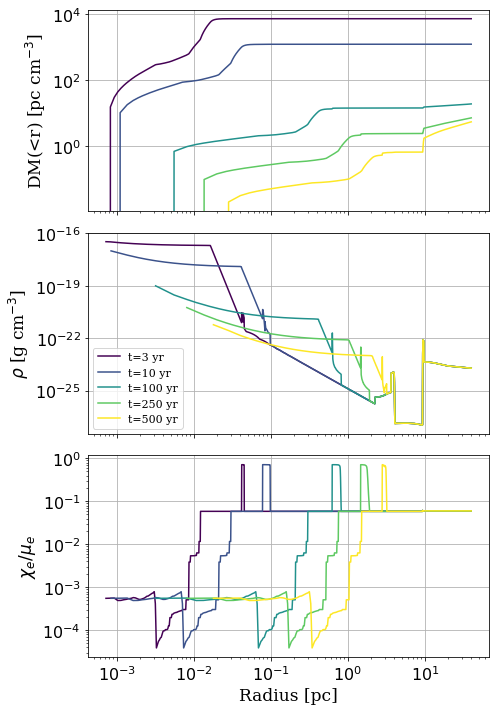

chi_e_unej:0.1 for 11_binary
chi_e_unCSM:0.1 for 11_binary


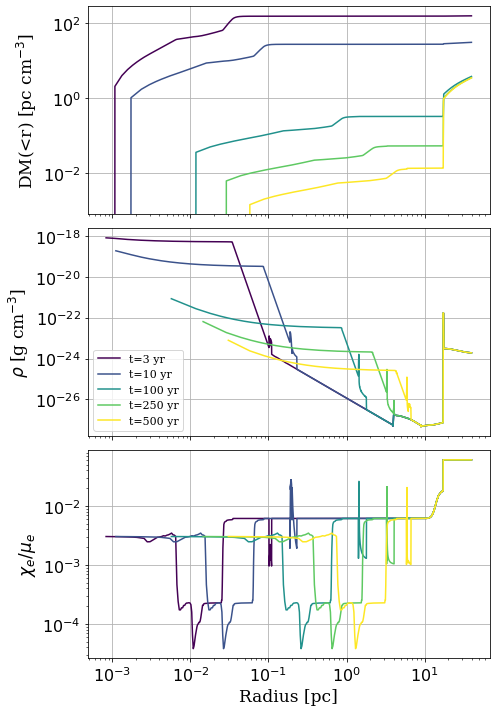

chi_e_unej:0.1 for 30_single
chi_e_unCSM:0.1 for 30_single


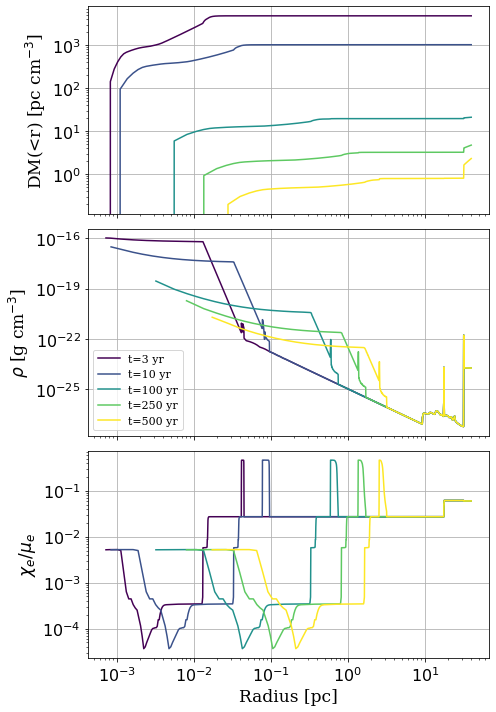

chi_e_unej:0.1 for 30_binary
chi_e_unCSM:0.1 for 30_binary


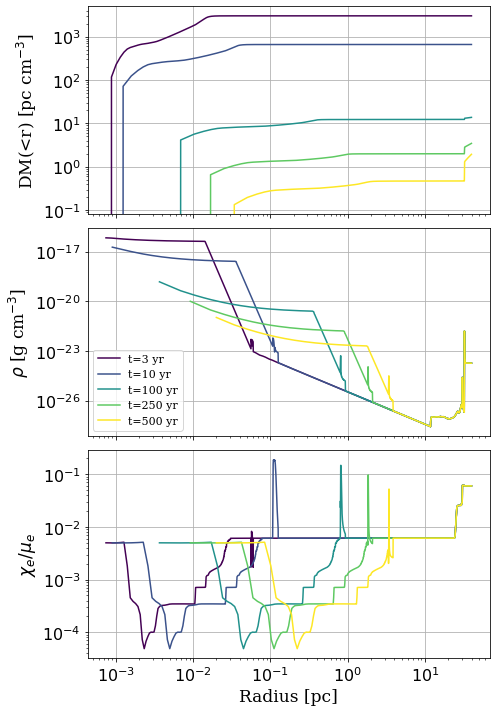

In [29]:
# --- Cumulative DM / density / chi_e at selected times (Full) ---
plot_times = [3, 10, 100, 250, 500]
cmap = plt.cm.viridis
time_colors = [cmap(i/(len(plot_times)-1)) for i in range(len(plot_times))]


def _nearest_time_index(t_arr, t_target):
    t_arr = np.asarray(t_arr, dtype=float)
    if t_arr.size == 0:
        return None
    return int(np.argmin(np.abs(t_arr - t_target)))


def _cumulative_dm(r_pc, ne_cm3):
    r_cm = r_pc * pc_to_cm
    # cumulative integral using trapezoid rule
    dm = np.zeros_like(r_pc, dtype=float)
    if len(r_pc) < 2:
        return dm
    for i in range(1, len(r_pc)):
        dr = r_cm[i] - r_cm[i - 1]
        dm[i] = dm[i - 1] + 0.5 * (ne_cm3[i] + ne_cm3[i - 1]) * dr / pc_to_cm
    return dm
def _build_full_profiles_at_time(key, t_target, unshock_sim_setting=True):
    if key not in all_results_sh or key not in all_results_unsh:
        return None
    sh = all_results_sh[key]
    un = all_results_unsh[key]
    csm = all_results_CSM.get(key, None)

    t_sh = np.asarray(sh.get("time", []), dtype=float)
    idx_sh = _nearest_time_index(t_sh, t_target)
    if idx_sh is None:
        return None

    # shock region profiles
    r_sh = np.asarray(sh["radius_profiles"][idx_sh], dtype=float)
    ne_sh = np.asarray(sh["ne_profiles"][idx_sh], dtype=float)
    rho_sh = np.asarray(sh["density_profiles"][idx_sh], dtype=float)
    r_r = float(sh["r_r"][idx_sh])
    r_b = float(sh["r_b"][idx_sh])

    # unshocked region profiles (nearest in time)
    t_un = np.asarray(un.get("time", []), dtype=float)
    idx_un = _nearest_time_index(t_un, t_sh[idx_sh])
    if idx_un is None:
        return None

    r_un_sh = np.asarray(un["radius_profiles"][idx_un], dtype=float)
    rho_un_sh = np.asarray(un["density_profiles"][idx_un], dtype=float)

    # 用 shock 的 r_r 裁掉重叠区域
    mask_un = r_un_sh < r_r
    r_un = r_un_sh[mask_un]
    rho_un = rho_un_sh[mask_un]

    # unshocked mu_a（当作 mu_e）
    mu_a_un = None
    if "mu_a_profiles" in un and len(un["mu_a_profiles"]) > idx_un:
        mu_a_un = np.asarray(un["mu_a_profiles"][idx_un], dtype=float)[mask_un]

    if unshock_sim_setting:
        ne_un_all = np.asarray(un["ne_profiles"][idx_un], dtype=float)
        ne_un = ne_un_all[mask_un]
    else:
        chi_e_unsh = chi_e_map.get(str(chi_e_unsh_setting).lower(), 0.01)
        if mu_a_un is None:
            mu_a_un = np.ones_like(rho_un)
        ne_un = chi_e_unsh * rho_un / (mu_a_un * m_p)

    # shock 区域 mu_e（来自 full_series 的中值）
    mu_e_sh_med = np.nan
    if key in all_results_full_series and len(all_results_full_series[key].get("mu_e_sh_med", [])):
        mu_e_sh_med = all_results_full_series[key]["mu_e_sh_med"][idx_sh]

    # CSM initial profile, outside blast wave
    r_csm = np.array([])
    ne_csm = np.array([])
    rho_csm = np.array([])
    mu_a_csm = np.array([])

    if csm is not None and len(csm.get("radius_profiles", [])):
        idx0 = 0
        r0 = np.asarray(csm["radius_profiles"][idx0], dtype=float)
        rho0 = np.asarray(csm["density_profiles"][idx0], dtype=float)

        # mu_a for CSM (used as mu_e)
        if "mu_a_profiles" in csm and len(csm["mu_a_profiles"]) > idx0:
            mu_a0 = np.asarray(csm["mu_a_profiles"][idx0], dtype=float)
        else:
            mu_a0 = np.ones_like(rho0)

        if unshock_sim_setting:
            ne0 = np.asarray(csm["ne_profiles"][idx0], dtype=float)
        else:
            chi_e_ISM = chi_e_map.get(str(chi_e_ISM_setting).lower(), 0.01)
            ne0 = chi_e_ISM * rho0 / (mu_a0 * m_p)

        mask_csm = r0 > r_b
        if np.count_nonzero(mask_csm) >= 2:
            r_csm = r0[mask_csm]
            ne_csm = ne0[mask_csm]
            rho_csm = rho0[mask_csm]
            mu_a_csm = mu_a0[mask_csm]

    # stitch: unshocked (inner) + shocked + CSM (outer)
    r_all = np.concatenate([r_un, r_sh, r_csm])
    ne_all = np.concatenate([ne_un, ne_sh, ne_csm])
    rho_all = np.concatenate([rho_un, rho_sh, rho_csm])

    # sort by radius
    order = np.argsort(r_all)
    r_all = r_all[order]
    ne_all = ne_all[order]
    rho_all = rho_all[order]

    # panel-3 quantity
    if unshock_sim_setting:
        chi_plot = ne_all / np.maximum(rho_all / m_p, 1e-30)
    else:
        # chi_e / mu_e
        chi_un = ne_un * m_p / np.maximum(rho_un, 1e-30) / np.maximum(mu_a_un, 1e-30)
        if np.isfinite(mu_e_sh_med):
            chi_sh = ne_sh * m_p / np.maximum(rho_sh, 1e-30) / np.maximum(mu_e_sh_med, 1e-30)
        else:
            chi_sh = ne_sh / np.maximum(rho_sh / m_p, 1e-30)

        if mu_a_csm.size:
            chi_csm = ne_csm * m_p / np.maximum(rho_csm, 1e-30) / np.maximum(mu_a_csm, 1e-30)
        else:
            chi_csm = ne_csm * m_p / np.maximum(rho_csm, 1e-30) / 1.18

        chi_plot = np.concatenate([chi_un, chi_sh, chi_csm])[order]

    # diagnostics for chi_e_unej / chi_e_unCSM
    chi_e_sh = ne_sh / np.maximum(rho_sh / m_p, 1e-30)
    chi_e_CSM = ne_csm / np.maximum(rho_csm / m_p, 1e-30)

    if unshock_sim_setting:
        chi_e_unej = np.min(chi_e_sh) if chi_e_sh.size else np.nan
        chi_e_unCSM = chi_e_CSM[-1] if chi_e_CSM.size else np.nan
    else:
        chi_e_unej = chi_e_unsh
        chi_e_unCSM = chi_e_ISM

    dm_cum = _cumulative_dm(r_all, ne_all)
    return r_all, dm_cum, rho_all, chi_plot, chi_e_unej, chi_e_unCSM



chi_e_unej_list = {}
chi_e_unCSM_list = {}
for m in masses:
    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        fig, axes = plt.subplots(3, 1, figsize=(7, 10), sharex=True)
        csm = all_results_CSM.get(key, None)
        for t0, c in zip(plot_times, time_colors):
            out = _build_full_profiles_at_time(key, t0, unshock_sim_setting = False)
            if out is None:
                continue
            r, dm_cum, rho, chi_e, chi_e_unej, chi_e_unCSM = out
            label = f"t={t0} yr"
            axes[0].plot(r, dm_cum, label=label, color=c)
            axes[1].plot(r, rho, label=label, color=c)
            axes[2].plot(r, chi_e, label=label, color=c)
        chi_e_unej_list[key] = chi_e_unej
        chi_e_unCSM_list[key] = chi_e_unCSM
        print(f"chi_e_unej:{chi_e_unej} for {key}")
        print(f"chi_e_unCSM:{chi_e_unCSM} for {key}")
        axes[0].set_ylabel("DM(<r) [pc cm$^{-3}$]", **font_label_small)
        axes[1].set_ylabel(r"$\rho$ [g cm$^{-3}$]", **font_label_small)
        axes[2].set_ylabel(r"$\chi_e/\mu_e$", **font_label_small)
        axes[2].set_xlabel("Radius [pc]", **font_label_small)
        
        for ax in axes:
            ax.set_xscale("log")
            ax.set_yscale("log")
            ax.grid(True)
            ax.tick_params(labelsize=tick_size)

        axes[1].legend(prop=font_legend_xsmall, loc = "lower left")
        #fig.suptitle(f"Full Region Profiles - {m} $M_{{\odot}}$ {model.capitalize()}", **font_label_small)
        plt.tight_layout()
        plt.savefig(f"DM_cumulative_density_chi_full_{m}_{model}.png", dpi=150)
        plt.show()

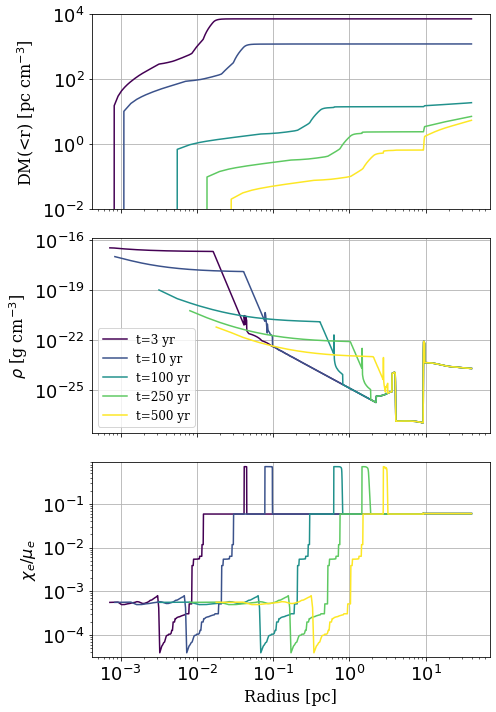

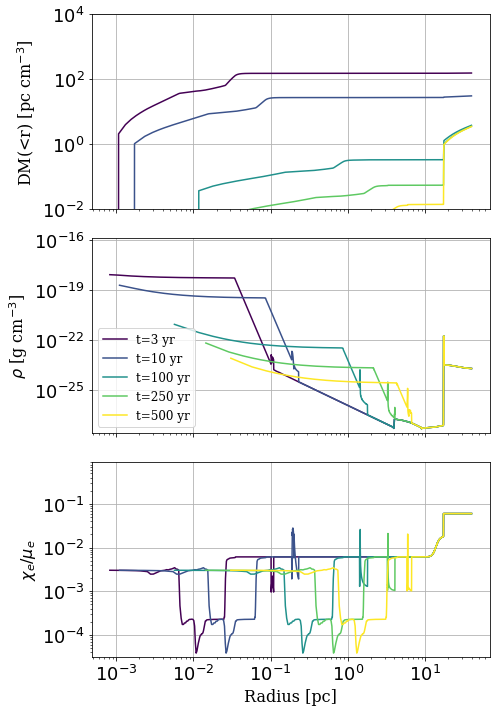

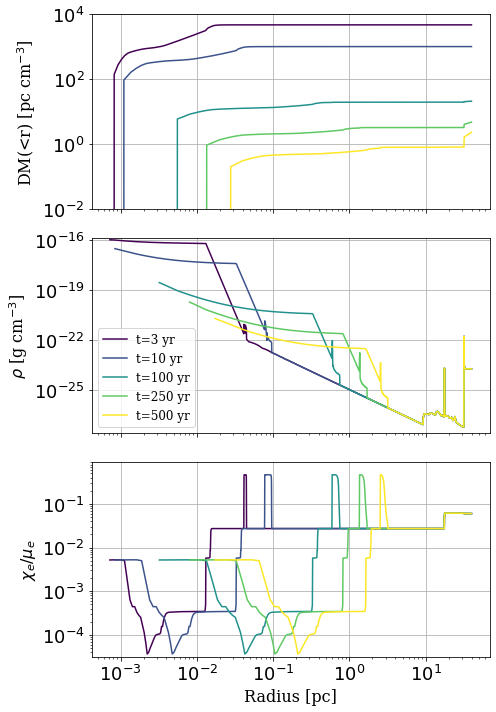

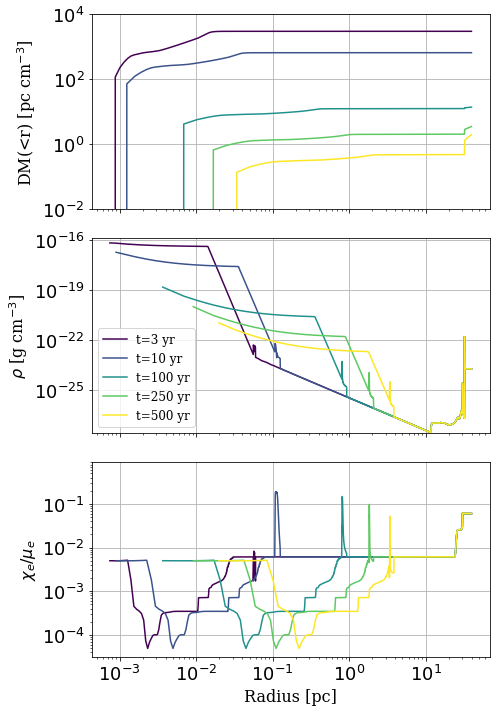

In [22]:
# 1) 先扫一遍全局范围
ymin_dm, ymax_dm = np.inf, -np.inf
ymin_rho, ymax_rho = np.inf, -np.inf
ymin_chi, ymax_chi = np.inf, -np.inf

for m in masses:
    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        for t0 in plot_times:
            out = _build_full_profiles_at_time(key, t0, unshock_sim_setting=False)
            if out is None:
                continue
            r, dm_cum, rho, chi_e, _, _ = out

            ymin_dm = min(ymin_dm, np.nanmin(dm_cum))
            ymax_dm = max(ymax_dm, np.nanmax(dm_cum))
            ymin_rho = min(ymin_rho, np.nanmin(rho))
            ymax_rho = max(ymax_rho, np.nanmax(rho))
            ymin_chi = min(ymin_chi, np.nanmin(chi_e))
            ymax_chi = max(ymax_chi, np.nanmax(chi_e))
# 2) 正常画图时统一 y 轴
for m in masses:
    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        fig, axes = plt.subplots(3, 1, figsize=(7, 10), sharex=True)
        for t0, c in zip(plot_times, time_colors):
            out = _build_full_profiles_at_time(key, t0, unshock_sim_setting=False)
            if out is None:
                continue
            r, dm_cum, rho, chi_e, chi_e_unej, chi_e_unCSM = out
            label = f"t={t0} yr"
            axes[0].plot(r, dm_cum, label=label, color=c)
            axes[1].plot(r, rho, label=label, color=c)
            axes[2].plot(r, chi_e, label=label, color=c)

        axes[0].set_ylim(1e-2, 10**4)
        axes[1].set_ylim(ymin_rho, 10**-15.9)
        axes[2].set_ylim(10**-4.5, 0.9)

        axes[0].set_ylabel("DM(<r) [pc cm$^{-3}$]", **font_label_small)
        axes[1].set_ylabel(r"$\rho$ [g cm$^{-3}$]", **font_label_small)
        axes[2].set_ylabel(r"$\chi_e/\mu_e$", **font_label_small)
        axes[2].set_xlabel("Radius [pc]", **font_label_small)

        for ax in axes:
            ax.set_xscale("log")
            ax.set_yscale("log")
            ax.grid(True)
            ax.tick_params(labelsize=tick_size)

        axes[1].legend(prop=font_legend_xsmall, loc="lower left")
        plt.tight_layout()
        plt.savefig(f"DM_cumulative_density_chi_full_{m}_{model}.png", dpi=150)
        plt.show()


# Upper Limit

In [23]:
def _compute_dm_ul_from_all_results_UL(key):
    if "all_results_UL" not in globals() or key not in all_results_UL:
        return None, None

    res = all_results_UL[key]
    # 若已计算过就直接复用
    if "dm_UL" in res:
        t_ul = np.asarray(.get("time", []), dtype=float)
        dm_ul = np.asarray(res.get("dm_UL", []), dtype=float)
        return t_ul, dm_ul

    t_ul = np.asarray(res.get("time", []), dtype=float)
    r_profiles = res.get("radius_profiles", [])
    rho_profiles = res.get("density_profiles", [])

    dm_list = []
    for r_pc, rho in zip(r_profiles, rho_profiles):
        r_pc = np.asarray(r_pc, dtype=float)
        rho = np.asarray(rho, dtype=float)
        if r_pc.size < 2 or rho.size < 2:
            dm_list.append(np.nan)
            continue
        r_cm = r_pc * pc_to_cm
        dr = np.diff(r_cm)
        # 完全电离：ne = rho / m_p
        ne = rho / m_p
        ne_mid = 0.5 * (ne[:-1] + ne[1:])
        dm_list.append(np.sum(ne_mid * dr) / pc_to_cm)

    dm_ul = np.asarray(dm_list, dtype=float)

    # 排序并存回 all_results_UL
    if t_ul.size:
        order = np.argsort(t_ul)
        t_ul = t_ul[order]
        dm_ul = dm_ul[order]
        res["time"] = t_ul
        res["dm_UL"] = dm_ul

    return t_ul, dm_ul
# dm_UL from all_results_UL (fully ionized)
t_ul, dm_ul_arr = _compute_dm_ul_from_all_results_UL(key)
if t_ul is not None and dm_ul_arr is not None and t_ul.size:
    dm_UL = _interp_to(t_ul, dm_ul_arr, t_sh)
else:
    dm_UL = np.full_like(t_sh, np.nan, dtype=float)


SyntaxError: invalid syntax (<ipython-input-23-73be362d3255>, line 8)

# Model Comparison

chi_e:0.1
11_single: t_FRB20190520B≈27.00 yr, DM≈183.64 pc cm^-3
11_single: t_FRB≈40.00 yr, DM≈88.54 pc cm^-3
11_single: t_FRB≈67.00 yr, DM≈35.56 pc cm^-3
['Upper limit', 'Simulation (full region)', 'Yang&Zhang17: ionized ejecta', 'Piro&Gaensler18: shocked ionized', 'Piro&Gaensler18: wind case', 'Zhao+21: wind case (SSDW)', 'FRB 20190520B (~183.6 pc cm$^{-3}$)', 'FRB 20121102 (~88.5 pc cm$^{-3}$)', 'FRB 20220529A (~35.6 pc cm$^{-3}$)']


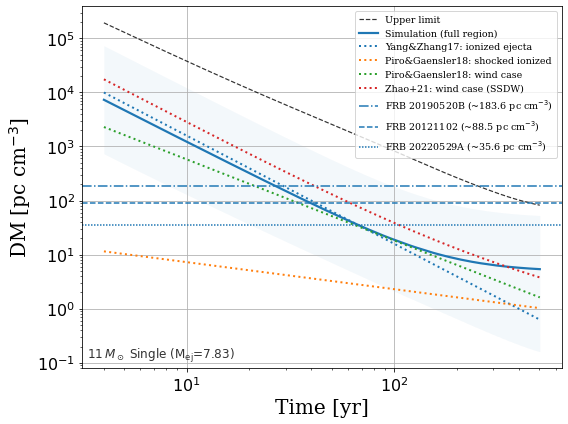

Saved: DM_full_11_single_comparison_with_analytic.png
chi_e:0.1
11_binary: t_FRB20190520B≈8.00 yr, DM≈44.86 pc cm^-3
11_binary: t_FRB≈11.00 yr, DM≈26.17 pc cm^-3
11_binary: t_FRB≈18.00 yr, DM≈12.39 pc cm^-3
['Upper limit', 'Simulation (full region)', 'Yang&Zhang17: ionized ejecta', 'Piro&Gaensler18: shocked ionized', 'Piro&Gaensler18: wind case', 'Zhao+21: wind case (SSDW)', 'FRB 20190520B (~44.9 pc cm$^{-3}$)', 'FRB 20121102 (~26.2 pc cm$^{-3}$)', 'FRB 20220529A (~12.4 pc cm$^{-3}$)']


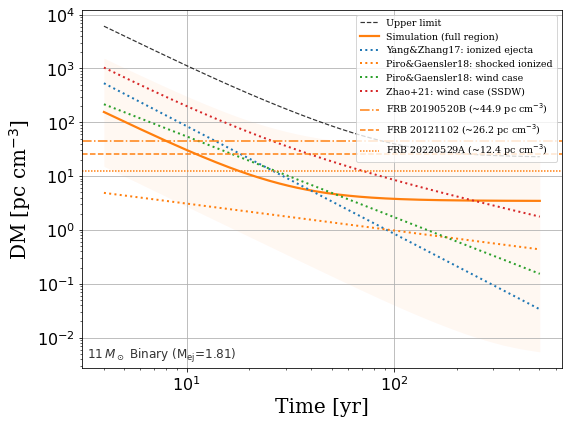

Saved: DM_full_11_binary_comparison_with_analytic.png
chi_e:0.1
30_single: t_FRB20190520B≈27.00 yr, DM≈202.85 pc cm^-3
30_single: t_FRB≈42.00 yr, DM≈97.65 pc cm^-3
30_single: t_FRB≈74.00 yr, DM≈36.13 pc cm^-3
['Upper limit', 'Simulation (full region)', 'Yang&Zhang17: ionized ejecta', 'Piro&Gaensler18: shocked ionized', 'Piro&Gaensler18: wind case', 'Zhao+21: wind case (SSDW)', 'FRB 20190520B (~202.8 pc cm$^{-3}$)', 'FRB 20121102 (~97.7 pc cm$^{-3}$)', 'FRB 20220529A (~36.1 pc cm$^{-3}$)']


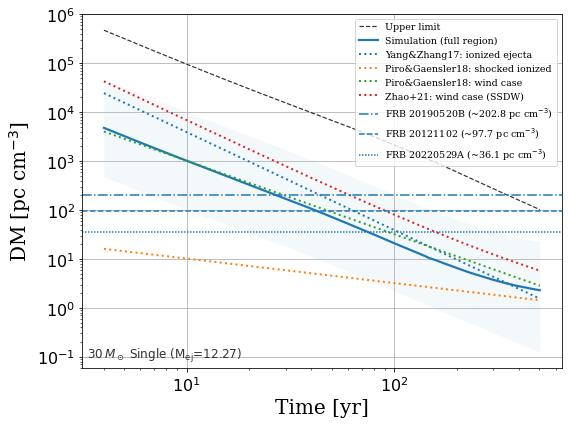

Saved: DM_full_30_single_comparison_with_analytic.png
chi_e:0.1
30_binary: t_FRB20190520B≈23.00 yr, DM≈167.45 pc cm^-3
30_binary: t_FRB≈35.00 yr, DM≈83.00 pc cm^-3
30_binary: t_FRB≈61.00 yr, DM≈32.40 pc cm^-3
['Upper limit', 'Simulation (full region)', 'Yang&Zhang17: ionized ejecta', 'Piro&Gaensler18: shocked ionized', 'Piro&Gaensler18: wind case', 'Zhao+21: wind case (SSDW)', 'FRB 20190520B (~167.5 pc cm$^{-3}$)', 'FRB 20121102 (~83.0 pc cm$^{-3}$)', 'FRB 20220529A (~32.4 pc cm$^{-3}$)']


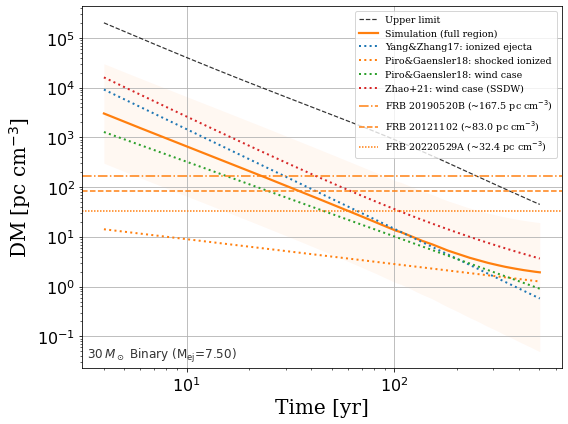

Saved: DM_full_30_binary_comparison_with_analytic.png


In [32]:
# =========================
# Full region vs analytic (use upper limit from full ionization)
# =========================
# =========================
# Analytic DM models
# =========================
font_legend_xmsmall = {
'family': 'serif',
'size': 13
}
def dm_yz_fully_ionized_free_expansion(t_yr, M_Msun=1.0, E51=1.0, eta=1.0):
    """
    Yang & Zhang: fully-ionized ejecta (free-expansion-like) inferred from the provided dDM/dt scaling:
        dDM/dt = -52 * eta * (M/Msun)^2 * (t/10yr)^-3 * (E/1e51erg)^-1  pc cm^-3 yr^-1
    Assuming DM -> 0 at t -> infinity and DM(t)=A t^-2, we get:
        DM = 260 * eta * (M/Msun)^2 * E51^-1 * (t/10yr)^-2  pc cm^-3
    """
    t_yr = np.asarray(t_yr, dtype=float)
    return 260.0 * eta * (M_Msun/1.0)**2 * (E51)**(-1.0) * (t_yr/10.0)**(-2.0)

def dm_piro_shocked_ionized_ejecta_ST(t_yr, M1=1.0, E51=1.0, n0=1.0, mu=0.62, mu_e = 1.18):
    """
    (Your Fig.2 / Eq.16 form):
        DM_SNR = 52.6 (mu/mu_e) E51^{-1/4} M1^{3/4} n0^{1/2} t_yr^{-1/2} pc cm^-3
    M1 = M_ej/(10 Msun), n0 in cm^-3, t_yr in yr.
    """
    t_yr = np.asarray(t_yr, dtype=float)
    return 52.6 * mu/mu_e * (E51)**(-0.25) * (M1)**(0.75) * (n0)**(0.5) * (t_yr)**(-0.5)

def dm_piro_wind_shocked(t_yr, M1=1.0, E51=1.0, mu_e=1.18):
    """
    Piro (2018) wind shocked region (your Fig.3 / Eq.45):
        DM_w,sh = 26.1 mu_e^{-1} E51^{-1/2} M1^{1/2} t_yr^{-2} pc cm^-3
    """
    t_yr = np.asarray(t_yr, dtype=float)
    return 26.1 * (mu_e)**(-1.0) * (E51)**(-0.5) * (M1)**(0.5) * (t_yr)**(-2.0)

def dm_piro_wind_total_sh_plus_unsh(t_yr, M1=1.0, E51=1.0, mu_e=1.18):
    """
    Piro (2018) wind total (shocked + unshocked) (your Fig.3 / Eq.47):
        DM_w,tot = 65.8 mu_e^{-1} E51^{-1/2} M1^{1/2} t_yr^{-2} pc cm^-3
    """
    t_yr = np.asarray(t_yr, dtype=float)
    return 65.8 * (mu_e)**(-1.0) * (E51)**(-0.5) * (M1)**(0.5) * (t_yr)**(-2.0)

def dm_piro2018_wind_shocked_ejecta_eq42(t_yr, M1=1.0, E51=1.0, mu_e=1.18, M_dot = 1e-5, v_w = 10):
    """
    Piro+2018 wind case, ejecta-dominated shocked-ejecta DM (Eq.42):
    DM_SNR = 1.3e4 * mu_e^{-1} * E51^{-3/4} * M1^{5/4} * K13^{1/2} * t_yr^{-3/2}  [pc cm^-3]
    
    Here K = dot{M}/(4π v_w) and K13 = K / 1e13 (g cm^-1).
    Valid in the early-time limit t << t_ch (as used in Piro+2018).
    M_dot in M_sun
    vw in km/s
    """
    M_dot_m5 = M_dot/1e-5    
    v1 = v_w/10
    K = 5.1*10**13*M_dot_m5*v1**-1
    K13 = K/1e13
    t_yr = np.asarray(t_yr, dtype=float)
    return 1.3e4 * (mu_e**-1) * (E51**(-0.75)) * (M1**(1.25)) * (K13**0.5) * (t_yr**(-1.5))

def dm_zhao2021_wind_shocked_ejecta(
    t_yr, Mej=1.0, E51=1.0, n=11, mu=1.33, M_dot = 1e-5, v_w = 10,
    w_core = 0.1, s = 2, eta = 0.1):
    """
    Zhao+2021 wind case, self-similar shocked-ejecta DM (Eq.45 in Zhao et al. 2021):

    DM_sh,ej(t) = C * eta_s * (n-3)(n-4) / (mu m_p)
                  * (1/r2 - 1)
                  * (t_ch / t)^{2(n-3)/(n-2)}   [pc cm^-3]

    Parameters
    ----------
    t_yr : array_like
        Time since explosion in years.
    Mej: float
        SN eject mass in M_sun 
    n : float
        Outer power-law index of SN ejecta density (typically n ~ 9–12).
    eta_s : float
        Ionization fraction of the shocked ejecta.
    r2 : float
        Ratio R_rs / R_cd (reverse shock to contact discontinuity radius).
    mu : float
        Mean molecular weight (≈1.3 for ionized SN ejecta).
    Rc_pc : float
        Contact discontinuity radius at t = t_ch, in parsec.
    t_ch_yr : float
        Characteristic timescale in years.

    M_dot: float 
        Mass loss rate in M_sun/yr
    v_w: float 
        wind velocity
        in km/s
    Returns
    -------
    DM : ndarray
        Dispersion measure from shocked ejecta in pc cm^-3.
    """
    m_p = 1.6726219e-24   # g
    pc  = 3.0856776e18    # cm
    M_dot_m5 = M_dot/1e-5
    v_1 = v_w/10
    km_to_cm = 1e5 
    Msun_to_g = 1.98847e33
    yr_to_s = 365.25*24*3600
    if n == 10:
        A = 0.067 # Cheviliar 1982 
        R1_over_Rc = 1.239
        R2_over_Rc = 0.984
        r1 = R1_over_Rc
        r2 = R2_over_Rc
    elif n == 9:
        A = 0.096 # Cheviliar 1982 
        R1_over_Rc = 1.250
        R2_over_Rc = 0.981
        r1 = R1_over_Rc
        r2 = R2_over_Rc 
    else:
        print("current model can only calculate n = 10 & 9 case")
        return 0
    #K = 5.1*10**13* M_dot_m5 * v_1**(-1)
    #Rch_pc = 12.9*(Mej)*M_dot_m5**-1*v_1
    #t_ch_yr = 1772 * E51**(-0.5) * Mej**(1.5) * M_dot_m5**(-1) * v_1
    K = M_dot/yr_to_s*Msun_to_g/(4*np.pi*v_w*km_to_cm)
    Mej_g = Mej*Msun_to_g
    R_ch = (Mej_g)*(1.0/(3-s))*K**(-1/(3-s))
    t_ch = (E51*1e51)**-0.5*Mej_g**((5-s)/(2*(3-s)))*K**(-1/(3-s))
    t_ch_yr = t_ch/yr_to_s

    R_ch_pc =  R_ch/pc
    f_0 = (3.0/(4.0*np.pi*w_core**n)) * ((1.0 - n/3.0) / (1.0 - (n/3.0)*w_core**(3.0-n)))

    lambda_c_sq = 2*w_core**(-2) * ((5-n)/(3-n)) * ((w_core**(n-3)-n/3)/(w_core**(n-5)-n/5))
    lambda_c = np.sqrt(lambda_c_sq)
    zeta_c = (A*f_0*w_core**n*lambda_c**(n-3))**(1/(n-s))
    t_yr = np.asarray(t_yr, dtype=float)
    
    #print(f"A:{A}, f_0:{f_0}, lambda_c:{lambda_c}, R_ch_pc:{R_ch_pc},r2:{r2}, zeta_c:{zeta_c}, t_ch_yr:{t_ch_yr}, K:{K}, w_core:")

    alpha = (n - 3.0) / (n - 2.0)
    
    pref_shocked = (2.0 * K * (n - 3.0) * (n - 4.0) / (mu * m_p)) * (1.0 / r2 - 1.0)/pc
    DM_shocked_ej = pref_shocked * (1.0 / (zeta_c * R_ch)) * (t_ch_yr / t_yr) ** alpha
    pref_unshoced = (4.0 * K)/ (mu * m_p) * (1.0 - 1/ r1)/pc
    DM_shocked_ISM = pref_unshoced * (1.0 / (zeta_c * R_ch)) * (t_ch_yr / t_yr) ** alpha
    
    q_b = 1.19
    l_ed = 1 +8/n**2 +0.4/(4-s)
    q_r = q_b/l_ed
    v_ch = R_ch/(t_ch_yr* yr_to_s)
    
    DM_unshocked_core = (
        Mej * Msun_to_g
        * eta
        * f_0
        * w_core
        / (mu * m_p)
        * lambda_c**(-2)
        * v_ch**(-2)
        * (t_yr * yr_to_s)**(-2)
    ) / pc
    DM_unshocked_pl = (
        Mej * Msun_to_g
        * eta
        * f_0
        * (w_core - w_core**n * q_r**(1 - n)) / (n - 1)
        / (mu * m_p)
        * lambda_c**(-2)
        * v_ch**(-2)
        * (t_yr * yr_to_s)**(-2)
    ) / pc
    DM_unshocked_ej = DM_unshocked_core + DM_unshocked_pl
    #DM_unshocked_ej = 3*Mej*Msun_to_g*q_r*eta/(4*np.pi*mu*m_p)*lambda_c**-2*v_ch**-2* (t_yr*yr_to_s)**-2/pc
    return DM_shocked_ej, DM_shocked_ISM, DM_unshocked_ej
def _get_full_dm_series(key, dm_setting="full"):
    # Prefer computed full (shock+unshock+CSM) if available
    if "all_results_full_series" in globals() and key in all_results_full_series:
        res = all_results_full_series[key]
        t = np.asarray(res["time"], dtype=float)

        if dm_setting == "full":
            dm = np.asarray(res.get("dm", []), dtype=float)
        elif dm_setting == "lower":
            dm = np.asarray(res.get("dm_lower", []), dtype=float)
        elif dm_setting == "upper":
            dm = np.asarray(res.get("dm_upper", []), dtype=float)
        else:
            raise ValueError(f"Unknown dm_setting: {dm_setting}")

        return t, dm

    if "all_results_full" in globals() and key in all_results_full:
        res = all_results_full[key]
        t = np.asarray(res["time"], dtype=float)
        dm = np.asarray(res["dm_full"], dtype=float)
        return t, dm

    return None, None



def _get_upper_limit_dm(key):
    # Use full ionization profile as upper limit
    if "all_results_UL" in globals() and key in all_results_UL and len(all_results_UL[key]["time"]):
        order = np.argsort(all_results_UL[key]["time"])
        t_ul = np.asarray(all_results_UL[key]["time"], dtype=float)[order]
        dm_ul = np.asarray(all_results_UL[key]["dm_UL"], dtype=float)[order]
        return t_ul, dm_ul
    return None, Noneupp
def _get_time_grid_from_sim(all_results, key, fallback=(1e-1, 1e3), npts=400):
    if key in all_results and len(all_results[key]["time"]):
        t = np.asarray(all_results[key]["time"], dtype=float)
        t = t[np.isfinite(t) & (t > 0)]
        if len(t) >= 2:
            return np.logspace(np.log10(t.min()), np.log10(t.max()), npts)
    return np.logspace(np.log10(fallback[0]), np.log10(fallback[1]), npts)

def plot_channel_with_analytic_full(channel, zams_mass, chi_e_unej=None):
    key = f"{zams_mass}_{channel}"
    if chi_e_unej is not None:
        chi_e = chi_e_unej[key]
    else:
        chi_e = 0.01
    print(f"chi_e:{chi_e}")
    pars = progenitor_table[zams_mass][channel]
    Mej = pars["Mej"]
    E51 = pars["E51"]
    M1 = Mej / 10.0

    if channel == "single":
        c_line    = "#1f77b4"
        l_s       = "-"
        n0_fid    = 1.0
        mu_fid    = 0.62
        mu_e_fid  = 1.18
        eta_fid   = 1.0
    else:
        c_line    = "#ff7f0e"
        l_s       = "-"
        n0_fid    = 1.0
        mu_fid    = 1.34
        mu_e_fid  = 2.0
        eta_fid   = 1.0

    fig, ax = plt.subplots(figsize=(8, 6))

    # Upper limit from full ionization
    t_ul, dm_ul = _get_upper_limit_dm(key)
    if t_ul is not None and len(t_ul):
        ax.plot(t_ul[1:], dm_ul[1:],
                label="Upper limit",
                c="k", ls="--", linewidth=1.2, alpha=0.8)

    # Full region simulation
    t_full, dm_full = _get_full_dm_series(key)
    t_lower,dm_lower = _get_full_dm_series(key, "lower")
    t_upper, dm_upper = _get_full_dm_series(key, "upper")
    if t_full is not None and len(t_full):
        ax.plot(t_full, dm_full,
                label="Simulation (full region)",
                c=c_line, ls=l_s, linewidth=2.2)
    if (not unshock_sim_setting) and (dm_lower is not None) and (dm_upper is not None):
        ax.fill_between(t, dm_lower, dm_upper, color=c_line, alpha=0.05, linewidth=0)
        
        # FRB 190520B 对应 DM（用此前求得的 t_FRB190520B 或重新计算）
        d_dm_FRB20190520B = 12.4
        d_dm_FRB20121102 = 3.93
        d_dm_FRB20220529A = 3.93
        # 若你已有 frb_times 字典就用它；否则临时算一次
        if "frb_times" in globals():
            t_FRB20190520B = frb_times.get(f"{key}_FRB20190520B", None)
            t_FRB20121102 = frb_times.get(f"{key}_FRB20121102_late", None)
            t_FRB20220529A = frb_times.get(f"{key}_FRB20220529A", None)
        else:
            order = np.argsort(t_full)
            t_sorted = np.asarray(t_full)[order]
            dm_sorted = np.asarray(dm_full)[order]
            d_dm = np.gradient(dm_sorted, t_sorted)
            idx_20190520B = np.argmin(np.abs(-d_dm - d_dm_FRB20190520B))
            idx_20121102 = np.argmin(np.abs(-d_dm - d_dm_FRB20121102))
            idx_20220529A = np.argmin(np.abs(-d_dm - d_dm_FRB20220529A))
            t_FRB20190520B = t_sorted[idx_20190520B]
            t_FRB20121102 = t_sorted[idx_20121102]
            t_FRB20220529A = t_sorted[idx_20220529A]

        dm_FRB20190520B = np.interp(t_FRB20190520B, t_full, dm_full)
        dm_FRB20121102 = np.interp(t_FRB20121102, t_full, dm_full)
        dm_FRB20220529A = np.interp(t_FRB20220529A, t_full, dm_full)
    else:
        print(f"[WARN] Missing full-region sim key: {key}")

    # Analytic curves
    if zams_mass not in progenitor_table or channel not in progenitor_table[zams_mass]:
        print(f"[WARN] Missing progenitor_table entry for ZAMS={zams_mass}, channel={channel}")
        return

    t_model = _get_time_grid_from_sim(all_results_full_series, key)

    ax.plot(
        t_model,
        dm_yz_fully_ionized_free_expansion(t_model, M_Msun=Mej, E51=E51, eta=chi_e),
        label=fr"Yang&Zhang17: ionized ejecta",
        linewidth=2.0,
        ls=":"
    )
    
    ax.plot(
        t_model,
        dm_piro_shocked_ionized_ejecta_ST(t_model, M1=M1, E51=E51, n0=n0_fid, mu=mu_fid, mu_e=mu_e_fid),
        label=fr"Piro&Gaensler18: shocked ionized",
        linewidth=2.0,
        ls=":"
    )

    M_dot = 1e-5
    v_w = 10
    ax.plot(
        t_model,
        dm_piro2018_wind_shocked_ejecta_eq42(t_model, M1=M1, E51=E51, mu_e=mu_e_fid, M_dot=M_dot, v_w=v_w),
        label=r"Piro&Gaensler18: wind case",
        linewidth=2.0,
        ls=":"
    )
    DM_shock_ej, DM_shock_ISM, DM_unshocked_ej = dm_zhao2021_wind_shocked_ejecta(
        t_model, Mej=Mej, E51=E51, n=10, M_dot=M_dot, v_w=v_w, eta = chi_e
    )
    DM_shock = DM_shock_ej + DM_shock_ISM + DM_unshocked_ej
    ax.plot(
        t_model,
        DM_shock,
        label=r"Zhao+21: wind case (SSDW)",
        linewidth=2.0,
        ls=":"
    )
    ax.text(
        0.01, 0.01,
        f"${zams_mass}\,M_\odot$ {channel.capitalize()} (M$_{{\mathrm{{ej}}}}$={Mej:.2f})",
        transform=ax.transAxes,
        ha="left", va="bottom",
        fontsize=12,
        color="0.2"
    )

    ax.axhline(y=dm_FRB20190520B, c=c_line, ls="-.",
               label=rf"FRB 20190520B (~{dm_FRB20190520B:.1f} pc cm$^{{-3}}$)")
    ax.axhline(y=dm_FRB20121102, c=c_line, ls="--",
               label=rf"FRB 20121102 (~{dm_FRB20121102:.1f} pc cm$^{{-3}}$)")
    ax.axhline(y=dm_FRB20220529A, c=c_line,
               linestyle=(0, (1, 1)),  
               label=rf"FRB 20220529A (~{dm_FRB20220529A:.1f} pc cm$^{{-3}}$)")
    print(f"{key}: t_FRB20190520B≈{t_FRB20190520B:.2f} yr, DM≈{dm_FRB20190520B:.2f} pc cm^-3")
    print(f"{key}: t_FRB≈{t_FRB20121102:.2f} yr, DM≈{dm_FRB20121102:.2f} pc cm^-3")
    print(f"{key}: t_FRB≈{t_FRB20220529A:.2f} yr, DM≈{dm_FRB20220529A:.2f} pc cm^-3")
    handles, labels = ax.get_legend_handles_labels()
    print(labels)

    ax.set_xlabel("Time [yr]", **font_label)
    ax.set_ylabel("DM [pc cm$^{-3}$]", **font_label)
    #ax.legend(
    #    prop=font_legend_xxsmall,
    #    loc="upper right",
    #    labelspacing=0.25,
    #    handletextpad=0.6,
    #    borderpad=0.3
    #)
    ax.legend(prop=font_legend_xxxsmall, loc="upper right")
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.grid(True)
    ax.tick_params(labelsize=tick_size)
    fig.tight_layout()

    outname = f"DM_full_{zams_mass}_{channel}_comparison_with_analytic.png"
    fig.savefig(outname, dpi=150)
    plt.show()
    print(f"Saved: {outname}")
    
progenitor_table = {
    11: {
        "single": {"Mej": 7.83, "dMwind": 1.64, "E51": 1.0},
        "binary": {"Mej": 1.81, "dMwind": 0.70, "E51": 1.0},
    },
    30: {
        "single": {"Mej": 12.27, "dMwind": 15.74, "E51": 1.0},
        "binary": {"Mej": 7.50, "dMwind": 9.85, "E51": 1.0},
    }
}

progenitor_table = {
    11: {
        "single": {"Mej": 7.83, "dMwind": 1.64, "E51": 1.0},
        "binary": {"Mej": 1.81, "dMwind": 0.70, "E51": 1.0},
    },
    30: {
        "single": {"Mej": 12.27, "dMwind": 15.74, "E51": 1.0},
        "binary": {"Mej": 7.50, "dMwind": 9.85, "E51": 1.0},
    }
}

# Fiducial plasma/composition parameters for analytic curves
# You can change these later if you want to encode ionization/composition more carefully.


# If you only want to compare the Table-1 example mass:

# Run for all available masses and channels

for zams_mass in progenitor_table.keys():
    for channel in ["single", "binary"]:
        plot_channel_with_analytic_full(channel, zams_mass, chi_e_unej = chi_e_unej_list)

# Save the Teoretical Benchmarks

In [33]:
# ============================================================
# Save theoretical benchmark + simulation DM comparison data
# ============================================================

import os
import json
import numpy as np
import pandas as pd

SAVE_DIR = "/root/jupyter_notebook/user_work/Data/SNR_work/zenodo_DM_benchmark_data"
os.makedirs(SAVE_DIR, exist_ok=True)

benchmark_rows = []

for zams_mass in progenitor_table.keys():
    for channel in ["single", "binary"]:

        key = f"{zams_mass}_{channel}"
        if key not in all_results_full_series:
            continue

        pars = progenitor_table[zams_mass][channel]
        Mej = pars["Mej"]
        E51 = pars["E51"]
        M1 = Mej / 10.0

        if channel == "single":
            n0_fid = 1.0
            mu_fid = 0.62
            mu_e_fid = 1.18
        else:
            n0_fid = 1.0
            mu_fid = 1.34
            mu_e_fid = 2.0

        if "chi_e_unej_list" in globals() and key in chi_e_unej_list:
            chi_e = chi_e_unej_list[key]
        else:
            chi_e = 0.01

        # Simulation time grid
        res = all_results_full_series[key]
        t_sim = np.asarray(res["time"], dtype=float)
        order = np.argsort(t_sim)
        t_sim = t_sim[order]

        dm_full = np.asarray(res.get("dm", np.full_like(t_sim, np.nan)), dtype=float)[order]
        dm_lower = np.asarray(res.get("dm_lower", np.full_like(t_sim, np.nan)), dtype=float)[order]
        dm_upper = np.asarray(res.get("dm_upper", np.full_like(t_sim, np.nan)), dtype=float)[order]
        dm_shocked = np.asarray(res.get("dm_sh", np.full_like(t_sim, np.nan)), dtype=float)[order]
        dm_unshocked = np.asarray(res.get("dm_unsh", np.full_like(t_sim, np.nan)), dtype=float)[order]
        dm_csm = np.asarray(res.get("dm_csm", np.full_like(t_sim, np.nan)), dtype=float)[order]

        # Upper limit from full ionization
        t_ul, dm_ul = _get_upper_limit_dm(key)

        if t_ul is not None and len(t_ul) > 1:
            dm_upper_limit_interp = np.interp(
                t_sim,
                np.asarray(t_ul, dtype=float),
                np.asarray(dm_ul, dtype=float),
                left=np.nan,
                right=np.nan
            )
        else:
            dm_upper_limit_interp = np.full_like(t_sim, np.nan)

        # Theoretical benchmark curves on the same simulation time grid
        dm_yz = dm_yz_fully_ionized_free_expansion(
            t_sim,
            M_Msun=Mej,
            E51=E51,
            eta=chi_e
        )

        dm_piro_st = dm_piro_shocked_ionized_ejecta_ST(
            t_sim,
            M1=M1,
            E51=E51,
            n0=n0_fid,
            mu=mu_fid,
            mu_e=mu_e_fid
        )

        dm_piro_wind = dm_piro2018_wind_shocked_ejecta_eq42(
            t_sim,
            M1=M1,
            E51=E51,
            mu_e=mu_e_fid,
            M_dot=1e-5,
            v_w=10
        )

        dm_zhao_sh_ej, dm_zhao_sh_ism, dm_zhao_unsh_ej = dm_zhao2021_wind_shocked_ejecta(
            t_sim,
            Mej=Mej,
            E51=E51,
            n=10,
            M_dot=1e-5,
            v_w=10,
            eta=chi_e
        )

        dm_zhao_total = dm_zhao_sh_ej + dm_zhao_sh_ism + dm_zhao_unsh_ej

        # FRB horizontal reference levels based on -dDM/dt matching
        dDM_dt = np.gradient(dm_full, t_sim)

        idx_20190520B = np.argmin(np.abs(-dDM_dt - 12.4))
        idx_20121102 = np.argmin(np.abs(-dDM_dt - 3.93))
        idx_20220529A = np.argmin(np.abs(-dDM_dt - 0.881))

        t_FRB20190520B = t_sim[idx_20190520B]
        t_FRB20121102 = t_sim[idx_20121102]
        t_FRB20220529A = t_sim[idx_20220529A]

        dm_FRB20190520B = dm_full[idx_20190520B]
        dm_FRB20121102 = dm_full[idx_20121102]
        dm_FRB20220529A = dm_full[idx_20220529A]

        for i in range(len(t_sim)):
            benchmark_rows.append({
                "mass_Msun": zams_mass,
                "channel": channel,
                "model_key": key,
                "time_yr": t_sim[i],

                "Mej_Msun": Mej,
                "E51": E51,
                "chi_e": chi_e,

                "DM_simulation_full_pc_cm3": dm_full[i],
                "DM_simulation_lower_pc_cm3": dm_lower[i],
                "DM_simulation_upper_pc_cm3": dm_upper[i],
                "DM_simulation_shocked_pc_cm3": dm_shocked[i],
                "DM_simulation_unshocked_ejecta_pc_cm3": dm_unshocked[i],
                "DM_simulation_unshocked_CSM_pc_cm3": dm_csm[i],
                "DM_upper_limit_full_ionization_pc_cm3": dm_upper_limit_interp[i],

                "DM_Yang_Zhang_2017_ionized_ejecta_pc_cm3": dm_yz[i],
                "DM_Piro_Gaensler_2018_shocked_ionized_pc_cm3": dm_piro_st[i],
                "DM_Piro_Gaensler_2018_wind_case_pc_cm3": dm_piro_wind[i],
                "DM_Zhao_2021_wind_SSDW_total_pc_cm3": dm_zhao_total[i],
                "DM_Zhao_2021_shocked_ejecta_pc_cm3": dm_zhao_sh_ej[i],
                "DM_Zhao_2021_shocked_ISM_pc_cm3": dm_zhao_sh_ism[i],
                "DM_Zhao_2021_unshocked_ejecta_pc_cm3": dm_zhao_unsh_ej[i],

                "t_FRB20190520B_match_yr": t_FRB20190520B,
                "DM_FRB20190520B_reference_pc_cm3": dm_FRB20190520B,
                "t_FRB20121102_late_match_yr": t_FRB20121102,
                "DM_FRB20121102_reference_pc_cm3": dm_FRB20121102,
                "t_FRB20220529A_match_yr": t_FRB20220529A,
                "DM_FRB20220529A_reference_pc_cm3": dm_FRB20220529A,
            })

df_benchmark = pd.DataFrame(benchmark_rows)

benchmark_csv = os.path.join(
    SAVE_DIR,
    "DM_theoretical_benchmark_comparison_11_30Msun_single_binary.csv"
)

df_benchmark.to_csv(benchmark_csv, index=False)

metadata = {
    "description": (
        "Simulation DM time series and theoretical benchmark curves used for the "
        "DM comparison figures. The table includes 11 and 30 Msun progenitors, "
        "single-star and binary-stripped channels."
    ),
    "models": ["11_single", "11_binary", "30_single", "30_binary"],
    "theoretical_benchmarks": [
        "Yang & Zhang 2017 ionized ejecta",
        "Piro & Gaensler 2018 shocked ionized ejecta",
        "Piro & Gaensler 2018 wind case",
        "Zhao et al. 2021 wind SSDW case"
    ],
    "units": {
        "time_yr": "yr",
        "DM": "pc cm^-3",
        "Mej_Msun": "Msun",
        "E51": "10^51 erg"
    },
    "notes": {
        "DM_simulation_full": "Full-region simulation DM.",
        "DM_upper_limit_full_ionization": "Upper limit computed from full-ionization assumption when available.",
        "FRB_reference_levels": "Horizontal reference DM levels are obtained from the simulation time closest to the observed -dDM/dt values."
    },
    "columns": list(df_benchmark.columns)
}

with open(os.path.join(SAVE_DIR, "README_DM_theoretical_benchmark.json"), "w") as f:
    json.dump(metadata, f, indent=2)

print("Saved benchmark DM data to:")
print(benchmark_csv)
print(df_benchmark.head())

Saved benchmark DM data to:
/root/jupyter_notebook/user_work/Data/SNR_work/zenodo_DM_benchmark_data/DM_theoretical_benchmark_comparison_11_30Msun_single_binary.csv
   mass_Msun channel  model_key  time_yr  Mej_Msun  E51  chi_e  \
0         11  single  11_single      4.0      7.83  1.0    0.1   
1         11  single  11_single      5.0      7.83  1.0    0.1   
2         11  single  11_single      6.0      7.83  1.0    0.1   
3         11  single  11_single      7.0      7.83  1.0    0.1   
4         11  single  11_single      8.0      7.83  1.0    0.1   

   DM_simulation_full_pc_cm3  DM_simulation_lower_pc_cm3  \
0                7307.128606                  733.021798   
1                4727.161292                  477.217405   
2                3314.036818                  337.359366   
3                2454.877240                  252.121739   
4                1894.358006                  196.333470   

   DM_simulation_upper_pc_cm3  ...  DM_Zhao_2021_wind_SSDW_total_pc_cm3  \
0  

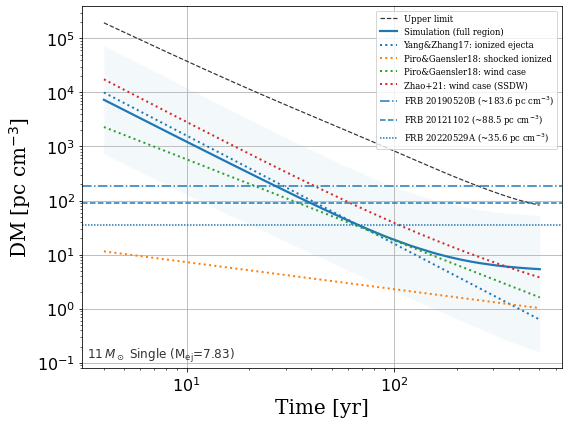

Saved: replot_DM_full_11_single_comparison_with_analytic.png


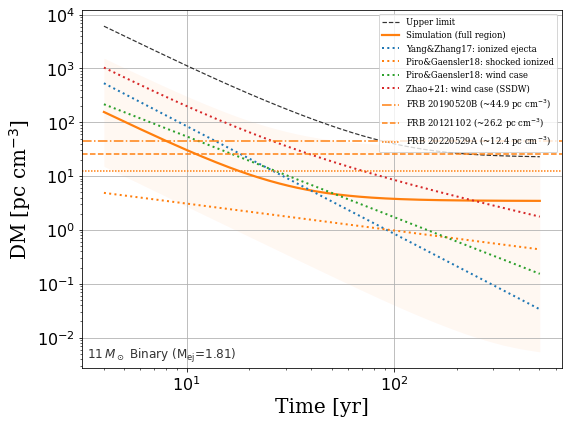

Saved: replot_DM_full_11_binary_comparison_with_analytic.png


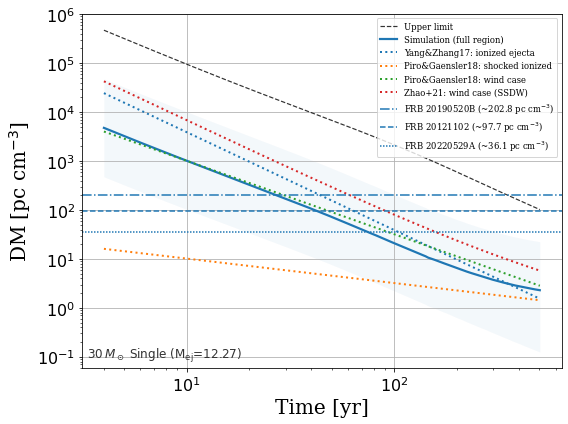

Saved: replot_DM_full_30_single_comparison_with_analytic.png


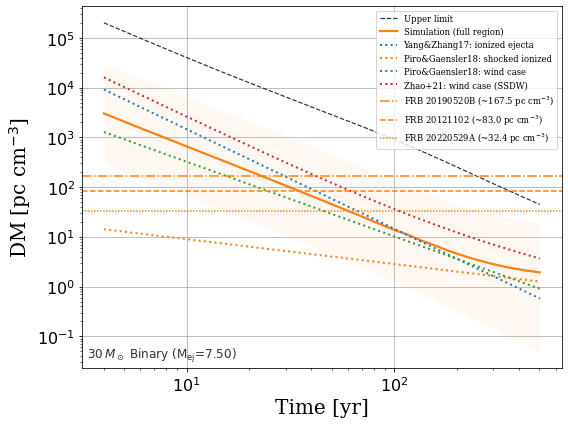

Saved: replot_DM_full_30_binary_comparison_with_analytic.png
All reproduced benchmark figures were saved to:
/root/jupyter_notebook/user_work/Data/SNR_work/zenodo_DM_benchmark_data/reproduced_figures


In [34]:
# ============================================================
# Reproduce theoretical benchmark DM comparison figures from CSV
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

DATA_DIR = "/root/jupyter_notebook/user_work/Data/SNR_work/zenodo_DM_benchmark_data"

CSV_PATH = os.path.join(
    DATA_DIR,
    "DM_theoretical_benchmark_comparison_11_30Msun_single_binary.csv"
)

FIG_DIR = os.path.join(DATA_DIR, "reproduced_figures")
os.makedirs(FIG_DIR, exist_ok=True)

df = pd.read_csv(CSV_PATH)

font_label = {"family": "serif", "size": 20}
font_legend_xxxsmall = {"family": "serif", "size": 8.5}
tick_size = 16

model_colors = {
    "single": "#1f77b4",
    "binary": "#ff7f0e",
}

for mass in sorted(df["mass_Msun"].unique()):
    for channel in ["single", "binary"]:

        sub = df[
            (df["mass_Msun"] == mass)
            & (df["channel"] == channel)
        ].copy()

        if sub.empty:
            continue

        sub = sub.sort_values("time_yr")
        t = sub["time_yr"].to_numpy()

        c_line = model_colors[channel]

        Mej = sub["Mej_Msun"].iloc[0]

        fig, ax = plt.subplots(figsize=(8, 6))

        # Upper limit
        if np.any(np.isfinite(sub["DM_upper_limit_full_ionization_pc_cm3"])):
            ax.plot(
                t,
                sub["DM_upper_limit_full_ionization_pc_cm3"],
                label="Upper limit",
                c="k",
                ls="--",
                linewidth=1.2,
                alpha=0.8
            )

        # Simulation full DM
        ax.plot(
            t,
            sub["DM_simulation_full_pc_cm3"],
            label="Simulation (full region)",
            c=c_line,
            ls="-",
            linewidth=2.2
        )

        # Simulation uncertainty band
        if np.any(np.isfinite(sub["DM_simulation_lower_pc_cm3"])):
            ax.fill_between(
                t,
                sub["DM_simulation_lower_pc_cm3"],
                sub["DM_simulation_upper_pc_cm3"],
                color=c_line,
                alpha=0.05,
                linewidth=0
            )

        # Theoretical benchmarks
        ax.plot(
            t,
            sub["DM_Yang_Zhang_2017_ionized_ejecta_pc_cm3"],
            label="Yang&Zhang17: ionized ejecta",
            linewidth=2.0,
            ls=":"
        )

        ax.plot(
            t,
            sub["DM_Piro_Gaensler_2018_shocked_ionized_pc_cm3"],
            label="Piro&Gaensler18: shocked ionized",
            linewidth=2.0,
            ls=":"
        )

        ax.plot(
            t,
            sub["DM_Piro_Gaensler_2018_wind_case_pc_cm3"],
            label="Piro&Gaensler18: wind case",
            linewidth=2.0,
            ls=":"
        )

        ax.plot(
            t,
            sub["DM_Zhao_2021_wind_SSDW_total_pc_cm3"],
            label="Zhao+21: wind case (SSDW)",
            linewidth=2.0,
            ls=":"
        )

        # FRB horizontal reference levels
        dm_FRB20190520B = sub["DM_FRB20190520B_reference_pc_cm3"].iloc[0]
        dm_FRB20121102 = sub["DM_FRB20121102_reference_pc_cm3"].iloc[0]
        dm_FRB20220529A = sub["DM_FRB20220529A_reference_pc_cm3"].iloc[0]

        ax.axhline(
            y=dm_FRB20190520B,
            c=c_line,
            ls="-.",
            label=rf"FRB 20190520B (~{dm_FRB20190520B:.1f} pc cm$^{{-3}}$)"
        )

        ax.axhline(
            y=dm_FRB20121102,
            c=c_line,
            ls="--",
            label=rf"FRB 20121102 (~{dm_FRB20121102:.1f} pc cm$^{{-3}}$)"
        )

        ax.axhline(
            y=dm_FRB20220529A,
            c=c_line,
            linestyle=(0, (1, 1)),
            label=rf"FRB 20220529A (~{dm_FRB20220529A:.1f} pc cm$^{{-3}}$)"
        )

        ax.text(
            0.01,
            0.01,
            f"${mass}\\,M_\\odot$ {channel.capitalize()} "
            f"(M$_{{\\mathrm{{ej}}}}$={Mej:.2f})",
            transform=ax.transAxes,
            ha="left",
            va="bottom",
            fontsize=12,
            color="0.2"
        )

        ax.set_xlabel("Time [yr]", **font_label)
        ax.set_ylabel("DM [pc cm$^{-3}$]", **font_label)
        ax.set_xscale("log")
        ax.set_yscale("log")
        ax.grid(True)
        ax.tick_params(labelsize=tick_size)
        ax.legend(prop=font_legend_xxxsmall, loc="upper right")

        plt.tight_layout()

        outname = f"replot_DM_full_{mass}_{channel}_comparison_with_analytic.png"
        plt.savefig(os.path.join(FIG_DIR, outname), dpi=150)
        plt.show()

        print(f"Saved: {outname}")

print("All reproduced benchmark figures were saved to:")
print(FIG_DIR)

In [355]:
chi_e_unej_list

{'11_single': 0.07672955719751155,
 '11_binary': 0.024761867828712193,
 '30_single': 0.05230503378859349,
 '30_binary': 0.019302624180573585}

In [90]:
def _get_upper_limit_dm(key):
    # Use full ionization profile as upper limit
    print("all_results_UL" in globals() and  key in all_results_UL and len(all_results_UL[key]["time"]))
    if "all_results_UL" in globals() and key in all_results_UL and len(all_results_UL[key]["time"]):
        order = np.argsort(all_results_UL[key]["time"])
        t_ul = np.asarray(all_results_UL[key]["time"], dtype=float)[order]
        dm_ul = np.asarray(all_results_UL[key]["dm_UL"], dtype=float)[order]
        return t_ul, dm_ul
    return None, None

_get_upper_limit_dm("11_single")

0


(None, None)

In [96]:
all_results_

NameError: name 'all_results_full' is not defined

# Elements History (Shock)

/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10
/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10
/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10
/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10


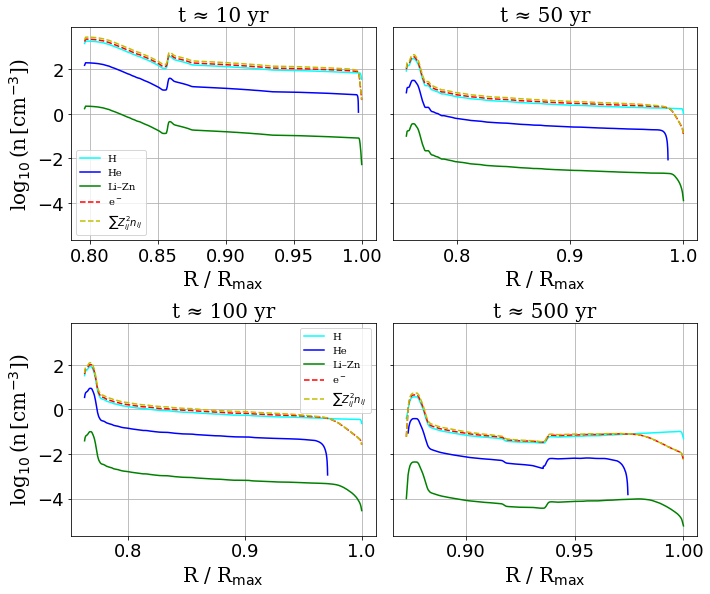

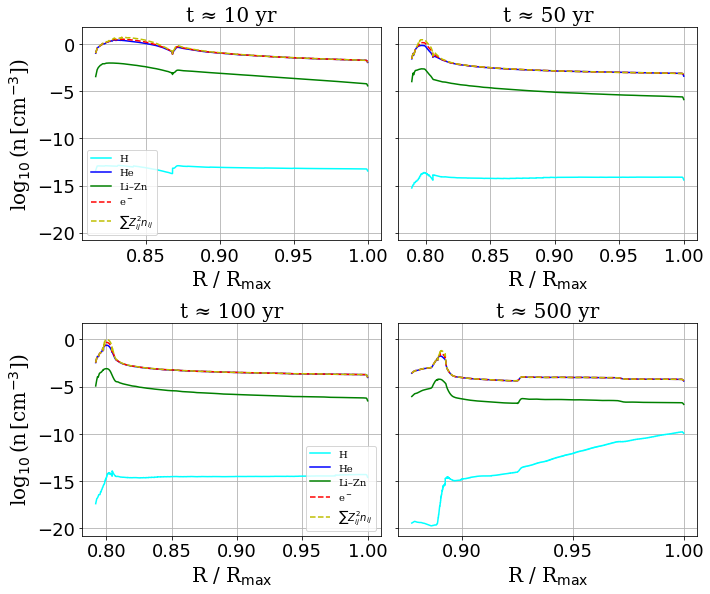

/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10
/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10
/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10
/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10


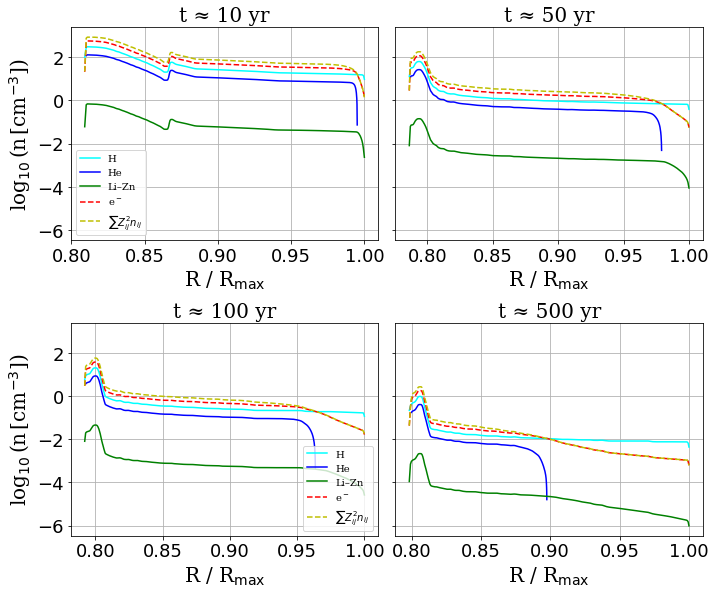

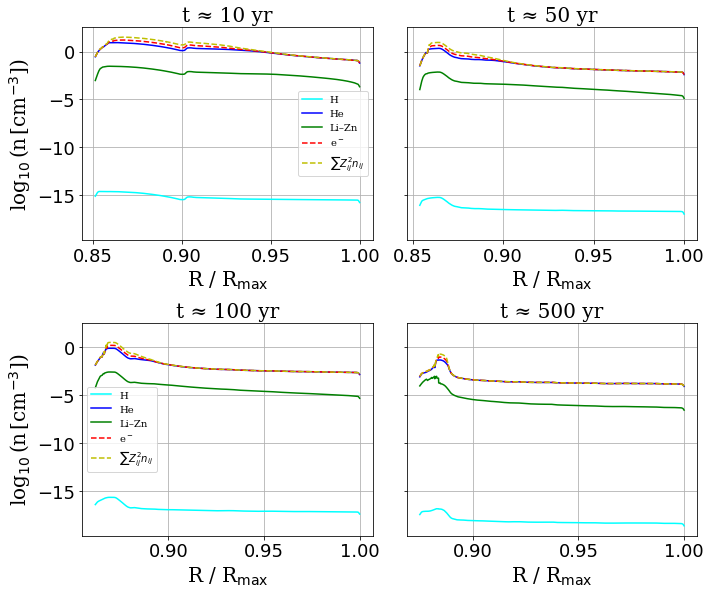

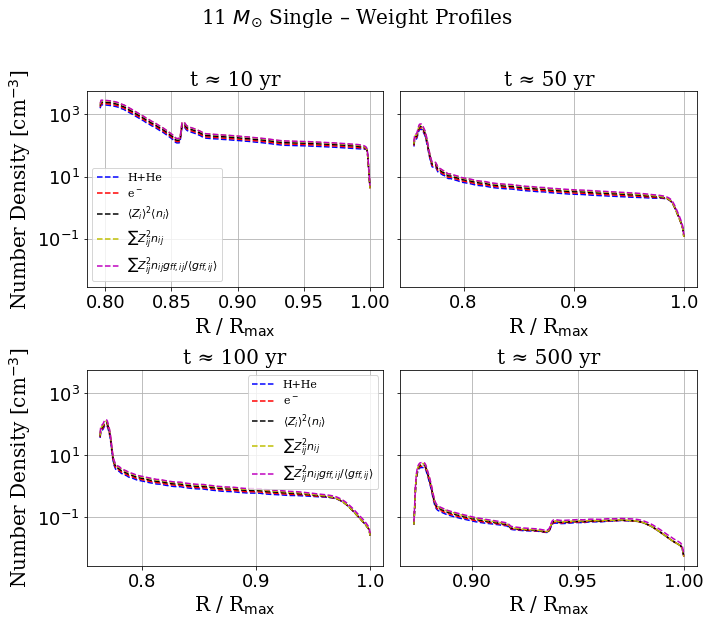

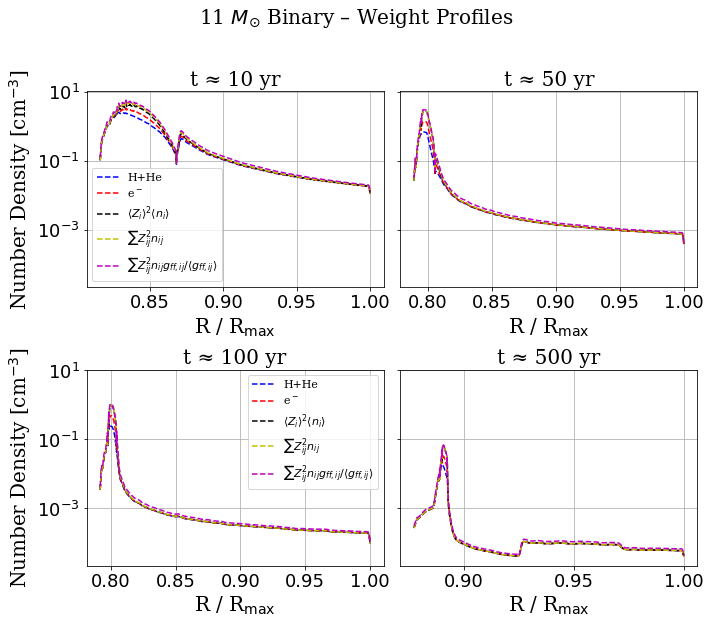

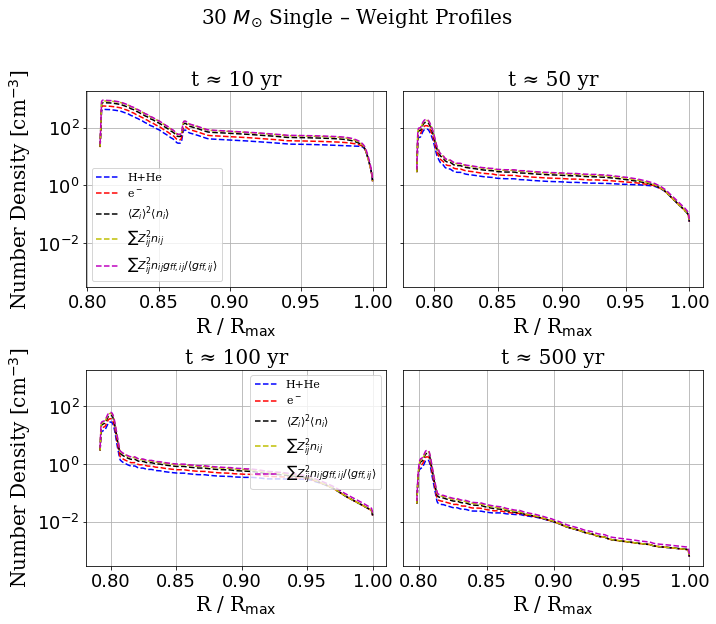

...

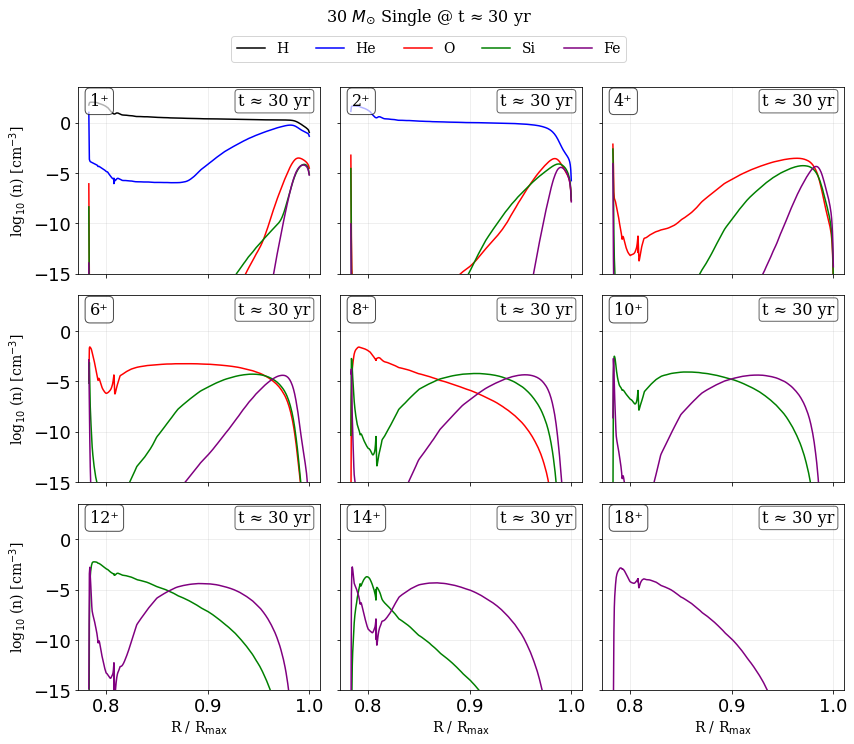

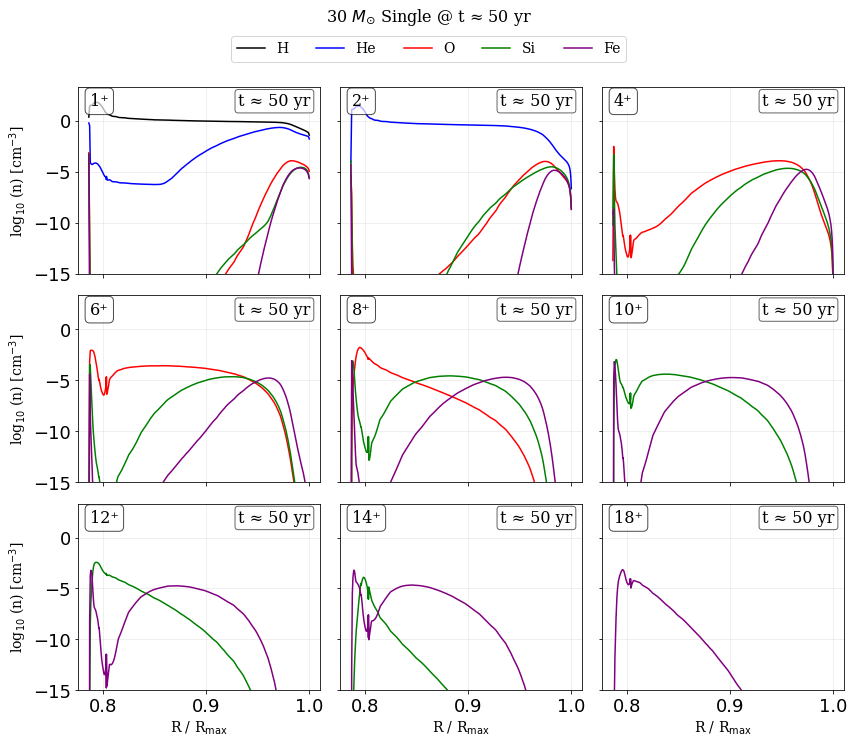

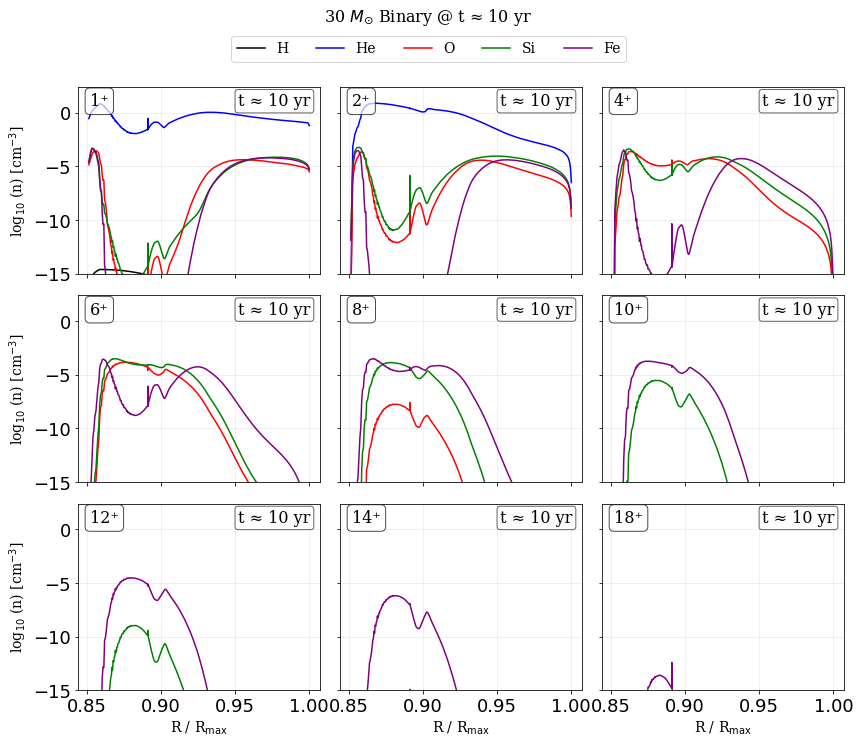

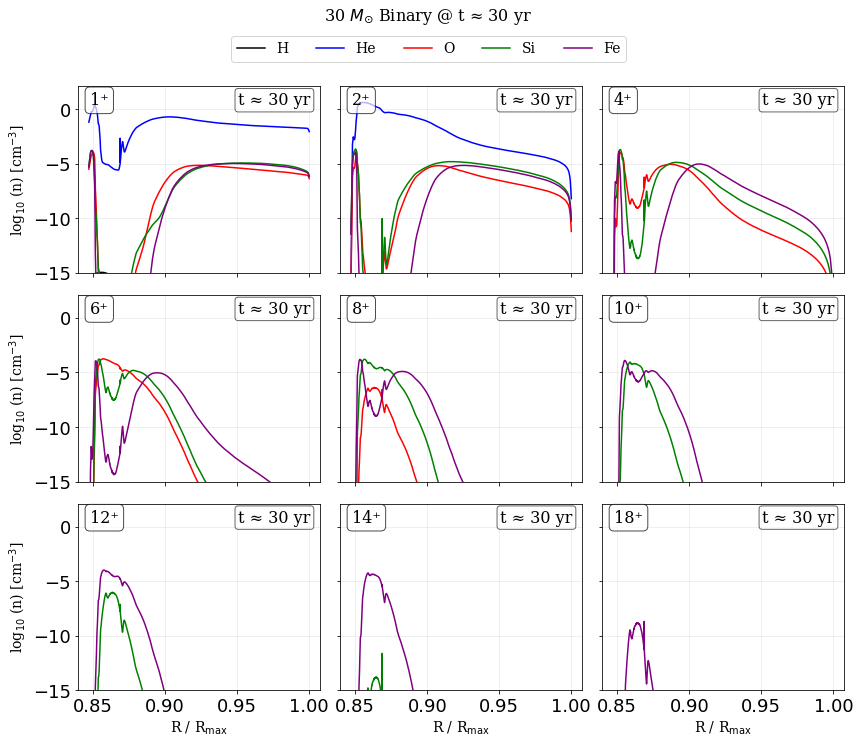

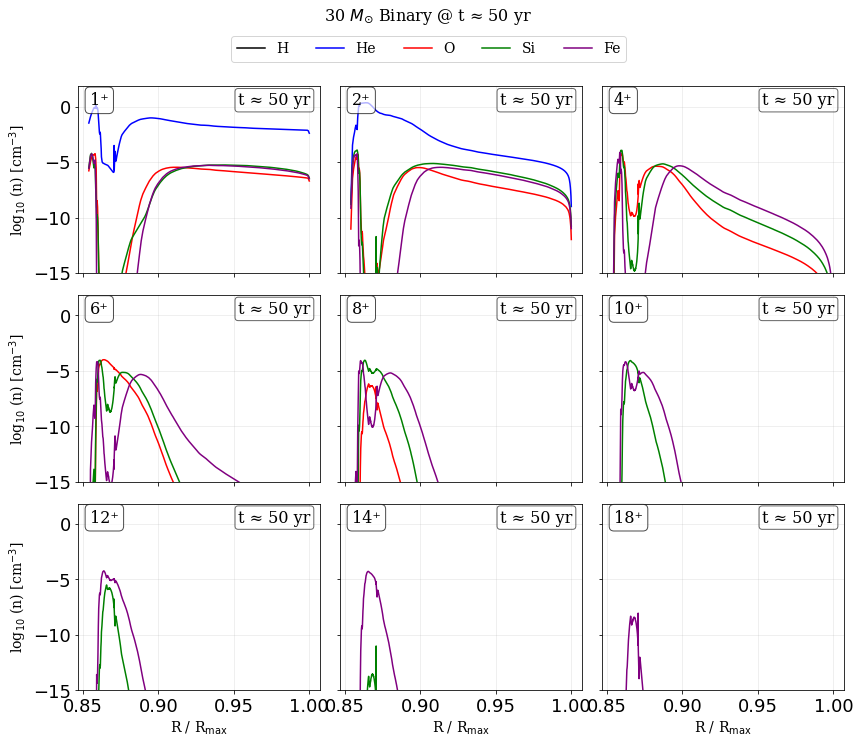

In [100]:
chosen_times = [10, 50, 100, 500]
for m in masses:
    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        if key not in all_results_sh:
            continue
        
        data = all_results_sh[key]
        time_all = np.array(data["time"])
        idxs = [np.argmin(np.abs(time_all - t)) for t in chosen_times]
        n_panels = len(idxs)
        if n_panels <= 3:
            nrows = 1
            ncols = n_panels
        elif n_panels <= 4:
            nrows = 2
            ncols = 2
        elif n_panels <= 6:
            nrows = 3
            ncols = 2
        else:
            ncols = np.ceil(np.sqrt(n_panels))
            nrows = np.ceil(n_panels / ncols)
        fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4.4 * nrows), sharey=True)
        axes = axes.flatten()
        if len(idxs) == 1:
            axes = [axes]

        for ax, idx, tsel in zip(axes, idxs, chosen_times):
            r_pc = data["radius_profiles"][idx]
            r_norm = r_pc / r_pc.max()
            hhe = data["hhe_profiles"][idx]
            lizn = data["LiZn_profiles"][idx]
            ne = data["ne_profiles"][idx]
            Zavg = data["Z_avg_profiles"][idx]
            n_p = data["n_p_profiles"][idx]
            n_ion = data["ion_tot_profiles"][idx]
            Z2n  = data["Z2n_profiles"][idx]
            Z2n_gff  = data["Z2n_gff_profiles"][idx]
            sum_gff  = data["sum_gff_profiles"][idx]
            gff_avg  = data["gff_avg_profiles"][idx]
            Z_avg2n = Zavg**2*n_ion
            #ax.plot(r_norm, hhe, color="blue", label="H+He")
            ax.plot(r_norm, np.log10(n_p), color="cyan", label="H")
            ax.plot(r_norm, np.log10(hhe-n_p), color="blue", label="He")
            ax.plot(r_norm, np.log10(lizn), color="green", label="Li–Zn")
            ax.plot(r_norm, np.log10(ne), color="red", ls="--", label="e$^-$")
            #ax.plot(r_norm, Z_avg2n, color="k", ls="--", label=r"$\langle Z \rangle^2 n_{i} [{\rm cm^{-3}}]$")
            ax.plot(r_norm, np.log10(Z2n), color="y", ls="--", label=r"$\sum  Z_{ij}^2 n_{ij}$")
            #ax.plot(r_norm, Z2n_gff/gff_avg, color="m", ls="--", label=r"$\sum  Z_{ij}^2 n_{ij} g_{ff, ij}/ \langle g_{ff, ij} \rangle \ [{\rm cm^{-3}}]$")
            #ax.plot(r_norm, gff_avg, color="orange", ls="--", label=r"$\langle g_{ff, ij} \rangle$")
            
            #ax.set_yscale("log")
            ax.set_xlabel(r"R / R$_\mathrm{max}$", **font_label)
            ax.set_title(f"t ≈ {tsel:.0f} yr", **font_label)
            ax.grid(True, which="both")
            ax.tick_params(labelsize=tick_size)

        #axes[0].set_ylabel("Number Density [cm$^{-3}$]", **font_label)
        axes[0].set_ylabel("log$_{10}\,$(n$\,$[cm$^{-3}$])", **font_label)
        axes[0].legend(prop=font_legend_xxxsmall)
        axes[2].set_ylabel("log$_{10}\,$(n$\,$[cm$^{-3}$])", **font_label)
        axes[2].legend(prop=font_legend_xxxsmall)
        #fig.suptitle(f"{m} $M_{{\odot}}$ {model.capitalize()} – Composition Profiles", **font_label)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.savefig(f"ion_profiles_{m}_{model}_shock.png", dpi=150)
        plt.show()

####Gaunt factor comparison
for m in masses:
    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        if key not in all_results_sh:
            continue
        
        data = all_results_sh[key]
        time_all = np.array(data["time"])
        idxs = [np.argmin(np.abs(time_all - t)) for t in chosen_times]
        n_panels = len(idxs)
        if n_panels <= 3:
            nrows = 1
            ncols = n_panels
        elif n_panels <= 4:
            nrows = 2
            ncols = 2
        elif n_panels <= 6:
            nrows = 3
            ncols = 2
        else:
            ncols = np.ceil(np.sqrt(n_panels))
            nrows = np.ceil(n_panels / ncols)
        fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4.4 * nrows), sharey=True)
        axes = axes.flatten()
        if len(idxs) == 1:
            axes = [axes]

        for ax, idx, tsel in zip(axes, idxs, chosen_times):
            r_pc = data["radius_profiles"][idx]
            r_norm = r_pc / r_pc.max()
            hhe = data["hhe_profiles"][idx]
            cfe = data["LiZn_profiles"][idx]
            ne = data["ne_profiles"][idx]
            Zavg = data["Z_avg_profiles"][idx]
            n_p = data["n_p_profiles"][idx]
            n_ion = data["ion_tot_profiles"][idx]
            Z2n  = data["Z2n_profiles"][idx]
            Z2n_gff  = data["Z2n_gff_profiles"][idx]
            sum_gff  = data["sum_gff_profiles"][idx]
            gff_avg  = data["gff_avg_profiles"][idx]
            Z_avg2n = Zavg**2*n_ion
            #ax.plot(r_norm, n_p, color="cyan", label="H")
            ax.plot(r_norm, hhe, color="blue", ls = "--", label="H+He")
            #ax.plot(r_norm, cfe, color="green", label="Li–Zn")
            ax.plot(r_norm, ne, color="red", ls="--", label="e$^-$")
            ax.plot(r_norm, Z_avg2n, color="k", ls="--", label=r"$\langle Z_i \rangle^2 \langle n_{i} \rangle$")
            ax.plot(r_norm, Z2n, color="y", ls="--", label=r"$\sum  Z_{ij}^2 n_{ij}$")
            ax.plot(r_norm, Z2n_gff/gff_avg, color="m", ls="--", label=r"$\sum  Z_{ij}^2 n_{ij} g_{ff, ij}/ \langle g_{ff, ij} \rangle$")
            #ax.plot(r_norm, Z2n_gff/sum_gff, color="purple", ls="--", label=r"$\sum  Z_{ij}^2 n_{ij} g_{ff, ij}/ \sum g_{ff, ij}$")
            #ax.plot(r_norm, gff_avg, color="orange", ls="--", label=r"$\langle g_{ff, ij} \rangle$")
            
            ax.set_yscale("log")
            ax.set_xlabel(r"R / R$_\mathrm{max}$", **font_label)
            ax.set_title(f"t ≈ {tsel:.0f} yr", **font_label)
            ax.grid(True, which="both")
            ax.tick_params(labelsize=tick_size)

        axes[0].set_ylabel("Number Density [cm$^{-3}$]", **font_label)
        axes[0].legend(prop=font_legend_xxsmall)
        axes[2].set_ylabel("Number Density [cm$^{-3}$]", **font_label)
        axes[2].legend(prop=font_legend_xxsmall)
        fig.suptitle(f"{m} $M_{{\odot}}$ {model.capitalize()} – Weight Profiles", **font_label)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.savefig(f"Gaunt_factor_{m}_{model}.png", dpi=150)
        plt.show()

        
def get_ion_block_index(el, charge):
    """
    Return column index inside ion_block (shape: [N_shell, 495]),
    where ion_block = data[:, xion_start:xion_start+495].
    """
    Z = atomic_Z[el]
    if charge < 0 or charge > Z:
        return None
    return species_offset(el) + charge   # 注意：这里不加 xion_start

# === 多个时间点的离子分布图（r-normalized） ===
#plot_times = [10, 50, 100, 250, 500]  # yr
plot_times = [10, 30, 50]
plot_elems = ["H", "He", "O", "Si", "Fe"]
colors = {"H": "black", "He": "blue", "O": "red", "Si": "green", "Fe": "purple"}
charges = [1, 2, 4, 6, 8, 10, 12, 14, 18]
EPS = 1e-80   # 防止 log10(0)

for m in masses:
    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        if key not in all_results_sh:
            continue

        data = all_results_sh[key]
        time_all = np.asarray(data["time"])

        for t_target in plot_times:
            idx = int(np.argmin(np.abs(time_all - t_target)))

            r_pc   = np.asarray(data["radius_profiles"][idx])
            r_norm = r_pc / np.nanmax(r_pc)

            ion_abund = np.asarray(data["ion_abundaces"][idx])  # (N_shell, 30)
            ion_block = np.asarray(data["ion_blocks"][idx])     # (N_shell, 495)
            n_p       = np.asarray(data["n_p_profiles"][idx])   # (N_shell,)

            fig, axes = plt.subplots(3, 3, figsize=(12, 10.5), sharex=True, sharey=True)
            axes = axes.flatten()

            # --------- 先扫一遍算出全图的 ymin（避免写死 -22/-10）---------
            global_min = np.inf
            global_max = 0
            for q in charges[:len(axes)]:
                for el in plot_elems:
                    j = get_ion_block_index(el, q)     # ✅ 正确：局部索引
                    if j is None:
                        continue

                    Z = atomic_Z[el]
                    x_i = ion_abund[:, Z-1]            # 元素丰度 (log10 scale + 12)
                    n_i = n_p * 10**(x_i - 12.0)       # 元素数密度
                    y_ij = ion_block[:, j]             # ✅ 正确列
                    n_el_q = n_i * y_ij

                    # 只考虑正值，防止 -inf 污染
                    positive = n_el_q > 0
                    if np.any(positive):
                        global_min = min(global_min, np.log10(np.nanmin(n_el_q[positive])))
                        global_max = max(global_max, np.log10(np.nanmax(n_el_q[positive])))

            # 给一点 margin
            if np.isfinite(global_min):
                #y_bottom = global_min - 0.5
                y_top = global_max + 1.5
                y_bottom = -15
            else:
                y_top = 1
                # 极端情况兜底
                y_bottom = -15

            # --------- 正式作图 ---------
            for ax, q in zip(axes, charges[:len(axes)]):
                for el in plot_elems:
                    j = get_ion_block_index(el, q)      # ✅ 正确：局部索引
                    if j is None:
                        continue

                    Z = atomic_Z[el]
                    x_i = ion_abund[:, Z-1]
                    n_i = n_p * 10**(x_i - 12.0)

                    y_ij = ion_block[:, j]
                    n_el_q = n_i * y_ij

                    log_n_el_q = np.log10(np.maximum(n_el_q, EPS))  # ✅ 防止 -inf
                    ax.plot(r_norm, log_n_el_q, color=colors[el],
                            label=el if q == charges[0] else None)

                ax.set_ylim(y_bottom, y_top)
                ax.grid(True, alpha=0.25)
                ax.text(0.05, 0.90, f"{q}⁺", transform=ax.transAxes, fontdict=font_label_small,
                        bbox=dict(boxstyle="round", fc="white", alpha=0.7))
                ax.text(0.96, 0.97, f"t ≈ {t_target:.0f} yr", transform=ax.transAxes,
                        fontdict=font_label_small, ha="right", va="top",
                        bbox=dict(boxstyle="round,pad=0.2", fc="white", alpha=0.6))
                ax.tick_params(labelsize=tick_size)

            # 轴标签
            for ax in axes[-3:]:
                ax.set_xlabel(r"R / R$_{\rm max}$", **font_label_xsmall)
            for ax in axes[::3]:
                ax.set_ylabel(r"log$_{10}$ (n) [cm$^{-3}$]", **font_label_xsmall)

            # 图例
            handles = [plt.Line2D([], [], color=colors[el]) for el in plot_elems]
            fig.legend(handles, plot_elems, loc="upper center",
                       bbox_to_anchor=(0.5, 0.95), ncol=len(plot_elems),
                       prop=font_legend_small)

            fig.suptitle(f"{m} $M_{{\\odot}}$ {model.capitalize()} @ t ≈ {t_target:.0f} yr",
                         y=0.98, **font_label_small)

            fig.tight_layout(rect=[0, 0, 1, 0.93])
            out = f"ion_panel_{m}_{model}_t{t_target}_shock.png"
            plt.savefig(out, dpi=150)
            plt.show()
            plt.close()

DM_max @ t=9.0 yr for 11_single: 8.2766
DM_max @ t=14.0 yr for 11_binary: 0.0263932
DM_max @ t=10.0 yr for 30_single: 2.06339
DM_max @ t=11.0 yr for 30_binary: 0.0733325


/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10
/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10


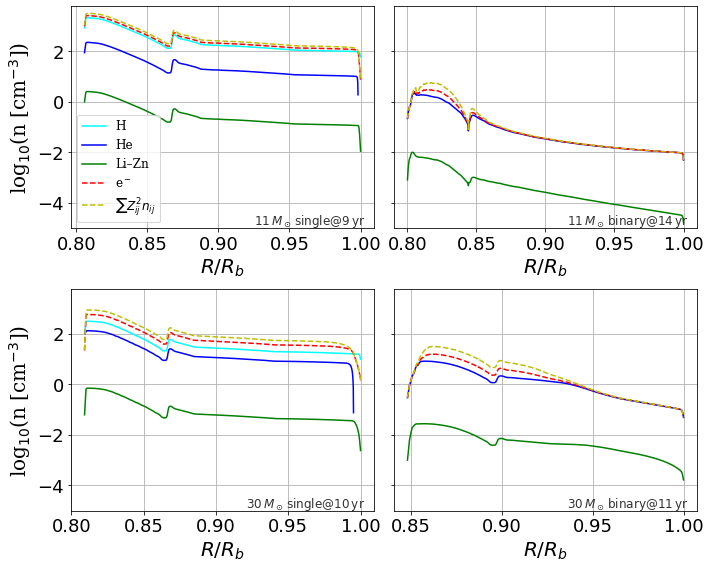

In [313]:
# === 1) DM 峰值时间（用 full） ===
peak_times = {}
for m in [11, 30]:
    for model in ["single", "binary"]:
        key = f"{ m}_{model}"
        if key not in all_results_sh:
            continue
        res = all_results_sh[key]
        t = np.asarray(res["time"], dtype=float)
        dm = np.asarray(res["dm"], dtype=float)
        if t.size == 0:
            continue
        idx = np.nanargmax(dm)
        peak_times[key] = t[idx]
        print(f"DM_max @ t={t[idx]:.1f} yr for {key}: {dm[idx]:.6g}")

# === 2) 四模型的 ionization profile（用 shock profile） ===
fig, axes = plt.subplots(2, 2, figsize=(10, 8), sharey=True)
axes = axes.flatten()
order = [("11_single", 0), ("11_binary", 1), ("30_single", 2), ("30_binary", 3)]

for key, ax_idx in order:
    ax = axes[ax_idx]
    if key not in all_results_sh or key not in peak_times:
        ax.set_title(f"{key} (missing)")
        continue

    data = all_results_sh[key]
    t_all = np.asarray(data["time"], dtype=float)
    t_peak = peak_times[key]
    idx = np.argmin(np.abs(t_all - t_peak))

    r_pc = data["radius_profiles"][idx]
    r_norm = r_pc / r_pc.max()

    hhe = data["hhe_profiles"][idx]
    lizn = data["LiZn_profiles"][idx]
    ne = data["ne_profiles"][idx]
    Zavg = data["Z_avg_profiles"][idx]
    n_p = data["n_p_profiles"][idx]
    n_ion = data["ion_tot_profiles"][idx]
    Z2n = data["Z2n_profiles"][idx]

    ax.plot(r_norm, np.log10(n_p), color="cyan", label="H")
    ax.plot(r_norm, np.log10(hhe - n_p), color="blue", label="He")
    ax.plot(r_norm, np.log10(lizn), color="green", label="Li–Zn")
    ax.plot(r_norm, np.log10(ne), color="red", ls="--", label="e$^-$")
    ax.plot(r_norm, np.log10(Z2n), color="y", ls="--", label=r"$\sum Z_{ij}^2 n_{ij}$")

    ax.set_xlabel(r"$R / R_b$", **font_label)
    ax.set_ylim(bottom = -5)
    #ax.set_title(f"{key.replace('_',' ')} | t≈{t_all[idx]:.1f} yr", **font_label_small)
    ax.grid(True, which="both")
    ax.tick_params(labelsize=tick_size)
    ax.text(
        0.97, 0.07,
        f"{key.split('_')[0]}$\,M_\odot\,${key.split('_')[1]}@{int(t_all[idx])}$\,$yr",
        transform=ax.transAxes,
        ha="right", va="top",
        fontsize=12,
        color="0.2"
    )
axes[0].set_ylabel("log$_{10}$(n [cm$^{-3}$])", **font_label)
axes[2].set_ylabel("log$_{10}$(n [cm$^{-3}$])", **font_label)
axes[0].legend(prop=font_legend_xsmall)

plt.tight_layout()
plt.savefig("ion_profiles_at_DMpeak_4models.png", dpi=150)
plt.show()


# Elements history (unshock)

/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10
/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10
/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10
/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10


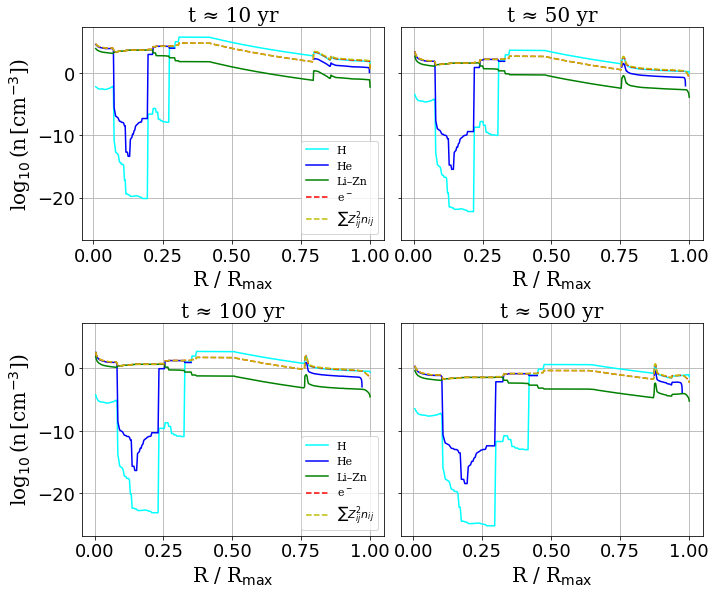

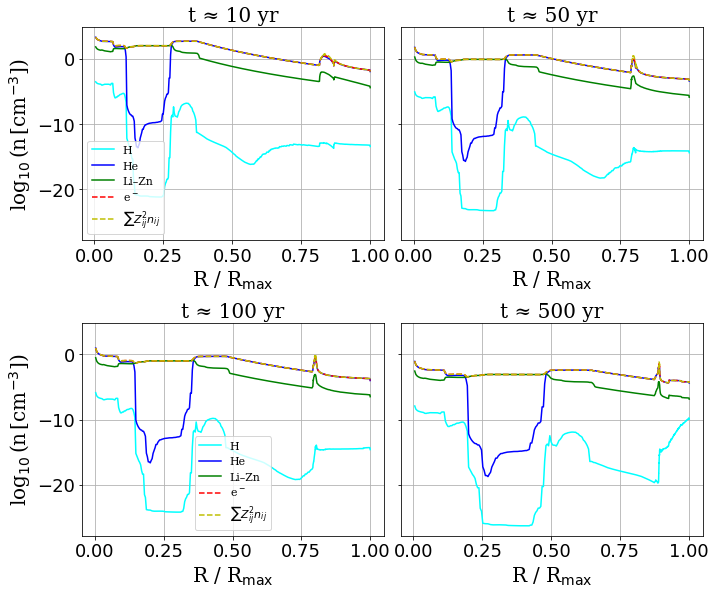

/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10
/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10
/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10
/opt/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in log10


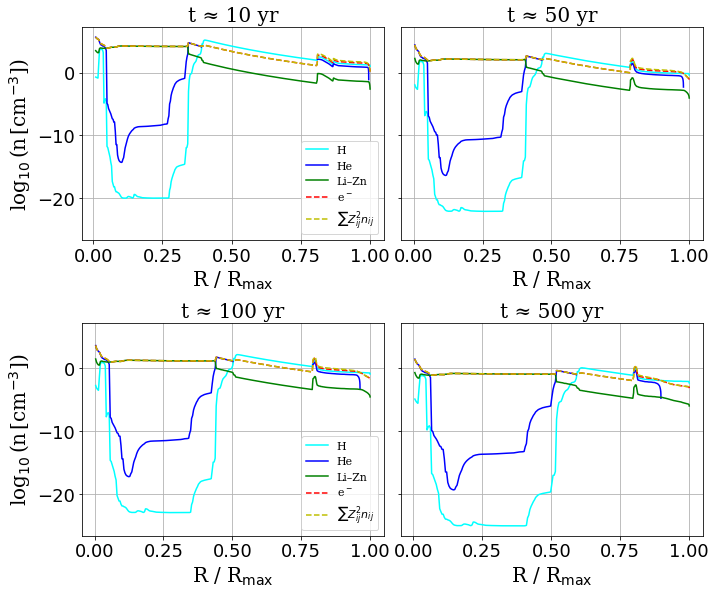

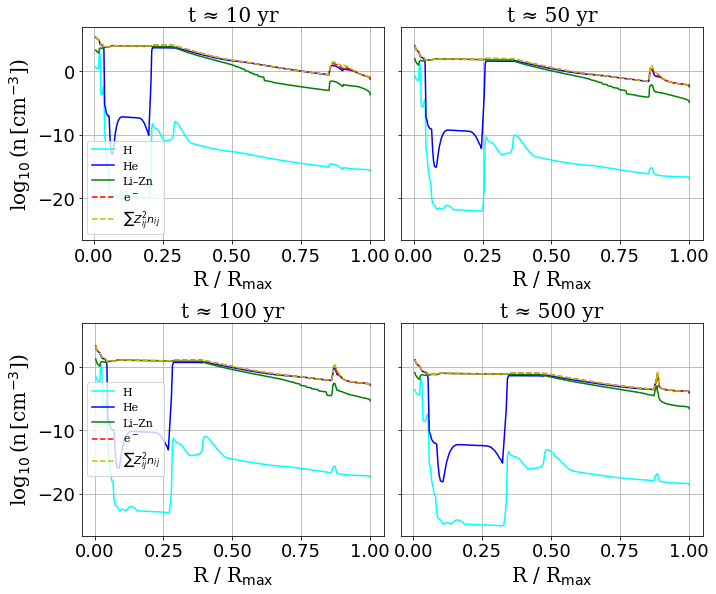

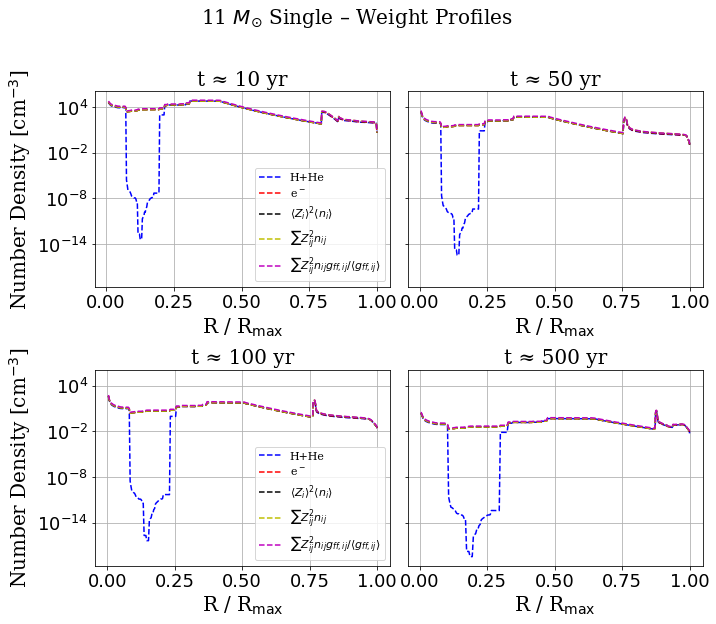

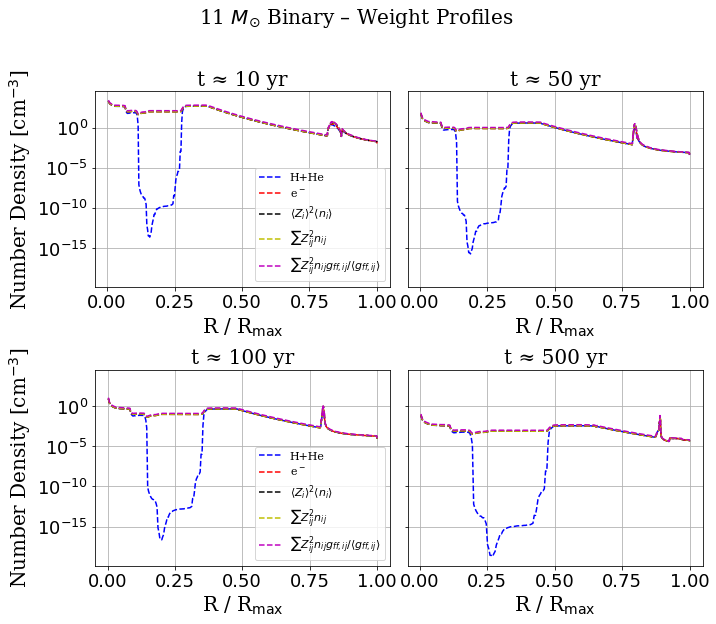

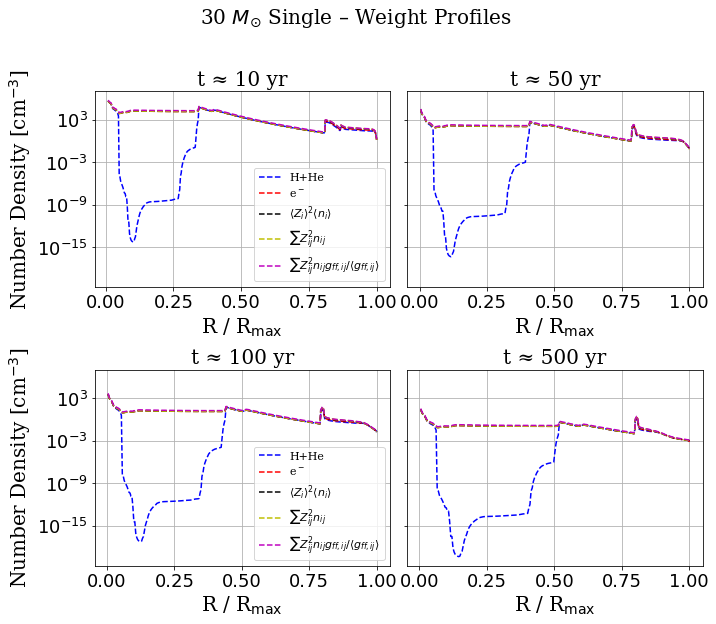

...

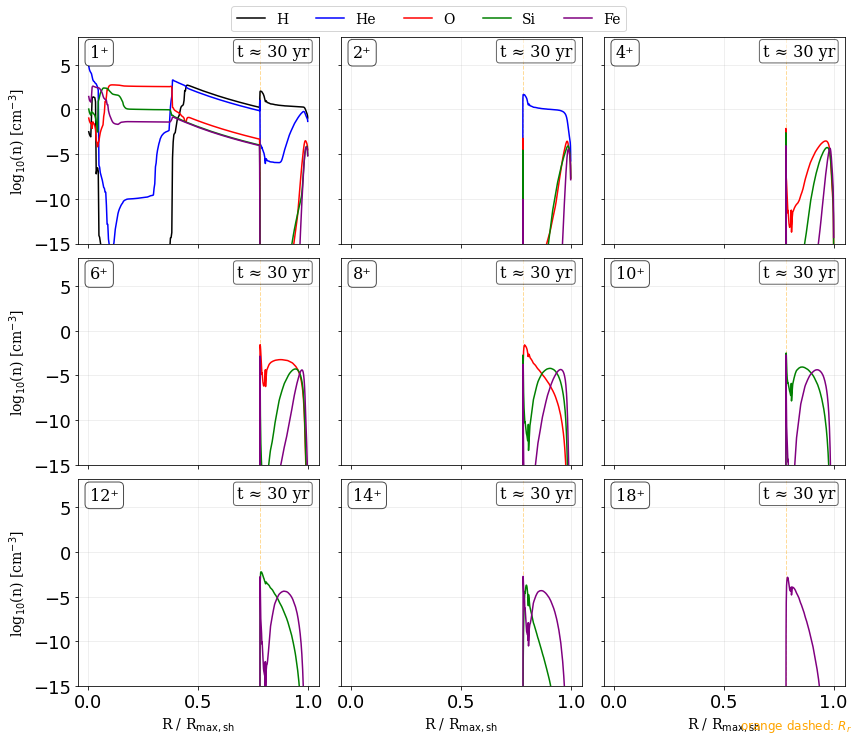

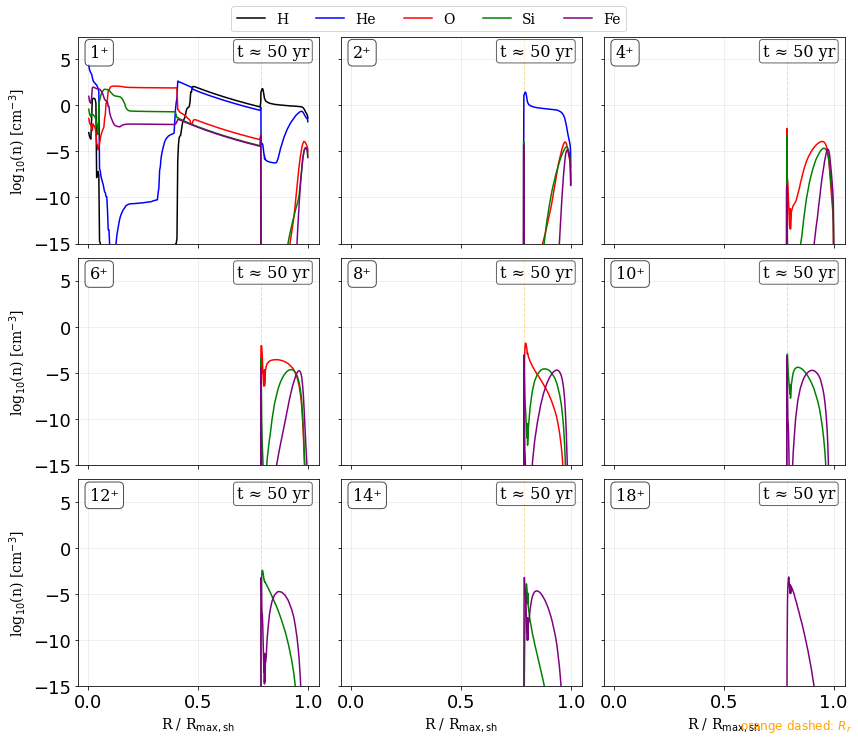

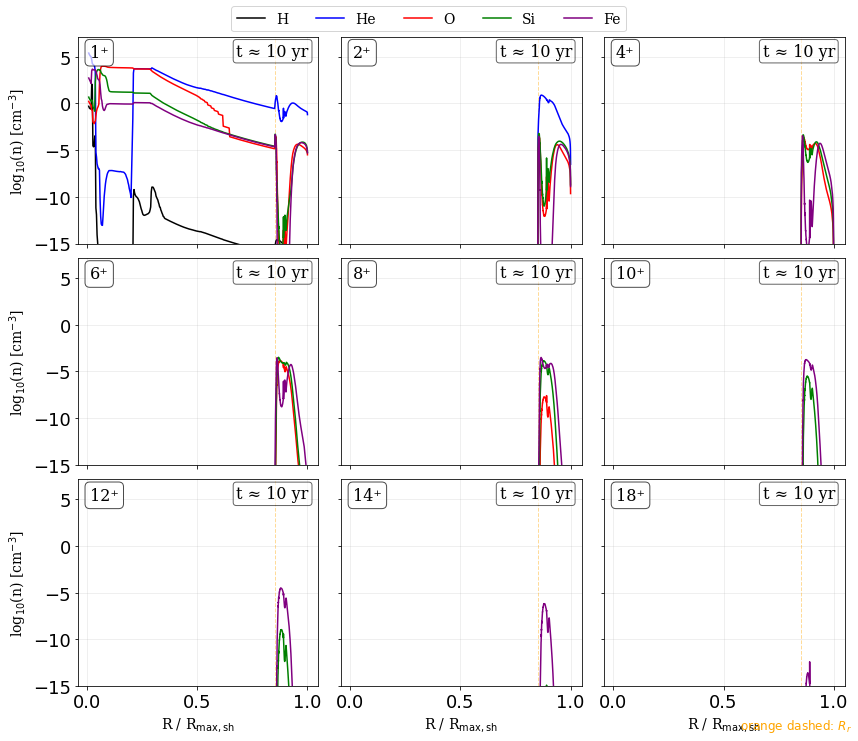

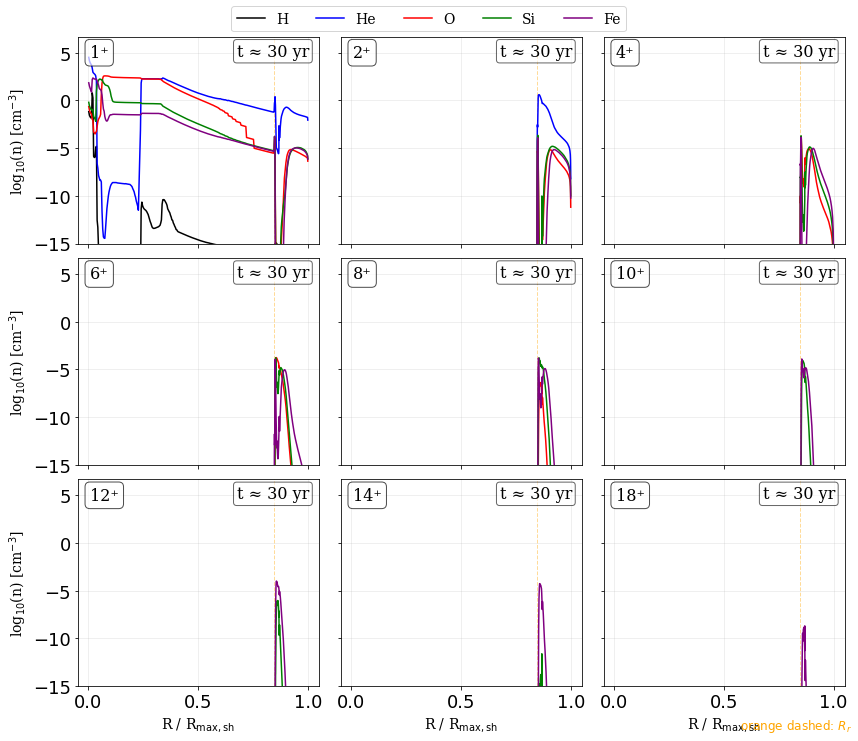

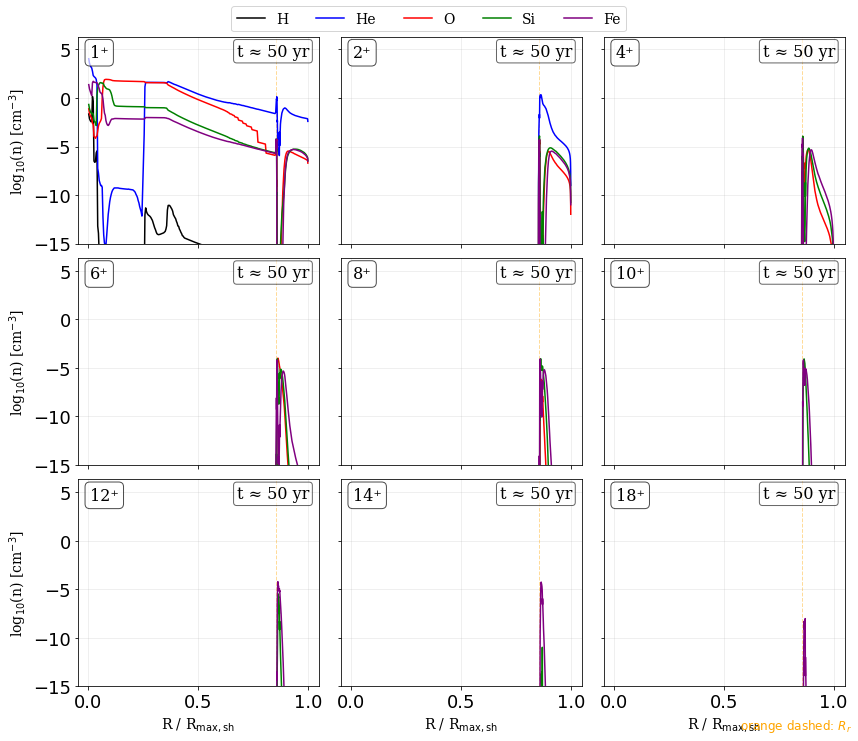

In [101]:
chosen_times = [10, 50, 100, 500]
for m in masses:
    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        if key not in all_results_unsh:
            continue
        
        data = all_results_unsh[key]
        time_all = np.array(data["time"])
        idxs = [np.argmin(np.abs(time_all - t)) for t in chosen_times]
        n_panels = len(idxs)
        if n_panels <= 3:
            nrows = 1
            ncols = n_panels
        elif n_panels <= 4:
            nrows = 2
            ncols = 2
        elif n_panels <= 6:
            nrows = 3
            ncols = 2
        else:
            ncols = np.ceil(np.sqrt(n_panels))
            nrows = np.ceil(n_panels / ncols)
        fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4.4 * nrows), sharey=True)
        axes = axes.flatten()
        if len(idxs) == 1:
            axes = [axes]

        for ax, idx, tsel in zip(axes, idxs, chosen_times):
            r_pc = data["radius_profiles"][idx]
            r_norm = r_pc / r_pc.max()
            hhe = data["hhe_profiles"][idx]
            lizn = data["LiZn_profiles"][idx]
            ne = data["ne_profiles"][idx]
            Zavg = data["Z_avg_profiles"][idx]
            n_p = data["n_p_profiles"][idx]
            n_ion = data["ion_tot_profiles"][idx]
            Z2n  = data["Z2n_profiles"][idx]
            Z2n_gff  = data["Z2n_gff_profiles"][idx]
            sum_gff  = data["sum_gff_profiles"][idx]
            gff_avg  = data["gff_avg_profiles"][idx]
            Z_avg2n = Zavg**2*n_ion
            #ax.plot(r_norm, hhe, color="blue", label="H+He")
            ax.plot(r_norm, np.log10(n_p), color="cyan", label="H")
            ax.plot(r_norm, np.log10(hhe-n_p), color="blue", label="He")
            ax.plot(r_norm, np.log10(lizn), color="green", label="Li–Zn")
            ax.plot(r_norm, np.log10(ne), color="red", ls="--", label="e$^-$")
            #ax.plot(r_norm, Z_avg2n, color="k", ls="--", label=r"$\langle Z \rangle^2 n_{i} [{\rm cm^{-3}}]$")
            ax.plot(r_norm, np.log10(Z2n), color="y", ls="--", label=r"$\sum  Z_{ij}^2 n_{ij}$")
            #ax.plot(r_norm, Z2n_gff/gff_avg, color="m", ls="--", label=r"$\sum  Z_{ij}^2 n_{ij} g_{ff, ij}/ \langle g_{ff, ij} \rangle \ [{\rm cm^{-3}}]$")
            #ax.plot(r_norm, gff_avg, color="orange", ls="--", label=r"$\langle g_{ff, ij} \rangle$")
            
            #ax.set_yscale("log")
            ax.set_xlabel(r"R / R$_\mathrm{max}$", **font_label)
            ax.set_title(f"t ≈ {tsel:.0f} yr", **font_label)
            ax.grid(True, which="both")
            ax.tick_params(labelsize=tick_size)

        #axes[0].set_ylabel("Number Density [cm$^{-3}$]", **font_label)
        axes[0].set_ylabel("log$_{10}\,$(n$\,$[cm$^{-3}$])", **font_label)
        axes[0].legend(prop=font_legend_xxsmall)
        axes[2].set_ylabel("log$_{10}\,$(n$\,$[cm$^{-3}$])", **font_label)
        axes[2].legend(prop=font_legend_xxsmall)
        #fig.suptitle(f"{m} $M_{{\odot}}$ {model.capitalize()} – Composition Profiles", **font_label)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.savefig(f"ion_profiles_{m}_{model}_unsh.png", dpi=150)
        plt.show()

####Gaunt factor comparison
for m in masses:
    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        if key not in all_results_unsh:
            continue
        
        data = all_results_unsh[key]
        
        time_all = np.array(data["time"])
        idxs = [np.argmin(np.abs(time_all - t)) for t in chosen_times]
        n_panels = len(idxs)
        if n_panels <= 3:
            nrows = 1
            ncols = n_panels
        elif n_panels <= 4:
            nrows = 2
            ncols = 2
        elif n_panels <= 6:
            nrows = 3
            ncols = 2
        else:
            ncols = np.ceil(np.sqrt(n_panels))
            nrows = np.ceil(n_panels / ncols)
        fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4.4 * nrows), sharey=True)
        axes = axes.flatten()
        if len(idxs) == 1:
            axes = [axes]

        for ax, idx, tsel in zip(axes, idxs, chosen_times):
            r_pc = data["radius_profiles"][idx]
            r_norm = r_pc / r_pc.max()
            hhe = data["hhe_profiles"][idx]
            cfe = data["LiZn_profiles"][idx]
            ne = data["ne_profiles"][idx]
            Zavg = data["Z_avg_profiles"][idx]
            n_p = data["n_p_profiles"][idx]
            n_ion = data["ion_tot_profiles"][idx]
            Z2n  = data["Z2n_profiles"][idx]
            Z2n_gff  = data["Z2n_gff_profiles"][idx]
            sum_gff  = data["sum_gff_profiles"][idx]
            gff_avg  = data["gff_avg_profiles"][idx]
            
            Z_avg2n = Zavg**2*n_ion
            #ax.plot(r_norm, n_p, color="cyan", label="H")
            ax.plot(r_norm, hhe, color="blue", ls = "--", label="H+He")
            #ax.plot(r_norm, cfe, color="green", label="Li–Zn")
            ax.plot(r_norm, ne, color="red", ls="--", label="e$^-$")
            ax.plot(r_norm, Z_avg2n, color="k", ls="--", label=r"$\langle Z_i \rangle^2 \langle n_{i} \rangle$")
            ax.plot(r_norm, Z2n, color="y", ls="--", label=r"$\sum  Z_{ij}^2 n_{ij}$")
            ax.plot(r_norm, Z2n_gff/gff_avg, color="m", ls="--", label=r"$\sum  Z_{ij}^2 n_{ij} g_{ff, ij}/ \langle g_{ff, ij} \rangle$")
            #ax.plot(r_norm, Z2n_gff/sum_gff, color="purple", ls="--", label=r"$\sum  Z_{ij}^2 n_{ij} g_{ff, ij}/ \sum g_{ff, ij}$")
            #ax.plot(r_norm, gff_avg, color="orange", ls="--", label=r"$\langle g_{ff, ij} \rangle$")
            ax.set_yscale("log")
            ax.set_xlabel(r"R / R$_\mathrm{max}$", **font_label)
            ax.set_title(f"t ≈ {tsel:.0f} yr", **font_label)
            ax.grid(True, which="both")
            ax.tick_params(labelsize=tick_size)

        axes[0].set_ylabel("Number Density [cm$^{-3}$]", **font_label)
        axes[0].legend(prop=font_legend_xxsmall)
        axes[2].set_ylabel("Number Density [cm$^{-3}$]", **font_label)
        axes[2].legend(prop=font_legend_xxsmall)
        fig.suptitle(f"{m} $M_{{\odot}}$ {model.capitalize()} – Weight Profiles", **font_label)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.savefig(f"Gaunt_factor_{m}_{model}_unsh.png", dpi=150)
        plt.show()

# === 多个时间点的离子分布图（r-normalized） ===
EPS = 1e-80  # 防止 log10(0)

for m in masses:
    for model in ["single", "binary"]:
        key = f"{m}_{model}"
        if key not in all_results_unsh or key not in all_results_sh:
            continue

        unsh = all_results_unsh[key]
        sh   = all_results_sh[key]

        time_unsh = np.asarray(unsh["time"])
        time_sh   = np.asarray(sh["time"])

        for t_target in plot_times:
            # --- 时间对齐：unsh 与 shock 可能时间数组不同，分别找最近的 idx ---
            idx_u = int(np.argmin(np.abs(time_unsh - t_target)))
            idx_s = int(np.argmin(np.abs(time_sh   - t_target)))

            # --- profiles ---
            r_pc_u = np.asarray(unsh["radius_profiles"][idx_u])     # pc, unsh
            ion_abund = np.asarray(unsh["ion_abundaces"][idx_u])    # (N,30)
            ion_block = np.asarray(unsh["ion_blocks"][idx_u])       # (N,495)
            n_p       = np.asarray(unsh["n_p_profiles"][idx_u])     # (N,)

            # --- 统一归一化：用 shock 的 R_max 作为分母（你想要 R / R_max,sh）
            rmax_sh_pc = np.nanmax(np.asarray(sh["radius_profiles"][idx_s]))
            r_norm = r_pc_u / rmax_sh_pc

            # --- reverse shock radius（来自 shock 数据）
            # 你原来用 sh["r_r"][idx]，但 idx 要用 idx_s
            r_r_pc = float(np.asarray(sh["r_r"])[idx_s])   # pc
            r_r_norm = r_r_pc / rmax_sh_pc

            # --- 画布 ---
            fig, axes = plt.subplots(3, 3, figsize=(12, 10.5), sharex=True, sharey=True)
            axes = axes.flatten()

            # --- y 轴下限（保留你的写死逻辑；可按需改为自动）
            if model == "binary":
                bottom = -15
            else:
                bottom = -15

            # --- 每个 panel 对应一个 charge ---
            for ax, q in zip(axes, charges[:len(axes)]):

                # 先画 R_r（每个 panel 一次，且不在 legend 里刷屏）
                ax.axvline(x=r_r_norm, c="orange", ls="--", lw=1, alpha=0.4)

                for el in plot_elems:
                    j = get_ion_block_index(el, q)   # ✅ 局部索引
                    if j is None:
                        continue

                    Z = atomic_Z[el]
                    x_i = ion_abund[:, Z-1]
                    n_i = n_p * 10**(x_i - 12.0)

                    y_ij = ion_block[:, j]
                    n_el_q = n_i * y_ij

                    log_n_el_q = np.log10(np.maximum(n_el_q, EPS))
                    ax.plot(r_norm, log_n_el_q, color=colors[el],
                            label=el if q == charges[0] else None)

                ax.set_ylim(bottom, None)
                ax.grid(True, alpha=0.25)
                ax.tick_params(labelsize=tick_size)

                ax.text(0.05, 0.90, f"{q}⁺", transform=ax.transAxes, fontdict=font_label_small,
                        bbox=dict(boxstyle="round", fc="white", alpha=0.7))
                ax.text(0.96, 0.97, f"t ≈ {t_target:.0f} yr", transform=ax.transAxes,
                        fontdict=font_label_small, ha="right", va="top",
                        bbox=dict(boxstyle="round,pad=0.2", fc="white", alpha=0.6))

            # --- 轴标签 ---
            for ax in axes[-3:]:
                ax.set_xlabel(r"R / R$_{\mathrm{max, sh}}$", **font_label_xsmall)
            for ax in axes[::3]:
                ax.set_ylabel(r"log$_{10}$(n) [cm$^{-3}$]", **font_label_xsmall)

            # --- 图例（元素）---
            handles = [plt.Line2D([], [], color=colors[el]) for el in plot_elems]
            fig.legend(handles, plot_elems, loc="upper center",
                       bbox_to_anchor=(0.5, 0.985), ncol=len(plot_elems),
                       prop=font_legend_small)

            # --- 额外：在整张图角落标注一次 R_r 说明（避免每个 panel legend）
            fig.text(0.86, 0.02, r"orange dashed: $R_r$", color="orange", fontsize=12)

            fig.tight_layout(rect=[0, 0, 1, 0.95])
            plt.savefig(f"ion_panel_{m}_{model}_t{t_target}_unsh.png", dpi=150)
            plt.show()
            plt.close()

In [79]:
all_results_UL["11_binary"].keys()

dict_keys(['time', 'dm_UL', 'tau_T_UL', 'tau_ff_UL', 'radius_profiles', 'ne_UL_profiles', 'density_profiles', 'velocity_profiles', 'T_mean'])

# Unshocked ejecta fitting 

[11_single] DM_unsh = A t^alpha
  A = 1.097e+05 ± 2.96e+02
  alpha = -1.940 ± 0.001
  npts = 348, t in [3, 500] yr
[11_binary] DM_unsh = A t^alpha
  A = 2.538e+03 ± 1.87e+01
  alpha = -1.933 ± 0.001
  npts = 348, t in [3, 500] yr
[30_single] DM_unsh = A t^alpha
  A = 9.745e+04 ± 3.04e+03
  alpha = -1.829 ± 0.006
  npts = 348, t in [3, 500] yr
[30_binary] DM_unsh = A t^alpha
  A = 6.485e+04 ± 2.35e+03
  alpha = -1.836 ± 0.007
  npts = 348, t in [3, 500] yr


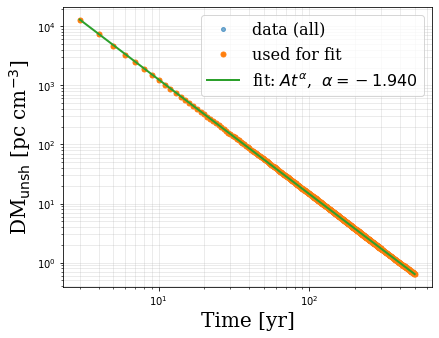

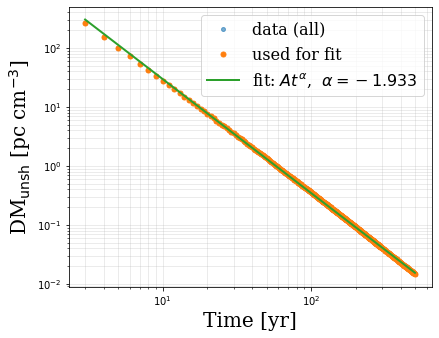

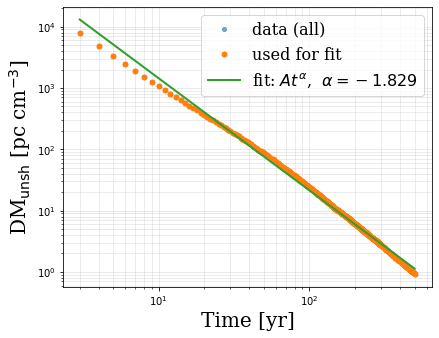

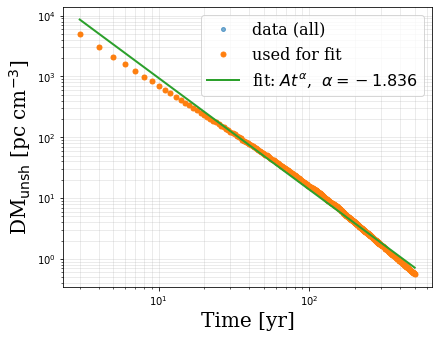

In [51]:

def fit_powerlaw(t, y, t_min=None, t_max=None, y_min=None,
                 use_weights=False, eps=1e-300):
    """
    Fit y = A * t^alpha  on log-log space.
    Returns: A, alpha, (A_err, alpha_err), mask_used
    """
    t = np.asarray(t, dtype=float)
    y = np.asarray(y, dtype=float)

    # basic valid mask
    mask = np.isfinite(t) & np.isfinite(y) & (t > 0) & (y > 0)

    if t_min is not None:
        mask &= (t >= t_min)
    if t_max is not None:
        mask &= (t <= t_max)
    if y_min is not None:
        mask &= (y >= y_min)

    tt = t[mask]
    yy = y[mask]
    if tt.size < 3:
        raise ValueError(f"Not enough points for fitting: {tt.size}")

    x = np.log10(tt)
    z = np.log10(yy + eps)  # avoid log(0)

    # weights in log space (optional)
    # if you have sigma_y in linear space: sigma_log ~ sigma_y / (y ln 10)
    # here we don't have sigma, so a heuristic: weight by y (downweight tiny y)
    if use_weights:
        w = np.sqrt(yy)  # simple heuristic; adjust if you have errors
        # np.polyfit uses w as weights on z
        p, cov = np.polyfit(x, z, 1, w=w, cov=True)
    else:
        p, cov = np.polyfit(x, z, 1, cov=True)

    alpha = p[0]
    log10A = p[1]
    A = 10**log10A

    # uncertainties
    alpha_err = np.sqrt(cov[0, 0])
    log10A_err = np.sqrt(cov[1, 1])
    A_err = A * np.log(10) * log10A_err

    return A, alpha, (A_err, alpha_err), mask

def fit_unshocked_dm_all(all_results_unsh, masses, models=("single", "binary"),
                         t_min=None, t_max=None, y_min=None,
                         use_weights=False, verbose=True):
    """
    Fit DM_unsh(t) for each (mass, model) in all_results_unsh.
    Returns dict: fit_res[key] = {A, alpha, A_err, alpha_err, npts}
    """
    fit_res = {}
    for m in masses:
        for model in models:
            key = f"{m}_{model}"
            if key not in all_results_unsh:
                continue
            t = all_results_unsh[key]["time"]
            dm_unsh = all_results_unsh[key]["dm"]

            try:
                A, alpha, (A_err, alpha_err), mask = fit_powerlaw(
                    t, dm_unsh,
                    t_min=t_min, t_max=t_max, y_min=y_min,
                    use_weights=use_weights
                )
                fit_res[key] = {
                    "A": A, "alpha": alpha,
                    "A_err": A_err, "alpha_err": alpha_err,
                    "npts": int(np.sum(mask)),
                    "t_min_used": (np.min(t[mask]) if np.any(mask) else None),
                    "t_max_used": (np.max(t[mask]) if np.any(mask) else None),
                }
                if verbose:
                    print(f"[{key}] DM_unsh = A t^alpha")
                    print(f"  A = {A:.3e} ± {A_err:.2e}")
                    print(f"  alpha = {alpha:.3f} ± {alpha_err:.3f}")
                    print(f"  npts = {fit_res[key]['npts']}, "
                          f"t in [{fit_res[key]['t_min_used']:.3g}, {fit_res[key]['t_max_used']:.3g}] yr")
            except Exception as e:
                if verbose:
                    print(f"[{key}] fit failed: {e}")
    return fit_res

def plot_unsh_fit(all_results_unsh, fit_res, key,
                  t_min=None, t_max=None, y_min=None,
                  outpng=None):
    t = np.asarray(all_results_unsh[key]["time"], float)
    y = np.asarray(all_results_unsh[key]["dm"], float)

    A = fit_res[key]["A"]
    alpha = fit_res[key]["alpha"]

    # same mask logic as fit (for visual consistency)
    mask = np.isfinite(t) & np.isfinite(y) & (t > 0) & (y > 0)
    if t_min is not None: mask &= (t >= t_min)
    if t_max is not None: mask &= (t <= t_max)
    if y_min is not None: mask &= (y >= y_min)

    tt = t[mask]
    yy = y[mask]

    # smooth fit line on the used interval
    tline = np.logspace(np.log10(tt.min()), np.log10(tt.max()), 200)
    yline = A * tline**alpha

    plt.figure(figsize=(6.2, 4.8))
    plt.loglog(t, y, "o", ms=4, alpha=0.6, label="data (all)")
    plt.loglog(tt, yy, "o", ms=5, label="used for fit")
    plt.loglog(tline, yline, "-", lw=2,
               label=rf"fit: $A t^\alpha$,  $\alpha={alpha:.3f}$")

    plt.xlabel("Time [yr]", **font_label)
    plt.ylabel(r"DM$_{\rm unsh}$ [pc cm$^{-3}$]", **font_label)
    plt.grid(True, which="both", alpha=0.3)
    plt.legend(prop = font_legend)
    plt.tight_layout()
    if outpng:
        plt.savefig(outpng, dpi=160)
    plt.show()

masses = [11, 30]

fit_res = fit_unshocked_dm_all(
    all_results_unsh,
    masses=masses,
    models=("single", "binary"),
    t_min=3, t_max=500,   # 你可以改
    y_min=1e-6,            # 防止极小值影响log
    use_weights=False
)

# 画一个例子
plot_unsh_fit(all_results_unsh, fit_res, key="11_single",
              t_min=3, t_max=500, outpng="fit_DM_unsh_11_single.png")
plot_unsh_fit(all_results_unsh, fit_res, key="11_binary",
              t_min=3, t_max=500, outpng="fit_DM_unsh_11_binary.png")
plot_unsh_fit(all_results_unsh, fit_res, key="30_single",
              t_min=3, t_max=500, outpng="fit_DM_unsh_30_single.png")
plot_unsh_fit(all_results_unsh, fit_res, key="30_binary",
              t_min=3, t_max=500, outpng="fit_DM_unsh_30_binary.png")


In [142]:
all_results_unsh['30_binary']['ion_abundaces'][30][114][11]
all_results_unsh['30_binary']['ion_blocks'][40][100]

array([0.9, 0.1, 0.9, 0.1, 0. , 0.9, 0.1, 0. , 0. , 0.9, 0.1, 0. , 0. ,
       0. , 0.9, 0.1, 0. , 0. , 0. , 0. , 0.9, 0.1, 0. , 0. , 0. , 0. ,
       0. , 0.9, 0.1, 0. , 0. , 0. , 0. , 0. , 0. , 0.9, 0.1, 0. , 0. ,
       0. , 0. , 0. , 0. , 0. , 0.9, 0.1, 0. , 0. , 0. , 0. , 0. , 0. ,
       0. , 0. , 0.9, 0.1, 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ,
       0.9, 0.1, 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.9,
       0.1, 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.9,
       0.1, 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ,
       0.9, 0.1, 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ,
       0. , 0. , 0.9, 0.1, 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ,
       0. , 0. , 0. , 0. , 0. , 0.9, 0.1, 0. , 0. , 0. , 0. , 0. , 0. ,
       0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.9, 0.1, 0. , 0. ,
       0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ,
       0. , 0.9, 0.1, 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0.

In [140]:
all_results_unsh['30_binary']['ion_blocks'][40][100]

def print_nonzero_ions(ion_block_row, threshold=0.0):
    """
    Print all non-zero ion fractions in one ion_block row.
    """
    for el in elements:   # elements = ["H","He","Li",...,"Zn"]
        Z = atomic_Z[el]
        start = species_offset(el)
        vals = ion_block_row[start:start + Z + 1]

        for charge, frac in enumerate(vals):
            if frac > threshold:
                if charge == 0:
                    label = f"{el}^0"
                else:
                    label = f"{el}^{charge}+"
                print(f"{label:6s} : {frac:.3f}")

# ===== 实际调用 =====
row = all_results_unsh["30_binary"]["ion_blocks"][40][100]
print_nonzero_ions(row)


H^0    : 0.900
H^1+   : 0.100
He^0   : 0.900
He^1+  : 0.100
Li^0   : 0.900
Li^1+  : 0.100
Be^0   : 0.900
Be^1+  : 0.100
B^0    : 0.900
B^1+   : 0.100
C^0    : 0.900
C^1+   : 0.100
N^0    : 0.900
N^1+   : 0.100
O^0    : 0.900
O^1+   : 0.100
F^0    : 0.900
F^1+   : 0.100
Ne^0   : 0.900
Ne^1+  : 0.100
Na^0   : 0.900
Na^1+  : 0.100
Mg^0   : 0.900
Mg^1+  : 0.100
Al^0   : 0.900
Al^1+  : 0.100
Si^0   : 0.900
Si^1+  : 0.100
P^0    : 0.900
P^1+   : 0.100
S^0    : 0.900
S^1+   : 0.100
Cl^0   : 0.900
Cl^1+  : 0.100
Ar^0   : 0.900
Ar^1+  : 0.100
K^0    : 0.900
K^1+   : 0.100
Ca^0   : 0.900
Ca^1+  : 0.100
Sc^0   : 0.900
Sc^1+  : 0.100
Ti^0   : 0.900
Ti^1+  : 0.100
V^0    : 0.900
V^1+   : 0.100
Cr^0   : 0.900
Cr^1+  : 0.100
Mn^0   : 0.900
Mn^1+  : 0.100
Fe^0   : 0.900
Fe^1+  : 0.100
Co^0   : 0.900
Co^1+  : 0.100
Ni^0   : 0.900
Ni^1+  : 0.100
Cu^0   : 0.900
Cu^1+  : 0.100
Zn^0   : 0.900
Zn^1+  : 0.100


# Appendix


dict_keys(['time', 'dm', 'dm_sh', 'dm_unsh', 'dm_csm', 'tau_ff', 'tau_T', 'ne_avg', 'len_full', 'te_avg', 'zavg_avg', 'gff_avg', 'r_r', 'r_c', 'r_b', 'len_sh', 'len_unsh', 'len_csm', 'delta_re', 'r_csm_max', 'r_un_min', 'mu_e_sh_med', 'mu_a_sh_med', 'mu_m_sh_med', 'mu_a_unsh_med', 'mu_a_csm_med', 'dm_lower', 'dm_upper', 'dm_unsh_lower', 'dm_unsh_upper', 'dm_csm_lower', 'dm_csm_upper', 'tau_ff_lower', 'tau_ff_upper', 'tau_T_lower', 'tau_T_upper', 'rm', 'rm_lower', 'rm_upper', 'B_sh', 'B_sh_lower', 'B_sh_upper'])
[14.43246283  5.74592952  3.60477107  3.04944535  2.82767548] [14.43246283  5.74592952  3.60477107  3.04944535  2.82767548] [14.43246283  5.74592952  3.60477107  3.04944535  2.82767548] [4.04226964 4.04226817 4.04226817 4.04226817 4.04226817] [4.04226817 4.04226817 4.04226817 4.04226817 4.04226817]
len_t_full:348
len_t_model:400
0.1
11_single: t_FRB20190520B≈27.00 yr, DM≈183.64 pc cm^-3
11_single: t_FRB≈40.00 yr, DM≈88.54 pc cm^-3
11_single: t_FRB≈67.00 yr, DM≈35.56 pc cm^-3
['U

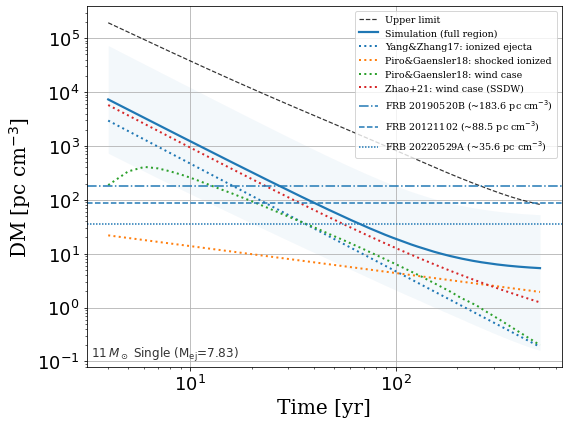

Saved: DM_full_11_single_comparison_with_analytic_app.png
dict_keys(['time', 'dm', 'dm_sh', 'dm_unsh', 'dm_csm', 'tau_ff', 'tau_T', 'ne_avg', 'len_full', 'te_avg', 'zavg_avg', 'gff_avg', 'r_r', 'r_c', 'r_b', 'len_sh', 'len_unsh', 'len_csm', 'delta_re', 'r_csm_max', 'r_un_min', 'mu_e_sh_med', 'mu_a_sh_med', 'mu_m_sh_med', 'mu_a_unsh_med', 'mu_a_csm_med', 'dm_lower', 'dm_upper', 'dm_unsh_lower', 'dm_unsh_upper', 'dm_csm_lower', 'dm_csm_upper', 'tau_ff_lower', 'tau_ff_upper', 'tau_T_lower', 'tau_T_upper', 'rm', 'rm_lower', 'rm_upper', 'B_sh', 'B_sh_lower', 'B_sh_upper'])
[14.43246283  5.74592952  3.60477107  3.04944535  2.82767548] [14.43246283  5.74592952  3.60477107  3.04944535  2.82767548] [14.43246283  5.74592952  3.60477107  3.04944535  2.82767548] [4.04226964 4.04226817 4.04226817 4.04226817 4.04226817] [4.04226817 4.04226817 4.04226817 4.04226817 4.04226817]
len_t_full:348
len_t_model:400
0.1
11_binary: t_FRB20190520B≈8.00 yr, DM≈44.86 pc cm^-3
11_binary: t_FRB≈11.00 yr, DM≈26.17 p

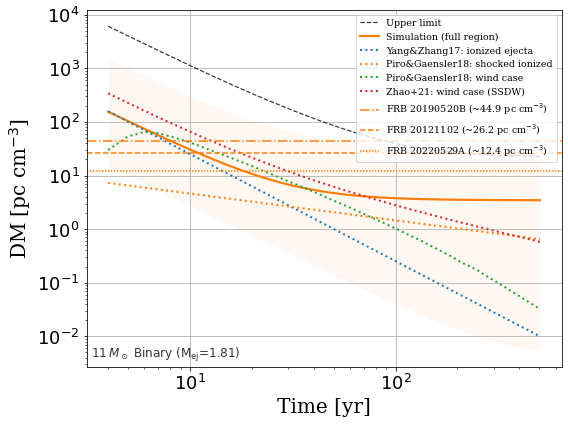

Saved: DM_full_11_binary_comparison_with_analytic_app.png
dict_keys(['time', 'dm', 'dm_sh', 'dm_unsh', 'dm_csm', 'tau_ff', 'tau_T', 'ne_avg', 'len_full', 'te_avg', 'zavg_avg', 'gff_avg', 'r_r', 'r_c', 'r_b', 'len_sh', 'len_unsh', 'len_csm', 'delta_re', 'r_csm_max', 'r_un_min', 'mu_e_sh_med', 'mu_a_sh_med', 'mu_m_sh_med', 'mu_a_unsh_med', 'mu_a_csm_med', 'dm_lower', 'dm_upper', 'dm_unsh_lower', 'dm_unsh_upper', 'dm_csm_lower', 'dm_csm_upper', 'tau_ff_lower', 'tau_ff_upper', 'tau_T_lower', 'tau_T_upper', 'rm', 'rm_lower', 'rm_upper', 'B_sh', 'B_sh_lower', 'B_sh_upper'])
[14.43246283  5.74592952  3.60477107  3.04944535  2.82767548] [14.43246283  5.74592952  3.60477107  3.04944535  2.82767548] [14.43246283  5.74592952  3.60477107  3.04944535  2.82767548] [4.04226964 4.04226817 4.04226817 4.04226817 4.04226817] [4.04226817 4.04226817 4.04226817 4.04226817 4.04226817]
len_t_full:348
len_t_model:400
0.1
30_single: t_FRB20190520B≈27.00 yr, DM≈202.85 pc cm^-3
30_single: t_FRB≈42.00 yr, DM≈97.65

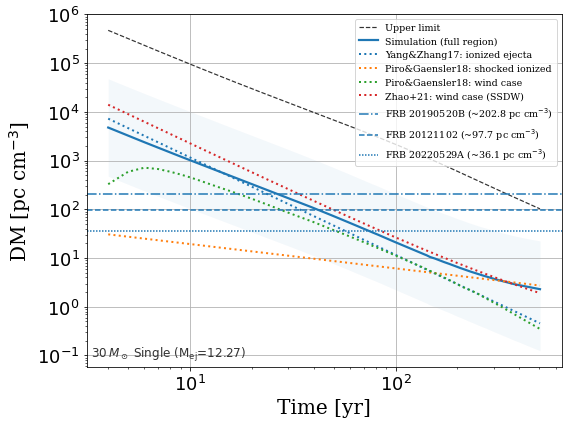

Saved: DM_full_30_single_comparison_with_analytic_app.png
dict_keys(['time', 'dm', 'dm_sh', 'dm_unsh', 'dm_csm', 'tau_ff', 'tau_T', 'ne_avg', 'len_full', 'te_avg', 'zavg_avg', 'gff_avg', 'r_r', 'r_c', 'r_b', 'len_sh', 'len_unsh', 'len_csm', 'delta_re', 'r_csm_max', 'r_un_min', 'mu_e_sh_med', 'mu_a_sh_med', 'mu_m_sh_med', 'mu_a_unsh_med', 'mu_a_csm_med', 'dm_lower', 'dm_upper', 'dm_unsh_lower', 'dm_unsh_upper', 'dm_csm_lower', 'dm_csm_upper', 'tau_ff_lower', 'tau_ff_upper', 'tau_T_lower', 'tau_T_upper', 'rm', 'rm_lower', 'rm_upper', 'B_sh', 'B_sh_lower', 'B_sh_upper'])
[14.43246283  5.74592952  3.60477107  3.04944535  2.82767548] [14.43246283  5.74592952  3.60477107  3.04944535  2.82767548] [14.43246283  5.74592952  3.60477107  3.04944535  2.82767548] [4.04226964 4.04226817 4.04226817 4.04226817 4.04226817] [4.04226817 4.04226817 4.04226817 4.04226817 4.04226817]
len_t_full:348
len_t_model:400
0.1
30_binary: t_FRB20190520B≈23.00 yr, DM≈167.45 pc cm^-3
30_binary: t_FRB≈35.00 yr, DM≈83.00

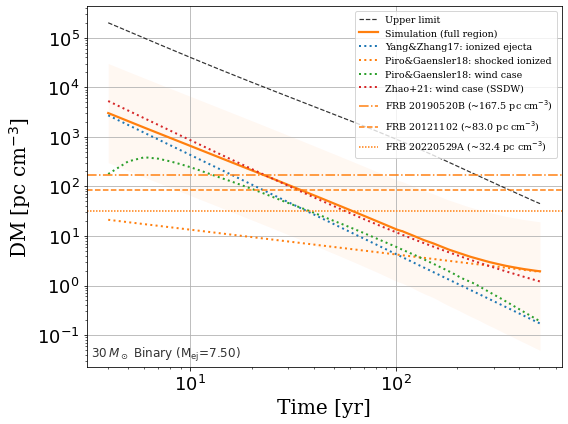

Saved: DM_full_30_binary_comparison_with_analytic_app.png


In [39]:
# =========================
# Full region vs analytic (use upper limit from full ionization)
# =========================
# =========================
# Analytic DM models
# =========================
font_legend_xmsmall = {
'family': 'serif',
'size': 13
}
def dm_yz_fully_ionized_free_expansion_app(t_yr, M_Msun=1.0, E51=1.0, eta=1.0, mu_a = 1.2):
    """
    Yang & Zhang: fully-ionized ejecta (free-expansion-like) inferred from the provided dDM/dt scaling:
        dDM/dt = -52 * eta * (M/Msun)^2 * (t/10yr)^-3 * (E/1e51erg)^-1  pc cm^-3 yr^-1
    Assuming DM -> 0 at t -> infinity and DM(t)=A t^-2, we get:
        DM = 260 * eta * (M/Msun)^2 * E51^-1 * (t/10yr)^-2  pc cm^-3
    """
    t_yr = np.asarray(t_yr, dtype=float)
    return 260.0 * eta * (mu_a/1.2)**-1*(M_Msun/1.0)**2 * (E51)**(-1.0) * (t_yr/10.0)**(-2.0)

def dm_piro_shocked_ionized_ejecta_ST(t_yr, M1=1.0, E51=1.0, n0=1.0, mu=0.62, mu_e = 1.18):
    """
    (Your Fig.2 / Eq.16 form):
        DM_SNR = 52.6 (mu/mu_e) E51^{-1/4} M1^{3/4} n0^{1/2} t_yr^{-1/2} pc cm^-3
    M1 = M_ej/(10 Msun), n0 in cm^-3, t_yr in yr.
    """
    t_yr = np.asarray(t_yr, dtype=float)
    return 52.6 * mu/mu_e * (E51)**(-0.25) * (M1)**(0.75) * (n0)**(0.5) * (t_yr)**(-0.5)

def dm_piro_wind_shocked(t_yr, M1=1.0, E51=1.0, mu_e=1.18):
    """
    Piro (2018) wind shocked region (your Fig.3 / Eq.45):
        DM_w,sh = 26.1 mu_e^{-1} E51^{-1/2} M1^{1/2} t_yr^{-2} pc cm^-3
    """
    t_yr = np.asarray(t_yr, dtype=float)
    return 26.1 * (mu_e)**(-1.0) * (E51)**(-0.5) * (M1)**(0.5) * (t_yr)**(-2.0)

def dm_piro_wind_total_sh_plus_unsh(t_yr, M1=1.0, E51=1.0, mu_e=1.18):
    """
    Piro (2018) wind total (shocked + unshocked) (your Fig.3 / Eq.47):
        DM_w,tot = 65.8 mu_e^{-1} E51^{-1/2} M1^{1/2} t_yr^{-2} pc cm^-3
    """
    t_yr = np.asarray(t_yr, dtype=float)
    return 65.8 * (mu_e)**(-1.0) * (E51)**(-0.5) * (M1)**(0.5) * (t_yr)**(-2.0)

def dm_piro2018_wind_shocked_ejecta_eq42(t_yr, M1=1.0, E51=1.0, mu_e=1.18, M_dot = 1e-5, v_w = 10):
    """
    Piro+2018 wind case, ejecta-dominated shocked-ejecta DM (Eq.42):
    DM_SNR = 1.3e4 * mu_e^{-1} * E51^{-3/4} * M1^{5/4} * K13^{1/2} * t_yr^{-3/2}  [pc cm^-3]
    
    Here K = dot{M}/(4π v_w) and K13 = K / 1e13 (g cm^-1).
    Valid in the early-time limit t << t_ch (as used in Piro+2018).
    M_dot in M_sun
    vw in km/s
    """
    M_dot_m5 = M_dot/1e-5    
    v1 = v_w/10
    K = 5.1*10**13*M_dot_m5*v1**-1
    K13 = K/1e13
    t_yr = np.asarray(t_yr, dtype=float)
    return 1.3e4 * (mu_e**-1) * (E51**(-0.75)) * (M1**(1.25)) * (K13**0.5) * (t_yr**(-1.5))

def dm_zhao2021_wind_shocked_ejecta(
    t_yr, Mej=1.0, E51=1.0, n=11, mu=1, M_dot = 1e-5, v_w = 10,
    w_core = 0.1, s = 2, eta = 0.1):
    """
    Zhao+2021 wind case, self-similar shocked-ejecta DM (Eq.45 in Zhao et al. 2021):

    DM_sh,ej(t) = C * eta_s * (n-3)(n-4) / (mu m_p)
                  * (1/r2 - 1)
                  * (t_ch / t)^{2(n-3)/(n-2)}   [pc cm^-3]

    Parameters
    ----------
    t_yr : array_like
        Time since explosion in years.
    Mej: float
        SN eject mass in M_sun 
    n : float
        Outer power-law index of SN ejecta density (typically n ~ 9–12).
    eta_s : float
        Ionization fraction of the shocked ejecta.
    r2 : float
        Ratio R_rs / R_cd (reverse shock to contact discontinuity radius).
    mu : float
        Mean molecular weight (≈1.3 for ionized SN ejecta).
    Rc_pc : float
        Contact discontinuity radius at t = t_ch, in parsec.
    t_ch_yr : float
        Characteristic timescale in years.

    M_dot: float 
        Mass loss rate in M_sun/yr
    v_w: float 
        wind velocity
        in km/s
    Returns
    -------
    DM : ndarray
        Dispersion measure from shocked ejecta in pc cm^-3.
    """
    m_p = 1.6726219e-24   # g
    pc  = 3.0856776e18    # cm
    M_dot_m5 = M_dot/1e-5
    v_1 = v_w/10
    km_to_cm = 1e5 
    Msun_to_g = 1.98847e33
    yr_to_s = 365.25*24*3600
    if n == 10:
        A = 0.067 # Cheviliar 1982 
        R1_over_Rc = 1.239
        R2_over_Rc = 0.984
        r1 = R1_over_Rc
        r2 = R2_over_Rc
    elif n == 9:
        A = 0.096 # Cheviliar 1982 
        R1_over_Rc = 1.250
        R2_over_Rc = 0.981
        r1 = R1_over_Rc
        r2 = R2_over_Rc 
    else:
        print("current model can only calculate n = 10 & 9 case")
        return 0
    #K = 5.1*10**13* M_dot_m5 * v_1**(-1)
    #Rch_pc = 12.9*(Mej)*M_dot_m5**-1*v_1
    #t_ch_yr = 1772 * E51**(-0.5) * Mej**(1.5) * M_dot_m5**(-1) * v_1
    K = M_dot/yr_to_s*Msun_to_g/(4*np.pi*v_w*km_to_cm)
    Mej_g = Mej*Msun_to_g
    R_ch = (Mej_g)*(1.0/(3-s))*K**(-1/(3-s))
    t_ch = (E51*1e51)**-0.5*Mej_g**((5-s)/(2*(3-s)))*K**(-1/(3-s))
    t_ch_yr = t_ch/yr_to_s

    R_ch_pc =  R_ch/pc
    f_0 = (3.0/(4.0*np.pi*w_core**n)) * ((1.0 - n/3.0) / (1.0 - (n/3.0)*w_core**(3.0-n)))

    lambda_c_sq = 2*w_core**(-2) * ((5-n)/(3-n)) * ((w_core**(n-3)-n/3)/(w_core**(n-5)-n/5))
    lambda_c = np.sqrt(lambda_c_sq)
    zeta_c = (A*f_0*w_core**n*lambda_c**(n-3))**(1/(n-s))
    t_yr = np.asarray(t_yr, dtype=float)
    
    #print(f"A:{A}, f_0:{f_0}, lambda_c:{lambda_c}, R_ch_pc:{R_ch_pc},r2:{r2}, zeta_c:{zeta_c}, t_ch_yr:{t_ch_yr}, K:{K}, w_core:")

    alpha = (n - 3.0) / (n - 2.0)
    
    pref_shocked = (2.0 * K * (n - 3.0) * (n - 4.0) / (mu * m_p)) * (1.0 / r2 - 1.0)/pc
    DM_shocked_ej = pref_shocked * (1.0 / (zeta_c * R_ch)) * (t_ch_yr / t_yr) ** alpha
    pref_unshoced = (4.0 * K)/ (mu * m_p) * (1.0 - 1/ r1)/pc
    DM_shocked_ISM = pref_unshoced * (1.0 / (zeta_c * R_ch)) * (t_ch_yr / t_yr) ** alpha
    
    q_b = 1.19
    l_ed = 1 +8/n**2 +0.4/(4-s)
    q_r = q_b/l_ed
    v_ch = R_ch/(t_ch_yr* yr_to_s)
    
    DM_unshocked_core = (
        Mej * Msun_to_g
        * eta
        * f_0
        * w_core
        / (mu * m_p)
        * lambda_c**(-2)
        * v_ch**(-2)
        * (t_yr * yr_to_s)**(-2)
    ) / pc
    DM_unshocked_pl = (
        Mej * Msun_to_g
        * eta
        * f_0
        * (w_core - w_core**n * q_r**(1 - n)) / (n - 1)
        / (mu * m_p)
        * lambda_c**(-2)
        * v_ch**(-2)
        * (t_yr * yr_to_s)**(-2)
    ) / pc
    DM_unshocked_ej = DM_unshocked_core + DM_unshocked_pl
    #DM_unshocked_ej = 3*Mej*Msun_to_g*q_r*eta/(4*np.pi*mu*m_p)*lambda_c**-2*v_ch**-2* (t_yr*yr_to_s)**-2/pc
    return DM_shocked_ej, DM_shocked_ISM, DM_unshocked_ej
def _get_full_dm_series(key, dm_setting="full"):
    # Prefer computed full (shock+unshock+CSM) if available
    if "all_results_full_series" in globals() and key in all_results_full_series:
        res = all_results_full_series[key]
        t = np.asarray(res["time"], dtype=float)

        if dm_setting == "full":
            dm = np.asarray(res.get("dm", []), dtype=float)
        elif dm_setting == "lower":
            dm = np.asarray(res.get("dm_lower", []), dtype=float)
        elif dm_setting == "upper":
            dm = np.asarray(res.get("dm_upper", []), dtype=float)
        else:
            raise ValueError(f"Unknown dm_setting: {dm_setting}")

        return t, dm

    if "all_results_full" in globals() and key in all_results_full:
        res = all_results_full[key]
        t = np.asarray(res["time"], dtype=float)
        dm = np.asarray(res["dm_full"], dtype=float)
        return t, dm

    return None, None

def _get_full_mu_series():
    if "all_results_full_series" not in globals():
        return None, None, None, None, None, None

    res = all_results_full_series[key]
    print(res.keys())
    t = np.asarray(res.get("time", []), dtype=float)
    mu_e_sh = np.asarray(res.get("mu_e_sh_med", []), dtype=float)
    mu_m_sh = np.asarray(res.get("mu_m_sh_med", []), dtype=float)
    mu_a_sh = np.asarray(res.get("mu_a_sh_med", []), dtype=float)
    mu_a_unsh = np.asarray(res.get("mu_a_unsh_med", []), dtype=float)
    mu_a_csm = np.asarray(res.get("mu_a_csm_med", []), dtype=float)

    return t, mu_e_sh, mu_m_sh, mu_a_sh, mu_a_unsh, mu_a_csm


def _get_upper_limit_dm(key):
    # Use full ionization profile as upper limit
    if "all_results_UL" in globals() and key in all_results_UL and len(all_results_UL[key]["time"]):
        order = np.argsort(all_results_UL[key]["time"])
        t_ul = np.asarray(all_results_UL[key]["time"], dtype=float)[order]
        dm_ul = np.asarray(all_results_UL[key]["dm_UL"], dtype=float)[order]
        return t_ul, dm_ul
    return None, None
def _get_time_grid_from_sim(all_results, key, fallback=(1e-1, 1e3), npts=400):
    if key in all_results and len(all_results[key]["time"]):
        t = np.asarray(all_results[key]["time"], dtype=float)
        t = t[np.isfinite(t) & (t > 0)]
        if len(t) >= 2:
            return np.logspace(np.log10(t.min()), np.log10(t.max()), npts)
    return np.logspace(np.log10(fallback[0]), np.log10(fallback[1]), npts)

def plot_channel_with_analytic_full_app(channel, zams_mass, chi_e_unej=None):
    key = f"{zams_mass}_{channel}"
    if chi_e_unej is not None:
        chi_e = chi_e_unej[key]
    else:
        chi_e = 0.01
    
    pars = progenitor_table[zams_mass][channel]
    Mej = pars["Mej"]
    E51 = pars["E51"]
    M1 = Mej / 10.0

    if channel == "single":
        c_line    = "#1f77b4"
        l_s       = "-"
        n0_fid    = 1.0
        mu_fid    = 0.62
        mu_e_fid  = 1.18
        eta_fid   = 1.0
    else:
        c_line    = "#ff7f0e"
        l_s       = "-"
        n0_fid    = 1.0
        mu_fid    = 1.34
        mu_e_fid  = 2.0
        eta_fid   = 1.0
    t_full, mu_e_sh, mu_m_sh, mu_a_sh, mu_a_unsh, mu_a_csm = _get_full_mu_series()
    print(mu_e_sh[:5], mu_m_sh[:5], mu_a_sh[:5], mu_a_unsh[:5], mu_a_csm[:5])
    fig, ax = plt.subplots(figsize=(8, 6))

    # Upper limit from full ionization
    t_ul, dm_ul = _get_upper_limit_dm(key)
    if t_ul is not None and len(t_ul):
        ax.plot(t_ul[1:], dm_ul[1:],
                label="Upper limit",
                c="k", ls="--", linewidth=1.2, alpha=0.8)
    # Full region simulation
    t_full, dm_full = _get_full_dm_series(key)
    t_lower,dm_lower = _get_full_dm_series(key, "lower")
    t_upper, dm_upper = _get_full_dm_series(key, "upper")
    if t_full is not None and len(t_full):
        ax.plot(t_full, dm_full,
                label="Simulation (full region)",
                c=c_line, ls=l_s, linewidth=2.2)
    if (not unshock_sim_setting) and (dm_lower is not None) and (dm_upper is not None):
        ax.fill_between(t, dm_lower, dm_upper, color=c_line, alpha=0.05, linewidth=0)
        
        # FRB 190520B 对应 DM（用此前求得的 t_FRB190520B 或重新计算）
        d_dm_FRB20190520B = 12.4
        d_dm_FRB20121102 = 3.93
        d_dm_FRB20220529A = 3.93
        # 若你已有 frb_times 字典就用它；否则临时算一次
        if "frb_times" in globals():
            t_FRB20190520B = frb_times.get(f"{key}_FRB20190520B", None)
            t_FRB20121102 = frb_times.get(f"{key}_FRB20121102_late", None)
            t_FRB20220529A = frb_times.get(f"{key}_FRB20220529A", None)
        else:
            order = np.argsort(t_full)
            t_sorted = np.asarray(t_full)[order]
            dm_sorted = np.asarray(dm_full)[order]
            d_dm = np.gradient(dm_sorted, t_sorted)
            idx_20190520B = np.argmin(np.abs(-d_dm - d_dm_FRB20190520B))
            idx_20121102 = np.argmin(np.abs(-d_dm - d_dm_FRB20121102))
            idx_20220529A = np.argmin(np.abs(-d_dm - d_dm_FRB20220529A))
            t_FRB20190520B = t_sorted[idx_20190520B]
            t_FRB20121102 = t_sorted[idx_20121102]
            t_FRB20220529A = t_sorted[idx_20220529A]

        dm_FRB20190520B = np.interp(t_FRB20190520B, t_full, dm_full)
        dm_FRB20121102 = np.interp(t_FRB20121102, t_full, dm_full)
        dm_FRB20220529A = np.interp(t_FRB20220529A, t_full, dm_full)
    else:
        print(f"[WARN] Missing full-region sim key: {key}")


    # Analytic curves
    if zams_mass not in progenitor_table or channel not in progenitor_table[zams_mass]:
        print(f"[WARN] Missing progenitor_table entry for ZAMS={zams_mass}, channel={channel}")
        return

    t_model = _get_time_grid_from_sim(all_results_full_series, key)
    print(f"len_t_full:{len(t_full)}")
    print(f"len_t_model:{len(t_model)}")
    ax.plot(
        t_full,
        dm_yz_fully_ionized_free_expansion_app(t_full, M_Msun=Mej, E51=E51, eta=chi_e, mu_a = mu_a_unsh[1:]),
        label=fr"Yang&Zhang17: ionized ejecta",
        linewidth=2.0,
        ls=":"
    )
    
    ax.plot(
        t_full,
        dm_piro_shocked_ionized_ejecta_ST(t_full, M1=M1, E51=E51, n0=n0_fid, mu=mu_a_sh, mu_e=mu_e_sh),
        label=fr"Piro&Gaensler18: shocked ionized",
        linewidth=2.0,
        ls=":"
    )

    M_dot = 1e-5
    v_w = 10
    ax.plot(
        t_full,
        dm_piro2018_wind_shocked_ejecta_eq42(t_full, M1=M1, E51=E51, mu_e=mu_e_sh, M_dot=M_dot, v_w=v_w),
        label=r"Piro&Gaensler18: wind case",
        linewidth=2.0,
        ls=":"
    )
    print(chi_e)
    DM_shock_ej, DM_shock_ISM, DM_unshocked_ej = dm_zhao2021_wind_shocked_ejecta(
        t_full, Mej=Mej, E51=E51, n=10, mu=mu_a_unsh[1:], M_dot=M_dot, v_w=v_w, eta = chi_e
    )
    DM_shock = DM_shock_ej + DM_shock_ISM + DM_unshocked_ej
    ax.plot(
        t_full,
        DM_shock,
        label=r"Zhao+21: wind case (SSDW)",
        linewidth=2.0,
        ls=":"
    )
    ax.text(
        0.01, 0.01,
        f"${zams_mass}\,M_\odot$ {channel.capitalize()} (M$_{{\mathrm{{ej}}}}$={Mej:.2f})",
        transform=ax.transAxes,
        ha="left", va="bottom",
        fontsize=12,
        color="0.2"
    )

    ax.axhline(y=dm_FRB20190520B, c=c_line, ls="-.",
               label=rf"FRB 20190520B (~{dm_FRB20190520B:.1f} pc cm$^{{-3}}$)")
    ax.axhline(y=dm_FRB20121102, c=c_line, ls="--",
               label=rf"FRB 20121102 (~{dm_FRB20121102:.1f} pc cm$^{{-3}}$)")
    ax.axhline(y=dm_FRB20220529A, c=c_line,
               linestyle=(0, (1, 1)),  
               label=rf"FRB 20220529A (~{dm_FRB20220529A:.1f} pc cm$^{{-3}}$)")
    print(f"{key}: t_FRB20190520B≈{t_FRB20190520B:.2f} yr, DM≈{dm_FRB20190520B:.2f} pc cm^-3")
    print(f"{key}: t_FRB≈{t_FRB20121102:.2f} yr, DM≈{dm_FRB20121102:.2f} pc cm^-3")
    print(f"{key}: t_FRB≈{t_FRB20220529A:.2f} yr, DM≈{dm_FRB20220529A:.2f} pc cm^-3")
    handles, labels = ax.get_legend_handles_labels()
    print(labels)

    ax.set_xlabel("Time [yr]", **font_label)
    ax.set_ylabel("DM [pc cm$^{-3}$]", **font_label)
    #ax.legend(
    #    prop=font_legend_xxsmall,
    #    loc="upper right",
    #    labelspacing=0.25,
    #    handletextpad=0.6,
    #    borderpad=0.3
    #)
    ax.legend(prop=font_legend_xxxsmall, loc="upper right")
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.grid(True)
    ax.tick_params(labelsize=tick_size)
    fig.tight_layout()

    outname = f"DM_full_{zams_mass}_{channel}_comparison_with_analytic_app.png"
    fig.savefig(outname, dpi=150)
    plt.show()
    print(f"Saved: {outname}")
    
progenitor_table = {
    11: {
        "single": {"Mej": 7.83, "dMwind": 1.64, "E51": 1.0},
        "binary": {"Mej": 1.81, "dMwind": 0.70, "E51": 1.0},
    },
    30: {
        "single": {"Mej": 12.27, "dMwind": 15.74, "E51": 1.0},
        "binary": {"Mej": 7.50, "dMwind": 9.85, "E51": 1.0},
    }
}

progenitor_table = {
    11: {
        "single": {"Mej": 7.83, "dMwind": 1.64, "E51": 1.0},
        "binary": {"Mej": 1.81, "dMwind": 0.70, "E51": 1.0},
    },
    30: {
        "single": {"Mej": 12.27, "dMwind": 15.74, "E51": 1.0},
        "binary": {"Mej": 7.50, "dMwind": 9.85, "E51": 1.0},
    }
}

# Fiducial plasma/composition parameters for analytic curves
# You can change these later if you want to encode ionization/composition more carefully.


# If you only want to compare the Table-1 example mass:

# Run for all available masses and channels

for zams_mass in progenitor_table.keys():
    for channel in ["single", "binary"]:
        plot_channel_with_analytic_full_app(channel, zams_mass, chi_e_unej = chi_e_unej_list)

# New fitting of RM


--- Hilmarsson only ---
dln(RM)/dt = -0.14298 ± 0.02279 yr^-1
Intercept  = 11.44640 ± 0.03752
R^2 (ln-space) = 0.69831

--- Hilmarsson + Wang ---
dln(RM)/dt = -0.17392 ± 0.01434 yr^-1
Intercept  = 11.48695 ± 0.03036
R^2 (ln-space) = 0.89104

--- Hilmarsson only (log10) ---
dlog10(RM)/dt = -0.06210 ± 0.00990 yr^-1
Intercept     = 4.97111 ± 0.01630
R^2 (log10-space) = 0.69831

--- Hilmarsson + Wang (log10) ---
dlog10(RM)/dt = -0.07553 ± 0.00623 yr^-1
Intercept     = 4.98872 ± 0.01319
R^2 (log10-space) = 0.89104

Comparison with Wang+2025 reference:
Wang reference dln(RM)/dt ~ -0.100 yr^-1

[ln fit]
Hilmarsson only   : -0.14298 ± 0.02279
Hilmarsson + Wang : -0.17392 ± 0.01434

[log10 fit]
Hilmarsson only   : -0.06210 ± 0.00990
Hilmarsson + Wang : -0.07553 ± 0.00623

[Consistency check: log10 = ln / ln(10)]
H only   expected = -0.06210
H only   fitted   = -0.06210
H+W      expected = -0.07553
H+W      fitted   = -0.07553


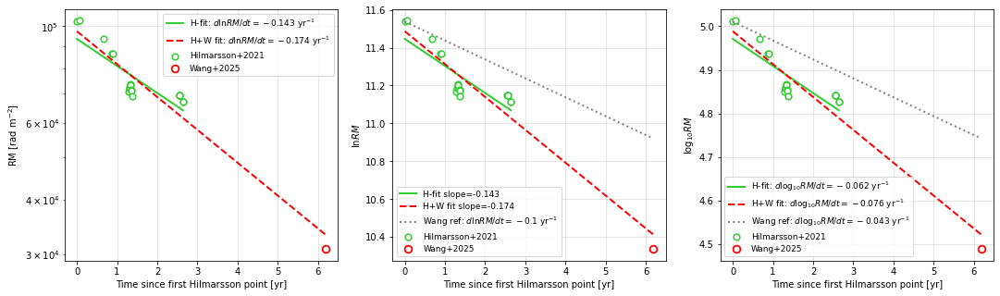

In [16]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================================
# 1) Hilmarsson+2021 RM data
# ============================================================
mjd_full = np.array([
    57747.12956,
    57748.12564,
    57772.12903030,
    57991.58013,
    58069.31853200,
    58075.20058018,
    58215.86332798,
    58222.85751812,
    58227.83201090,
    58228.63801964,
    58234.81180934,
    58234.81642918,
    58243.77965432,
    58244.77641721,
    58247.81273381,
    58677.60475978,
    58684.58367814,
    58684.58990897,
    58712.47972031,
    58712.48531398
], dtype=float)

rm_full = np.array([
    102708,
    102521,
    103039,
    93573,
    86678,
    86518,
    70841,
    72090,
    72062,
    72248,
    73514,
    73358,
    71525,
    71158,
    68937,
    69375,
    69524,
    69408,
    66949,
    67033
], dtype=float)

# 去掉第一个 plateau 点
mjd_h = mjd_full[1:]
rm_h = rm_full[1:]

# 以去掉 plateau 后的第一个点为时间零点
t_h_yr = (mjd_h - mjd_h[0]) / 365.25

# ============================================================
# 2) Wang+2025 new RM point
# ============================================================
mjd_wang = np.array([60006.509722222], dtype=float)
rm_wang  = np.array([30755.0], dtype=float)

idx_wang = np.argsort(mjd_wang)
mjd_wang = mjd_wang[idx_wang]
rm_wang  = rm_wang[idx_wang]
t_wang_yr = (mjd_wang - mjd_h[0]) / 365.25


# 合并 Hilmarsson + Wang
mjd_hw = np.concatenate([mjd_h, mjd_wang])
rm_hw  = np.concatenate([rm_h, rm_wang])

idx = np.argsort(mjd_hw)
mjd_hw = mjd_hw[idx]
rm_hw  = rm_hw[idx]

t_hw_yr = (mjd_hw - mjd_hw[0]) / 365.25


# ============================================================
# 3) dln(RM)/dt fit
# ============================================================
def fit_dlnrm_dt(t_yr, rm, fit_name="dataset"):
    """
    Fit ln(RM) = a + k * t
    Then dln(RM)/dt = k
    """
    t_yr = np.asarray(t_yr, dtype=float)
    rm   = np.asarray(rm, dtype=float)

    mask = np.isfinite(t_yr) & np.isfinite(rm) & (rm > 0)
    t = t_yr[mask]
    y = np.log(rm[mask])

    # linear fit: y = a + k t
    coeff, cov = np.polyfit(t, y, 1, cov=True)
    k, a = coeff[0], coeff[1]
    k_err = np.sqrt(cov[0, 0])
    a_err = np.sqrt(cov[1, 1])

    # reconstructed model
    y_fit = a + k * t
    rm_fit = np.exp(y_fit)

    # R^2 in ln-space
    ss_res = np.sum((y - y_fit)**2)
    ss_tot = np.sum((y - np.mean(y))**2)
    r2 = 1.0 - ss_res / ss_tot if ss_tot > 0 else np.nan

    print(f"\n--- {fit_name} ---")
    print(f"dln(RM)/dt = {k:.5f} ± {k_err:.5f} yr^-1")
    print(f"Intercept  = {a:.5f} ± {a_err:.5f}")
    print(f"R^2 (ln-space) = {r2:.5f}")

    return {
        "k": k,
        "k_err": k_err,
        "a": a,
        "a_err": a_err,
        "r2": r2,
        "t": t,
        "rm": rm[mask],
        "rm_fit": rm_fit
    }

def fit_dlog10rm_dt(t_yr, rm, fit_name="dataset"):
    """
    Fit log10(RM) = a + k * t
    Then dlog10(RM)/dt = k
    """
    t_yr = np.asarray(t_yr, dtype=float)
    rm   = np.asarray(rm, dtype=float)

    mask = np.isfinite(t_yr) & np.isfinite(rm) & (rm > 0)
    t = t_yr[mask]
    y = np.log10(rm[mask])

    # linear fit: y = a + k t
    coeff, cov = np.polyfit(t, y, 1, cov=True)
    k, a = coeff[0], coeff[1]
    k_err = np.sqrt(cov[0, 0])
    a_err = np.sqrt(cov[1, 1])

    # reconstructed model
    y_fit = a + k * t
    rm_fit = 10**y_fit

    # R^2 in log10-space
    ss_res = np.sum((y - y_fit)**2)
    ss_tot = np.sum((y - np.mean(y))**2)
    r2 = 1.0 - ss_res / ss_tot if ss_tot > 0 else np.nan

    print(f"\n--- {fit_name} (log10) ---")
    print(f"dlog10(RM)/dt = {k:.5f} ± {k_err:.5f} yr^-1")
    print(f"Intercept     = {a:.5f} ± {a_err:.5f}")
    print(f"R^2 (log10-space) = {r2:.5f}")

    return {
        "k": k,
        "k_err": k_err,
        "a": a,
        "a_err": a_err,
        "r2": r2,
        "t": t,
        "rm": rm[mask],
        "rm_fit": rm_fit
    }
# ============================================================
# 4) Perform fits
# ============================================================
# ln fit
res_h_ln  = fit_dlnrm_dt(t_h_yr,  rm_h,  fit_name="Hilmarsson only")
res_hw_ln = fit_dlnrm_dt(t_hw_yr, rm_hw, fit_name="Hilmarsson + Wang")

# log10 fit
res_h_log10  = fit_dlog10rm_dt(t_h_yr,  rm_h,  fit_name="Hilmarsson only")
res_hw_log10 = fit_dlog10rm_dt(t_hw_yr, rm_hw, fit_name="Hilmarsson + Wang")

# Compare with Wang's reported value
wang_ref = -0.1
print("\nComparison with Wang+2025 reference:")
print(f"Wang reference dln(RM)/dt ~ {wang_ref:.3f} yr^-1")

print("\n[ln fit]")
print(f"Hilmarsson only   : {res_h_ln['k']:.5f} ± {res_h_ln['k_err']:.5f}")
print(f"Hilmarsson + Wang : {res_hw_ln['k']:.5f} ± {res_hw_ln['k_err']:.5f}")

print("\n[log10 fit]")
print(f"Hilmarsson only   : {res_h_log10['k']:.5f} ± {res_h_log10['k_err']:.5f}")
print(f"Hilmarsson + Wang : {res_hw_log10['k']:.5f} ± {res_hw_log10['k_err']:.5f}")

print("\n[Consistency check: log10 = ln / ln(10)]")
print(f"H only   expected = {res_h_ln['k']/np.log(10):.5f}")
print(f"H only   fitted   = {res_h_log10['k']:.5f}")
print(f"H+W      expected = {res_hw_ln['k']/np.log(10):.5f}")
print(f"H+W      fitted   = {res_hw_log10['k']:.5f}")


# ============================================================
# 5) Plot
# ============================================================
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# ---------- left: RM vs time ----------
ax = axes[0]
ax.scatter(t_h_yr, rm_h, s=45, facecolor="white", edgecolor="limegreen",
           linewidth=1.5, label="Hilmarsson+2021")
ax.scatter((mjd_wang - mjd_h[0]) / 365.25, rm_wang, s=60, facecolor="white",
           edgecolor="red", linewidth=1.8, label="Wang+2025")

t_plot_h = np.linspace(np.min(res_h_ln["t"]), np.max(res_h_ln["t"]), 300)
rm_plot_h = np.exp(res_h_ln["a"] + res_h_ln["k"] * t_plot_h)

t_plot_hw = np.linspace(np.min(res_hw_ln["t"]), np.max(res_hw_ln["t"]), 300)
rm_plot_hw = np.exp(res_hw_ln["a"] + res_hw_ln["k"] * t_plot_hw)

ax.plot(t_plot_h, rm_plot_h, color="limegreen", lw=2.0,
        label=fr"H-fit: $d\ln RM/dt={res_h_ln['k']:.3f}$ yr$^{{-1}}$")
ax.plot(t_plot_hw, rm_plot_hw, color="red", lw=2.0, ls="--",
        label=fr"H+W fit: $d\ln RM/dt={res_hw_ln['k']:.3f}$ yr$^{{-1}}$")

ax.set_xlabel("Time since first Hilmarsson point [yr]")
ax.set_ylabel(r"RM [rad m$^{-2}$]")
ax.set_yscale("log")
ax.grid(True, alpha=0.4)
ax.legend(fontsize=9)

# ---------- middle: ln(RM) vs time ----------
ax = axes[1]
ax.scatter(t_h_yr, np.log(rm_h), s=45, facecolor="white", edgecolor="limegreen",
           linewidth=1.5, label="Hilmarsson+2021")
ax.scatter((mjd_wang - mjd_h[0]) / 365.25, np.log(rm_wang), s=60, facecolor="white",
           edgecolor="red", linewidth=1.8, label="Wang+2025")

ax.plot(t_plot_h, res_h_ln["a"] + res_h_ln["k"] * t_plot_h, color="limegreen", lw=2.0,
        label=fr"H-fit slope={res_h_ln['k']:.3f}")
ax.plot(t_plot_hw, res_hw_ln["a"] + res_hw_ln["k"] * t_plot_hw, color="red", lw=2.0, ls="--",
        label=fr"H+W fit slope={res_hw_ln['k']:.3f}")

wang_ref = -0.1
t_refline = np.linspace(0, np.max(t_plot_hw), 300)
a_ref = np.log(rm_h[0])
ax.plot(t_refline, a_ref + wang_ref * t_refline, color="gray", ls=":", lw=2,
        label=r"Wang ref: $d\ln RM/dt=-0.1$ yr$^{-1}$")

ax.set_xlabel("Time since first Hilmarsson point [yr]")
ax.set_ylabel(r"$\ln RM$")
ax.grid(True, alpha=0.4)
ax.legend(fontsize=9)

# ---------- right: log10(RM) vs time ----------
ax = axes[2]
ax.scatter(t_h_yr, np.log10(rm_h), s=45, facecolor="white", edgecolor="limegreen",
           linewidth=1.5, label="Hilmarsson+2021")
ax.scatter((mjd_wang - mjd_h[0]) / 365.25, np.log10(rm_wang), s=60, facecolor="white",
           edgecolor="red", linewidth=1.8, label="Wang+2025")

t_plot_h10 = np.linspace(np.min(res_h_log10["t"]), np.max(res_h_log10["t"]), 300)
t_plot_hw10 = np.linspace(np.min(res_hw_log10["t"]), np.max(res_hw_log10["t"]), 300)

ax.plot(t_plot_h10, res_h_log10["a"] + res_h_log10["k"] * t_plot_h10,
        color="limegreen", lw=2.0,
        label=fr"H-fit: $d\log_{{10}}RM/dt={res_h_log10['k']:.3f}$ yr$^{{-1}}$")
ax.plot(t_plot_hw10, res_hw_log10["a"] + res_hw_log10["k"] * t_plot_hw10,
        color="red", lw=2.0, ls="--",
        label=fr"H+W fit: $d\log_{{10}}RM/dt={res_hw_log10['k']:.3f}$ yr$^{{-1}}$")

# convert Wang reference into log10 form
wang_ref_log10 = wang_ref / np.log(10)
a_ref10 = np.log10(rm_h[0])
ax.plot(t_refline, a_ref10 + wang_ref_log10 * t_refline,
        color="gray", ls=":", lw=2,
        label=fr"Wang ref: $d\log_{{10}}RM/dt={wang_ref_log10:.3f}$ yr$^{{-1}}$")

ax.set_xlabel("Time since first Hilmarsson point [yr]")
ax.set_ylabel(r"$\log_{10} RM$")
ax.grid(True, alpha=0.4)
ax.legend(fontsize=9)

In [162]:
0.434*0.14298

0.062053319999999995

In [63]:
import numpy as np

# ==============================
# Cosmology / simulation setup
# ==============================
L_box = 100.0  # Mpc
N_grid = 256
dx = L_box / N_grid
chi_max = 3400.0

# comoving distance to z=1 (you can adjust if needed)
chi_max = 3400.0  # Mpc

# step size along LoS (use ~1 cell scale)
ds = dx

# number of LOS
N_los = 10000  # can scale to 50000 later

# ==============================
# Generate random directions
# ==============================
def random_unit_vectors(N):
    vec = np.random.normal(size=(N, 3))
    vec /= np.linalg.norm(vec, axis=1)[:, None]
    return vec

dirs = random_unit_vectors(N_los)

# ==============================
# Check recurrence condition
# ==============================

def check_recurrence_nontrivial(n):
    s_values = np.arange(0, chi_max, ds)
    traj = np.outer(s_values, n)
    traj_wrapped = traj % L_box
    cell_idx = np.floor(traj_wrapped / dx).astype(int)

    visited = set()
    prev_key = None

    for idx in cell_idx:
        key = tuple(idx)

        # 忽略“连续两步还在同一个 cell”
        if key == prev_key:
            prev_key = key
            continue

        # 只有在“离开后再次回来”才算 recurrence
        if key in visited:
            return True

        visited.add(key)
        prev_key = key
    return False

# ==============================
# Run Monte Carlo
# ==============================
count = 0

for i in range(N_los):
    if check_recurrence_nontrivial(dirs[i]):
        count += 1

p_recur = count / N_los

print("===================================")
print(f"Total LOS: {N_los}")
print(f"Recurrence count: {count}")
print(f"Recurrence probability: {p_recur:.5e}")
print("Expected for 50000 LOS:", int(p_recur * 50000))
print("===================================")

Total LOS: 10000
Recurrence count: 17
Recurrence probability: 1.70000e-03
Expected for 50000 LOS: 85
